In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import tensorflow as tf 
from tensorflow import keras

In [2]:
# Load the Dataset
df = pd.read_csv('data.csv')
df.head()

,url,type
0,http://earth-sure.com/green-technology/subterr...,malicious
1,paypal.com.uk.cgi.bin.webscr.cmd.login.run.dis...,malicious
2,http://flowerstobulgaria.org/index.php/bg/home,malicious
3,boomerater.com/senior-living/senior-housing-in...,benign
4,https://www.facebook.com/,benign


In [3]:
features = df.columns
print(features)

Index(['url', 'type'], dtype='object')


In [4]:
df.describe()

,url,type
count,433910,433910
unique,433910,2
top,http://earth-sure.com/green-technology/subterr...,benign
freq,1,220912


In [5]:
df['type'].value_counts()

type
benign       220912
malicious    212998
Name: count, dtype: int64

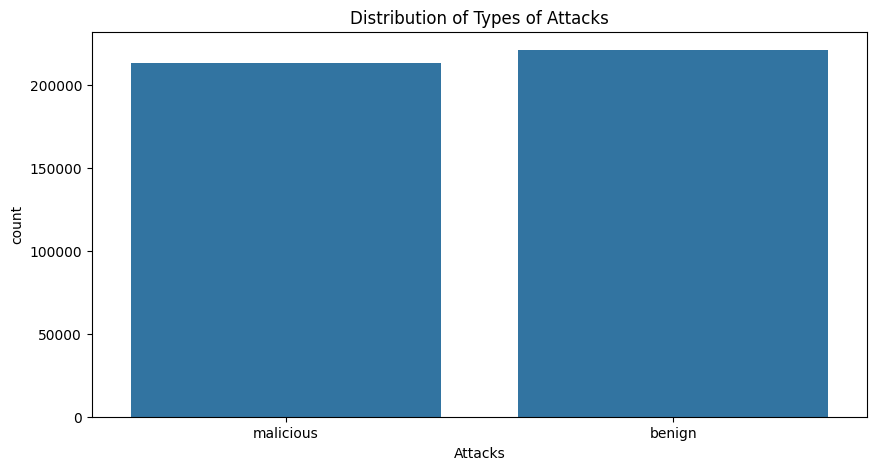

In [6]:
plt.figure(figsize= (10 , 5))
plt.title('Distribution of Types of Attacks')
sns.countplot(x = 'type', data = df)
# ax.bar_label(ax.containers[0])
plt.xlabel('Attacks')
plt.savefig("output/Distribution_of_Types_of_Attacks.png")

In [7]:
df_malicious = df[df['type'] == 'malicious']
df_benign = df[df['type'] == 'benign']

In [8]:
from urllib.parse import urlparse
import re

def abnormal_url(url):
    hostname = urlparse(url).hostname
    hostname = str(hostname)
    match = re.search(hostname, url)
    if match:      
        return 1
    else:
       
        return 0


df['abnormal_url'] = df['url'].apply(lambda i: abnormal_url(i))

In [9]:
df['abnormal_url'].value_counts()

abnormal_url
0    275177
1    158733
Name: count, dtype: int64

In [10]:
from googlesearch import search
def google_index(url):
    
    site = search(url, 5)
    return 1 if site else 0

df['google_index'] = df['url'].apply(lambda i: google_index(i))
print(df['url'][0])
for j in search(df['url'][0], num_results=10):
    print(j)

http://earth-sure.com/green-technology/subterranean-solar-subsolar/14-subsolar-renewable-energy
https://www.science.gov/topicpages/a/abundant+wind+energy
https://worldwidescience.org/topicpages/s/sun+earth+explorer.html
https://www.jstor.org/stable/44397356
https://www.science.gov/topicpages/a/abundant+carbon-neutral+renewable
https://sahris.sahra.org.za/sites/default/files/additionaldocs/Protea%20Final%20Scoping%20%28Submission%29_1.pdf
https://springerplus.springeropen.com/articles/10.1186/2193-1801-3-723
https://worldwidescience.org/topicpages/g/gallon+solar+storage.html
https://www.researchgate.net/topic/Earth/6
https://iopscience.iop.org/article/10.1088/0004-637X/743/2/190/pdf
https://sahris.sahra.org.za/sites/default/files/additionaldocs/Kgalalelo%20Final%20EIR%20-%20May%202021.pdf
https://www.academia.edu/38067548/Off_grid_Access_to_Electricity_Innovation_Challenge
https://batch.libretexts.org/print/Letter/Finished/geo-15158/Full.pdf


In [11]:
df['google_index'].value_counts()

google_index
1    433910
Name: count, dtype: int64

In [12]:
def count_dot(url):
    count_dot = url.count('.')
    return count_dot

df['count.'] = df['url'].apply(lambda i: count_dot(i))
df['count.'].value_counts()

count.
2     150557
1     114700
3     108777
4      36349
5       8298
6       5450
7       3331
8       1345
10       980
9        955
11       853
12       676
13       440
14       326
15       224
20       129
16       118
17        99
19        82
18        61
0         60
22        22
24        22
21        16
23         9
25         9
36         5
26         4
27         3
35         3
42         3
31         1
37         1
34         1
28         1
Name: count, dtype: int64

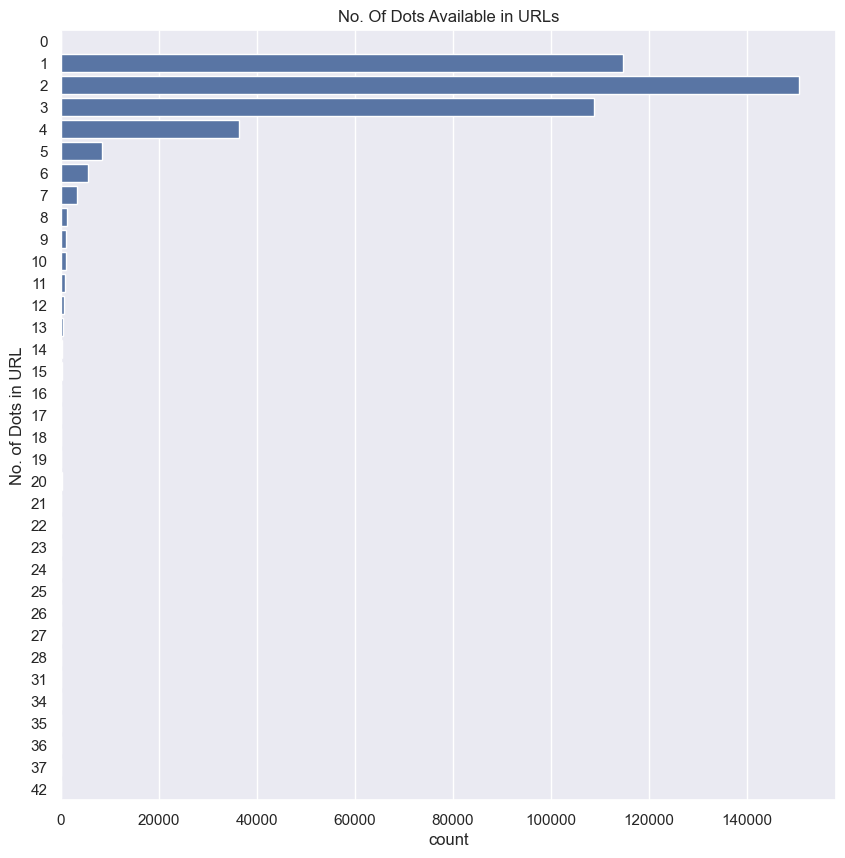

In [13]:
plt.figure(figsize = (10, 10))
sns.set(style="darkgrid")
ax = sns.countplot(y="count.", data=df)
plt.ylabel('No. of Dots in URL')
plt.title("No. Of Dots Available in URLs");

In [14]:
def count_www(url):
    url.count('www')
    return url.count('www')

df['count-www'] = df['url'].apply(lambda i: count_www(i))
df['count-www'].value_counts()

count-www
0    311835
1    120607
2      1404
3        58
4         6
Name: count, dtype: int64

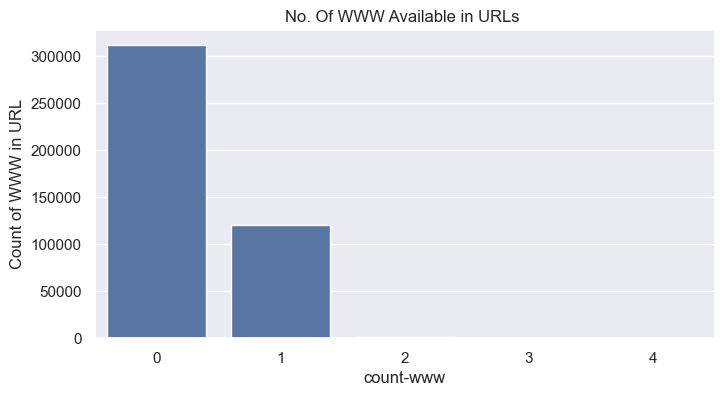

In [15]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="count-www", data=df)
plt.ylabel('Count of WWW in URL')
plt.title("No. Of WWW Available in URLs ");

In [16]:
def count_atrate(url):
     
    return url.count('@')

df['count@'] = df['url'].apply(lambda i: count_atrate(i))
df['count@'].value_counts()

count@
0     432772
1       1094
2         30
3          7
10         3
4          3
6          1
Name: count, dtype: int64

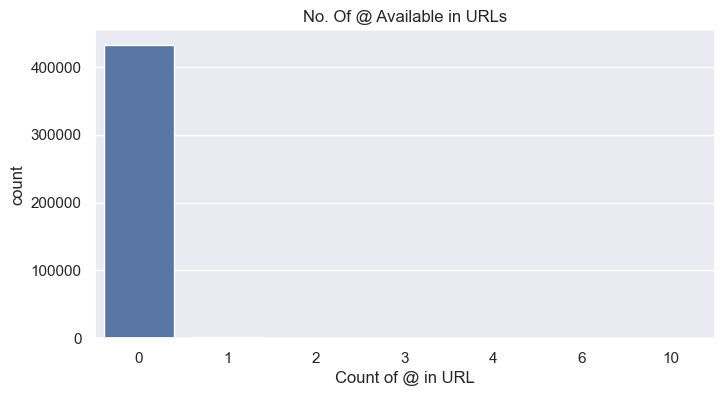

In [17]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="count@", data=df)
plt.xlabel('Count of @ in URL')
plt.title("No. Of @ Available in URLs");

In [18]:
def no_of_dir(url):
    urldir = urlparse(url).path
#     print(urldir)
    return urldir.count('/')

df['count_dir'] = df['url'].apply(lambda i: no_of_dir(i))
print(df['url'][5])
no_of_dir(df['url'][5])

imdb.com/name/nm0707720/bio


3

In [19]:
df['count_dir'].value_counts()

count_dir
1     140358
2     122609
3      75158
4      33305
0      23045
5      21897
6       9309
7       3918
8       1828
10       824
9        781
11       321
13       173
12       162
14        98
16        48
15        29
22        12
18         8
17         7
21         5
19         3
23         2
27         2
24         2
34         1
32         1
25         1
20         1
28         1
39         1
Name: count, dtype: int64

In [20]:
def no_of_embed(url):
    urldir = urlparse(url).path
    return urldir.count('//')

df['count_embed_domain'] = df['url'].apply(lambda i: no_of_embed(i))
def no_of_embed(url):
    urldir = urlparse(url).path
    
    print(urldir)
    return urldir.count('//')

print(df['url'][7])
no_of_embed(df['url'][7])

amazon.com/Dont-Move-Pen%C3%A9lope-Cruz/dp/B000FAOCC2
amazon.com/Dont-Move-Pen%C3%A9lope-Cruz/dp/B000FAOCC2


0

In [21]:
df['count_embed_domain'].value_counts()

count_embed_domain
0    432995
1       903
2        12
Name: count, dtype: int64

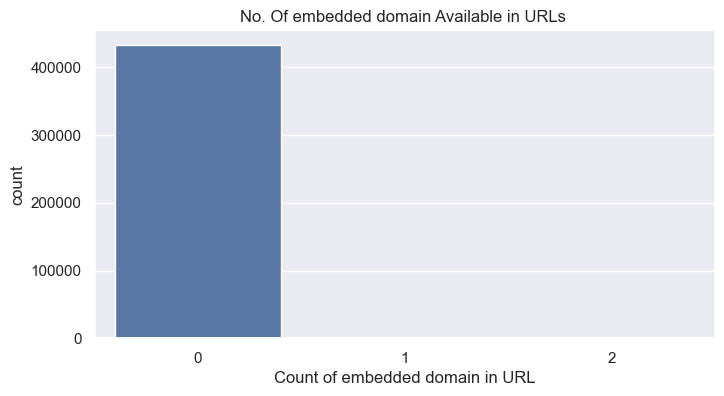

In [22]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="count_embed_domain", data=df)
plt.xlabel('Count of embedded domain in URL')
plt.title("No. Of embedded domain Available in URLs ");

In [23]:
def suspicious_words(url):
    match = re.search('PayPal|login|signin|bank|account|update|free|lucky|service|bonus|ebayisapi|webscr',
                      url)
    if match:
        return 1
    else:
        return 0
    
df['sus_url'] = df['url'].apply(lambda i: suspicious_words(i))
df['sus_url'].value_counts()

sus_url
0    395871
1     38039
Name: count, dtype: int64

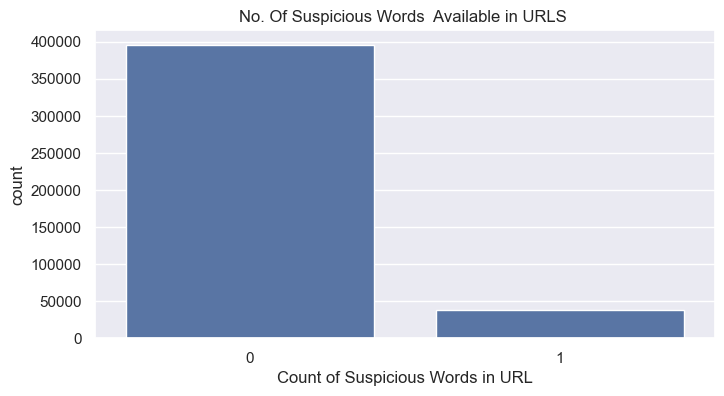

In [24]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="sus_url", data=df)
plt.xlabel('Count of Suspicious Words in URL')
plt.title("No. Of Suspicious Words  Available in URLS ");

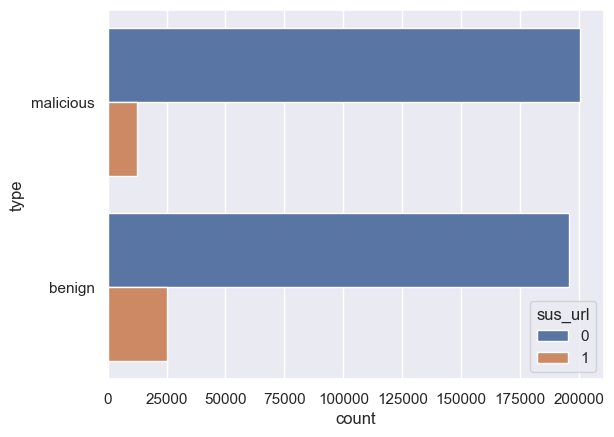

In [25]:
sns.set(style="darkgrid")
ax = sns.countplot(y="type", data=df,hue="sus_url")

In [26]:
def shortening_service(url):
    match = re.search('bit\.ly|goo\.gl|shorte\.st|go2l\.ink|x\.co|ow\.ly|t\.co|tinyurl|tr\.im|is\.gd|cli\.gs|'
                      'yfrog\.com|migre\.me|ff\.im|tiny\.cc|url4\.eu|twit\.ac|su\.pr|twurl\.nl|snipurl\.com|'
                      'short\.to|BudURL\.com|ping\.fm|post\.ly|Just\.as|bkite\.com|snipr\.com|fic\.kr|loopt\.us|'
                      'doiop\.com|short\.ie|kl\.am|wp\.me|rubyurl\.com|om\.ly|to\.ly|bit\.do|t\.co|lnkd\.in|'
                      'db\.tt|qr\.ae|adf\.ly|goo\.gl|bitly\.com|cur\.lv|tinyurl\.com|ow\.ly|bit\.ly|ity\.im|'
                      'q\.gs|is\.gd|po\.st|bc\.vc|twitthis\.com|u\.to|j\.mp|buzurl\.com|cutt\.us|u\.bb|yourls\.org|'
                      'x\.co|prettylinkpro\.com|scrnch\.me|filoops\.info|vzturl\.com|qr\.net|1url\.com|tweez\.me|v\.gd|'
                      'tr\.im|link\.zip\.net',
                      url)
    if match:
        return 1
    else:
        return 0
    
    
df['short_url'] = df['url'].apply(lambda i: shortening_service(i))
df['short_url'].value_counts()

short_url
0    408844
1     25066
Name: count, dtype: int64

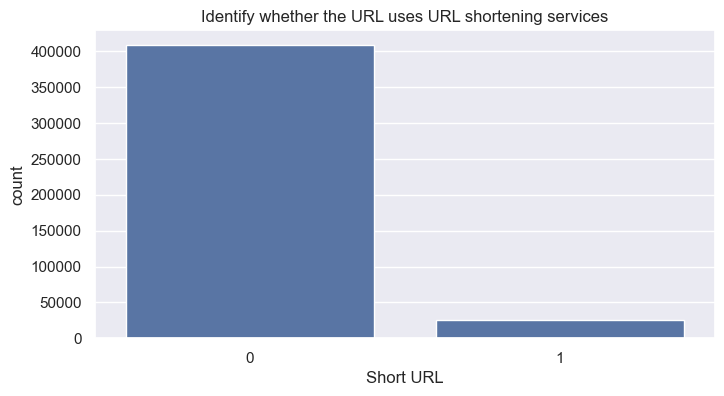

In [27]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="short_url", data=df)
plt.xlabel('Short URL')
plt.title("Identify whether the URL uses URL shortening services");

In [28]:
df[df['type'] == 'benign']['short_url'].value_counts()

short_url
0    205651
1     15261
Name: count, dtype: int64

In [29]:
df[df['type'] == 'malicious']['short_url'].value_counts()

short_url
0    203193
1      9805
Name: count, dtype: int64

In [30]:
def count_https(url):
    return url.count('https')

df['count_https'] = df['url'].apply(lambda i : count_https(i))
df['count_https'].value_counts()

count_https
0    418627
1     15083
2       166
3        26
5         6
4         2
Name: count, dtype: int64

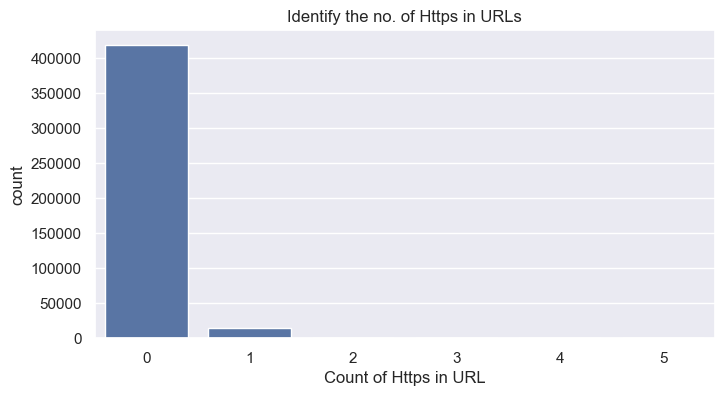

In [31]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="count_https", data=df)
plt.xlabel('Count of Https in URL')
plt.title("Identify the no. of Https in URLs");

In [32]:
df[df['type'] == 'benign']['count_https'].value_counts()

count_https
0    219613
1      1254
2        30
3        15
Name: count, dtype: int64

In [33]:
df[df['type'] == 'malicious']['count_https'].value_counts()

count_https
0    199014
1     13829
2       136
3        11
5         6
4         2
Name: count, dtype: int64

In [34]:
def count_http(url):
    return url.count('http')

df['count_http'] = df['url'].apply(lambda i : count_http(i))
df['count_http'].value_counts()

count_http
0    273524
1    158206
2      1746
3       417
4         8
9         6
6         2
5         1
Name: count, dtype: int64

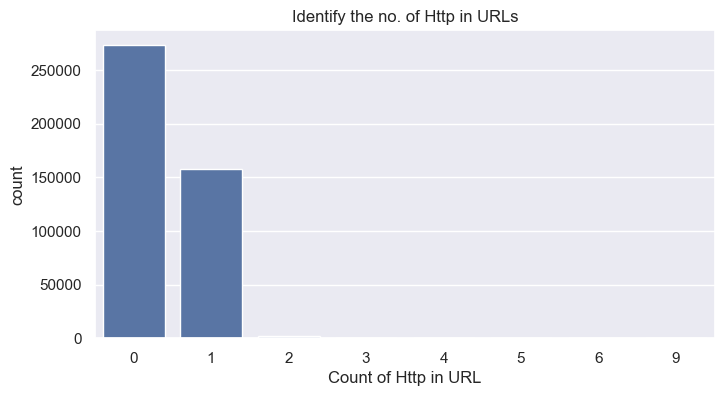

In [35]:
plt.figure(figsize = (8 , 4))
sns.set(style="darkgrid")
ax = sns.countplot(x="count_http", data=df)
plt.xlabel('Count of Http in URL')
plt.title("Identify the no. of Http in URLs");

In [36]:
df[df['type'] == 'benign']['count_http'].value_counts()

count_http
0    203103
1     17064
2       713
3        32
Name: count, dtype: int64

In [37]:
df[df['type'] == 'malicious']['count_http'].value_counts()

count_http
1    141142
0     70421
2      1033
3       385
4         8
9         6
6         2
5         1
Name: count, dtype: int64

In [38]:
def count_per(url):
    return url.count('%')

df['count%'] = df['url'].apply(lambda i : count_per(i))
df['count%'].value_counts()

count%
0      419659
1        3710
2        2790
3        1648
6        1377
        ...  
146         1
87          1
75          1
122         1
49          1
Name: count, Length: 115, dtype: int64

In [39]:
def count_ques(url):
    return url.count('?')

df['count?'] = df['url'].apply(lambda i: count_ques(i))
df['count?'].value_counts()

count?
0     328711
1     100164
2       4913
3         67
4         24
5         11
7          7
8          3
6          3
12         2
13         2
20         1
11         1
17         1
Name: count, dtype: int64

In [40]:
def count_hyphen(url):
    return url.count('-')

df['count-'] = df['url'].apply(lambda i: count_hyphen(i))
df['count-'].value_counts()

count-
0     253904
1      75993
2      30154
3      17449
4      13047
5       9711
6       7298
7       5481
8       4753
9       3725
10      3250
11      2466
12      1806
13      1443
14      1027
15       767
16       456
17       393
18       223
19       134
20        90
21        81
22        67
23        44
24        27
25        20
27        18
28        15
26        14
29        12
32         7
31         7
30         6
34         4
38         4
35         3
41         2
36         2
40         1
87         1
33         1
54         1
42         1
37         1
47         1
Name: count, dtype: int64

In [41]:
def count_equal(url):
    return url.count('=')

df['count='] = df['url'].apply(lambda i: count_equal(i))
df['count='].value_counts()

count=
0     328158
1      33232
4      19541
2      17894
3      12143
5      12084
6       5144
9       1987
7       1724
8       1136
10       317
11       184
13       113
12       108
14        65
19        33
16         9
22         7
15         6
18         6
17         6
24         4
34         3
26         1
28         1
29         1
39         1
21         1
51         1
Name: count, dtype: int64

In [42]:
def url_length(url):
    return len(str(url))

df['url_length'] = df['url'].apply(lambda i: url_length(i))
df['url_length'].value_counts()

url_length
31      10754
33      10503
34       8544
27       8498
35       7869
        ...  
586         1
2175        1
663         1
448         1
451         1
Name: count, Length: 534, dtype: int64

In [43]:
def hostname_length(url):
    return len(urlparse(url).netloc)

df['hostname_length'] = df['url'].apply(lambda i: hostname_length(i))
df['hostname_length'].value_counts()

hostname_length
0      275175
15      12296
20      11771
13      11741
14      10941
        ...  
210         1
125         1
184         1
129         1
179         1
Name: count, Length: 134, dtype: int64

In [44]:
from tld import get_tld
import os.path

#First Directory Length
def fd_length(url):
    urlpath= urlparse(url).path
    try:
        return len(urlpath.split('/')[1])
    except:
        return 0

df['fd_length'] = df['url'].apply(lambda i: fd_length(i))
df['fd_length'].value_counts()

fd_length
9      70539
0      51556
4      48032
6      34071
5      30037
       ...  
212        1
158        1
196        1
241        1
259        1
Name: count, Length: 211, dtype: int64

In [45]:
#Length of Top Level Domain
df['tld'] = df['url'].apply(lambda i: get_tld(i,fail_silently=True))


def tld_length(tld):
    try:
        return len(tld)
    except:
        return -1

df['tld_length'] = df['tld'].apply(lambda i: tld_length(i))
df['tld']

0          com
1         None
2          org
3         None
4          com
          ... 
433905    None
433906    None
433907    None
433908    None
433909    None
Name: tld, Length: 433910, dtype: object

In [46]:
df['tld'].value_counts()

tld
com                            56659
de                             11129
net                             7096
nl                              6117
com.br                          5361
                               ...  
mywire.org                         1
com.bt                             1
us-east-1.elb.amazonaws.com        1
uk.com                             1
ht                                 1
Name: count, Length: 547, dtype: int64

In [47]:
df['tld_length'].value_counts()

tld_length
-1     287263
 3      69126
 2      53758
 6      14698
 5       5792
 4       1788
 12       457
 14       282
 7        249
 9        130
 11       123
 16        71
 15        52
 8         50
 10        20
 13        12
 17         9
 26         8
 30         3
 27         3
 20         3
 22         2
 25         2
 21         2
 18         2
 31         2
 39         2
 34         1
Name: count, dtype: int64

In [48]:
df.drop(["tld"], axis = 1, inplace = True)

In [49]:
def digit_count(url):
    digits = 0
    for i in url:
        if i.isnumeric():
            digits += 1
    return digits


df['count_digits']= df['url'].apply(lambda i: digit_count(i))
df['count_digits'].value_counts()

count_digits
0      181590
4       29649
2       27580
1       26469
3       22827
        ...  
180         1
188         1
179         1
206         1
214         1
Name: count, Length: 216, dtype: int64

In [50]:
df['count_digits'].describe()

count    433910.000000
mean          5.816344
std          12.705661
min           0.000000
25%           0.000000
50%           2.000000
75%           6.000000
max        1204.000000
Name: count_digits, dtype: float64

In [51]:
def letter_count(url):
    letters = 0
    for i in url:
        if i.isalpha():
            letters += 1
    return letters


df['count_letters']= df['url'].apply(lambda i: letter_count(i))
df['count_letters'].value_counts()

count_letters
25     10316
26     10210
27      9584
28      9578
30      9480
       ...  
719        1
706        1
487        1
467        1
754        1
Name: count, Length: 420, dtype: int64

In [52]:
df['count_letters'].describe()

count    433910.000000
mean         47.277537
std          34.996517
min           0.000000
25%          25.000000
50%          38.000000
75%          61.000000
max        2141.000000
Name: count_letters, dtype: float64

In [53]:
df.head()

,url,type,abnormal_url,google_index,count.,count-www,count@,count_dir,count_embed_domain,sus_url,...,count%,count?,count-,count=,url_length,hostname_length,fd_length,tld_length,count_digits,count_letters
0,http://earth-sure.com/green-technology/subterr...,malicious,1,1,1,0,0,3,0,0,...,0,0,7,0,95,14,16,3,2,79
1,paypal.com.uk.cgi.bin.webscr.cmd.login.run.dis...,malicious,0,1,14,0,0,5,0,1,...,0,1,0,2,219,0,6,-1,60,134
2,http://flowerstobulgaria.org/index.php/bg/home,malicious,1,1,2,0,0,3,0,0,...,0,0,0,0,46,21,9,3,0,38
3,boomerater.com/senior-living/senior-housing-in...,benign,0,1,1,0,0,2,0,0,...,0,0,5,0,70,0,13,-1,0,61
4,https://www.facebook.com/,benign,1,1,2,1,0,1,0,0,...,0,0,0,0,25,16,0,3,0,19


In [54]:
df.to_csv("preprocessed_data.csv")

In [57]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df['type_code'] = label_encoder.fit_transform(df['type'])
df['type_code'].value_counts()

type_code
0    220912
1    212999
Name: count, dtype: int64

In [58]:
df.columns

Index(['url', 'type', 'abnormal_url', 'google_index', 'count.', 'count-www',
       'count@', 'count_dir', 'count_embed_domain', 'sus_url', 'short_url',
       'count_https', 'count_http', 'count%', 'count?', 'count-', 'count=',
       'url_length', 'hostname_length', 'fd_length', 'tld_length',
       'count_digits', 'count_letters', 'type_code'],
      dtype='object')

In [59]:
X = df[['abnormal_url', 'count.', 'count-www', 'count@',
       'count_dir', 'count_embed_domain', 'short_url', 'count%', 'count?', 'count-', 'count=', 'url_length', 'count_https',
       'count_http', 'hostname_length', 'sus_url', 'fd_length', 'tld_length', 'count_digits',
       'count_letters']]
Y = df['type_code']
X.shape
(651191, 21)
Y.shape

(433911,)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

# Assuming your main function for feature extraction is defined somewhere in your script
def main(url):
    # Replace the feature extraction logic with your actual code
    status = []
    status.append(abnormal_url(url))
    status.append(count_dot(url))
    status.append(count_www(url))
    status.append(count_atrate(url))
    status.append(no_of_dir(url))
    status.append(no_of_embed(url))
    status.append(shortening_service(url))
    status.append(count_https(url))
    status.append(count_http(url))
    status.append(count_per(url))
    status.append(count_ques(url))
    status.append(count_hyphen(url))
    status.append(count_equal(url))
    status.append(url_length(url))
    status.append(hostname_length(url))
    status.append(suspicious_words(url))
    status.append(digit_count(url))
    status.append(letter_count(url))
    status.append(fd_length(url))
    tld = get_tld(url, fail_silently=True)
    status.append(tld_length(tld))
    
    return status

df['features'] = df['url'].apply(main)

# Separate features and labels
X = np.vstack(df['features'].to_numpy())
Y = df['type']

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, shuffle=True, random_state=42)

from sklearn.model_selection import GridSearchCV

# Create Random Forest classifier
rf = RandomForestClassifier()

# Create GridSearchCV instance
grid_search_rf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search_rf.fit(X_train, Y_train)

# Get the best parameters
best_params_rf = grid_search_rf.best_params_
print(f'Best Hyperparameters for Random Forest: {best_params_rf}')


# Create a StandardScaler instance
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the Random Forest classifier
clf.fit(X_train_scaled, Y_train)


br.cloud.com.br
/green-technology/subterranean-solar-subsolar/14-subsolar-renewable-energy
/index.php/bg/home
boomerater.com/senior-living/senior-housing-in-Maple-Valley_Washington
/
imdb.com/name/nm0707720/bio
/autovetture/astra-gtc.html
amazon.com/Dont-Move-Pen%C3%A9lope-Cruz/dp/B000FAOCC2
youmix.co.uk/album/99951
games.teamxbox.com/xbox-360/1737/Condemned-2-Bloodshot/
educationindex.com/usa/missouri/kansas-city/kansas-city-university-of-medicine-and-biosciences-90388/
surreycompany.com/
absoluteastronomy.com/topics/James_Tate_(writer)
xbox360.gamespy.com/xbox-360/condemned-2-bloodshot/
www.1up.com/do/gameOverview
myusagem.org/members/12/
ugo.com/the-goods/star-wars-comics
realestate.yahoo.com/search/North_Dakota/Argusville/homes-for-sale
xbox360.ign.com/objects/903/903765.html
cart.blakebrody.com/shoes/ali/
myspace.com/kalilwilson
/the-gioi-mang/the-gioi-cuoi/het-hon-vi-nu-sinh-cap-1-xinh-xan-mang-thai-va-dau-de-188253.html
www.jappsen-ingenieure.com/index.asp
www.potifos.com/elevat

/magazine/sport/formel-1/formel-1-test-barcelona-mercedes-mittag-souveraen-30633944
pbs.org/crucible/frames/_film.html
kennethgdavenport.com/2008/10/reflexive-liberalism-of-american-jews.html
hotelfourseasonsjm.com/
en.wikipedia.org/wiki/Chinatown
/divulgacao/noticias/2014-1/setembro/setor-de-etanol-sera-incluido-no-reintegra-confirma-mantega
ckuik.com/Mariette_Croteau
eargasmtransmission.com/
mp3skull.com/mp3/rescue.html
vampire-diaries.net/tag/bonnie-bennett
manta.com/c/mtcsbkd/jeffrey-h-arnold-esq
manta.com/ic/mt6kqf7/ca/west-coast-solutions-inc
en.wikipedia.org/wiki/Yolande_James
247sports.com/Player/Keith-Byars-II-8543
homes.point2.com/CA/Quebec/Montreal/Pointe-Saint-Charles-Real-Estate.aspx
wiki.answers.com/Q/FAQ/4493-4
en.wikipedia.org/wiki/Robert_Choquette
olderamericansmonth.com/
docstoc.com/docs/6551000/Politician-Letter-Writing-Guide
jointmathematicsmeetings.org/meetings/national/jmm2012/2138_progfull.html
worthpoint.com/worthopedia/the-beatles-heswall-jazz-barnston-concert-

sofadealers.com/Item.aspx
limaastro.com/
en.wikipedia.org/wiki/KCTY
select.nytimes.com/gst/abstract.html
kusports.com/schedules/football/2010/kansas/
canada411.ca/Quebec/St-nicolas/Charest-to-Gagne/Chouinard/1/
bbc.co.uk/northyorkshire/content/webcams/scarborough_webcam.shtml
factmonster.com/ipka/A0883284.html
gothereguide.com/alexandra+interprovincial+bridge+ottawa-place/
newalbumreleases.net/39745/machine-head-unto-the-locust-2011/
kclibrary.lonestar.edu/19thcentury1870.htm
hotsexyscenes.com/
acronyms.thefreedictionary.com/People's+Republic+of+China
eroticlinks4u.com/p/adult-pics.html
myspace.com/slydehyde
/viu/familia/confia-tu-instinto-posturas-dar-lactar-noticia-1810621
/2015/05/11/four-self-driving-cars-have-gotten-into-accidents/
123people.co.uk/s/katie+birks
forums.internationalhockey.net/showthread.php
/2990151/Us-general-services-administration-gsa-mentor-protege-program-subpart-51970/Excluded-parties-list-system
cartoons.wikia.com/wiki/DisneyToon_Studios
us-environ.info/cons

/shop/adonisgreen/
nationaljobs.washingtonpost.com/a/all-jobs/list/q-Kansas+City+University+of+Medicine+%26+Biosciences
americanhistory.si.edu/
coolspotters.com/actresses/zendaya
24.wikia.com/wiki/David_Emerson
indiepixfilms.com/film/692
/forumdisplay.php
fullcirclebikes.com/accepted-for-value-winston-shrout
en.wikipedia.org/wiki/James_Brown_Clay
publicschoolreview.com/school_ov/school_id/15135
linkedin.com/in/carlpressman
/angela-phuong-trinh-noi-gi-ve-vong-hoa-vieng-duy-nhan-gay-kho-xu.html
/post/related/id/5547bfcd4a0c4b9a6b941a80/skip/20/limit/10/back/0
colleges.stateuniversity.com/universities/AR/Arkansas_Tech_University.html
vergil.chemistry.gatech.edu/notes/quantrev/quantrev.html
salmankfc.com/
wiki.answers.com/Q/Did_Crispus_Attucks_go_to_school
/post/related/id/54dbb0144a0c4b2f7316ca82/skip/30/limit/10/back/0
glquebec.org/masonic_hall.shtml
/news/story/7332/900287-%E3%80%8C%E6%88%91%E7%B5%90%E5%A9%9A%E5%89%8D%E6%9C%AA%E5%A9%9A%E3%80%8D%E5%8F%88%E4%B8%80%E5%A5%87%E8%91%A9%E8%AD%

globalsecurity.org/military/facility/detroit.htm
newhavenleader.com/
realdealfurniture.com/
prnewswire.com/news-releases/sun-life-financial-releases-public-accountability-statement-121628068.html
southalabama.edu/archives/html/guide/markers/marker2.htm
free-guitar-lesson.org/
tennessee.gov/commerce/index.shtml
mp3raid.com/music/one_love.html
fictionwriting.about.com/od/glossary/g/static.htm
hellodears.com/
usabasketball.com/seniormen/archive/3additions_02mwc_roster.html
bbc.co.uk/films/2001/10/29/strictly_sinatra_2001_review.shtml
aljardine.com/
bizrate.com/halex-tournament-basketball-game/
/gid/103582791430075519/announcements/detail/1766803739171250041
fanbase.com/Vancouver-Whitecaps-FC
download.cnet.com/Surf-Canyon-Search-Engine-Assistant-for-IE/3000-12512_4-10810597.html
scarboroughgenealogy.com/Ross.htm
sportslistoftheday.com/2011/09/25/major-league-baseball-best-hitters-in-playoff-history-and-postseason-offensive-records/
progarchives.com/album.asp
polymathpark.com/
thatchannel.c

duckduckgo.com/1/c/American_stand-up_comedians
adirondack.net/events/
rfcexpress.com/lawsuits/patent-lawsuits/texas-eastern-district-court/50310/paltalk-holdings-inc-v-sony-computer-entertainment-america-inc/summary/
actressarchives.com/celebrities/mira-sorvino
/torrent/4189529/Alaska+For+Dummies+-+4th+Edition+%282009%29+%26+5th+Edition+%282011%29+%28Pdf%29+Gooner.html
/magazine/sport/fussball/bundesliga/pep-guardiolas-beste-spiele-fc-bayern-muenchen-30592340
fanboysoftheuniverse.com/index.php/site/comments/podcast_the_truly_outrageous_samantha_newark
blingcheese.com/wallpaper/1/francois+arnaud+wallpaper.htm
gaiaherbs.com/products/ingredient/427/Holy-Basil
mylife.com/jackbelleque
spokeo.com/James+Ford
yelp.com/biz/christ-church-cathedral-houston
192.com/atoz/people/burden/sarah/
netglimse.com/celebs/pages/larry_bryggman/index.shtml
thenationonlineng.net/web2/articles/33401/1/AfDB-insurance-firm-sign-1m-pact/Page1.html
urbanspoon.com/r/237/1116403/restaurant/New-York-State/Union-Block-I

disneymovieslist.com/disney-channel-movies.asp
ibconline.edu/ibc/news/2010/20101201_tiffany.jsp
thebigredguide.com/search-fire-supplies/helmets/make.mk-221-ga.html
answers.com/topic/thomas-mott-osborne
montreal.streetviewtours.com/montreal-attractions/contemporary-art-museum
citizendia.org/Harrison_Ford
/the-searchers-guide-to-black-friday-cyber-monday-holiday-shopping-178489
youtube.com/watch
punch-software.software.informer.com/
lufisto.com/
linkedin.com/in/matthewdoctor
citizendia.org/List_of_association_football_rivalries
/shop/g/electronics/mobile-accessories/mobiles-accessories-store/price-never-before
/Thread-%E2%9C%AA%E2%9C%AA%E2%9C%AA-Earn-70-day-After-10-Days-Solo-Ads-Business-Guarantee-Results-Only-10-Seats-AVAILABLE
baseballhall.org/hof/rogan-bullet
joepokuband.com/
spokeo.com/George+Mader
en.wikipedia.org/wiki/Paul_Bloom_(psychologist)
thefreelibrary.com/Logibec+Announces+All-Cash+Offer+for+All+Outstanding+Common+Shares+of...-a0131980267
tvguide.com/celebrities/tj-storm/17

thefootyblog.net/2011/01/24/my-team-i-ajax-cape-town/
fight-forum.com/
flatbreadcompany.com/
youtube.com/watch
museumstuff.com/learn/topics/Quebec_Highway_20::sub::Rest_Stops
amazon.com/Mac-Lethal/e/B00197I26W
goldenagecartoons.com/forums/showthread.php
census-online.us/view/ABELL/
files.nyu.edu/cch223/public/usa/albums/splits_detonatorsecono.html
newswire.ca/en/story/627249/bell-fibe-tv-launches-in-toronto-and-montreal
amazon.com/s
mmafighting.com/staff/ariel-helwani/
uk.answers.yahoo.com/question/index
youtube.com/watch
people.famouswhy.com/lisa_robin_kelly/
sixdegreesrecords.com/artists.php
freebase.com/view/en/rene_angelil
/apps/2015/05/05/freelance-marketplace-elance-odesk-rebrands-as-upwork-launches-unified-site-for-finding-your-next-gig/gtm.js
m.jacksonville.com/sports/football/sharks/2011-08-12/story/sharks-win-arenabowl-final-play
archives.mainegenealogy.net/2006/06/belfast-deaths-1896-1900.html
kansascity.sbnation.com/kansas-city-royals/2011/5/20/2181896/st-louis-cardinals-ka

kboing.com.br/musica-e-letra/the-gadjits/1008732-backup/
historyorb.com/birthdays/october/18
2011.universalsports.com/photos/galleryid=542444.html
amazon.com/Cavemans-Valentine-Samuel-L-Jackson/dp/B00005JCA8
music.yahoo.com/paul-piche/albums/
abebooks.com/book-search/author/mavis-gallant/first-edition/pics/sortby/1/
fantasysharks.com/apps/Projections/WeeklyQBProjections.php
lnf.uoregon.edu/
rigwa.com/
myspace.com/geobru
mylife.com/c-2707375215
rabbitears.info/market.php
wn.com/Distinguished_Service_Medal_(United_Kingdom)
censusindia.net/
spoke.com/info/p6jD3Fw/RickTolson
wn.com/Canadian_football
names.whitepages.com/james/chouinard
short-biographies.com/Boxer.php
museumca.org/satelite/shoes.html
thestreamcenter.com/search.asp
babescollection.com/nude_female_celebrities/anke_engelke/anke_engelke.php
tngenweb.org/records/davidson/obits/nca/nca94-2.htm
fredcamper.com/Film/BrakhageL.html
heartandcoeur.com/page_heart_canal_atrioventriculaire.php
mylife.com/c-2465212578
comfibook.com/n/Ben+Z

mediafire.com/
veterans.cityofnorthbay.ca/drilldown_war.asp
rossrobinson.net/
freepick1.com/free-college-football-picks/kent-state-golden-flashes-vs-kansas-state-wildcats-football-college-predictions/
freebase.com/view/en/oyle_bir_kadin_ki
graduates.com/ls.aspx
unac.org/en/link_learn/canada/cdn_difference/diplomats.asp
wiki.answers.com/Q/What_were_Marc_Lepine's_motives_for_the_Polytechnique_Massacre
en.wikipedia.org/wiki/Lionel_Lewis
icehockey.wikia.com/wiki/Robin_Bawa
vinylsearcher.com/artists/ben-webster.aspx
summitprintmail.com/
news1130.com/news/national/article/211185--a-sketch-of-bloc-quebecois-leader-gilles-duceppe
drmatthewashton.com/2011/03/11/great-mistakes-in-politics-no16-michael-howards-interview-with-jeremy-paxman/
facebook.com/people/Sophie-Corrigan/1248191608
peeepl.com/people/adam-rall/
southcarolina.statelawyers.com/
archiver.rootsweb.ancestry.com/th/read/QBC-MONTREAL/2007-03/1174692361
imdb.com/name/nm3918035/bio
linkedin.com/in/bergmanmark
actionext.com/names_j/just

espn.go.com/page2/s/list/chokes/hockey.html
en.wikipedia.org/wiki/Dublin
toddbabiak.com/
broadcasting-history.ca/index3.html
poemhunter.com/poem/revenge-2/
stopwatchcentral.com/
imdb.com/title/tt1860389/
zoominfo.com/people/Steele_Claude_4621852.aspx
blockbuster.com/browse/catalog/personDetails/32875
hub.webring.org/hub/navships
usa.indettaglio.it/eng/45/077/1221033.html
/displaycorner/FreeMarket.do
calfac.org/
quora.com/Joseph-Cohen
linkedin.com/pub/lee-stevens/17/A85/AA3
mapleleafshotstove.com/
roadfood.com/Forums/fb.ashx
en.wikipedia.org/wiki/Filomena_Rotiroti
abidjan.usembassy.gov/
scribd.com/doc/16533121/Number-and-Space-Parietal-Cortex-Hubbard-Piazza-Pinel-Dehaene-on-Tommasi-2008
zip-codes.com/zip-code-database.asp
city-data.com/school/Lowell-Michigan.html
youtube.com/watch
tv.yahoo.com/the-simpsons/show/211/castcrew
majors.osu.edu/
manta.com/ic/mt6yxgt/ca/promotions-donald-audet-inc
midcontinent.org/rollingstock/builders/magor.htm
interceder.net/topic/fort-saskatchewan
myphdnetw

commonsensewonder.blogspot.com/2011/05/israel-obama-american-jews.html
/radio/The-Goat-989-s11917/15480783/ca-pub-1542925551861702/Station
exim.gov/products/special/africa/updatearchives/dec2006.cfm
rivals.yahoo.com/ncaa/football/recruiting/player-Renaldo-Sagesse-57905
tripadvisor.ca/Hotel_Review-g155032-d1225564-Reviews-Holiday_Inn_Express_Hotel_Suites_Montreal_Airport-Montreal_Quebec.html
/torrent/BCE6B03EDD9E425804F9AA9490806175AA7B2D3E.torrent
local.yahoo.com/info-15529407-american-electric-power-company-conesville
ico.gov.uk/
/item/hide-my-wp-no-one-can-know-you-use-wordpress/full_screen_preview/4177158
myspace.com/tatv/music
linkedin.com/pub/robert-harmon/14/B00/6B8
melatoninfaq.com/
wurst.fr/
en.wikipedia.org/wiki/Wilder_Penfield
articles.latimes.com/2010/aug/08/entertainment/la-ca-indie-focus-20100808
en.wikipedia.org/wiki/VP_Records
rockymountainspirit.blogspot.com/2009/05/2009-2010-denver-broncos-cheerleaders.html
/xa-hoi/chi-sai-51583-ti-ts-tran-du-lich-tien-thue-dan-khong-t

faithcenteredresources.com/authors/jesse-cathy-duplantis.asp
shutterstock.com/pic-47990071/stock-photo-moscow-january-olympic-bicycle-arena-sergey-minin-runs-the-race-grainy-shot-little-motion.html
ticketsinventory.com/concert/lily-tomlin-tickets/
en.wikipedia.org/wiki/Missouri_State_Highway_13
perfectpeople.net/biography/7909/michael-massee.htm
thefederalistpapers.org/founders/jefferson/thomas-jefferson-on-the-size-of-government
joshzuckerman.com/band.html
reuters.com/finance/stocks/TRZb.TO/key-developments
facebook.com/people/Ankush-Gupta/100001212212300
filecrop.com/Sherlock-Holmes-and-the-Mystery-of-Osborne-House-nds.html
/cdsb/board.php
wn.com/Port-Cartier%2C_Quebec
cafc.uscourts.gov/judges/randall-r-rader-chief-judge.html
strandedinstereo.blogspot.com/2008_06_01_archive.html
indeed.com/cmp/National-Bank-of-Canada
myspace.com/dougsavant
kansas.rivals.com/default.asp
vh1.com/artists/az/en_vogue/artist.jhtml
mnnews.com/newspapers/cook.html
quotes.lucywho.com/george-gabby-hayes-quote

dictionary.sensagent.com/središce+ob+dravi/en-en/
imdb.com/search/title
freebase.com/view/en/1989_ncaa_mens_division_i_basketball_tournament
supernova.com/inire
simple.wikipedia.org/wiki/DisneyToon_Studios
parentscountdowntocollegecoach.com/
bw.edu/athletics/fb/ros/darbut/
cellcorner.com/xshp/unlock-phone-codes/unlock-telus-blackberry-tour-9630-mobile-phone-by-unlocking-code.html
crowncares.com/
names.whitepages.com/john/belisle
eliteprospects.com/player.php
facebook.com/hans.dudek
bombshells.com/grable/
thebulls.co.za/article.aspx
/politica/ultimas-noticias/2015/03/15/protestos-contra-governo-reunem-centenas-de-milhares-de-pessoas-em-16-estados-e-df.htm
twitter.com/PepLava
/video/the-best-jungle-jack-hanna-moments-from-his-30-years-with-david-letterman
/Personal-Banking/offers/offer-detail.page
rottentomatoes.com/celebrity/robin_williams/
home.disney.com.au/tv/
linkedin.com/directory/people/cullom.html
ohiodinner.com/alliance/
greatwesternautomart.com/
theatrebooks.com/film/documentar

maplevalleypony.countmein.com/
ebay.com/sch/Sports-Mem-Cards-Fan-Shop-/64482/i.html
flixster.com/actor/mark-curry
mylife.com/high-schools/members/l2-16308/
en.wikipedia.org/wiki/Gordon_W._Lloyd
issuu.com/ballymena/docs/impact_north_east_events
/torrent/1145336/French-Montana-Bad-B-tch-feat-Jeremih-Rick-Ross-Fabolous-Remix-2015-Single/
bessel.org/cwgfunio.htm
ftc.gov/opa/2009/01/westpenn.shtm
/videos/226715/incredible-homemade-steamy-sex-video-compilation-with-juicy-girls/
youtube.com/watch
agatethemoose.com/
nona.net/features/map/placedetail.2312207/Toms%20River/
avalanche.nhl.com/index.html
blogto.com/filmmakers/ruba_nadda/
stanthonyofpadua-buffalo.org/
mo.gov/my-government/learn-about-missouris-government/counties/
yelp.com/biz/coldwell-banker-northern-california-oakland-2
starjewish.com/categories.html
maliwatch.org/
alphachapter1911.com/
spinner.com/2008/05/29/rogue-wave-offer-festival-tips-reveal-band-crush-at-sasquatch/
tngennet.org/maury/queries/q199802.htm
holysmokesmma.blogspo

pagelink.com/list/US/NC/Cary/localinks
kesslerlofts.com/
/sapa-chiem-giu-khach-san-hang-chuc-khach-nuoc-ngoai-bi-duoi.html
revolvermag.com/reviews/review-warbringer-worlds-torn-asunder.html
busymums.org.uk/
artnet.com/gallery/425931349/galerie-jacques-lacoste.html
stores.ebay.com/SPORTSGARAGE8/KANSAS-CITY-ROYALS-/_i.html
myspace.com/ryan_larkin
jurist.law.pitt.edu/ratner1.htm
/index.php
youtube.com/watch
hollybaby.com/2011/04/21/ethan-hawke-expecting-baby-ryan-shawhughes/
esa.doc.gov/Blog/2011/05/06/april-jobs-report-impact-education-and-age-manufacturing-employment
ridemetro.org/SchedulesMaps/ParkRide/Missouri.aspx
hockeyfights.com/fights/105419
ca.sports.yahoo.com/nba/players/4534
pipl.com/directory/people/Gradimir/Pankov
/downloads_details/529/%D8%A7%D8%BA%D9%86%D9%8A%D8%A9-%D8%B4%D8%B9%D8%A8%D8%A7%D9%86-%D8%B9%D8%A8%D8%AF-%D8%A7%D9%84%D8%B1%D8%AD%D9%8A%D9%85---%D8%A7%D8%B4%D8%B1%D8%A8-%D9%8A%D8%A7-%D8%A7%D8%B1%D8%AF%D9%88%D8%BA%D8%A7%D9%86
goliath.ecnext.com/coms2/product-compint-0

myspace.com/robertkurtzman
us.countrysearch.tradekey.com/camu-camu.htm
twitter.com/xavierdolan/status/52849578088742912
facebook.com/alex.barnston
conradaskland.com/blog/2008/03/lotte-furama-montreal-chinatown-restaurant/
webinfo.parl.gc.ca/MembersOfParliament/ProfileMP.aspx
metrolyrics.com/king-only-lyrics-the-twilight-singers.html
travel.aol.com/travel-guide/canada/canada/montreal/parc-jean-drapeau-thingstodo-detail-30099/
youtube.com/watch
greatseats.com/artist/eddie_griffin/
goldcoast.com.au/article/2011/11/02/362521_gold-coast-business.html
nhl.com/scores/htmlreports/20072008/RO020275.HTM
hector-famososdelmundo.blogspot.com/
/forum.php
atsicoupons.com/
createspace.com/275191
absoluteastronomy.com/topics/Olympic_medalists_in_rowing_(women)
sustainability.owu.edu/
nymag.com/daily/entertainment/2010/08/alex_kurtzman_steven_spielberg.html
blakelawrence.com/KKSF%20eulogy.htm
/movies/4576665/pull_out_your_dick_so_i_can_play_with_it_joi.html
timetableimages.com/ttimages/africa.htm
en.wik

/Content/AP-In-The-News/2015/Afghan-court-sentences-AP-journalists-killer-to-20-years
/home
lakegastonsales.net/
eliteprospects.com/player.php
mondotimes.com/1/world/us/35/1945/4922
sherlockholmes-thegame.com/en/
strikers.com/
think-poland.com/
ingoalmag.com/masks/goal-mask-artist-stephane-bergeron/
tunein.com/radio/LMFAO-m436176/
en.wikipedia.org/wiki/Justin_McRoberts
gailedwards.com/buckets/
ezinearticles.com/
cinema.ucla.edu/collections/walter-lantz
angelfire.com/wa2/hwysofwastate/sr161.html
prleap.com/pr/5549/
ultimate-guitar.com/reviews/compact_discs/stolen_babies/there_be_squabbles_ahead/index.html
wordiq.com/definition/Samuel_Bronfman
vaudreuil.rentershotline.ca/
limaohiorestaurants.com/
brugestravelguide.com/
momsview.com/eddiebauer.shtml
acg2.fullcoll.edu/artcollection/htmlPAGES/ArtistIndexHTML/oliveiraBIO.htm
autoenclosures.com/
2008.nbcolympics.com/beachvolleyball/athletes/index.html
newsbadge.com/story.php
oocities.org/wiseguywally/PaoloVioli.html
uslsoccer.com/teams/2010%2

hockeysfuture.com/articles/12612/edmonton_oilers_ahl_affiliate_boasts_numerous_nhl_ready_prospects/
wikitree.com/genealogy/MURDOCK
/torrent/2883BFFC0C86D3706F45AEE118A53D3B4ABB48F6.torrent
en.wikipedia.org/wiki/Category:Automotive_engineering
twitter.com/GeorgesLaraque
canadatrip.co.uk/canadian-affair-2010/
powells.com/biblio
streamingfaith.com/directory/broadcaster.aspx
english.turkcebilgi.com/U.S.+Route+37
youtube.com/watch
mediafire.com/
/i2/electronice-si-electrocasnice/tv-audio-video/sisteme-audio/js/spring.js
imdb.com/name/nm3218978/
homestars.com/companies/199488-canadian-choice-windows-doors
facebook.com/pages/Norman-Mailer/112538558757491
kin-miyako.com/
en.wikipedia.org/wiki/Fred_Rose
tnr.com/article/politics/hacking-the-regime
mylife.com/stormlantz
learningnetwork.cisco.com/thread/36016
celebtna.com/Flora_Martinez/Flora_Martinez.htm
lcwileyhomes.com/la-sabana-bella.htm
fam.eastmill.com/f1111.htm
/internacional/operacoes-cambio-especie/agencias/Paginas/default.aspx
kcroyalshi

hollywoodreporter.com/news/van-halen-sign-columbia-records-237356
epinions.com/content_4296122500
encyclopedia.farlex.com/Social+welfare+(disambiguation)
bestfrenchfilms.com/01_jean.php
trueknowledge.com/q/is_bob_blumer_jewish
zapom.com/michael+richards+racist+rant
boxingscene.com/forums/showthread.php
mixcloud.com/championdj/
muckety.com/Jeffrey-S-Skoll/1880.muckety
scubaboard.com/forums/olympus-outlet/376971-oly-520-w-dual-strobe-inon-s-ttl-2.html
claudedavoine.com/
finance.yahoo.com/q
nyhystericalsociety.com/hire-comedians.htm
answers.com/topic/henri-bourassa
travelmath.com/cities-near/AOH
espn.go.com/blog/dallas/stars/category/_/name/goalie
/tag/%D0%A2%D1%83%D0%BF%D1%8B%D0%B5%20%D0%B3%D1%83%D0%B3%D0%BB%20%D0%B7%D0%B0%D0%BF%D1%80%D0%BE%D1%81%D1%8B/hot
bayareairis.org/mitchell.html
pitch.com/kansascity/starlight-theatre/Location
salineagriculture.com/
halleck.arrakis.se/
robertjoylaw.com/
/373538/the-rise-and-fall-of-us-labor-unions-and-why-they-still-matter/
census-online.us/view/BE

virtualtourist.com/travel/Europe/Slovenia/Mestna_Obcina_Ljubljana/Ljubljana-688015/Nightlife-Ljubljana-Club_Central-BR-1.html
mqup.mcgill.ca/book.php
archiver.rootsweb.ancestry.com/th/read/DAMRON/2004-02/1077026642
new.music.yahoo.com/jean-pierre-ferland/albums/jaune--209429388
fashion-writings.com/because-deletion-being-undeleted/
facebook.com/pages/Mutual-Musicians-Foundation/186170715834
homepages.rootsweb.ancestry.com/~hodges/queries.htm
wiki.answers.com/Q/Why_was_wes_scantlin_banned_from_graceland
cooperativefuneraire.ca/obituaries/obitList.asp
/osobowe/renault/laguna/ii-fl-2005-2007/
famoushookups.com/site/relationship_detail.php
royalshockey.com/news/News.asp
northjersey.com/news/118876924_State_officials_say_no_new_funds_for_urban_enterprise_zones.html
ipmootcanada.ca/
hautehome.wordpress.com/page/2/
referenceforbusiness.com/history/Ca-Ch/Canadian-National-Railway-Company.html
bleedingcool.com/2010/10/22/bernard-chang-sneaks-in-rise-of-arsenal-3-gag-into-supergirl/
fanbase.com/

cdbaby.com/cd/pointvalidca
nyfa.edu/acting-school/acting-for-film/12evening.php
gogetyourcoupon.blogspot.com/
alumniclass.com/longbranch
cogeco.ca/cable/corporate/cgo/contact.html
/archives/category/%e7%b4%a0%e4%ba%ba%e7%9b%97%e6%92%ae/%e3%82%b2%e3%82%b9%e3%81%ae%e6%a5%b5%e3%81%bf%e6%98%a0%e5%83%8f
obitoftheday.com/post/6978033388/shirleyfongtorres
/search.html
movieweb.com/movie/moonrise-kingdom
imdb.com/title/tt0437230/
ehow.com/how_6580453_treat-coronary-hoof-abscess.html
ca.linkedin.com/pub/leslie-roberts/18/b43/2b3
clothesonfilm.com/tinker-tailor-soldier-spy-dressed-trailer/21092/
kmel-lab.org/
amazon.com/Alan-Furst/e/B000APC9TU
findagrave.com/cgi-bin/fg.cgi
georgepost.net/
athletics.scout.com/2/1019837.html
technologymobileworld.com/
list-of-companies.org/India/Food_Beverage/
poetrycircle.com/
hollywood.com/celebrity/1489138/Meaghan_Rath
club-lilycarter.com/
tennis-time.com/tennis-authorities.html
care2.com/causes/care2-activists-secure-meeting-with-shell-canada-ceo.html
8890/res

acronyms.thefreedictionary.com/Down+Hole+Interface
celsias.com/article/cement-industry-underreported-source-mercury-pollu/
historyorb.com/deaths/date/1985
/videos/soccer-fan-teen-gives-wild-masturbation-solo-in-locker-room.html
en.wikipedia.org/wiki/Equator_Records_(Canada)
wiki.answers.com/Q/What_is_the_most_sparcely_populated_city_in_America
netglimse.com/celebs/pages/eddie_quillan/index.shtml
sinclair.edu/
facebook.com/pages/Professional-Wrestler-Entertainer-HULK-HOLLYWOOD/34096629202
duckduckgo.com/1/c/Vietnamese_immigrants_to_the_United_States
youtube.com/watch
dictionary.sensagent.com/montreal+protocol/en-en/
facebook.com/pages/Rana-Farhan/71209755929
gaymovies.pornmoviestudios.com/porn-movie-star_blaze-ty-lattimore_32397.html
thecanadianencyclopedia.com/index.cfm
piperpublications.co.uk/thomaspitfieldco.html
genealogybiography.com/1914/biographies040.htm
lulu.com/
garydawg.blogspot.com/
hour.ca/2011/07/21/heavy-mtl-louder-than-thou/
liquida.com/westport/
turtlerockgarage.com/
oh

satire-wire.blogspot.com/
clickaroundchicago.com/music/blues/houseofblueschicago-2/
whosdatedwho.com/tpx_53798/justin-bradley/
motherboardnews.com/
citytown.info/New-Jersey.htm
torrentdeluxe.com/blitz-jason-statham-french-torrent.html
starexhaust.com/
suite101.com/news/wwe-elimination-chamber-2011-recap-a350491
crossfit757.com/events/
roberttaylorprints.com/viper.htm
ocala.com/article/20111108/SPORTS/111109733/
stafaband.info/download/139576/Black_Eyed_Peas/The_Beginning_-_Full_Album_2010.html
filepie.us/
businessinsider.com/blackboard/oakland-raiders
/directory/audio-video/add_facet_filter
nature.berkeley.edu/blogs/freshfaces/featured_bloggers/tina/
mail.wlio.com/webmail/Login.aspx
/entertainment/25-reasons-why-dogs-are-considered-mans-best-friend1/
newswire.ca/en/story/822825/power-corporation-of-canada-reports-2011-second-quarter-financial-results-and-dividends
allposters.com/-st/Matteo-Rosselli-Posters_c75165_.htm
wmgs.org/
naval-art.com/vanguard.htm
/entertainment/21-things-you-di

/videos/eDJhZWwzbzoxMw==-Maska-l-interview-Skyrock-com.html
retrosnapshots.com/1923-cincinnati-reds-baseball-player-lew-fonseca-photo.html
norwich.edu/about/news/2008/102408-carloDeste.html
ca.linkedin.com/pub/dir/+/Kinsman
sacramento.cbslocal.com/2011/10/31/ariel-helwani-recaps-ufc-137-with-carmichael-dave/
baytrail.abag.ca.gov/
rbccm.com/about/cid-202782.html
johnlewis.com/231069004/Product.aspx
bleau.familytreeguide.com/descend.php
/category/startups/2015/05/13/silicon-valley-fashion-objectification
findusfast.ca/Montreal/Interior-decorator-and-design/H3C-3Z7/25/pr.html
linkedin.com/pub/dir/Dave/Rude
legacy.com/obituaries/roanoke/obituary.aspx
thesun.co.uk/sol/homepage/sport/football/3901315/Paul-Lambert-will-send-out-his-best-of-British-Norwich-side-to-face-Blackburn.html
csbsju.edu/SJU-Archives/SJUHistory/SJUStudents1857to1915/SJUStudentsS.htm
/blog/overcoming-the-problems-your-content-management-system-wont-solve/
taxexemptworld.com/organizations/lima-oh-ohio.asp
/davutoglu-santa

/listing/listing.php
en.wikipedia.org/wiki/Excel
artyzm.com/e_titles.php
linuxsa.org.au/pipermail/linuxsa/2004-April/068426.html
friends.com/
abmp3.com/download/9775322-mehki-mehki-www-songs-pk.html
en.wikipedia.org/wiki/Royal_Quebec_Golf_Club
tdpri.com/forum/bad-dog-cafe/197647-suzy-q-song-staying-power.html
linkedin.com/in/jonathon
freebase.com/view/en/william_christopher_macdonald
archive.org/stream/historyofmorayna00rampuoft/historyofmorayna00rampuoft_djvu.txt
/osobowe/skoda/superb/i-2001-2008/-/sedan/JOcK7gzdoyrcIT2176iLzhCz8UoPOGcT6Y1ax8FNTPf.l7
christunitedjxn.org/staceygaines
gomobilemichigan.org/
livingyourpassion.me/
voices.washingtonpost.com/cavaliers-journal/2011/02/ralph_sampson_to_be_inducted_i.html
wodownloadfilms.com/
miyako-tyan.deviantart.com/
answers.google.com/answers/threadview/id/773310.html
fr.mydestination.com/slovenia
usidentify.com/l/devereaux
ecuadorstar.com/
blogs.kansascity.com/tvbarn/1998/01/classic_arts_sh.html
/blog/the-difference-between-content-selling

hometheaterreview.com/sony-pictures-home-entertainment-brings-3d-movies-into-the-home-with-sony-pictures-animations-cloudy/
sonx2u.blogspot.com/2008/11/edward-chen.html
amazon.com/AFIs-100-Years-Movies-Television/dp/6305945268
articles.sfgate.com/2011-09-13/bay-area/30147817_1_ac-transit-bus-driver-north-oakland
raminfotech.net/
connects.catalyst.harvard.edu/profiles/profile/person/58636
hotelplanner.com/Hotels/10903/Reservations-Hotel-Palace-Royal-Quebec-775-Ave-Honore-Mercier-G1R6A5
renerussonude.typepad.com/
biographi.ca/009004-119.01-e.php
chem.utah.edu/
zoominfo.com/people/Schall_Lisa_1308055201.aspx
alumnae.mills.edu/
imdb.com/title/tt0599355/
manta.com/c/mtt4ztp/billy-navarre-chevrolet
rotorwayownersgroup.com/forums_c/showgroups.php
jwfgenresearch.com/SFCall/6900-13.htm
soccerweekend.com/user/index.asp
/torrent/D3461D3D3094CFDC607402881B6F28E4148DAF24.torrent
en.wikipedia.org/wiki/John_Gross_(musician)
pipl.com/directory/name/Dogra/Neelam
docstoc.com/docs/75586538/Office-de-la-p

fashionmodeldirectory.com/designers/walter-plunkett/
/torrent/F0FDC833AF5D55F1FC9C480706F7CBCF9B322B1F.torrent
barelycontrolledchao-lifeasiknowit.blogspot.com/
triumphpro.com/
local.yahoo.com/info-17770879-kphn-kansas-city
eastcountymagazine.org/node/4546
montreal.anglican.org/parish/parish-list_south.shtml
/2015/04/26/brangelina-changing-the-world-one-child-at-a-time/
parenttoparentnh.org/ezhomepg/userpages/p2pnh.html
indeed.com/cmp/Shook-Hardy-&-Bacon-LLP
ticketwood.com/mls/Chivas-USA-vs-San-Jose-Earthquakes-Tickets/index.php
bakercollectors.com/index.php
cdbaby.com/cd/davidpatrickkelly
mjsmithphotography.photoshelter.com/
en.wikipedia.org/wiki/Staying_Power_(album)
emailphonedirectory.com/11228.html
foliomontreal.com/artists/nicolas-blanchet
/news/2517746-godaddy-drops-in-spite-of-revenue-beat-strong-sales-guidance
ultimatesportsstats.com/michiganfootball.htm
burnscustomsaddles.com/
amazon.com/Modern-Touch-Marty-Band-Paich/dp/B0009RS614
wyrmkeep.com/ite/ppc/credits.html
fencing.net/

fandango.com/vickifrederick/filmography/p24924
freebase.com/view/en/oregon_state_route_18
mp3raid.com/music/men_without_hats_safety_dance.html
hark.com/collections/hdyjnsghsh-margaret-hamilton
query.nytimes.com/gst/fullpage.html
dl.acm.org/citation.cfm
/home
buddlarner.com/
itunes.apple.com/us/album/crossing-the-rubicon/id315854134
ksdk.com/rss/article/280653/3/MoDot-opens-Interstate-70-ahead-of-schedule
/in-vision/baltimore-protest-freddie-justice/may-2015-maryland-baltimore/
studiomarlowe.com/shop/brendan/
americatrucking.com/Utah-trucking-companies-hg0
classmates.com/directory/public/memberprofile/list.htm
connorshistory.com/Beaton/BurkeBethune.html
faircanada.ca/about-us/governance-board-of-directors/stephen-a-jarislowsky-montreal-qc/
usatoday.com/sports/soccer/mls/2011-01-11-mls-draft-preview_N.htm
kudzu.com/m/Dick-The-Welder-10190464
criterion.com/films/837-under-the-volcano
artistopia.com/the-tea-party
worldconnect.rootsweb.ancestry.com/cgi-bin/igm.cgi
joycekeller.com/
/2015/05/

gamegape.com/backatthebarnyard.aspx
observer.com/2011/07/for-the-dukes-and-the-duchesses-out-there/
audiophilia.com/wp/
youtube.com/watch
/uslugi-firmy/kategorie/JOcK7gzdoyrcIT2176iLzhCz8UoPOGcT6Y1ax8FNTPf.l7
healthgrades.com/physician/dr-richard-furie-xht48/
123people.com/s/paul+almond
content.usatoday.com/sportsdata/basketball/nba/salaries/player/Leon-Powe
linkedin.com/pub/dir/Lisa/Brown/
facebook.com/pages/RIP-Eric-Steven-Wagoner/231930933494391
joplin.com/news/2011/oct/31/koam-tv-7-joplin-and-pittsburgteen-charges-possibly-connected-to-mo-fire-deaths/
blog.travelpod.com/travel-photo/blogtrotters/1/1282955222/avis-de-recherche--si-vs-le-voyez.jpg/tpod.html
kcarenafootball.blogspot.com/
ebay.com/ctg/Golden-Age-Grotesque-PA-Limited-CD-DVD-Marilyn-Manson-CD-May-2003-Interscope-USA-/3513696
amazon.com/phrase/Jeanne-Eagels
geosmontreal.com/history_of_Montreal
vitals.com/doctors/Dr_Jerrold_Weiner.html
cfl.ca/article/als-great-etcheverry-remembered
chisham.com/pages.html
caerleon.net/archi

university-canada.net/Doctoral-Undergraduate/McGill/McGill.html
utahfirst.org/
wral.com/news/local/story/10326112/
metacafe.com/watch/1554480/sakura_sake_arashi/
choyleefut-hungsing.blogspot.com/
wn.com/Universal_Pictures
investing.businessweek.com/businessweek/research/stocks/people/person.asp
content.usatoday.com/sportsdata/football/nfl/game/Titans_Seahawks/2010/01/03
people.famouswhy.com/glenn_ford/
canadianlanguages.org/search.php
empireofthekop.com/anfield/2011/09/11/stoke-city-1-liverpool-0-match-report/
/tv/watch-these-20-heart-warming-photos-reminds-us-of-what-it-is-to-be-human/
michaeljkirby.com/
seatwave.com/godspeed-you-black-emperor-tickets/season
duckduckgo.com/1/c/Writers_from_Michigan
britannica.com/EBchecked/topic/17769/Sidney-Altman
facebook.com/JezziLanDiz
cssrc.us/web/37/biography.aspx
dance.net/topic/6161046/1/Ask-a-Teacher/Have-you-had-Ric-Brame-aka-Fredric-aka-Tommy-Rall-on-staff.html
bobcongdon.net/blog/2005/11/howard-dullys-journey/
burbank.net/
uboat.net/allies

bbc.co.uk/1xtra/dancehall/
nsgv.com/
/post/related/id/552bc7824a0c4be60b13dfca/skip/50/limit/10/back/0
absoluteastronomy.com/topics/Corky_Laing
movies.yahoo.com/shop
sports.espn.go.com/ncb/preview
hotfrog.ca/Companies/Commission-Scolaire-De-Montreal_1300943
gerardlaurenceau.com/liens.htm
devlinboat.com/gallery/main.php
ihjuk.co.uk/halloffame.html
veromi.com/Jason-Fournier.aspx
freepages.genealogy.rootsweb.ancestry.com/~fayfamily/mungercousins.html
kimboekbinder.com/shows/
radiolineup.com/stations/KKGN-AM
sonypictures.com.au/
/jake-heppner/weekend-why-you-should-bring-your-pets-to-work/
disney-channel-games.com/disney+xd+games
bleacherreport.com/articles/531025-nebraska-oklahoma-is-this-the-big-12s-game-of-the-21st-century
music.aol.com/artist/the-pointer-sisters
absoluteastronomy.com/topics/St._Patrick's_Basilica_(Montreal)
dongrady.com/bio.html
ghatiyagana.com/
careers.ohio.gov/
barcodeimagegenerator.com/
islamicfinder.org/addwiz.php
yumanakayama.livejournal.com/
internationaleducatio

inghels.be/melissa4192/
ranker.com/list/slasher-movies-and-films/reference
blog.kuttcalhoun.com/
linkedin.com/pub/pierre-falardeau/6/8b7/b96
pievedirevigozzo.org/07latino/meridiane/ruit_hor_abc01.htm
wn.com/United_States_U-17_men%27s_national_soccer_team
victorianstation.com/queen.html
vietnamwarorg.blogspot.com/
en.wikipedia.org/wiki/2005_Portland_Timbers_season
123people.com/s/serge+ayoub
redbullracing.com/cs/Satellite/en_INT/Gallery/2011-Canadian-Grand-Prix-021243030888853
/2015/01/21/this-misguided-hipster-is-trying-to-crowdfund-money-for-13-dates-5030246/
seasonofchampions.ca/2009mixed/
fanpix.net/gallery/william-sylvester-pictures.htm
store.handmark.com/login
torrentreactor.net/torrents/5066838/Otis-Redding-Live-On-The-Sunset-Strip-2010-FLAC-Kitlope
createtv.com/
alumni.standrews-de.org/news/
cineflixinternational.com/home/section/25
/news/newdetails/411517/1/%D9%85%D8%AD%D9%85%D9%88%D8%AF-%D8%B7%D8%A7%D9%87%D8%B1-%D8%A7.html
inlouwetrust.com/2010/6/7/1506348/summarizing-the-mich

spokeo.com/Kevin+Cook
cosimobooks.com/cosimo/classics_author.php
archive.org/stream/cihm_34780/cihm_34780_djvu.txt
answers.com/topic/wilder-penfield
care2.com/causes/mushrooms-grown-from-coffee-grounds-wins-svn-innovation-award.html
blogtalkradio.com/askgabbie
phillipsmushroomfarms.com/
tv.com/people/vanessa-lengies/
facebook.com/people/Jonal-Saint-Dic/2348713
agreements.realdealdocs.com/Joint-Venture-JV-Agreement/
observer.com/2007/sharon-percy-rockefeller-wife-senator-jay-nabs-2-17-m-one-bedroom-overlooking-moma
planet-source-code.com/vb/scripts/ShowCode.asp
postporno.net/showthread.php
ridesnowboards.com/snowboards/
quotes.wsj.com/GXP
wwii.ca/battles/world-war-ii/
marvel.com/universe/Black_Panther_(disambiguation)
mylife.com/c-144855618393
facebook.com/people/Tom-Ferguson/1202977593
/in-vision/palestinian-prisoner-day-clashes/ofer-prison-west-palestinian/
canadafoosball.com/
patrickryansmyth.com/
ringsidereport.com/
nbc.com/chuck/photos/
lesamisdurichelieu.blogspot.com/2010/06/des-e

/personal/products/cards/debit-cards/easyshop-womans-advantage-debit-card
vinyldivas.com/10inch.htm
me-folly.blogspot.com/
spoke.com/info/p78tK2T/AlyssaBarillari
names.whitepages.com/david/starke
digital.library.okstate.edu/encyclopedia/entries/K/KA003.html
ca.sports.yahoo.com/nhl/teams/mon/schedule
mali.worldcupblog.org/
fundrace.huffingtonpost.com/neighbors.php
facebook.com/people/Bob-McClure/1301523764
hockeyfights.com/fights/5219
aericanempire.com/news22.html
linux.sys-con.com/node/46195
yellowpages.com/kansas-city-mo/television-stations-broadcast-companies
mimimoza.blogspot.com/2010/12/corso-32.html
cornwallmodelboats.co.uk/acatalog/mar2696.html
youtube.com/watch
/viet-nam-xep-thu-12-giao-duc-toan-cau-toi-rat-ngac-nhien.html
oonly.com/download/david-guetta-usher-mp3-1.html
gw4.geneanet.org/marcelf
myspace.com/evanramsay
tlconnolly.wordpress.com/2010/09/28/six-great-ted-talks-on-arts-and-creativity/
hardrockhideout.com/2011/06/30/soulmotor-release-new-album-wrong-place-at-the-right

music.yahoo.com/jose-roberto/
bushrubberstamp.com/
calebegg.com/countdown/
en.wikipedia.org/wiki/Dave_Logan_(ice_hockey)
englishforums.com/
domphoto.ca/
en.wikipedia.org/wiki/Charles-Ignace_Gill
manta.com/ic/mtqy12c/ca/pont-viau-sauna-inc
/cdsb/board.php
tmi3.eu/index.php
mountedmemories.com/Ivan-Koloff-8x10-Autographed-Photograph-_1337519758_PD.html
burbankhighalumni.com/ClassReunions.aspx
giggsrapper.com/
cartoonbrew.com/biz/disney-junior-picks-up-two-new-series-octonauts-and-gaspard-and-lisa.html
scottdiatribe.canflag.com/2010/10/30/the-pmosdimitri-soudass-stupid-statement-of-the-week/
moray-tourism.info/
lbv-television.com/
daymix.com/Pandora-Radio-Log-In/
recordsproject.com/county/missouri/platte.asp
pipl.com/directory/tags/Bernard%2520Gosselin
soundonsound.com/readersads/AdBrowse.php
english.turkcebilgi.com/Los+Angeles+Rams
slam.canoe.ca/Slam/Football/CFL/Edmonton/2010/06/03/14237961.html
en.wikipedia.org/wiki/Jon_Favreau
ipolitics360.com/videos/OccupyWallStreet-LeeCampComedianof

ioffer.com/i/1975-76-topps-188-74-nba-semi-finals-warriors-bullets-151408521
bluewaterweb.com/Newsletters/3-01hoga.asp
facebook.com/people/Jim-Gleeson/714146195
123people.com/s/michael+braz
shsu.edu/~eng_wpf/sigchapters.html
worthpoint.com/worthopedia/mack-sennett-weekly-1918-silent-films
onlineworldofwrestling.com/results/wweppv/newyearsrevolution07/
song-list.net/saafir/songs
123people.com/s/danny+stamp
apps.coinforge.com/california.php
ireport.cnn.com/docs/DOC-562884
totalprosports.com/2011/06/01/nbcs-stanley-cup-finals-commercial-is-the-ultimate-fail-video/
watchtvlivestreaming.com/tvlive/b2840
montrealgazette.com/news/Louis+riding+Liberal+incumbent+faces+newcomer+star+candidate/4667526/story.html
eastbayexpress.com/ebx/just-call-it-the-tribune/Content
tripadvisor.com/ShowUserReviews-g154943-d186211-r8213047-Shaughnessy_Village-Vancouver_British_Columbia.html
facebook.com/pages/Stephen-Williams-Photography/109243379119535
genforum.familytreemaker.com/wentworth/all.html
uk.linkedin.

mp3bear.com/
allaboutjazz.com/php/musician.php
pipl.com/directory/name/Godbout/Paul
blog.fagstein.com/2009/10/28/cbmt-news-at-1055/
people.famouswhy.com/lenny_bruce/
mvremix.com/urban_blogs/2007/11/04/blackalicious-crown-city-rockers-the-mighty-underdogs-at-vancouvers-commodore-ballroom/
mhs.mb.ca/docs/addresses/winnipeg_w.shtml
duckduckgo.com/1/c/People_from_Augusta%2C_Georgia
business.highbeam.com/409712/article-1G1-134380205/overview-california-enterprise-zone-credits-chris-micheli
encyclopedia.com/topic/Hudson_(river).aspx
bestkansascitynursinghomes.com/
john-k-davis.suite101.com/more-british-films-from-the-1940s-a64617
musictherapymaven.com/im-off-to-cbmt-world/
foodnavigator-usa.com/Market/Evolving-Canadian-habits-reflect-Asian-influence
onlinebooks.library.upenn.edu/webbin/book/browse
hieroglyphs.net/0301/cgi/pager.pl
/divulgacao/publicacoes/normas-da-administracao-geral-lei-de-acesso-a-informacao/sendto_form
tribune-democrat.com/obituaries/x350483339/John-J-Packauski
linkedin.c

sandbox.pair.com/abstract/greenthinkcd.html
angelsofindia.com/raveena-tandon/
yorkshirebmd.org.uk/cgi/deathind.cgi
ebay.com/ctg/Trail-Tears-Rise-and-Fall-Cherokee-Nation-John-Ehle-1989-Paperback-Reprint-/185574
carletonhigh.com/
campfirecolumbia.org/
hometownhistorytours.com/2010/06/27/dave-ingall-to-serve-as-civil-war-and-war-of-1812-guest-narrator-for-hometown-history-tours/
alibris.com/search/books/qwork/2647661/used/Gold%20in%20California
darklyrics.com/lyrics/braindrill/quantumcatastrophe.html
/de/premium
youtube.com/watch
amazon.com/Broken-Bells/dp/B0031AV72Q
aineretzacheret.blogspot.com/2011/11/longing-for-new-dawn.html
everyculture.com/A-Bo/Belarus.html
prowrestling.wikia.com/wiki/Survivor_Series_1987
wn.com/Randy_Poffo
celebsmovies-online.com/Marilyn-Lightstone/
biographi.ca/009004-119.01-e.php
/5932296/did-you-catch-the-mars-rover-easter-egg-in-todays-google-doodle
goldminerqxwh.blog132.fc2.com/
/news/story/7003/899635-CBA%E6%8F%AE%E9%87%91-%E5%8F%B0%E7%81%A3%E4%B8%80%E7%B7%9

rootsweb.ancestry.com/~onglenga/Fraserfield__Glengarry.htm
thecanadianencyclopedia.com/index.cfm
informationarchitects.jp/en/tages-anzeiger-paper-redesign-pitch-lost/
en.goldenmap.com/Robert_Bonner
facebook.com/RickJames
news.bbc.co.uk/sport2/hi/ice_hockey/15392013.stm
gojoin.com/missouri/kemper-arena
/post/related/id/5552931a4a0c4b5b10d5da74/skip/40/limit/10/back/0
bleacherreport.com/users/303507-jim-orefice
absoluteastronomy.com/topics/Gilles_Duceppe
boardreader.com/fp/Trumann_Forum_Topix_7685495/trumann_ar_Forum_Topix_8932630.html
poemhunter.com/poem/niobe-in-distress/
film1.nl/films/cast.php
arsouth.army.mil/arsouthleadership/cg/3013-commanding-general-united-states-army-south.html
world-cup-2010-south-africa.info/
hazegray.org/navhist/canada/systems/propulsion/y100/
nesn.com/2011/08/patriots-roster-prediction-sammy-morris-lee-smith-out-to-make-room-for-more-defensive-linemen.html
jobs.dstsystems.com/
/5929703/intern-applicant-i-know-this-is-unpaid-but-as-a-personal-non-negotiable-

pitch.com/wayward/archives/2011/10/26/nprs-all-songs-considered-features-kansas-citys-coalesce
mintykisses.com/
repetitionr.com/repetitions/stop-global-warming/a6380bba-6c9e-102d-8483-0030483394fa/2957
espn.go.com/nfl/playoffs/2010/matchup/_/teams/jets-colts
canada.com/topics/news/politics/story.html
groups.yahoo.com/group/eros_escorts/
pallonefornewjersey.com/home.php
hotelplanner.com/Hotels/125353/Reservations-All-Suite-Majestique-Dowtown-Montreal-Montreal-366-Sherbrooke-St-West-O-H3A1B2
bellaliant.net/
amazon.com/s
examiner.com/college-basketball-in-national/baylor-bears-drop-last-year-s-cinderella-team-san-diego-state-77-67
patrickharris.com/
facebook.com/sugashikaofans
/questions/688809/compiling-squid-proxy-on-os-x-10-10-yosemite
clarityfilms.org/joburg/story4.html
mmccancer.com/mmc_radonc/index.htm
wawb.uscourts.gov/
sportsillustrated.cnn.com/2010/writers/steve_davis/07/13/mls.2014/index.html
politwitter.ca/profile/francis-scarpaleggia
forums.whitbyshores.org/showthread.php
amyg

grantmuller.com/ring-modulator-prototype-take-two/
youtube.com/watch
ticketloot.com/arrowhead-stadium-tickets
filecatch.com/
leofrank.org/tom-watson/
manta.com/c/mm2rv0g/umb-bank
matchcollege.com/college/118772/MerrITT-College/CA
zoominfo.com/people_directory/professional_profile/L-2-113508
cyberboxingzone.com/boxing/kd929991.htm
airnav.com/airport/KMCI
fantasysp.com/nhl_player_news/Jean-Sebastien_Giguere/
nhl.com/ice/news.htm
modelcruz.com/
ca.bostonprivatebank.com/
english.okstate.edu/faculty/fac_pages/ai.htm
absoluteastronomy.com/topics/Timeline_of_Canadian_history
gunplot.net/sydneyww2/sydneyrollofhonour.html
christies.com/LotFinder/lot_details.aspx
innovativevi.net/tv2/about-us
/news/story/6655/901373-%E6%96%B0%E8%88%9E%E8%87%BA%E6%A1%88%EF%BC%8F%E6%AA%A2%E8%A8%8E%E4%BF%9D%E7%95%99%E5%B1%95%E6%BC%94-%E4%B8%AD%E4%BF%A1%E9%87%91%E5%8F%AF%E6%8F%90%E6%84%8F%E8%A6%8B
countrydirt.blogspot.com/
shatteringdesign.com/punch-home-design-software-an-overview/
unitedcountry.com/
/maszyny-budow

utahutes.cstv.com/sports/m-baskbl/mtt/burgess_chris00.html
arbear.org/arbear.org/Arkansas_Bear_Records.html
en.wikipedia.org/wiki/2007_Kansas_City_Chiefs_season
en.wikipedia.org/wiki/Bob_Sneddon
facebook.com/pages/Edward-Bunker/103149116392004
dark-world-dark-world.blogspot.com/
allaboutjazz.com/php/musician.php
stpaulsbrookline.org/
/novas-evolution-lab-is-an-interactive-guided-tour-of-t-1702430197/module/
amazon.com/Ring-Naomi-Watts/dp/B001AGNMIK
kcsymphony.org/
genforum.genealogy.com/lepine/
missouririverproperties.com/
fanpix.net/gallery/jun-matsumoto-pictures.htm
royalnavycareer.co.uk/
denversurveyor.org/
/accounts/login/
prohockeytalk.nbcsports.com/2011/05/26/2011-stanley-cup-finals-schedule
trueknowledge.com/q/soccer_players_born_in_1954
forumjar.com/list/730
facebook.com/pages/Andre-Williams/16574831615
money-casino.com/casino/Montreal-Casino-1165.htm
en.wikipedia.org/wiki/Category:Prison_museums
academickids.com/encyclopedia/index.php/Oakland_Athletics
yasni.com/fran%C3%A7oise

oursportscentral.com/services/releases/
citizendia.org/1975
zillow.com/homedetails/27510-State-Route-511-New-London-OH-44851/34618494_zpid/
thedailyrock.com/2011/11/11/10-non-heavy-metal-singers-metallica-should-have-worked-with-instead-of-lou-reed/
kansascity.citysearch.com/profile/5820433/platte_city_mo/comfort_inn_kansas_city_international_airport.html
en.wikipedia.org/wiki/Adam_Carr_Bell
amazon.com/Docking-Station-Asus-V-Notebooks/dp/B000N56MRC
123people.com/c/matt+saputo
answers.com/topic/louis-st-laurent
kootykinz.com/webkinz/webkinz-black-white-cat.htm
/ja-jp/%E3%82%BD%E3%83%AA%E3%83%A5%E3%83%BC%E3%82%B7%E3%83%A7%E3%83%B3/%E3%82%BD%E3%83%BC%E3%82%B7%E3%83%A3%E3%83%AB%E3%82%BB%E3%83%AA%E3%83%B3%E3%82%B0
youtube.com/watch
en.wikipedia.org/wiki/List_of_Czech_films
wn.com/john_deere_combine_corn_in_minnesota
claycopachyderms.wordpress.com/
onamrecords.com/Tuff_Break.html
facebook.com/foufouneselectriques
pipl.com/directory/people/Gisele/Dupuis
absoluteastronomy.com/topics/University

youtube.com/watch
youtube.com/watch
en.wikipedia.org/wiki/Minnesota_State_Highway_61
impactguns.com/brand-schmidt-bender.aspx
sports.espn.go.com/new-york/nhl/news/story
reunion.com/l3-3251/
montrealextras.com/
alumniclass.com/shakerheights
en.wikipedia.org/wiki/County_Route_537_(New_Jersey)
ckuik.com/Georgi_Stanchev
forums.en.montrealalouettes.com/viewforum.php
robertchoquette.remax.com/
interfire.org/features/fatalities.asp
justin-time.com/catalogues.php
en.goldenmap.com/Blanche_I_of_Navarre
alcatraz.us/
ferrisstatebulldogs.com/sports/mice/index
gutenberg.org/wiki/Erotic_Fiction_(Bookshelf)
intranet.library.arizona.edu/teams/sst/oldSubjectGuides/mas/guide/videos/featurefilms.html
eventcrazy.com/Charlotte-NC/events/details/237894-Beer-Bourbon-and-BBQ-Festival-Charlotte
clevelandartsprize.org/awardees/GEORGE_SZELL.html
askart.com/askart/d/mae_duquette/mae_duquette.aspx
doujinshi.me/gallery.html
life.nationalpost.com/2011/11/12/terence-corcorans-free-market-solutions-to-everyday-problems

expedia.com/Mont-De-Marsan-Landes-Hotels-Pierre-Vacances-Residence-Domaine-De-Gascogne-Biscarosse.h1083575.Hotel-Information
sherdog.net/forums/f2/
en.wikipedia.org/wiki/Pinnacle_Career_Institute
moviemarket.com/Frank_Gorshin_P200783/
qwf.org/about.html
washingtonpost.com/opinions/how-to-stop-e-mail-overload-think-before-you-hit-send/2011/09/09/gIQATMBorK_story.html
mylife.com/c-409257489
cbc.ca/news/interactives/cp-house-of-commons/
youtube.com/watch
goal.com/en-us/news/1589/canada/2011/07/18/2580627/expansion-of-mls-bound-montreal-impacts-saputo-stadium
classmates.com/directory/school/Paul-Hubert%20High%20School
ca.linkedin.com/pub/stephen-greenwell/6/871/46B
mylife.com/c-711655801
spokeo.com/Travis+Riley
coloradotriathlete.com/articles/10/2010_video_interview_cameron_dye.html
linkedin.com/in/alexroshuk
digplanet.com/wiki/My_Babysitter's_a_Vampire
eapicks.com/2011/10/21/oklahoma-st-cowboys-versus-missouri-tigers-point-spread-money-line-and-over-under-college-football-fx-tv-saturday-o

freebase.com/view/en/darlene_gillespie
/Recipe/Boilermaker-Tailgate-Chili/Detail.aspx
theage.com.au/afl/afl-news/age-footballer-of-the-year--round-1-votes-20110327-1cc1k.html
nnd.cz/
modesto.craigslist.org/muc/2675588702.html
youtube.com/watch
4lakids.blogspot.com/2006_03_01_archive.html
boardreader.com/thread/Gabriel_Batz_Presents_Montreal_Mix_Sessi_z3uX480w.html
bollycurry.com/event/3691-vishal-shekhar-album-launch-at-pvr-mumbai.htm
home.earthlink.net/~bcamin/pensions.htm
southcarolina.usta.com/
en.wikipedia.org/wiki/Distinguished_Service_Cross_(United_States_Army)
/local-search-provider-yp-offers-inclusive-ppc-search-product-smbs-215410
thirdofnovember.blogspot.com/2009/02/movie-pikanchi-life-is-hard-dakedo.html
movies.msn.com/movies/movie/human-traffic/
en-pi.facebook.com/jeremie.lapointe1
gigjunkie.net/artists/Seasick-Steve
facebook.com/pages/Montgomery-Alabama-Mississippi-State-University-Alumni-Chapter/214948383474
mylife.com/c-635527470
music.yahoo.com/nicolas-colicos/
oldortho

en.wikipedia.org/wiki/Power_Hungry_(Fringe)
myspace.com/Chester38
jobs.uiowa.edu/
imdb.com/search/title
freerepublic.com/focus/f-news/2793378/posts
whoabc.com/michael-douglas/
biggovernment.com/kolson/2010/04/12/sunlight-on-seiu-part-i-marxist-andy-sterns-compensation-would-have-karl-marx-spinning-in-his-grave/
basinelectric.com/
northjersey.com/obituaries/120531409_Joseph_Lazzara__bakery_owner__Passaic_politician.html
videocure.com/music-videos/d/4c8db9a6e4651426747f27108b7b10d1.html
thelistwall.com/
rpgplanet.com/chrono/ms_ct-disk3.shtml
macraesbluebook.com/search/company.cfm
politwitter.ca/user/DenisCoderre
batangastoday.com/bruce-a-beutler-jules-a-hoffmann-and-ralph-m-steinman-2011-nobel-prize-winners-for-physiology-or-medicine/17496/
reunion.com/jamesdemers/
/tag/%D0%A5%D0%BB%D0%BE%D1%8F%20%D0%A1%D0%B5%D0%B2%D0%B8%D0%BD%D1%8C%D0%B8
swxrightnow.com/category/209460/bloomsday-2011
big33.org/
/7-cumhurbaskani-evren-in-cenaze-toreni-7301526-haberi-yorumlari/
en.wikipedia.org/wiki/Aimee

en.wikipedia.org/wiki/Syria_national_football_team_results
metrolyrics.com/islands-on-the-coast-lyrics-band-of-horses.html
wrestlingheritage.co.uk/wrestlersc.htm
hotels.com/ho268097/hilton-garden-inn-montreal-centre-ville-montreal-canada/
minorleagueball.com/2011/4/4/2090561/career-profile-jermaine-dye
census-online.us/view/MAYNARD/
unigo.com/CollegeSearch/Computer_Science/
pesstatsdatabase.com/viewtopic.php
jmu.edu/artandarthistory/FacultyBios/WilliamWightman/wwightman.html
ecgblog.wordpress.com/
imdb.com/name/nm2008751/
answers.com/topic/ig
fulldls.com/torrents/MULHERES-ANDANDO-A-CAVALO-NUAS
streamingthe.net/CFMB-1280-AM-Montreal---Multi-Ethnic/p/20361
heritage.littletonpublicschools.net/
loot.co.za/index/html/index1006.html
freepages.genealogy.rootsweb.ancestry.com/~picard/PierrePicard_pg2.html
smartlyrics.com/Artist31019-Tony-Toni-Tone-lyrics.aspx
facebook.com/addiktv
azlyrics.com/lyrics/christinaaguilera/cantholdusdown.html
foros.animejanai.cl/viewtopic.php
shortsbay.com/film/okta

songlyrics.com/brownie-mcghee-lyrics/
spokeo.com/Herbert+Ames
cbc.ca/sports/figureskating/story/2008/10/22/skating-brodeurandmattatall.html
missouri.hometownlocator.com/mo/cass/harrelson.cfm
cliched-monologues.blogspot.com/2010/06/100-best-movies-of-2000s.html
en.wikipedia.org/wiki/List_of_Texas_communities_with_Hispanic_majority_populations
bossupentertainment.com/artists/luba
ruskcountytexas.us/
music.aol.com/artist/christopher-young
moviezen.com/movie/broken-flowers
citizendia.org/Central_Time_Zone_(North_America)
geography.nuim.ie/staff/gleeson-brendan
theradiolady.com/Merchant2/merchant.mv
jacksonandcasshomes.com/
encyclopedia.com/topic/Sir_Francis_Hincks.aspx
gpo.gov/fdsys/pkg/CREC-2003-09-03/html/CREC-2003-09-03-pt1-PgS11045-5.htm
sikhtemplelasalle.blogspot.com/2010_01_01_archive.html
sffdlocal798.org/Vol33no10/soccer.html
mp3videosearch.com/mp3/Diane-Dufresne-Disneyland.htm
riderfans.com/forum/showthread.php
burbler.com/arashi-lyrics.html
learnthebible.org/can-men-command-angel

artscan.net/
/duong-mich-mat-do-nhu-tuong-sap-trong-loat-anh-moi-cua-tieu-thoi-dai-4-118221.html
trimaris.org/op-award&award=AOA
medicine.utah.edu/neurosurgery/faculty/goldston.htm
presidentsusa.net/mckinley.html
33-montreal.com/
bluespringsgov.com/index.aspx
30somethingandfab.com/2011/05/jennifer-lopez-channels-mc-hammer-for.html
bcdb.com/cartoon_video/15787-Comin_Round_The_Mountain.html
zona-musical.com/postt194024.html
/Content/AP-In-The-News/2014/AP-hires-Bussewitz-as-Hawaii-statehouse-reporter
/hag-hoi-phuc-sau-tin-chu-tich-mua-co-phieu-co-phieu-o-to-tang-manh.html
mylife.com/joseetherio
wvhooligan.com/2010/11/11/9474/mls-releases-2011-mls-combine-and-superdraft-details/
en.wikipedia.org/wiki/Robertine_Barry
java.com/en/java_in_action/livescribe.jsp
thescoutingnews.com/index.php
cousinnancy.blogspot.com/2011/07/sound-of-distant-drums-or-corky-laing.html
en.wikipedia.org/wiki/1896
ca.answers.yahoo.com/question/index
123people.ca/s/anne-marie+hayman
/daily/intelligencer/2014/08/8-ap

/apple/2015/05/10/11-things-i-learned-during-two-weeks-with-an-apple-watch/gtm.js
spxmission.org/
mixpod.com/chromeo872
/questions/10712906/window-close-doesnt-work-on-ios
en.wikipilipinas.org/index.php
/books/view/282/%D8%AA%D8%A7%D8%AC-%D8%A7%D9%84%D8%AA%D8%B1%D8%A7%D8%AC%D9%85-%D9%81%D9%8A-%D8%B7%D8%A8%D9%82%D8%A7%D8%AA-%D8%A7%D9%84%D8%AD%D9%86%D9%81%D9%8A%D8%A9
crocmovies.com/st/niches/monstercocks.shtml
blog.seattlepi.com/movielady/2011/09/03/they-came-from-somewhere-else-part-iii-of-the-lessons-learned-from-1950s-science-fiction-films/
nepis.epa.gov/Exe/ZyNET.exe/20009PUB.TXT
pediaview.com/openpedia/Stoke_City_F.C
forums.dpreview.com/forums/read.asp
towerawards.com/
youtube.com/watch
powells.com/biblio
eastbaychildrensbookproject.org/how-to-get-books/
8bitgallery.blogspot.com/
texassports.com/sports/m-baskbl/sched/tex-m-baskbl-sched.html
youtube.com/watch
bartleycavanaughgolfclub.blogspot.com/
/redirect/
/the-triangle/how-a-handful-of-mocked-and-minimized-signings-propelled-bosto

/home
rottentomatoes.com/m/and_the_band_played_on/
sonjaballandthechain.blogspot.com/
spoke.com/info/p74YvYT/ShariRiggert
progarchives.com/album.asp
madsciencenotebook.com/
lawyers.com/British-Columbia/Victoria/Heenan-Blaikie-LLP-1296189-f.html
myspace.com/davidmcintoshphoto
ns1763.ca/bio/7bio-91672-taffanel.html
fye.com/Soulife-Front-Page_stcVVproductId3226457VVcatId455366VVviewprod.htm
/displaycorner/FreeMarket.do
rscdsnewhaven.org/wp-content/wbnm/ap-5/
nytimes.com/pages/education/edlife/index.html
/are-bugs-like-shellshock-and-heartbleed-really-serious-1641177186/module/
fanpop.com/spots/8-simple-rules
linkedin.com/company/husch-blackwell
freepages.genealogy.rootsweb.ancestry.com/~daysgoneby/p22.htm
youtube.com/watch
suttonquebec.com/property/Apartment-for-sale-Riviere-des-Prairies-Pointe-aux-Trembles-Montreal--Montreal.html
citizendia.org/List_of_First_World_War_Victoria_Cross_recipients
fakepunts.com/professionalcareer.html
kconlinebroadband.com/
manta.com/c/mmc7v68/molson-coors-b

abebooks.com/book-search/title/heroic-measures/author/jill-ciment/
pornstars-4-ever.com/stills/jessica_bangkok/1.html
freepick1.com/free-college-football-picks/nebraska-cornhuskers-vs-wisconsin-badgers-football-college-predictionsfree-college-football-pick-against-the-spread/
answers.yahoo.com/question/index
uscemeteryproj2.com/pennsylvania/fayette/fayette.htm
oonly.com/download/KAT-TUN-mp3-1.html
mariners-l.co.uk/EmpireB.html
youtube.com/watch
bigthink.com/naomiklein
amazon.ca/Final-Frontiersman-Family-Alaskas-Wilderness/dp/0743453131
bdafl.com.au/
daytondailynews.com/blogs/content/shared-gen/blogs/dayton/wrightstatesports/entries/2011/10/04/wright_state_sets_mens_basketb.html
dist09.casen.govoffice.com/index.asp
highbeam.com/doc/1G1-65475344.html
metrolyrics.com/topsy-turvy-lyrics-alan-menken.html
amazon.com/Downing-TWA-Flight-800/dp/0821758292
blogthishere.com/businesses/us/nevada/las-vegas/nonclassifiable-establishments/
/news/story/7264/898595-%E9%AD%8F%E8%94%93%E6%8E%A5%E9%AB%AE%

spaceagepop.com/rey.htm
/para-sua-empresa/marketing-direto/o-poder-da-mala-direta/consultoria
en.wikipedia.org/wiki/Radio_Jazz_Plus
youtube.com/watch
myspace.com/zarazaprod
jasonwilesfan.com/
pennsylvania.statelawyers.com/Cities/
vimeo.com/7349093
freebase.com/view/en/kewpee
lswattorneys.com/edward-hubbard.html
trutv.com/library/crime/notorious_murders/famous/valerie_percy/14.html
cannabisfacts.ca/
uk.soccerway.com/matches/2011/10/05/argentina/primera-b-nacional/club-atletico-river-plate/club-atetico-atlanta/1153684/
dinamictravel.com/
cosmeticsurgeryinmexico.com/
abbreviations.com/bs.asp
cbc.ca/video/
thefloridakeys.com/
soundcloud.com/littleeye/01-burgundy-sky
streetball.com/video/video/listTagged
netglimse.com/celebs/pages/ruta_lee/index.shtml
showtimetickets.com/sports/hockey/other-hockey/mastercard-memorial-cup.jsp
meridian.films.com/
infomine.com/index/companies/IMPERIAL_OIL_LIMITED.html
/books/view/978/%D9%83%D9%8A%D9%81-%D9%86%D8%B1%D8%A8%D9%8A-%D8%A7%D9%86%D9%81%D8%B3%D9%86%D8

goldenstatewarriorsgear.com/
/now-expedia-vs-priceline-orbtiz-swallowed-1-6-billion-214710
melissagenealogy.stormpages.com/Dawson.html
hagenspan.com/NYMHall/players/P/garpet.html
sports.espn.go.com/boston/nhl/columns/story
starpulse.com/Television/Carnivale/Summary/
music.yahoo.com/shirley-murdock/tracks/
hardlyart.com/hunxandhispunx.html
stcharles.lbpsb.qc.ca/PPO.htm
en.wikipedia.org/wiki/Native_Speaker_%28album%29
/quy-dinh-dat-ho-ten-va-chu-dem-khong-duoc-qua-25-chu-cai-la-vuot-hien-phap.html
mtl-duisburg.de/
encyclopedia.com/topic/Edwin_Meese_3d.aspx
become.com/shop
webbangladesh.com/Natural_Organic/tips_health_hair.php
hcs64.com/mboard/forum.php
facebook.com/notes/pirelli-official-page/2011-canadian-grand-prix-another-challenge-for-pirellis-supersoft-tyres/178935985495161
camera-obscura.aminus3.com/
gamesthirst.com/2011/11/30/rumor-the-last-guardian-boss-fumito-ueda-leaves-sony-but-the-game-will-be-completed/
marketwire.com/press-release/Governments-Canada-Quebec-City-Montreal-Ope

en.wikipedia.org/wiki/Bill_Haselman
/official-google-expands-local-inventory-store-plas-beyond-u-s-204076
/uk/list/q-%D0%B1%D0%BE%D1%81%D0%BE%D0%BD%D0%BE%D0%B6%D0%BA%D0%B8/
music.yahoo.com/melissa-auf-der-maur/
en.wikipedia.org/wiki/Gatineau_(band)
rootsweb.ancestry.com/~inallcem/adams/adams-twp.html
/sme/accounts-and-deposits/current-accounts/ezee-current-account
videosurf.com/larry-carriere-145187
baseball-reference.com/teams/KCR/1976.shtml
/security/2015/05/extremely-serious-virtual-machine-bug-threatens-cloud-providers-everywhere/
freepages.genealogy.rootsweb.ancestry.com/~mysurnames/ThomasHamilton.html
gw4.geneanet.org/monartque
flatscreentvstands.biz/vizio-32-inch-class-xvt-series-full-1080p-120hz-lcd-hdtv-sv320xvt/
musicomh.com/albums/skinny-puppy.htm
facebook.com/pages/%C3%89quiterre/109594499058722
kusports.com/news/mens_basketball/big12_tournament/2011/
itaa-net.org/ta/bernehist.htm
alibris.com/search/movies/actor/Alfre%20Woodard
archive.org/stream/englishgoodwinfa00star/engl

popcrunch.com/the-black-eyed-peas-the-beginning-album-cover-art-unveiled/
linkedin.com/pub/allen-arthur/6/b80/399
hoovers.com/company/Russell_Stover_Candies_Inc/hhyxyi-1-1njea1.html
en.wikipedia.org/wiki/Category:Russian_fencers
gw1.geneanet.org/genroy
/aboutus/contact-us/residential-local.cox
facebook.com/people/Charles-Maupin/544401149
/para-voce/correios-de-a-a-z/taxas-e-multas-do-servico-militar
imdb.com/title/tt0079447/
/de/strategiespiele/sparta-war-of-empires/news/eine-persische-list/
twitlonger.com/show/e5kcnl
spokeo.com/William+Hingston
mp3bear.com/ramzi-love-is-blind
europeantour.com/seniortour/players/playerid=35368/index.html
linkedin.com/pub/caitlin-wege/6/9a1/960
shop.overlap.org/track/gold-willits
/directory/audio-video/add_facet_filter
armstrong.hpisd.org/Default.aspx
reference.com/browse/phobic+neurosis
embersofcoal.blogspot.com/
youtube.com/watch
music.berkeley.edu/performance/ensemble/chamber.php
tv.com/shows/phineas-and-ferb/forums/phineas-and-ferb-season-3-episode-

jimlynch.com/
lubbockonline.com/filed-online/2011-10-15/kansas-city-catholic-bishop-indicted-charge-failing-report-child-pornography
/portalserver/sb-portal-ru/ru/person/paymentsandremittances/remittance/in/beznal_rus
school-ratings.com/school_details/01612596056998.html
spoelstraheat.com/tag/erik-spoelstra-salary/
mambointeriors.com/index.php
amazon.com/At-Crystal-Palace-Erase-Errata/dp/B0000C3WZX
rivals.yahoo.com/ncaa/basketball/players/97827
abdcards.com/pins/minorpin.htm
myspace.com/boyceandstanley
onlinedegreereviews.org/college/grantham-university-reviews/
malibuboats.ca/products.php
hurricanes-tickets.com/
uuoakland.org/about/
ardene.com/
findagrave.com/cgi-bin/fg.cgi
en.wikipedia.org/wiki/Cryptopsy
freepages.genealogy.rootsweb.ancestry.com/~dphaner/HTML/people/p0000098.htm
amazon.com/Margaret-Musgrove/e/B001IZPTQQ
swiftlytiltingplanet.wordpress.com/2011/08/27/the-duel-by-joseph-conrad/
rwglaw.com/attorneys/norman-a-dupont.aspx
/apps/2015/05/12/livescribes-android-app-is-now-ava

tvbythenumbers.zap2it.com/2011/04/07/hbo-films-cinema-verite-debuts-april-23/88596/
live.autosport.com/commentary.php/id/360
jeffwilsonphoto.com/
thesportsbank.net/college-fball/28-missouri-tigers-college-football-77-in-77/
ratemyteachers.com/consortium-college-preparatory-high-school/109954-s
ckuik.com/A_Beautiful_Noise
yelp.com/biz/walt-disney-studios-burbank
northareateencenter.com/
profootballhof.com/history/general/index.aspx
en.wikipedia.org/wiki/Soccer_America
knowfirst.info/forums/showthread.php
financial-dictionary.thefreedictionary.com/subsidiary+company
wn.com/Quebec_lieutenant
labelscar.com/new-jersey/freehold-raceway-mall
manta.com/c/mtr2st8/bobby-dee-greenhaw
braintrack.com/college/u/mills-college
pubcrawler.com/Template/ReviewWC.cfm/flat/BrewerID=163
genforum.genealogy.com/shank/messages/689.html
en.wikipedia.org/wiki/Pierre_Camu
sourcewatch.org/index.php
/global/combo/combo.php
baseball-almanac.com/asgbox/yr1982as.shtml
vitals.com/doctors/Dr_Carmen_L_Johnson.html
en.wik

avaxhome.ws/music/rock/the_doobie_brothers_what_were_once_vices_are_now_habits.html
uk.linkedin.com/pub/dir/+/Bowser
ourorigins.org/GenealogieQuebec.aspx
youtube.com/watch
uniontheater.wisc.edu/Season11_12/TerenceBlanchard.html
/osobowe/opel/vectra/EW4Hou_aN610rPsocimkJ_IuLBofatBy4b0MLqoh7Lf.B7
blogs.citypages.com/gimmenoise/2009/11/king_kahn_bbq_a.php
mac-dre.com/
visitusa.com/missouri/state-parks/thomas-hart-benton-home-and-studio-state-historic-site.htm
en.wikipedia.org/wiki/The_Wacky_World_of_Tex_Avery
huschblackwell.com/firm-overview/
associatedcontent.com/article/5435854/three_famous_and_defining_quotes_about.html
youtube.com/watch
plaxo.com/directory/W/47/13/index.html
amazon.co.uk/Mrs-arris-Goes-Paris-DVD/dp/B000W2FIJY
fam.eastmill.com/f504.htm
twitter.com/EmPuLSe
despenser.blogspot.com/2010/03/sir-ralph-basset-c-1279-1343-despenser.html
washingtoncitypaper.com/blogs/artsdesk/music/2011/10/18/killa-cal-will-definitely-sell-you-something/
justhindi.com/
hypnotizesomeoneforbeginn

total-cfl.com/news.php
education.jlab.org/itselemental/ele018.html
/what-former-sluts-tell-their-daughters-about-sex-1633617878/templates/closure/
uk.ask.com/wiki/FIFA_U-17_World_Cup
whosdatedwho.com/tpx_146499/kelly-craig/
green-pm.com/greenclass.html
/post/related/id/541833c94a0c4bf4048b6f45/skip/10/limit/10/back/0
geonames.org/postal-codes/CA/QC/quebec.html
thecanadianencyclopedia.com/index.cfm
businesswire.com/news/home/20110913007183/en/Digital-Video-Expo-Opens-Week-Pasadena-Convention
amazon.com/Mad-About-Mambo-VHS-William/dp/B000056VOW
news.sympatico.cbc.ca/canada/feds_announce_5b_replacement_to_champlain_bridge/4a860b6b
/post/related/id/553017ed4a0c4b853fa28e2e/skip/10/limit/10/back/0
ezinearticles.com/
behindthename.com/name/jason
garon.us/newsindex.html
comicbookmovie.com/fansites/rorschachsrants/news/
docstoc.com/docs/14380206/Professional-Football-Players
lancegross.com/
/doc-30s/dan-hn-qua-nan-va-hoang-so-cong-trinh-duong-sat-tren-cao-491045.html
betinf.com/italy_transfer.

wlio.com/cw/cw.htm
encyclopedia.com/video/zJkltPMKB9w-amtrak-in-sedalia-missouri.aspx
mobiles.spruz.com/blog.htm
thestar.com/obituary/ntos/article/108018
onlinebiographies.info/mi/barry/warner-wm.htm
duckduckgo.com/1/c/Sibling_musical_duos
amazon.com/Fellowship-Christian-Athletes-Running-Gods/dp/B001B19Y0Y
beckerhelicoptersnoticeboardll.blogspot.com/
wikimusicguide.com/Ella_Fitzgerald
123people.co.uk/s/leigh+fisher
originalmmc.com/tommy.html
homesinoaklandhills.com/2010/03/lakeshore-and-grand-lake-neighborhoods-in-oakland-ca/
weddingmapper.com/plan/vendor/mo/kansas_city/ceremony_venues/the_loretto/27159
facebook.com/ShiraLazar
pipl.com/directory/name/Delisle/John
cirquedusoleil.com/en/shows/corteo/show/creators/philippe-leduc.aspx
brahmas.com/news/articles/index.html
videosurf.com/john-coughlin-154683
connect.facebook.com/people/Emmanuel-Nwalunor/100001261783818
jacksonguitars.com/blog/artist-news/machine-heads-unto-the-locust-blowing-up-charts-worldwide/
/new-york-comic-con-signs-decl

youtube.com/watch
chicagoblackhawkstickets.org/
wondermore.com/artists/pj_loughran.php
y8.com/games/Molson_Pro_Hockey
/features/michael-maccambridge-presents-director-cut-gay-talese-classic-joe-dimaggio-profile/
freepages.genealogy.rootsweb.ancestry.com/~donaghmore1/finley/finbelnewlttr1.html
musicvideoswiz.com/artist/Ea%20Ski
daniellepound.com/
/blog/nhl/post/_/id/35160/eastern-playoff-race-tight-as-bruins-rise-senators-skid-and-capitals-push
movies.msn.com/celebrities/celebrity-biography/marguerite-chapman/
travel.yahoo.com/p-travelguide-486857-fort_de_france_vacations-i
buy.com/dept/Books_Bestsellers_Online_Bookstore/106.html
/videos/yammy-tattooed-asian-chick-gives-yum-yum-blowjob-on-a-pov-camera.html
/article/sports/sport-others/breaking-the-ice-story-of-indias-ice-hockey-team-is-stuff-movies-are-made-of/
sptimes.com/2004/02/20/Sports/_Chris_Thomas_touched.shtml
angelfire.com/co4/earpgang/ringo01.html
ddrumnews.blogspot.com/2011/11/shawn-drover-in-store-appearance-in.html
bbs.trai

documentaryheaven.com/deborah-13-servant-of-god/
athletesforhope.org/ali-krieger-allstar.html
/signin
opensecrets.org/527s/
evri.com/person/cleon-skousen-0x66714
yasni.com/thierry+cadieux/check+people
baseballchronology.com/Baseball/Teams/Kansas_City/
myfieldagent.com/Famous_Members.html
millajovovich.wallofgossip.com/milla-jovovich/the-famous-celebrity-brazilian-jiu-jitsu-practitioners/
competitionplus.com/drag-racing/news/18688-cotton-perry-and-the-legend-of-the-pocket-rocket
57grantgrad.org/
usa-people-search.com/Find-Michael-Ryan-MI.aspx
aigsecuritieslitigationpwcsettlement.com/
rhapsody.com/artist/carla-bley
youtube.com/watch
century21.ca/CA/QC/Montreal/Neighbourhoods/Riviere-des-Prairies_-_Pointe-aux-Trembles
publicrecords.onlinesearches.com/RhodeIsland.htm
foresttalk.com/index.php/tag/tembec/
facebook.com/index.php
/videos/79375/the-magnificent-latina-booty-of-my-argentinian-girlfriend/
haircutmenblueridgekansascitymo.com/store-hours-direction.html
xs4all.nl/~rajvdb/lra/e_htm/e_

ez-tracks.com/Rock-SubCat-Heavy%20Metal.html
en.wikipedia.org/wiki/KDX54
/shows/abc-updates/news/local-stations/contact-your-local-abc-station
exclaim.ca/Reviews/Film/cafe_de_flore-directed_by_jean-marc_vallee_2
esmerine.com/contact.html
tsn.ca/nhl/teams/players/
klab.tch.harvard.edu/news/media/nature2005/Google%20Search%20koch%20berry%20brain%2016.htm
mentalgoaltending.com/Jean_Sebastien_Giguere.html
complaintsboard.com/
imdb.com/chart/1930s
forcedexposure.com/artists/bley.quintet.paul.html
freebase.com/view/user/nanette/default_domain/views/x2010_mif_films_cast_crew
montrealdealsblog.ca/2011/10/atrium-le-1000-de-la-gauchetiere-6-for.html
/Para-governo/governo-municipal/solucoes-de-atendimento-aos-cidadaos/recebimento-de-inscricoes
/books/view/1372/%D8%A7%D9%84%D8%A3%D8%AF%D8%A8-%D9%81%D9%8A-%D8%AE%D8%B7%D8%B1
ezxplain.com/search/nghe-thuat-chan-dung/
/sign-up
cs.unm.edu/~shapiro/
aboutnursing.com/schools/ohio/james-a-rhodes-state-college.htm
lawyerintl.com/attorney-220728-Pettigrew-%

loubachrodtfl.net/
forums.sailingworld.com/showthread.php
imdb.com/language/tl
hacknessgrangehotel.co.uk/
nydailynews.com/topics/Royce+Clayton
americanfertility.com/
marvel.com/universe/Angel_(Warren_Worthington_III)
archiver.rootsweb.ancestry.com/th/read/TXCAMERO/2006-06/1149902606
neworleanshelpshaiti.blogspot.com/
baseballparks.com/mississ.asp
filmsite.org/brit100_1.html
/apps/2012/04/10/500px-aims-to-take-out-flickr-with-20year-plan-unlimited-storage-market-function-and-mac-uploader/gtm.js
vachonbrothers.tripod.com/
bizrate.com/laptop-computers/
drummingireland.com/
jenngen.com/fr1/fam00848.htm
myspace.com/ericeinhorn
vitals.com/doctors/Dr_Frank_S_Marino.html
absoluteastronomy.com/topics/Litija
letrs.indiana.edu/cgi/t/text/text-idx
bestpriceprobe.com/products/senator-112h2-3-0-special-senator-300yd-30lb-mono-combining-the-toughness-of-the-legendary-senator-reel-with-higher-gear-ratios-this-reel-is-all-about-powe.html
scribd.com/people/view/17164252-fran-oise-marois
schools.publicsc

/questions/25937212/window-close-doesnt-work-scripts-may-close-only-the-windows-that-were-opene
absoluteastronomy.com/topics/United_States_at_the_1948_Summer_Olympics
/photo/15593067/torre-eiffel-by-dragox-photo-
william-shatner.com/
baycitizen.org/housing/story/kamala-harris-walks-out-foreclosure/
en.wikipedia.org/wiki/Paul_Calvert
masculinemag.com/site/2011/10/temptation-of-eve-benjamin-godfre.html
docstoc.com/docs/15191069/Presentation---World-Federation-of-Hemophilia
puresytycd.com/2011/10/06/so-you-think-you-can-dance-renewed-for-2012-season-9/
allstarpics.net/pic-gallery/ted-lange-pics.htm
legacy.com/obituaries/nwitimes/obituary.aspx
en.wikipedia.org/wiki/Dawn_Monique_Williams
vitals.com/ratings/Dr_Pamela_Blake.html
imtl.org/montreal/building/Stade-Olympique-Montreal.php
nps.gov/neje/index.htm
facebook.com/event.php
/microsoft/2014/10/22/microsoft-releases-windows-sdk-2-0-kinect-v2-lets-devs-publish-apps-windows-store/gtm.js
faqs.org/faqs/tv/alias/episode-guides/season1/
bwtf.com

facebook.com/pages/Donald-McIntosh-Racing/242354034532
ticketnest.net/concert-tickets/Hershey-Felder-as-Monsieur-Chopin/index.php
synerdatasystems.blogspot.com/
dl.acm.org/citation.cfm
redeaglejw.net/ged2www/n000004y.htm
westvanchamber.com/page/board%20of%20directors.aspx
sportsillustrated.cnn.com/baseball/mlb/players/4668/index.html
en.wikipedia.org/wiki/USS_Uvalde_(AKA-88)
mylife.com/high-schools/ca/oakland/holy-names-high-school/1960/
woodturningcenter.org/links.html
factmonster.com/ce6/people/A0826107.html
montrealgazette.com/cars/Chrysler+shifting+eight+speed+automatics/5422829/story.html
tourisme-montreal.org/What-To-Do/Attractions/cinema-imax-telus-montreal-science-centre
hvmd.com/73561.html
wn.com/Nana_Mouskouri_Demis_Roussos__To_Gelakaki
hyperphysics.phy-astr.gsu.edu/hbase/mod6.html
65milesfor65roses.weebly.com/
reuters.com/article/2007/04/25/us-germany-horse-idUSL255358020070425
zimbio.com/dating/qrOBXcTE7z7/Charlene+Wittstock+married+Prince+Albert+II/Prince+Albert+II
immigra

absoluteastronomy.com/topics/Janis_Paige
bsplayer.en.softonic.com/download
/man-claims-oil-pimps-tried-to-trade-teenage-prostitute-1704222820
football.about.com/cs/2003nflplayoffs/a/aa010904.htm
sandiego.gov/economic-development/industry/enterprisezones.shtml
trueknowledge.com/q/cjad_weather
freewebs.com/irelandfa/profiles.htm
songlyrics.com/keith-green/your-love-broke-through-lyrics/
en.wikipedia.org/wiki/Testify_(Common_song)
messages.finance.yahoo.com/Stocks_(A_to_Z)/Stocks_A/forumview
movies.com/actors/rene-russo/p284379
bleacherreport.com/articles/842373-nfl-predictions-the-green-bay-packers-will-be-better-than-the-2007-patriots
lauralachapelle.com/
supreme.justia.com/us/496/444/case.html
facebook.com/people/Johnny-Kitagawa/100000484002595
amazon.com/New-Bright-MUD-Slinger-Transmitter/dp/B004J85I5G
deadline.com/2011/10/oscar-63-films-in-competition-for-foreign-language-film-academy-award/
absoluteastronomy.com/topics/Canadian_Labour_Congress
metalinjection.net/tour-dates/sleepytim

/videos/226748/mature-pale-skin-lady-from-germany-likes-pleasing-me-orally/
sustainabilityindicators.org/about/Meetings/TorontoMeeting/TorontoPhotos.html
archemdis.wordpress.com/2010/08/31/tommy-kane-tamara-shaikh-and-the-justice-system-that-failed-them-both/
privateschoolreview.com/county_high_schools/stateid/NJ/county/34025
vintagehockeycardsreport.com/gilles-meloche/
youtube.com/watch
dbpedia.org/resource/Denis_Chass%C3%A9
associatedcontent.com/article/56371/2006_nfl_season_preview_kansas_city.html
/poder-publico/apoio-poder-publico/servicos-caixa/Paginas/default.aspx
taxpreparationservices.org/massachusetts-tax-preparation-tax-prep-tax-cpa-tax-preparers/ludlow/gariepy-derek-s-cpa
mylife.com/c-2207580774
en.wikipedia.org/wiki/USS_Orion
mcgillimmobilier.com/lang/en/new-project-avenue-32-condos-condo-for-sale-lachine-montreal-nouveau-projet-avenue-32-condos-condo-a-vendre-lachine-montreal/
kat.ph/alice-in-chains-dirt-retail-1992-hhi-t4847528.html
/books/view/120/%D8%B4%D8%B1%D8%AD-%D8

oakland.apartmentguide.com/
ringtones.thumbplay.com/Rogue+Wave-ringtones
pipl.com/directory/name/Perrault/Gene
members.cox.net/marty.ducote/
plato.stanford.edu/entries/stevenson/
itunes.apple.com/gb/app/battleship/id336973929
mokohot.com/94.1-Country.html
legacy.com/obituaries/houstonchronicle/obituary.aspx
deadspin.com/5860570/missouri-football-coach-picked-up-for-dwi-does-exactly-what-once-made-him-kind-of-embarrassed
richardwoodonline.com/
usefulwiki.com/page/Better_Reading_Partners
wightman.ca/~dkaufman/
/nfl/story/_/id/12877932/carolina-panthers-rookie-cameron-artis-payne-took-long-journey-nfl
directhomemedical.com/machines-cpap-bipap/remstar-plus-mseries-cpap-respironics.html
sports.espn.go.com/oly/figureskating/columns/story
vanmetre.com/Trees/richard_l_gates_line.htm
vancouvercable.com/
arctichost.net/
8890/resource/Drew_Bundini_Brown
/torrent/0DCE8B1B1C1719A431AC8DF6CE6340ADC2F7D8F9.torrent
en.wikipedia.org/wiki/Hoang_Mai_(politician)
peeepl.com/people/adelaide-whelan/
music.y

jboyerhomes.com/morrisplains.php
/mediasetextra/ditelavostra/risultati/38/sul-palco-di-colorado.shtml
youtube.com/watch
mylife.com/c-1251866968
lcdhd.org/
lipsonneilson.com/our-attorneys/
classmates.com/directory/school/Walter%20F.%20George%20High%20School
english.turkcebilgi.com/Walter+J.+Ong
lyricsmode.com/lyrics/r/rainmakers/
bagsnob.com/2011/04/yves_saint_laurent_chyc_cabas.html
namesdatabase.com/schools/CA/QC/Joliette/Poly%20Barthelemy-joliette
ontheradio.net/wwzy/playlist
studiosweatshop.com/
propertymaps.com/location/mls/usa/washington/ravensdale/98051
myprofile.cos.com/jameseswain
/i2/hobby-sport-turism/echipamente-sportive-si-turism/hobby-sport-turism/echipamente-sportive-si-turism
bigsong.in/search/mausam.html
cobrecordsbangor.co.uk/products.php
latino.foxnews.com/latino/entertainment/2011/09/23/x-factor-melanie-amaro-earns-standing-ovation-gloria-estefan-gives-pep-talk/
youtube.com/watch
foirebrayonne.com/en/archives.php
andrewsolymosi.sys-con.com/
photos.lucywho.com/wallace

en.wikipedia.org/wiki/East_Bay_(San_Francisco_Bay_Area)
amazon.com/Friday-Night-Lights-Television-Soundtrack/dp/B000G6BLZ6
utc.iath.virginia.edu/onstage/films/cameos/silents.html
littlebrick.com/alvinkarpis/about/6-postprison/index.html
soifind.com/topic.aspx
autos.aol.com/Burbank-CA-traffic/
music.yahoo.com/rufus-wainwright/
wildsmith.blountblogs.com/2011/11/14/maryville-college-professor-releases-second-solo-guitar-cd/
cinepad.com/sinatra/best_records.htm
football-chat.net/forums/lofiversion/index.php/t34201.html
wilkinson-topley.rootsweb.ancestry.com/posted.htm
wn.com/Montreal_Quebec_Canada_Riots
zimbio.com/Aston+Villa+F.C./articles/BUtv3e1-3zX/football+club+tattoo+image+avfc+aston+villa
crich-butchers.co.uk/
/2015/04/29/3-year-old-girl-without-feet-receives-a-puppy-without-a-paw-8-photos/
whosdatedwho.com/tpx_21455/margaret-hamilton/
/8491399424/funny-web-comics-what-happens-all-too-often-after-finals
/the-triangle/mlb-the-30-rangers-reds-cubs-tigers-baserunning/
youtube.com/watch


filmsite.org/aa73.html
cardomain.com/ride/369973/1981-mercury-zephyr
en.wikipedia.org/wiki/Herb_Treat
britannica.com/EBchecked/topic/218865/Friz-Freleng
123people.ca/s/claire+roy
diskeeper-2008-pro-premier.software.informer.com/
dspears.com/junesite/
allstarpics.net/pic-gallery/joey-tempest-pics.htm
education.washington.edu/cme/fac.htm
indeed.com/cmp/Reitmans-Fashion-Group
alumniclass.com/high-school-alumni-classmates/massachusetts/somerset/3523
itunes.apple.com/us/app/chop-chop-runner/id362345760
spokeo.com/Gregory+Scroggins
bandusa.com/About_BandUSA/People_Html_Pages/Ken_Nardo_Murray.html
sos54.com/
leducradio.com/rcmp.rss
videosurf.com/Sports/AN
rlamoureux.com/indiv/d0000/g0000642.html
en.wikipedia.org/wiki/Category:Short_films
hieroglyphics.createdevelopsite.com/
redtag.ca/flights/toronto/sault-sainte-marie-flights.php
blog.soulclap.us/
en.wikipedia.org/wiki/KUDL_(AM)
en.wikipedia.org/wiki/Andr%C3%A9_D%27Allemagne
profootballhof.com/history/story.aspx
schumer.senate.gov/
avvo.com/a

/marc-dorcel-manon-secretaire-debutante-xxx-webrip-new-2015-t10593425.html
myspace.com/moetarmusic
imdb.com/name/nm1964728/bio
nakepedia.com/Shannen_Doherty/
paulryan.house.gov/
genforum.genealogy.com/pouliot/
movies.nytimes.com/person/220487/Nance-O-Neil
/bangladesh/2015/05/10/police-search-ashulia-bank-robbers-den-find-db-uniform
espn.go.com/nhl/team/_/name/nsh/nashville-predators
indiemerchstore.com/b/despised-icon/
/ua/business/srednemu-i-krupnomu-biznesu/akkreditivnoe-obsluzhivanie/gtm.start
ebooksread.com/authors-eng/henry-d-kingsbury/illustrated-history-of-kennebec-county-maine-1625-1799-1892-gni/page-70-illustrated-history-of-kennebec-county-maine-1625-1799-1892-gni.shtml
absoluteastronomy.com/topics/Harry_Jenkins
tvweekonline.ca/lifestyle_details
facebook.com/pages/Bless-Jay-Jones/185119684862104
german.languagemission.com/
reverbnation.com/dannywells
medlibrary.org/medwiki/Air_Transat
classicrock.about.com/od/artistsnz/fr/takn_woodstock.htm
eye-on-football.blogs.cbssports.com

debbedunning.net/debbe-dunning-pictures/
thecanadianencyclopedia.com/index.cfm
pipl.com/directory/people/Kirsten/Barlow
orato.com/entertainment/erica-ehms-yummy-mummy-network
seeklyrics.com/lyrics/Melissa-Auf-Der-Maur/Taste-You-french.html
corrupteddatarecovery.com/Products/Surf-Canyon-Search-Engine-Assistant-(v2.0.1).asp
bna.com/electronic-commerce-law-p6796/
youtube.com/watch
ca.milesplit.com/teams/SKYHS
broadcasting-history.ca/listings_and_histories/television/histories.php
jpgmag.com/stories/1598
facebook.com/people/Charley-Chase/100000466380279
monaropioneers.com/wardj.htm
schools-wikipedia.org/wp/k/Kansas_City%252C_Missouri.htm
wn.com/La_Dentellière
en.wikipedia.org/wiki/Category:Canadian_beauty_pageant_winners
imdb.com/name/nm3053667/
armchairgm.wikia.com/New_York_Yankees
wn.com/Edouard_Cabane
spiblog.pbs.org/2011/09/spi-files-karen-mell-kcpt.html
mediafire.com/
dbpedia.org/resource/Wrath_of_Gods
etext.virginia.edu/toc/modeng/public/WasFi10.html
snopes.com/photos/signs/headstone

americanwaymag.com/virginia-gold-prospectors-neil-diamond-jack-wyatt-diamonds-state-park-1
artofwheels.wordpress.com/category/pontiac-gto/
pbs.org/wnet/americanmasters/episodes/henry-luce/henry-r-luce-and-the-rise-of-the-american-news-media/650/
lyricsfreak.com/p/phish/army+of+one_20307480.html
geology.about.com/library/bl/tours/blfoto_cafaultoak7.htm
mabuhaygirl.multiply.com/
wn.com/List_of_monarchs_of_England
10starmovies.com/profiles/Aleksey_Kravchenko_315203/
jeanquanforoakland.org/
2012world-ends.com/
youthnet.on.ca/main_english.php
yellowbook.com/yellowpages/
jsrbc.50megs.com/jsrbc/phil.htm
/message/stop-taking-dick-pics-but-not-because-of-the-nsa-3b3adc8ad05d
mlive.com/spartans/index.ssf/2010/12/michigan_state_wide_reciever_b.html
amazon.ca/jehane-benoit/s
/forumdisplay.php
/questions/15209494/problems-copying-freetype-bitmap-to-opengl-texture
espn.go.com/mens-college-basketball/team/_/id/257/richmond-spiders
abebooks.com/book-search/kw/alexandre-rodrigues-ferreira/
realzionistn

showtimetickets.com/sports/football/cfl/montreal-alouettes.jsp
truckinginfo.com/news/news-detail.asp
trendr.tv/trend/dinh+van
tenniscanada.com/tennis_canada/Pub/HallOfFame.aspx
facebook.com/group.php
company.monster.ca/tlr/
en.wikipedia.org/wiki/Enbridge_Northern_Gateway_Pipelines
linkedin.com/pub/dir/carole/allen
tsn.ca/cfl/
lechateauevents.com/index.php
shop.ticketluck.com/cirque-eloize-tickets/
/maszyny-rolnicze/EW4Hou_aN610rPsocimkJ_IuLBofatBy4b0MLqoh7Lf.B7/JOcK7gzdoyrcIT2176iLzhCz8UoPOGcT6Y1ax8FNTPf.l7
keystoneedge.com/innovationnews/yorkenergycenter0616.aspx
sheetmusicplus.com/title/Oscar-Peterson-Plays-Duke-Ellington-Piano/5543102
store.nimanranch.com/c-23-filet-mignon.aspx
blueridgefabricators.com/
icehockey.wikia.com/wiki/2009_NHL_Entry_Draft
pipl.com/directory/people/Raymond/Guenette
mp3lyrics.org/p/prince/still-would/
facebook.com/MetroNissan
youtube.com/watch
f-cup-cookies.com/
boxrec.com/list_bouts.php
kgbportugal.com.pt/kgbMain.html
genforum.genealogy.com/mcneil/all.html


mail-archives.apache.org/mod_mbox/uima-user/200708.mbox/%3c63e2e4460708290750x51c10630m6a3703ff137643c9@mail.gmail.com%3e
espn.go.com/college-sports/football/recruiting/player/_/id/105679/keith-byars-ii
pipl.com/directory/people/Selma/Diamond
allmusic.com/album/sea-fever-r777699
americantowns.com/tx/menard
fleetorganization.com/1937rnadmirals.html
everything.explained.at/contents/list_JON.htm
spokeo.com/Dave+Barnett
reunion.com/nicholebeauregard/
myspace.com/otisgjohnson
listsearches.rootsweb.com/th/read/AUS-QLD-SE-Germans/2007-05/1179471584
corporationwiki.com/people/index.aspx/L/0/34/
hockeysfuture.com/articles/7581/qa_with_joey_mormina/
/explicit-content-warning.php
manufacturedirections.net/illinois/chicago/108238-bernard-shapiro.html
linkedin.com/pub/margaret-hamilton/18/363/818
babycenter.com/baby-names-lianna-13795.htm
press.uillinois.edu/books/catalog/45nyf8kp9780252027826.html
exposay.com/stefanie-schaeffer-35th-annual-vision-awards---arrivals/p/20882/1/
/bbs/s.php
warnerbros.

tubedporno.com/lanny-barby-1.html
movies.msn.com/movies/movie/coraline/
raymondcorp.com/
ourhistory.canadiens.com/season/2008-2009
montreal.ctv.ca/servlet/an/plocal/CTVNews/20111118/mtl_political_panel_111118/20111118/
uk.linkedin.com/pub/maggie-williams/b/231/b00
coursehero.com/textbooks/117555-The-Drama-of-Coronation-Medieval-Ceremony-in-Early-Modern-England/
/en-AU/atp-shirt-sport-women
/home
sexyfemales.wordpress.com/2008/08/24/cindy-margolis-2/
en.wikipedia.org/wiki/Thomas_D._Schall
articlesbase.com/online-business-articles/edward-tufte-3196068.html
redcoach.com/
cappex.com/colleges/Asbury-Theological-Seminary-156222
cupwire.hotink.net/articles/49031
goducks.com/ViewArticle.dbml
/post/related/id/554cc3d64a0c4bad174f8858/skip/10/limit/10/back/0
nytimes.com/2001/05/15/arts/jason-miller-playwright-and-actor-dies-at-62.html
travel.yahoo.com/trip-view-683261-ottawa_quebec_montreal
linkedin.com/pub/dir/mike/ruiz
nfldraftscout.com/ratings/dsprofile.php
groups.google.com/group/esp.mercado

/story/v_kerchi_nachalis_rabotyi_po_stroitelstvu_mosta_cherez_proliv_3335227
brightsourceenergy.com/
topix.net/wire/city/argusville-nd
thefullwiki.org/Benjamin_Franklin
htir.com/Lincoln/Accreditation.aspx
superpages.com/bp/Kansas-City-MO/Louis-Curtiss-Studio-Banquet-L0138889627.htm
whosdatedwho.com/tpx_3866/steve-nash/
navy.memorieshop.com/Museums.html
hockeydb.com/ihdb/stats/pdisplay.php
truthorfiction.com/
mahalo.com/kansas-jayhawks-mens-basketball/
banffcentre.ca/faculty/faculty-member/3321/howard-bilerman.mvc
kbay.turias.net/
linkedin.com/pub/tiffany-chin/7/7b8/568
rightpundits.com/
myhuddersfield.com/termsandconditions/
duckduckgo.com/1/c/American_Orthodox_Jews
de.goldenmap.com/Emmett_Toppino
youtube.com/watch
northamericansoccerleague.blogspot.com/2010/09/oakland-stompers.html
youtube.com/watch
linkedin.com/pub/richard-berkley/8/597/338
youtube.com/watch
perrymasontvshowbook.com/pmb_c900_e012.htm
18daystolyt.com/
nakepedia.com/Catherine_Neilson/
/2015/05/11/intels-gordon-moore-sp

justjared.buzznet.com/2011/06/14/rihanna-canadian-grand-prix-with-lewis-hamilton/
soccercityfc.com/2008_10_01_archive.html
americantowns.com/fl/bocaraton/events/summer-in-the-city-music-series-featuring-no-business-like-show-business-stage-show
ultimate-guitar.com/tabs/audioslave_tabs.htm
archive.org/stream/historyofpeterpa00linz/historyofpeterpa00linz_djvu.txt
goodreads.com/quotes/show/2
lauriermacdonald.org/
eur-lex.europa.eu/LexUriServ/LexUriServ.do
latimesblogs.latimes.com/culturemonster/2011/05/music-review-pianists-mark-robson-and-steven-vanhauwaert-at-le-salon-de-musiques.html
amazon.com/Sko-ne/dp/B0012FCDSO
myanimelist.net/people/10/Johnny_Yong_Bosch
hollywood.com/photo/Ruta_Lee/3564180
electronichouse.com/article/marantz_serves_up_new_a_v_preamplifier_and_power_amp/C93
webster.edu/~corbetre/philosophy/education/freire/freire-terms.html
techdirt.com/articles/20110712/03450915054/copyright-as-censorship-newport-television-abusing-dmca-to-try-to-silence-criticism.shtml
olssonlyck

article.wn.com/view/2011/04/20/Taco_Bell_asks_law_firm_to_apologize/
miyakosushibar.com/houston_japanese_restaurant.php
articles.burbankleader.com/2007-08-18/news/blr-buss18_1_fuel-cell-hydrogen-bus-city-hall
cheektocheekdancestudio.com/
obits.syracuse.com/obituaries/syracuse/obituary.aspx
eu33.com/records-Meighan/
melhoresfilmes.com.br/atores/busca/H
playjeopardyonline.net/
austin.injuryboard.com/medical-malpractice/standard-of-care-for-avoidance-of-wrong-site-wrong-side-wrong-patient-wrong-procedure-problems-part-1.aspx
goodreads.com/author/show/771.Sarah_Mlynowski
toronto-restaurants.com/restaurant-peters-2844-5701%20Highway%207Markham
web3.userinstinct.com/53413519-orleans-express-bus-lines.htm
pixarshortfilms.net/
opednews.com/articles/Son-of-the-Morning-Star-C-by-GLloyd-Rowsey-080922-83.html
twitpic.com/5kejem
homesandland.com/Real_Estate/MO/City/Kansas_City/Agents/Listings/857682.html
checkoutmycards.com/Players/Baseball/LaVell_Freeman/400108
brazilianportuguesetranslator.com/po

ivcampus.sdsu.edu/
linkedin.com/company/ma-foi
encyclopedia.com/topic/Saint_Bruno.aspx
cmassarenti.ch/
huffingtonpost.com/michael-hughes/us-on-wrong-side-of-histo_b_920864.html
zimbio.com/pictures/atdi95EEO7E/Georgia+Southern+v+Alabama/K1wiMt3GNIe/Jaybo+Shaw
fans.flyers.nhl.com/community/topic/11334-ian-laperriere/
mediatakeout.com/users/carmel666/56330/these_people_are_biracial-grant_hilldoesnt_look_it_wentworth_miller_is_black
reunion.com/michaelmackinnon/
streetstunts.net/wiki/Template:Infobox_YouTube
archives.cbc.ca/programs/1485/
mcgilltribune.com/mobile/sports/precise-performance-propels-martlets-in-opening-meet-1.2698748
traderjoes.com/about/timeline.asp
drawserge.blogspot.com/
freeones.com/html/a_links/Ariel_Rebel/
myspace.com/vinniebell
/torrent/A837392CF29A466DAFAA53EB92F03632A80154D8.torrent
spoke.com/info/p87uCSi/KeithCopaken
/pc/fan-controller/ranking_0582/pricedown/div-gpt-ad-k/header_text
alexblake.com/ab/fashion-hosiery/coloured-hosiery/red-tights/pamela-mann-120-denier

/articles/84329/these-game-changers-are-fueling-st-louis-start-up-revival
scotland.gov.uk/News/Releases/2009/11/19161814
pch.gc.ca/pgm/meb-hm/index-eng.cfm
eddiebees.com/
onlinewatchmovieslink.net/2011/04/game-2011-hindi-movie-watch-online.html
msn.foxsports.com/collegefootball/story/KANSAS-SPORTS-HALL-OF-FAME-INDUCTEES-48303041
twitter.com/vladzero
sofiaecho.com/2011/08/01/1132375_two-bulgarian-films-win-awards-at-sarajevo-film-festival
cato.org/pubs/pas/html/pa419/pa41900017.html
uk.ask.com/wiki/USS_Weehawken_(CM-12)
chicago-bears-football.blogspot.com/
portfocus.com/benin/cotonou/index.html
pipl.com/directory/name/Pelton/Allen
hzjiutong.en.alibaba.com/productgrouplist-210165420-2/Bus_Parts.html
/webculture/2014/12/would-you-swipe-right-for-this-girl-and-her-wonderful-tinder-tagline/
different-kitchen.com/2010/11/stream-the-black-eyed-peas-the-beginning-deluxe-edition-album-in-full/
uoflsports.com/sports/m-baskbl/spec-rel/lou-m-baskbl-spec-rel.html
facebook.com/therespectables
mondoc

archdaily.com/175019/richardson-memorial-hall-green-renovation-plans/
grangehotels.com/Hotels-London/Grange-Beauchamp-Hotel/The-Beauchamp-Hotel.aspx
reverbnation.com/tomschena
vgstrategies.about.com/od/nintendodscheatss/a/Sherlock-Holmes-Mystery-of-Osborne-Cheats-DS.htm
sedl.org/loteced/scenarios/french_influence.html
wiki.answers.com/Q/What_kinds_of_political_regions_is_Mexico_divided_into
news.ett-dubai.com/
cde.ca.gov/ta/tg/gd/gedtestcntrs.asp
imdb.com/name/nm0974536/
onlineradio2.com/listen/CKAC_Sports_730
/home
behindthevoiceactors.com/Shiraz-Adam/
whatifsports.com/mlb-l/profile_player.asp
mosaicrecords.com/prodinfo.asp
waldorf.edu/Residential/Athletics/Trophy-Room/Hall-of-Fame-Inductees/2000-Inductees
/home
iheu.org/node/2606
nflshop1.com/
amazon.com/Profoundly-Normal-Delroy-Lindo/dp/B001J2XRLC
employeebenefitsonline.com/l/813/2010-05-11/H207T
lyngsat-address.com/df/Energie-943-CKMF.html
experienceproject.com/song_meanings.php
billboardevents.com/billboardevents/filmtv/index.jsp


pajiba.com/film_reviews/powder-blue-review.php
biomedexperts.com/Profile.bme/1352846/Liljana_Stevceva
en.wikipedia.org/wiki/United_Talmud_Torahs_of_Montreal
peopleaz.org/firstname/Mazurek/4
nndb.com/people/580/000049433/
citizendia.org/Prairie_Island_Nuclear_Power_Plant
karr.net/karr/news.htm
ohp.parks.ca.gov/
ecardview.hallmark.com/online/
en.wikipedia.org/wiki/Nydia_Westman
choicehotels.ca/en/windsor-hotel-quality-ontario-cn317-en
youtube.com/watch
obscuresound.com/2011/11/game-theory-big-shot-chronicles-1986/
amandasaint.com/amandasaintblogs3.htm
/recipes/124424-view-nasa-s-astronomy-pictures-of-the-day-in-pocket
/pinupfiles-15-05-13-tessa-fowler-day-with-tessa-rubik-s-cubing-set-1-xxx-imageset-yapg-rarbg-t10642653.html
legacy.com/obituaries/orlandosentinel/obituary.aspx
romanrangers.com/
topics.nytimes.com/top/news/business/companies/disney_walt_company/index.html
ebay.co.uk/sch/i.html
bright.net/~wkki/outlook/macsoft.htm
zpav.pl/fryderyk/akademia.php
answers.com/topic/george-simps

celebitchy.com/103228/duchess_fergie_says_she_was_wasted_broke_when_she_tried_to_take_bribe/
botanicula.net/
tennessee.edu/
montrealgazette.com/boost+fares+2012/5532748/story.html
chesstalk.info/forum/showthread.php
investing.businessweek.com/research/stocks/private/snapshot.asp
mylife.com/denis-lockler
connect.in.com/mackenzie-wilson/photo-gallery.html
egafd.com/actresses/details.php/id/c0008
/bbs/s.php
baseball-reference.com/bullpen/Jon_Niese
thelyricarchive.com/album/539804/Blowin'-Up-the-Machine
youtube.com/watch
/article/india/india-others/indian-express-nepal-earthquake-relief-fund/
whosdatedwho.com/tpx_51124/buddy-rogers/
ncbi.nlm.nih.gov/pubmed/21636674
gearsofwar3beta.net/
/cdsb/board.php
facebook.com/Glad
espn.go.com/high-school/boys-soccer/honors/story/_/id/7105877/class-2013-51-100
ebookstore.sony.com/ebook/sarah-mlynowski/bras-broomsticks/_/R-400000000000000077577
grindtv.com/athlete/sean-malto/
myspace.com/albertmargolis
cosmopolitan.com/hairstyles-beauty/skin-care-makeup

spokeo.com/Nick+Desantis
guyroar.com/
/post/related/id/54c7fb054a0c4b213f5b7b46/skip/20/limit/10/back/0
/desktop-wallpapers-miscellaneous-1680x1050-2560x1600-105pcs-2015-jpg-t10563903.html
mylife.com/dpj2222
facebook.com/CCGSLSSL
facebook.com/creaturefeaturemusic
uk.ask.com/wiki/Jim_Sochor
spoke.com/info/pFGIaoK/JuliaDoolittle
e-goat.co.uk/
finance.yahoo.com/news/Canadian-National-Railway-CNI-twst-1825188043.html
imdb.com/title/tt0091251/trivia
ridingthewave.com/
en.wikipedia.org/wiki/1250_Ren%C3%A9-L%C3%A9vesque
ussenioropen.com/2003/players/jack-nicklaus.html
/videos/idea-exchange-video/if-the-world-is-anxious-about-al-qaeda-and-isis-you-must-find-someone-to-deal-with-the-issue/
visionsource-blueridgeeyeassociates.com/
jewishjournal.com/thegodblog/item/sexual_abuse_plagues_brooklyns_orthodox_jewish_community_20090506/
mylife.com/c-508470405
wcaa.net/Roman+Catholic/Roman+Catholic+Beliefs.html
cornwallfreenews.com/2011/09/people-power-a-moving-planet-rally-parade-350-org-september-24-2

en.wikipedia.org/wiki/Gerald_Le_Dain
vivagoal.com/2009/08/infinity-g35-wallpaper-6/
7digital.com/artists/a-static-lullaby/faso-latido-1/
fireplacesnow.com/viewPrd.asp
franconia.org/ggordon.html
youtube.com/watch
worthpoint.com/worthopedia/sleepytime-gorilla-museum-grand-93940722
epiphenom.fieldofscience.com/2011/09/deep-thinkers-are-more-likely-to-lose.html
iamthe12thman.com/2010/11/3/1791372/mens-basketball-exhibition-game-review
hotelstravel.com/Europe/IT/Rome/HotelDEsteChain.html
cdc.gov/nchs/data/databriefs/db67.htm
articlesbase.com/law-articles/oklahoma-city-criminal-records-oklahoma-city-criminal-records-1206593.html
defeatthedebt.com/
knoll.org/a-gospel-per-month/post/what-do-samson--samuel----jtb-have-in-common
goliath.ecnext.com/coms2/product-compint-0000223012-page.html
coolopolis.blogspot.com/2007/01/chat-with-flq-terrorist-raymond.html
cardpool.com/buy/amc-theatres-gift-cards
en.wikipedia.org/wiki/Arthur_James
gamepad.codeplex.com/
amazon.com/Little-Burgundy-Book-Stewardshi

amazon.com/Freeze-Frame-VHS-Shannen-Doherty/dp/6302616387
theweeklyglobalinvestor.blogspot.com/2011/11/euro-crise-survivre-sans-la-grece-et.html
worthpoint.com/worthopedia/paul-oneill-signed-yankee-framed-cap-tip-photo
yelp.com/biz/ordway-building-supply-inc-ordway
ezinemark.com/a/edmund-kemper-biography/
bampfa.berkeley.edu/filmseries/british_crime_films
onrichmondhill.com/articles.php
canadaka.net/modules.php
ljworld.com/news/2011/aug/31/arkansas-prospect-visit-ku-sept-24/
anthologyfilmarchives.org/schedule/
imscouting.com/players/luis-ernesto-perez/
crosscards.com/
amazon.com/tag/joelonsoftware/products/A9TLRKUNFHLES
/8490295552/party-sleeping-image-should-have-worn-layers
luisernestozavala.com/
myretrotv.com/affiliates.html
manta.com/c/mt5xzlj/shields-charles-y-od
chowhound.chow.com/topics/662607
blog.technologyevaluation.com/
washingtonpeacecenter.net/ag_ellajobakerintentionalcommunitycooperative
/questions/547641/a-accesses-bs-shared-resources-b-cannot-access-a
chinesesong.org/ta

guajara.com/wiki/en/wikipedia/s/sl/slovenia.html
csok.info/
ilikelondon.com/
evri.com/organization/ammo-0x1f211
loraincounty.com/obituaries/2004/06/12/Barry-Jon-Paghi
/i2/casa-gradina/mobila-decoratiuni/decoratiuni/casa-gradina/mobila-decoratiuni/decoratiuni
freewebs.com/bikkuri_cosplay/07sep08playlist.html
english.turkcebilgi.com/David+Weisbart
/blog/combining-your-public-relations-and-seo-strategies-for-success/
/videos/eDJjcno0dDoxMw==-Jason-Sudeikis-Charlie-Day-&-Jason-Bateman-l-interview-Comment-tuer.html
espnmediazone3.com/us/2010/04/13/barry_jon/
zoominfo.com/people/Gazaille_Andr%C3%A9_935795533.aspx
facebook.com/people/Wally-George/1669821661
investing.businessweek.com/research/stocks/snapshot/snapshot.asp
linkedin.com/pub/gentry-mccreary/6/426/6a5
youtube.com/watch
ca.linkedin.com/pub/dominic-lavoie/27/561/119
linkedin.com/pub/john-neptune/14/630/729
ilike.com/artist/Mac+Lethal
berecruited.com/high-schools/california/burbank/providence-high-school/boys-basketball
yfrog.com/kkw

ebay.com/itm/Great-Early-E-N-Welch-Gingerbread-Mantle-Clock-/330604536725
blackmanilabeachparade.blogspot.com/
/i2/anunturi-agricole/utilaje-agricole/piese-si-alte-utilaje-agricole/anunturi-agricole/utilaje-agricole/piese-si-alte-utilaje-agricole
rotoworld.com/player/nhl/2092/player
city-data.com/city/Starke-Florida.html
generalhospital.about.com/od/toptenvillains/a/MikkosCassadine.htm
docstoc.com/docs/54540169/McDaniel-Information
amazon.com/3ds-Max-Essentials-Entertainment-Courseware/dp/0240809084
oneddl.com/tv-shows/blue-mountain-state-s03e03-hdtv-xvid-asap-blue-mountain-state-s03e03-720p-hdtv-x264-immerse/
gastoncountywebsite.com/
lyrics007.com/Deep%20Puddle%20Dynamics%20Lyrics/Heavy%20Ceiling%20Lyrics.html
manta.com/c/mmsvsql/michael-wayne-westbrook
find.mapmuse.com/brand/provigo
hickoksports.com/history/naiambask.shtml
ticketloot.com/mindless-behavior-tickets/house-of-blues---chicago-venue-Concerts
tennisfame.com/hall-of-famers/fred-perry
democracy.brent.gov.uk/mgMemberIndex.aspx

bleacherreport.com/articles/813158-toronto-maple-leafs-7-bold-predictions-for-the-2011-12-season
greaterquebeccity.worldweb.com/St-Leonard-de-PortneufQC/WheretoStay/Campgrounds/
logishotels.com/en/hotel-Hotel-Bellevue-4328.html
citytowninfo.com/places/missouri
josephmercier.com/about
gw1.geneanet.org/frebault
wowjobs.ca/job/Temps+Partiel+Gestionnaire+des+comptes+de+la+Succursale-citibank-gatineau+qc-7467714
absoluteastronomy.com/topics/Interstate_580_(California)
facebook.com/mcgill.library
amazon.com/Livescribe-2GB-Pulse-Smartpen-APA-00002/dp/B001AAN4PW
cmt.com/news/news-in-brief/1608867/joe-nichols-confirmed-for-broadways-pure-country-musical.jhtml
mostdangerouscities.org/detroit-michigan-usa.html
dictionary.reference.com/browse/employment%20agency
hockeyfights.com/players/189
/url
gwsports.com/genrel/050611aau.html
marathondemontreal.com/en/index.html
commons.wikimedia.org/wiki/Category:Le_V%C3%A9sinet
radar.weather.gov/radar.php
euanaitchison.co.uk/
/torrent/4190307/25+Amazing+Anim

agsci.psu.edu/it/how-to/locate-signature-station-at-penn-state-campus
brainyhistory.com/events/1965/january_31_1965_129409.html
mylife.com/high-schools/on/hamilton/bishop-ryan-sec-school/
webado.net/design-portfolio.php
imdb.com/name/nm0417055/
montaguemillennium.com/familybranches/fayettecountytn/youngmontague/registerreport.html
milebymile.com/main/United_States/Kansas/Interstate_70_2/United_States_Kansas_road_map_travel_guides.html
gotgayporn.com/videos/17104/adam-russo--dodger-wolf.html
facebook.com/pages/Suburban-Noize-Records/108339402521517
sacwiki.org/Bobby_Burns
en.wikipedia.org/wiki/George_T._Bye
123people.com/s/mike+liang
indeed.com/cmp/Mcgill-University
apis.videosurf.com/videos/gangbangs
en.wikipedia.org/wiki/Stefanie_Schaeffer
jiskha.com/english/
stuffaboutnames.com/leslie/index.htm
mylife.com/c-2619437580
rnbmusicblog.com/letoya-luckett-lady-love-album-preview/7288/
en.wikipedia.org/wiki/2009%E2%80%9310_Marquette_Golden_Eagles_men%27s_basketball_team
footballdb.com/teams

/gadgets/2015/05/13/yotaphones-white-dual-screen-e-ink-equipped-smartphone-brings-a-price-drop-and-new-widgets/gtm.js
christianmusic.about.com/
goaliesarchive.com/leafs/hamel.html
en.wikipedia.org/wiki/Category:United_States_Army_Command_and_General_Staff_College_alumni
immobex.com/
mx.borderline-angel.com/proxyblue/vannicola.htm
boards.ancestry.com/thread.aspx
metrodemontreal.com/blue/cotedesneiges/
victoria-adventure.org/water_gardening/biographies/louis_van_houtte.html
facebook.com/babarinde.adey
music.wikia.com/wiki/List_of_cities_in_Canada
broadcasting-history.ca/personalities/personalities.php
glendale-real-estate-agent.com/
/torrent_download/4191156/Little+Riley+Gets+Punished+-+Riley+Reid+-+wcpclub+-+1080.torrent
ticketnest.com/theater-tickets/Cirque-Du-Soleil/index.php
uk.ask.com/wiki/Legislative_Route_34_(California_pre-1964)
en.wikipedia.org/wiki/Yanick
familyhistory.com/db.asp
visitkc.com/things-to-do/member-details/index.aspx
youtube.com/watch
locatetv.com/listings/cw
steam

en.wikipedia.org/wiki/Wolverhampton
123people.ca/s/david+duncan
india-forums.com/celebrity/1053/raveena-tandon/
imtl.org/montreal/building/Ecole-Face.php
ny.com/music/
myspace.com/andreethier
en.wikipedia.org/wiki/List_of_American_films_of_2009
brandwoodhotel.com/
library.stanford.edu/depts/hasrg/latinam/videos/from_uruguay.html
ncbi.nlm.nih.gov/pmc/articles/PMC2131752/
photoscanada.com/gallery/quebec
articles.mcall.com/keyword/american-soccer-league
en.wikipedia.org/wiki/Meldrum
facebook.com/paulina.ayala1
cfoxclearing.com/
/hi/all-results/q-%7Bq%7D/
en.wikipedia.org/wiki/David_Alvarez
linkedin.com/pub/peter-penhallow/4/908/204
currensy.warnerbrosrecordsstore.com/
public.wsu.edu/~delahoyd/vampirefilms.html
flickr.com/photos/gordoncalder/3361559938/
/avericlements/things-you-should-expect-before-you-move-in-with-a-girl/
evri.com/person/eveline-gelinas-0x14aa9e
gianpaolovenuta.com/
infoplease.com/ce6/world/A0913682.html
apartmentcities.com/St-Louis-Apartments/st_louis/villa_st_cyr_MO/52

en.wikipedia.org/wiki/Patten_University
genealogypitstop.blogspot.com/2011/06/robert-mckeever-obituary.html
fest10.sffs.org/films/film_details.php
shelbycountyindiana.org/newspaper/news_goodrich.htm
gabrielas.com/
conservapedia.com/Roman_Catholic_Church
yelp.com/biz/bonaventure-cemetery-savannah
ijustreadaboutthat.wordpress.com/2011/11/11/caitlin-horrocks-sun-city-new-yorker-october-24-2011/
4shared.com/audio/u-QLYxo6/Chuyen_Tinh_Co_Lai_Do_Ben_Ha_-.html
shacknews.com/article/71034/star-trek-online-free-to-play-launching-january-2012
animenewsnetwork.com/encyclopedia/people.php
corporate.cbmt.net/
goodreads.com/book/show/1508654.Decision_in_Normandy
mancow.com/pg/jsp/general/bio.jsp
britannica.com/EBchecked/topic/326618/Pierre-Gaultier-de-Varennes-et-de-La-Verendrye
canada-heros.com/sitemap.html
hasblade.livejournal.com/
housedem.state.il.us/members/madiganm/
new.music.yahoo.com/alys-robi/albums/quebec-info-musique--194156016
michigandaily.com/
spoke.com/info/c87Yq/ShookHardyBaconLlp
eh

hockeydb.com/ihdb/stats/pdisplay.php
theheritagecook.com/
emusic.com/album/DJ-Vadim-Sound-Catcher-MP3-Download/11021812.html
taxgrotto.com/2008/11/06/former-us-uk-arthur-andersen-senior-tax-partners-to-advise-alvarez-marsal-taxand-on-global-strategy/
onlineradio7.com/listen/CISM-FM_893
/i2/electronice-si-electrocasnice/telefoane-mobile/sony-ericsson/js/spring.js
people.famouswhy.com/chris_makepeace/
finance.yahoo.com/q
bbc.co.uk/schools/teachers/ks2_lessonplans/english/non_fiction.shtml
/displaycorner/FreeMarket.do
dictionary.sensagent.com/zumwalt+class+destroyer/en-en/
superiorpics.com/doug_savant/
rfta.com/
telegraph.co.uk/culture/film/filmreviews/8110846/Another-Year-review.html
facebook.com/people/Louis-Sherrard/1847630033
youtube.com/watch
sandiego.craigslist.org/csd/hab/2683834916.html
actor-factor.com/
orthodoxspeakers.com/speakers/fr-lawrence-farley.html
churumuri.wordpress.com/category/music-films-television/page/2/
mylife.com/charleskingiv
/aceh-di/q-%7Bq%7D/
actresofmalaysia

ultimatecheerleaders.com/2011/01/introducing-the-2011-rockstar-spokane-shock-dance-team/
thinkprogress.org/special/2011/10/27/355527/new-tv-ad-calls-on-oakland-mayor-jean-quan-to-stop-police-brutality/
jigsawplanet.com/
youtube.com/watch
2canadiansonbikes.com/Photo%20Spain.html
songwritershalloffame.org/exhibits/C217
honoremercierelementary.com/
digitalprosound.com/Htm/Articles/June/Marchand1.htm
blip.tv/mizzfit-video/mizzfit-s-derriere-debuts-on-german-vox-tv-5665952
facebook.com/people/Bud-Collins/100000616204926
thepiratebay.org/torrent/4743251/Faithless_feat_Cass_Fox-Music_Matters-WEB-2009-320FTW
artistdirect.com/artist/karkwa/3480227
/blog/is-it-really-possible-for-entrepreneurs-to-achieve-a-work-life-balance/
traileraddict.com/tags/agora
baymusicscene.com/adelinerecords
amazon.com/Do-Pop-Australian-Garage-Rock-1976-87/dp/B0000668KM
wn.com/Illinois_House_of_Representatives
baseballbytheletters.blogspot.com/2010/05/catcher-tom-lundstedts-humble-twins.html
/entertainment/the-ultimat

/i2/hobi-olahraga/buku-majalah/sastra-fiksi/hobi-olahraga/buku-majalah/sastra-fiksi
portoflouisville.com/
knationentertainment.com/
michaeljackson.com/us/node/326415
people.famouswhy.com/linda_hall/
fact-index.com/p/pi/index.html
cherokeeherald.com/view/full_story/15964979/article-Agents-arrest-Leesburg-bank-robbery-suspect-and-wife-South-Carolina
wwdn.org/fr/
/i2/keperluan-pribadi/perhiasan/cincin/keperluan-pribadi/perhiasan/cincin
wikicars.org/en/Ford_Thunderbird
d20srd.org/srd/spells/magicWeapon.htm
mbperformancehorses.ca/
mylife.com/conniejacksonbarlow
wc.rootsweb.ancestry.com/cgi-bin/igm.cgi
mirandajuly.com/cv/
/i2/mama-si-copilul/patuturi-mobilier/textile-accesorii-camera/mama-si-copilul/patuturi-mobilier/textile-accesorii-camera
madonna.com/news/title/celebration--track-listing-for-cd--dvd-announced
lead411.com/Rick_Stumpf_3006912.html
/newsletters/newsletter
tucsonsentinel.com/sports/report/102611_major_league_soccer/mls-playoffs-kick-off-wed/
sugarforge.org/softwaremap/trove_l

lead411.com/Matt_Pollard_2939011.html
/a-former-googlers-routine-for-adwords-management-182078
visitslovenia.net/en/slovenia/cultural-sights/kobarid-museum
texags.com/main/forum.reply.asp
caciocode.com/hbo/list-of-hbo-moviesfilms-2005-2010/
/post/related/id/55441e794a0c4b7f107c7097/skip/20/limit/10/back/0
muninetguide.com/schools/MO/Kansas-City/James-Elementary-School/
en.wikipedia.org/wiki/Nicole_L%C3%A9ger
bbrendle.com/
cduniverse.com/productinfo.asp
oleole.com/julian-nash/pl1271.html
canalwatch.org/
lyricsmania.com/new_york_lyrics_jf_robitaille.html
zimbio.com/Yves+Rossy
/listing/listing.php
minnesotamineralclub.org/
/liveCategory/23/language/1/index/changeLanguage/newshared/searchAutoComplete
123people.com/a/angel+fortin
en.wikipedia.org/wiki/Epic_Records
linkedin.com/pub/jean-marc-denis/1/4b7/a22
/ukraina/obshhestvo/1887548-poyavilas-organizatsiya-soyuz-uchastnikov-ato.html
alumniclass.com/state/missouri
lyricsmode.com/lyrics/c/christina_aguilera/dirrty.html
openjurist.org/305/us/

/redirect/
duckduckgo.com/1/c/Radio_stations_in_California
youtube.com/watch
hollywood.com/movie/One_Night_At_Mccools/369990
blu-ray.com/movies/Topsy-Turvy-Blu-ray/18902/
checkoutmycards.com/Players/Hockey/V
thedemocraticdaily.com/2011/05/16/senator-scott-brown-says-thank-god-for-ryan-budget-plan/
bleacherreport.com/articles/611322-ncaa-basketball-the-worst-seasons-in-division-i-history
en.wikipedia.org/wiki/Brainoil_(band)
goterriers.com/sports/m-hockey/mtt/chiasson_alex00.html
facebook.com/pages/Alpha-Gamma-Rho-University-of-Arizona/17704983819
marketwire.com/press-release/Logibec-Groupe-Informatique-Ltd-Strong-Revenue-and-Earnings-Growth-TSX-LGI-1082577.htm
tributes.com/show/Irene-B.-Songer-Hamilton-88706081
lotoquebec.com/loteriesvideo/en/controlling-establishments/rules
local.yahoo.com/info-17798251-cablevision-advertising-sales-st-joseph
facebook.com/pages/University-of-Northwestern-Ohio/8861333871
network54.com/Forum/243529/thread/1302569076/last-1303297316/Kingston+Voyageurs+fo

stagevu.com/video/bvdgciezzeca
/article/cities/kolkata/farzana-alams-death-mamata-banerjee-used-her-to-get-muslim-votes-then-dumped-her-says-khurshid-alam/
/post/related/id/554cea3c4a0c4bc5174f8861/skip/10/limit/10/back/0
vitals.com/doctors/Dr_Craig_Huber.html
fairfax-va-carpet-cleaning.com/
last.fm/music/Johnny+Cash/_/If+I+Were+a+Carpenter
pipl.com/directory/name/Annand/Alexander
youtube.com/watch
brooke1980.com/
nbc.com/news/2011/08/22/late-night-host-jimmy-fallon-returns-to-saturday-night-live-with-grammy-winner-michael-buble-on-dece/
linkedin.com/company/first-look-studios
canadaknives.com/
big12hoops.com/2011/1/21/1948227/texas-longhorns-vs-kansas-jayhawks-preview-is-tristan-thompson-the
scribd.com/doc/49374076/International-Conference-on-Dublin-Core-and-Metadata-2008
musicrooms.net/movies/33590-will-ferrell-set-to-team-up-with-mark-wahlberg-for-new-movie-the-turkey-bowl.html
youtube.com/watch
boronalli.blogspot.com/2010/11/peinture-paul-emile-borduas-1905-1960.html
my.nts.edu/alu

americascomedy.com/comedian-eddie-griffin-gets-married-in-las-vegas/
amazon.com/Margaret-Hamilton-apperence/forum/Fx39SA2GWWS10YU/Tx1Q3E7NNQJD223/1
dailymarkets.com/stock/2011/10/06/kdc-solar-to-build-6-7-mw-solar-facility-for-county-of-middlesex-in-north-brunswick-township-new-jersey/
/post/related/id/555264814a0c4ba057d5da6c/skip/40/limit/10/back/0
inmemories.com/Cemeteries/reninghelstnew.htm
lead411.com/company_BarNone_1098811.html
arcspace.com/architects/calatrava/liege/
creekgov.net/
viarail.ca/en/trains/ontario-and-quebec/montreal-jonquiere
gmu.edu/depts/music/facstaff/bergmanm.html
seattlegreendrinks.org/node/244
lead411.com/Barbara_Bennett_1141829.html
streetvandals.com/eagpv4/kkgn.php
sanfrancisco.tribe.net/event/Regina-Carter-violin-with-the-Oakland-East-Bay-Symphony/san-francisco-ca/43a90322-ced3-40c6-b2f3-01c0f9efd31b
scholarships.uark.edu/
en.wikipedia.org/wiki/Category:1975_births
911tabs.com/tabs/l/la_bolduc/
spoke.com/info/lindex-person/oh
wc.rootsweb.ancestry.com/cgi-b

dailydressupgames.com/dress-up-games/78/Pony-Games
jazzbiographies.com/Biography.aspx
zoominfo.com/people/Batshaw_Karen_278126964.aspx
/voice/2015/05/04/tech5-recap-these-are-europes-fastest-growing-startups/gtm.start
/category/LgrpCategory.jsp
en.wikipedia.org/wiki/World_Market
forums.redflagdeals.com/tsn-brick-2011-grey-cup-festival-contest-exp-nov-3-11-no-qc-1092548/
imdb.com/name/nm0621469/news
blockbuster.com/browse/catalog/personDetails/3341
harrywarrenmusic.com/indimovies/footlightparade.html
/home
facebook.com/people/Desmond-Fitzgerald/1397953697
/item/cliptwo-bootstrap-admin-template-with-angularjs/full_screen_preview/10290688
againstmodernart.blogspot.com/2011/05/natural-shapes.html
myhusbandbetty.com/bios-helen-boyd-and-betty-crow/
dipity.com/timetube/YouTube_Friday_Night_Lights/
filmforum.org/
amtrak.com/servlet/ContentServer/AM_Route_C/1241245650084/1237405732511/OTPPageVerticalRouteOverview/perf
fantasyfootballchallenge.com/57-2001/2001-football-season.html
iagora.com/stu

jjbillion.com/sc/
urbandictionary.com/define.php
numberonestars.com/musiclegends/franksinatradiscography.htm
spacebarshift.wordpress.com/page/9/
/cdsb/board.php
agentscoreboard.com/agent/136368_Sarah_Flynn_Tudor_Willis_Allen_Real_Estate
moralbower.com/
predictiveanalyticsworld.com/london/2010/speakers.php
youtube.com/watch
cpvmn.com/
thelyricarchive.com/album/74488/Burt-Bacharach
dcuteamstore.com/
odroid.foros-phpbb.com/t398-usb-gamepad-driver
bb50.ucr.edu/tradition/pros.php
eloisajames.com/bookshelf/desperate.php
/2015/film/news/cate-blanchett-lesbian-carol-cannes-todd-haynes-women-in-hollywood-1201492632/
youtube.com/watch
raiderracing.com/famous_canadians/famous_canadian_scientists.htm
groups.google.com/group/sci.med.diseases.lyme/browse_thread/thread/94b6d0b0f8525853/ea57af20cd8ccbf2
websters-online-dictionary.org/definitions/asa
/author/canadian-dividend-growth-investor/research
en.wikipedia.org/wiki/Moses_Montefiore
shopwashingtoncrown.com/
people.famouswhy.com/jeff_turcotte/
ala

thismomloves.blogspot.com/2011/04/dr-marla-shapiro-momterview.html
local.yahoo.com/info-18916041-edwards-public-library-henrietta
123people.com/a/joan+v+vogan
joystiq.com/2010/11/28/jade-raymond-gives-a-video-tour-of-ubisoft-toronto/
talk-sports.net/nba/pics.aspx/Brandon_Rush
imtl.org/montreal/building/First-Presbyterian-Church_prince.php
ca.linkedin.com/pub/philippe-lavallee/13/b84/216
en.wikipedia.org/wiki/Broken_Bells_(album)
linkedin.com/in/dianeduguay
legendarymarine.com/Page.aspx/diid/5312010/list/InventoryList/pageId/25034/view/Details/2011-Cobalt-Boats-A25.aspx
oasis.lib.harvard.edu/oasis/deliver/~hou01090
kingorourkeautogroup.com/
local.yahoo.com/info-26628562-kgo-tv-channel-7-oakland
theolympian.com/2011/11/08/v-print/1868184/finding-way-minus-stars.html
classmates.com/directory/public/memberprofile/list.htm
tashed.com/2009/05/the-sounds-crossing-the-rubicon/
imdb.com/name/nm1711322/news
facebook.com/people/Sherry-Robertson/1400822135
ontla.on.ca/library/repository/mon/1000/1

ccsnews.posterous.com/aep-cancels-ccs-demo-plans-at-mountaineer-pla
alternet.org/authors/3500
rottentomatoes.com/celebrity/elias_koteas/
faqs.org/tax-exempt/OH/Benevolent-Protective-Order-Of-The-Elks-Of-The-Usa-75-Findlay.html
classmates.com/directory/public/memberprofile/list.htm
kathleenperry.weebly.com/
prairiedustfilms.com/
en.wikipedia.org/wiki/Peter_Ricq
hellolosangeles.com/
people.famouswhy.com/lucinda_bridges/
policy.ca/policy-directory/Detailed/Isuma-Canadian-Journal-of-Policy-Research-1209.html
en.wikipedia.org/wiki/Gale_katchur
askmen.com/celebs/women/actress/caroline-dhavernas/index.html
mediafire.com/
sandahlbergman.wordpress.com/2011/08/04/sandahl-bergman-nude/
en.wikipedia.org/wiki/Alexander_Gaden
genforum.genealogy.com/archambault/all.html
publicrecords.com/people-search-records/scott-goff
absoluteastronomy.com/topics/International_Tennis_Federation
sedl.org/loteced/scenarios/spanish_reflejo.html
mtlclubs.com/montreal-dance-clubs.php
parks.ca.gov/
/item/bridge-creative-

houseofnames.com/Sweeney-coat-of-arms/
litigation-essentials.lexisnexis.com/webcd/app
unitpages.military.com/unitpages/unit.do
amphilsoc.org/mole/view
/cdsb/board.php
minnesota.hometownlocator.com/mn/le-sueur/cordova.cfm
d.umn.edu/~jhamlin1/faris.html
tvguide.com/celebrities/terence-blanchard/273307
listenbeforeyoubuy.net/listen/listen-entire-new-album-by-arcade-fire-the-suburbs/
flixster.com/movie/eastern-promises
uscnews.usc.edu/obituaries/in_memoriam_entrepreneur_and_usc_professor_of_polymathy_sidney_harman_92.html
lyricsyoulove.com/c/ciara/speechless/
/2015/01/21/icymi-handling-peak-capacity-speeding-wordpress-sites-webinars/
pipl.com/directory/name/Fridell/Richard
tcm.com/tcmdb/title/15519/San-Quentin/
en.wikipedia.org/wiki/Aviation_pioneers
/384865/facebooks-internet-org-is-falling-apart-in-india-as-the-country-debates-net-neutrality/
afcemley.co.uk/
oas.org/en/member_states/member_state.asp
/insider/2012/10/30/as-prezi-amasses-more-than-15-million-users-it-promotes-the-idea-econ

gazette.gc.ca/rp-pr/p1/2010/2010-02-20/html/parliament-parlement-eng.html
spokeo.com/Glenn+Mcdowell
rezolutionpictures.com/english/
wordiq.com/definition/United_States_territory
rootsweb.ancestry.com/~oncerin/marriage/Fowlie_marr.htm
skillwho.com/lists/m/m0/598602/
huffingtonpost.com/2011/09/23/black-hole-jets-nasa-wise_n_978617.html
katiemoorefitness.com/
fanbase.com/New-England-Revolution-2011
tanning-salons.easylocalguide.com/state.php
trulia.com/property-sitemap/CA/San_Diego/92103/Guy_Street/
collegefootball.rivals.com/cviewplayer.asp
familypedia.wikia.com/wiki/Familypedia:List_of_Non-SMW_articles
dcist.com/2009/01/roy_pearson_wont_go_away.php
dailyitem.com/0100_news/x422130337/Valley-road-deaths-drop
shop.mlb.com/product/index.jsp
en.wikipedia.org/wiki/2009-10_Toledo_Walleye_season
guardian.co.uk/culture/2009/nov/21/mavis-gallant-interview
/fast-furious-7-paul-walker-brian-o-connor-ending-final-scene-2015/
ourhistory.canadiens.com/player/Toe-Blake
nunit4teambuild.codeplex.com/
ton

p2.cjlo7fa4asibq.mvzo3gyjuhecukhs.if.v4.ipv6-exp.l.google.com/intl/en/ipv6/exp/iframe.html
topix.com/who/yvette-vickers
lindasburbankhighschool.blogspot.com/2009_03_01_archive.html
inforoutiere.qc.ca/en/cameras/circulation/index.asp
reportbuyer.com/energy_utilities/electricity/transmission/electric_power_transmission_distribution_equipment_china.html
/pathofexile/d/%a5%e6%a5%cb%a1%bc%a5%af%a5%a2%a5%a4%a5%c6%a5%e0%a5%ea%a5%b9%a5%c8
amazon.com/Berton-Roueche/e/B000APV2RK
asunder.info/
docstoc.com/docs/4099735/college-list-in-canada
/osobowe/bmw/seria-3/e36-1990-1999/
youngatheartchorus.net/
at1ce.org/themenreihe.p
skyandtelescope.com/news/home/10106571.html
med.umich.edu/
cbssports.com/collegebasketball
/haber/496-olum-yildonumu-nde-leonardo-da-vinci-ve-hakkinda-kisa-bilgiler-500318
picsearch.com/pictures/athletes%2c%20female/winter%20sports/figure%20skating/joannie%20rochette.html
nashvillegman.hubpages.com/hub/All-Time_National_League_Saves_Leaders_By_Team
lyricstime.com/alice-in-chain

wendyquirk.com/2010/08/salad-dressings/
metrolyrics.com/build-your-cages-lyrics-pulse-ultra.html
/2015/04/13/better-get-this-monday-started-with-some-gaps-36-photos/
youtube.com/watch
/camera/video-camera/ranking_2020/pricedown/div-gpt-ad-k/header_text
genforum.genealogy.com/singleton/all.html
/users/%D8%A7%D8%A7%D8%A7%D8%A8%D9%88%20%D8%B9%D8%A8%D8%AF%D8%A7%D8%A7%D9%84%D8%B1%D8%AD%D9%85%D9%86
facebook.com/notes/twa/twa-flight-800-passenger-list/407921551333
amazon.com/Paul-Whiteman-Carnegie-Concert-December/dp/B0007NFLFY
cityofchicago.org/city/en/depts/mayor/press_room/press_releases/2011/may_2011/mayor_daley_dedicatessouthshoreinternationalcollegeprephighschoo.html
spiritshop.com/school/new_mexico/santa_fe/cristo_rey_school-114893.aspx
ifibooking.ie/purchaseDVD.tpl
/news/336008/psaki_pereshla_rabotat_v_administratsiyu_obamy_pressslujbu_gosdepa_ssha_vozglavil_kirbi
beartraps.com/i-70.asp
mlpc.ca/MLPCcandidates.html
imdb.com/name/nm1711065/bio
/en/strategy-games/stormfall-age-of-war/new

hotflick.net/celebs/cynthia_stevenson.html
rickey.org/fantasia-barrino-even-angels-new-orleans-jazz-heritage-festival/
/articles/107066/11-things-scientists-discovered-this-year-that-happy-couples-have-known-forever
bookax.webmill.com/Moving_HistoryDancing_Cultures_-_A_Dance_History_Reader
volunteer.phila.gov/organizations/index.php
espn.go.com/nhl/team/schedule/_/name/nsh/nashville-predators
lyrics007.com/Main%20Prem%20Ki%20Diwani%20Hoon%20Movie%20Lyrics/Prem%20Prem%20Prem%20Prem%20Lyrics.html
facebook.com/CUSM.MUHC
facebook.com/people/Louis-Joseph-Papineau/100001761045471
hotpads.com/search/county/IL/Menard/sale
mosbybuildingarts.com/portfolio/details.php
itunes.apple.com/us/artist/eric-gales/id66540
yellowpages.com/miami-fl/bernard-s-shapiro-judge
uk.linkedin.com/pub/christopher-pitman/1b/85a/327
thirdage.com/d/dr/d-985948/conway/south-carolina/william-a-van-horn
hartpublishing.org/
puckprospectus.com/article.php
zimbio.com/NCAA+Men's+Basketball/articles/r49zD3YSuqN/MIKE+KRZYZEWSKI+

webspawner.com/users/anton2005/
stevenssports.blogspot.com/2010/03/minneapolis-de-lasalle-and-minneapolis.html
thefullwiki.org/Football_club_names
thefilmnest.com/2009/04/10-movies-the-hood-loves-the-most/
watch-movies-tv.info/movies/ash_wednesday_1973/
belarus.embassyhomepage.com/belarusian_language_learn_belarusian_language_schools_belarusian_dictionary_online_holiday_phrases_in_belarusian_embassy_london_uk.htm
wrestlingforum.com/general-wwe/526199-ariel-helwani-interview-pro-wrestling.html
john-adcock.blogspot.com/2010/12/alberic-bourgeois.html
transforce.com.au/
movies.nytimes.com/person/1661747/Xavier-Dolan
4shared.com/get/Sym3KkgN/__-__.html
tracysbooknook.com/tag/janette-oke/
123people.com/s/winston+wang
timothypollard.blogspot.com/
bandofthepacific-asia.af.mil/
trade.mar.cx/_index/eu/
radiolineup.com/stations/WKEL-FM
genealogytrails.com/ind/warren/voters-list.html
/search
janetcharltonshollywood.com/category/jack-nicholson/
evri.com/organization/grolier-0x8a33c
boston.sbnation.

fourthinfantryregiment.org/medalofhonor4.htm
rap-up.com/2011/08/09/tracklisting-game-the-red-album/
newdramatists.org/2006_2007_new_residents.htm
sportinglife.com/football/news/story_get.cgi
greatesthockeylegends.com/2010/11/canada-cup-87-dvd-box-set.html
chaoseed.com/garden/
census-online.us/view/QUILLAN/
foxnews.com/on-air/fox-news-sunday/2006/12/24/transcript-anne-graham-lotz-archbishop-wuerl-fns
linkedin.com/pub/dir/mike/renz
elyrics.net/read/c/common-lyrics/so-far-to-go-lyrics.html
horacechase.org/
yatedo.com/s/Benjamin+Constant
heartlandpaymentsystems.com/CardProcessing/
haagen-dazs.com.br/
hollywood.com/celebrity/5739855/Larry_Buster_Crabbe
absoluteastronomy.com/topics/1900_in_Canada
mapquest.com/maps
cleveland.oh.usa.jobs/
8890/resource/Constance_L._Rice
tlc.discovery.com/tv/little-chocolatiers/
squashcanadaevents.com/
wn.com/Philippe_Lheureux
movierevie.ws/people/21853/Sylvester-Levay.html
spoke.com/dir/p/miller/abbey
lyngsat-address.com/ss/Shopping-TVA.html
latimesblogs.latim

morrissuntribune.com/event/obituary/id/25200/
latimesblogs.latimes.com/sports_blog/2010/03/willie-davis.html
youtube.com/watch
naiasports.org/honors/index.php
aveleyman.com/FilmCredit.aspx
en.wikipedia.org/wiki/HMCS_Restigouche
sportsecyclopedia.com/al/kc/royals.html
thestreet.com/story/10899017/1/kvh-industries-ceo-discusses-q3-2010-results--earnings-call-transcript.html
/life/culture/tinder-instead-of-dinner-why-were-not-dating-anymore/1022805/
rodcmackay.blogspot.com/2008/03/norman-eastman-1967.html
comicsalliance.com/2010/12/22/walker-texas-chuck-norris-walker-texas-ranger/
myspace.com/ebeokemusic
/torrent/D41CDBF4157366F72FD490EAF31ED841EC43974F.torrent
miltonmethodistchurch.org/id1.html
legendsfc.net/WLeague/Staff/index_E.html
winsupersite.com/article/mobile-and-wireless2/windows-phone-7-near-final-screenshots
sherdog.com/fighter/Jason-Young-17758
experienceproject.com/song_meanings.php
en.epochtimes.com/news/8-1-17/64211.html
en.wikipedia.org/wiki/List_of_British_films
wiki.answ

wildernessathlete.com/Store.aspx
aahceleb.com/pics/mitch_mullany.html
support.microsoft.com/kb/135524/j
icastle.com/wa-foreclosures/king-county.html
uslnews.com/2009/11/return-of-north-american-soccer-league.html
/magazine/sport/fussball/champions-league/fc-bayern-muenchen-fc-barcelona/optimismus-rummenigge-30635180
onlineeducation.net/school/rockhurst-university
thefullwiki.org/Lima
wiki.answers.com/Q/What_character_does_Jennifer_Garner_play_on_the_TV_series_'Alias'
apta.com/resources/links/unitedstates/Pages/OhioTransitLinks.aspx
/senators-coach-is-issuing-threats-after-just-one-game-1698184913/1698236303/+barryap
guitarpartsusa.com/
blacksportsonline.com/home/2011/08/oklahoma-sooners-1-in-usa-today-2011-ncaa-football-coaches-poll/
pipl.com/directory/people/Francine/Foss
evri.com/organization/sacred-heart-catholic-school-0xc15e3
acronymfinder.com/These-Are-the-Voyages-(Star-Trek%3a-Enterprise)-(TATV).html
linkedin.com/pub/john-mendez/6/379/800
amazon.com/Geography-Transport-Systems-J

en.wikipedia.org/wiki/Autumn_Phillips
store.airbrushaction.com/pages/Bill-Riedel.html
royzmusic.com/
zazzle.com/hows_your_day_going_mug-168505530827022201
en.wikipedia.org/wiki/Sylvia_Syms
en.wikipedia.org/wiki/Black_nhl_players
ifatca.org/phpBB3/viewforum.php
lists.debian.org/debian-user/2001/03/msg04074.html
en.wikipedia.org/wiki/2010%E2%80%9311_Minnesota_Wild_season
dairycornericecream.com/
/torrent/4190993/TMZ.on.TV.2015.05.12.SDTV.x264-%5B2Maverick%5D.mp4.html
en.wikipedia.org/wiki/Peter_Cullen
/shows/js/%20http:/abc.go.com/shows/once-upon-a-time/episode-guide/season-04/
realtor.com/property-search/Easton_PA/Richard-Garr-Rd
/video/2282704/Susanne-Atanus-God-is-punishing-us-with-Autism-and-Tornados
b9.xmediax.com/apartments-in-kansas-city/
wantickets.com/Events/ShowEvent.aspx
tvguide.com/celebrities/betty-sue-lynn/222957
/login.html
nudography.com/Celebrities/daphna_kastner.aspx
biography.com/people/amy-fisher-235415
cbtf.ca/article/2010-canadian-winnerchampionship-competition-resu

njlp.org/news/partynews/opengovernment/734-north-plainfield-group-submits-faulkner-qsunshineq-petition
astro.com/astro-databank/Meese%2C_Edwin
academic.research.microsoft.com/Organization/14190.aspx
/news/story/7244/901091-%E8%B6%A8%E5%8B%A2%E8%A7%80%E5%AF%9F%EF%BC%8F%E7%99%BC%E6%8F%AE%E8%B7%91%E8%85%BF%E7%B6%93%E6%BF%9F-%E9%A6%96%E9%87%8D%E5%AE%89%E5%85%A8%E4%BA%A4%E6%98%93%E5%B9%B3%E5%8F%B0
/offers/2015/05/07/get-a-nexus-5-plus-one-years-unlimited-talk-and-text-from-freedompop/
wateroakfarms.com/genealogy/PZ.html
biographi.ca/009004-119.01-e.php
uk.linkedin.com/pub/arturo-miranda/6/795/224
canchess.tripod.com/
christianbook.com/fiction
worthpoint.com/worthopedia/roger-maris-signed-kansas-city-116796734
facebook.com/joshuacreekmusic
fredericback.com/illustrateur/television/le-roman-de-la-science/media_index_P_0001.en.shtml
/misc_login.php
genuinekansas.com/famous_jane_dee_hull_governor_kansas.htm
en.wikipedia.org/wiki/10th_National_Hockey_League_All-Star_Game
legistorm.com/member/2798

/lima/ciudad/tres-incendios-se-registraron-esta-manana-tres-puntos-lima-noticia-1810657
librarything.com/author/carrcaleb
buffalonation.wordpress.com/category/war-memorial-auditorium/
123jump.com/10K_Reports/AEP/2004/2004.htm
fanbase.com/Texas-A-M-Aggies-Mens-Basketball-2010-11
uk.reuters.com/article/2011/03/09/belgium-finmin-idUKFINMINBE20110309
dexknows.com/local/food_and_beverage/fish/geo/co-morris_county-nj/
/torrent/784BBC6481CC73903A8F6171CC5D7ED9913A702D.torrent
lead411.com/Kim_Galvin_319657.html
movies.nytimes.com/person/614932/Vanessa-Bendetti
youtube.com/watch
blog.jackrooster.com/
123people.com/a/erin+laverdiere
/@Hromadske/what-and-who-are-behind-recent-bombings-in-ukraine-3e73e3f3d587
facebook.com/cheryl.chw
oswh.ca/page.php
tv.yahoo.com/8-simple-rules/show/28257
forum.jbonamassa.com/viewtopic.php
/blog/boston/red-sox/post/_/id/43794/red-sox-worried-justin-masterson-may-be-hurting-after-hes-rocked-by-as
ebay.com/sch/i.html
mispedia.org/Marcel_Tolkowsky.html
marcdenis.com/c

jewishpubliclibrary.org/blog/
zoominfo.com/people/Turcotte_Jason_1021291120.aspx
titantv.com/
/naked-bombshell-bridgette-b-with-bubble-ass-and-monster-tits_v77965
en.wikipedia.org/wiki/Characters_of_Generation_Kill
/es/una-estupenda-idea-para-regalar-un-mapa-mundi-donde-puedes-rayar-los-paises-que-has-visitado
undergroundvideotelevision.com/
alacrastore.com/company-snapshot/Garda_World_Security_Corporation-2518924
en.wikipedia.org/wiki/Interstate_80
foundingfathers.info/family-history/Orinda-California.html
jazzradionetwork.com/
desjardinslifeinsurance.com/en/group-plans/group-insurance-plans/Pages/group-insurance-plans.aspx
music.barnesandnoble.com/What-Were-Once-Vices-Are-Now-Habits/The-Doobie-Brothers/e/75992728027
linkedin.com/pub/morris-owens/15/556/53b
tributes.com/show/C.-Chester-Brown-89691750
billslater.com/
youtube.com/watch
genforum.genealogy.com/duffield/
/creativity/2014/08/03/4-things-recruiters-look-design-portfolio/feed/gtm.js
associatedcontent.com/article/528949/2008_n

/home
carletonacacia.com/
glimmernews.com/marsha-thomason-craig-sykes-thomason-sykes-wedding-photo/
wn.com/Franco_Cruciani
myfundi.co.za/e/Endangered_wildlife_IV:_Vultures
en.wikipedia.org/wiki/Argonne
pownetwork.org/phonies/phonies19.htm
facebook.com/people/Jean-Christophe-Paradis/100001666045537
jumpinjubilee.net/moonwalks
nicromm.com/
yasni.com/h%C3%A9l%C3%A8ne+lauzier/check+people
commons.wikimedia.org/wiki/Category:Republican_Party_(United_States)_politicians
redcleric.com/
people.famouswhy.com/kimberly_patton/
fullbooks.com/Queen-Victoria-her-girlhood-and-womanhood2.html
/downloads_details/86/%D9%85%D8%B4%D9%87%D8%AF-%D9%85%D8%AD%D8%B0%D9%88%D9%81-%D9%85%D9%86-%D9%81%D9%8A%D9%84%D9%85-%D8%B7%D9%8A%D8%B1-%D8%A7%D9%86%D8%AA
bcbsil.com/provider/claims/electronic_commerce.html
crunchyroll.com/group/Arashi_Fanaticzz
football.about.com/cs/2003nflplayoffs/p/04playoffchiefs.htm
manhattan.about.com/od/careersjobs/tp/bestcompaniesny.htm
sportsillustrated.cnn.com/2011/soccer/01/13/mlsdraft.

en.wikipedia.org/wiki/Vivian_Island
tv.yahoo.com/jackie-bouvier-kennedy-onassis/show/13498/castcrew
christies.com/LotFinder/lot_details.aspx
faqs.org/people-search/james-damon/
enginekitsonline.com/
/2015/05/12/nina-dobrev-final-vampire-diaries-scene-ian-somerhalder-beautiful-details/
window-tinting.easylocalguide.com/state.php
curves.com/locations/
forums.egullet.org/index.php
classmates.com/directory/school/Les%20Etchemins%20High%20School
whosdatedwho.com/sections/celebrity-weddings/archive/1957
fanbase.com/Kansas-State-Wildcats-Womens-Basketball
skycity2.blogspot.com/2009/10/blue-ridge-mall-hendersonville-nc.html
necn.com/08/09/11/CSN-Bay-Area-Are-we-ready-for-next-Glenn/landing_sports.html
clark.wsu.edu/about/
aboutbooks-faye.blogspot.com/
snagajob.com/jobs
thecanadianencyclopedia.com/index.cfm
forum.yogananda.net/index.php
/home
acronyms.thefreedictionary.com/Municipal+Code+Corporation
/directory/communications/add_facet_filter
en.wikipedia.org/wiki/34th_National_Assembly_of_Quebe

en.wikipedia.org/wiki/1981_NAIA_Men%27s_Division_I_Basketball_Tournament
wegeinstitute.org/
jlrproductions.com/
mysignaturedishes.blogspot.com/
music.yeucahat.com/song/Chinese-French/37712-Chance-to-change~Hey-Say-JUMP.html
youtube.com/watch
lifehacker.com/389390/surf-canyon-browser-extension-deepens-search-results
en.wikipedia.org/wiki/Category:Players_of_American_football_from_Illinois
mayakc.blogspot.com/
theprovince.com/sports/Montreal+Impact+signs+Nelson+Rivas+season/5501760/story.html
blog.lasallecollegevancouver.com/
sfbayaxis.com/
harbingerconsultants.wordpress.com/
house.leg.state.mn.us/members/members.asp
associatedcontent.com/article/1701865/the_history_of_kansas_city_chiefs_qbs.html
actornetwork.net/
tripadvisor.com/Hotel_Review-g660730-d1861376-Reviews-Auberge_du_Chemin_Faisant-Cabano_Quebec.html
/home
facebook.com/people/Pamela-Blake/100000134115078
wiki.islamiccounterterrorism.org/article/Abdul_Alim_Musa
providenceintl.org/en/boutique-produit.php
en.wikipedia.7val.com/wi

www.dongfang.co.kr/bbs/data/huamao2/RBC/index.html
dayfieldholidayrentals.com/derction.php
cpc.cx/5dn
nobell.it/70ffb52d079109dca5664cce6f31737379/login.SkyPe.com/en/cgi-bin/verification/login/70ffb52d079109dca5664cce6f317373/index.php
www.oasisbucaramanga.org/portal/libraries/simplepie/j10/confirmando.html
www.oasisbucaramanga.org/portal/libraries/simplepie/j10/Atualizar_Dados.php
joopbv.createsend1.com/t/j-l-eurvl-l-w/
joopbv.createsend1.com/t/j-l-eurvl-l-g/
joopbv.createsend1.com/t/j-l-eurvl-l-s/
joopbv.createsend1.com/t/j-l-eurvl-l-e/
joopbv.createsend1.com/t/j-l-eurvl-l-z/
joopbv.createsend1.com/t/j-l-eurvl-l-f/
joopbv.updatemyprofile.com/j-l-2AD73FFF-l-b
joopbv.createsend1.com/t/ViewEmail/j/8A73A2C5B95AB5C3
joopbv.createsend1.com/t/j-e-eurvl-l-o/
montecitoweddings.com/wp-content//themes/Karma/functions/extended/timthumb/
daotao.pctu.edu.vn//wp-content/plugins/ultimate-tinymce/preview/login.html
machenss.net/pCntrlch/webscr_prim.php
machenss.net/pCntrlch/webscr_prim.php
machenss.n

rrcs-24-123-42-82.central.biz.rr.com/images/Fidelidade/index.asp
www.nationwide-tradefile.rdc-service.com/
www.nekretninenet.rs/mrclay-minify-4e0b1fe/file/tradefiles.htm
animeaid.net/www.irs.gov/irs.htm
optelgt.com/.../www.cielo.com.br.comprapremiada.php
www.portcomarine.com//wp-content/themes/thedawn/lib/scripts/cache/signon.html
twothreeform.com/apps/24/forms/4vxvGDebxqUfN9_9rFJ_ug
www.tcsevres.fr/templates/rhuk_milkyway/Orange-id/information.php
www.bankratesauthority.com/.server/www.aol.com/bill_form.html
realtytrac.arabbnc.com
fluchinfos.com/manageaccounts&jsupein=europ_land&and=349034902hjks138934sa5319kvhTgmxlq-serv-Einloggen&sessions&jseuropfindreupdat&&serv/metacc=deload-18563422/websrc.php
fluchinfos.com/manageaccounts&jsupein=europ_land&and=349034902hjks138934zm3T6pj9ek8ryqu-serv-Einloggen&sessions&jseuropfindreupdat&&serv/metacc=deload-73061827/websrc.php
petrepes.net/GRcntrlde/webscr.php
www.evolucionaycrece.cl/paypal.com/error_login.htm
modiketse.co.za/church/images/uspro

mark-westcott.com/adminpanel/FCKeditor/editor/filemanager/upload/_notes/private/allaccounts/abbey/Logon.htm
creditoshabbogratis-rsc.blogspot.com/
www.we-are-11.t83.net/
www.alltomspa.se/components/com_search/views/search/tmpl/index.htm
habbor-sulake.cabanova.com/
mail.wenergy.com.cn/.hsbc.html
dpmindia.com/flash/wop.htm
www.jackpads.com/photos/cra-arc.gc.ca/getStatus_en.htm
www.kappaboutique.com/kappabou/Apparel/Cosmo/index.html
dike.dpt.go.th/ag/securessl/www.craigslist.org/login.htm
freehabbcoins.biz.nf/
habbok.kanak.fr/
wwwmoedasgratis2011.blogspot.com/
'przemero1993.eu.interia.pl/polish\%20gang.html'
digilander.libero.it/redouane1987/ecco.html
digilander.libero.it/facebookpagesmanager/
'www.lagabbianella.biz/Benvenuti su Facebook.htm'
youngdayiah.com/wp-content/gallery/cards/thumbs/index.php
hjelphabbo.hemsida24.se/alla-fusk-1933637
syrmail.w.interia.pl/1.htm
blablablahackedjestesnastodwa.fm.interia.pl/nowyadres.html
vietuc.edu.vn//upload/pokl.htm
account-confirmations.007sites.com

school.hksrl.edu.hk/~student/psa/uk/webapps/mpp/home/
www.rjngaof.tk
negociosforestales.com/templates/ja_purity/js/refererident=5G3GT6E3F2C2/cookieid=25618/noscr=false/login.php
'www.gzqb.com.cn/Images/
jundajx.com/images/
jundajx.com/images/
www.0757yc.com/login.htm
www.ger-environnement.net/embarqmail.htm
services-runescape-com-ssl-forums.totalh.net/m=weblogin.loginform.ws-mod=wwwssl=1reauth=1dest=account_settings.ws.html
services-runescape-com-ssc-forums.totalh.net/m=weblogin.loginform.ws-mod=wwwssl=1reauth=1dest=account_settings.ws.html
services-runescape-com-sm-forums.totalh.net/m=weblogin.loginform.ws-mod=wwwssl=1reauth=1dest=account_settings.ws.html
www.mastercard-privatkunden.de/
mc-deutschland.so/de/verifikation/verification.htm
mc-deutschland.so/de/verifikation
aliduman.net/09uk381/cgi-bin&dispatch=d3d9446802a44259755d38e6d163e820/
'promocaohipercard.ec.cx/cadastro/hipercard/hipercard_premiado
penztargepmerleg.hu/images/sampledata/fruitshop/Acesso30Horas.html
paypal.it.u.cgi.

www.zzjixiang.com/images/
juliakirby.com/images/tn/rx/viewproperties/newestremax/gmail-oauth.html
juliakirby.com/images/tn/rx/viewproperties/newestremax/hotmail-oauth.html
'survyces-rumascape.hostizzo.com/forums.ws15,16,650,91478156/login.html'
www.stairwaytoheavenyoga.com/old/wp-content/546464564564/index.htm
www.wat-tech.com/js/
www.177899.com/images/
adk.puffylace.info/2063061/vuxtxuopsq_ut6uolrmt3umtv~5fuvq_uxwm_tv/pm0_unzoyqmryszo_tnr_tlzn_untdyumoqmno/o_tsqtceum_tt7ul_mmnotdfw3yutyxutxveuo/om_ute3u_tspt0x0ut0xut7eum_uty1untf1us/t2utezdeuteutyutw2utv3utvaut0uveety8u7/d8_ox97tdy97utd3aut09ultcdaumtd3unpronltw3u&amp
'www.mg-sh.cn/js/index.htm
medianet.yartel.ru/dou/dou3/modules/mod_wrapper/tmpl/home/
aarnio.us/joomla/subscrible/
eng.valenki.by/images/stories/remax/index.htm
www.orangegoogle.fr/orangegoogleresults.html
juliakirby.com/images/tn/rx/viewproperties/newestremax/
juliakirby.com/images/tn/rx/viewproperties/newestremax
impuls-flora.by/libraries/walls/ntasa/b47252aa79b6167eda

www.allegro-powiadomienia.pl/
'mail.sify.com/googleapps/process_response.php
madisonbass.com/www.paypal.com/au/lan-en/login/cmd=_account
secure.runescape.com.d.weblagon.loginforn.com/mod
secure.runescape.com.d.weblagon.loginforn.com/mod/
mce-desarrollo.utmetropolitana.edu.mx/~a10090326/www/webalizer/xp.php
premiumorange.com/lmm/catalog//images/infobox/fidelidade.php
virginiacaribfest.com/wp-includes/js/thickbox/remax/index.htm
secure.runescape.com.d.weblagon.loginforn.com/mod/
secure.runescape.com.d.weblagon.loginforn.com/mod/
paypal.com.us.cgi-bin.webscr.cmd.login-submit.dispatch.8n5d80a13c0db1cf8e263b63d3faee8da6a0e86558d615h4g5441h.g.ftmsglobal.edu.kh/
isapidlle-bay.inc.se/
'www.cmu1h.com/dll/index.htm
olneyfurniture.com/09uk381/cgi-bin&amp;dispatch=faeac4e1eef307c2ab7b0a3821e6c777/webscr.html
olneyfurniture.com/09uk381/cgi-bin&amp;dispatch=96a3be3cf272e017046d1b2674a52bf4/webscr.html
olneyfurniture.com/09uk381/cgi-bin&amp;dispatch=fad6f4e614a212e80c67249a666d2b032/webscr.html
olney

pastehtml.com/view/bfz50c2fy.html
pastehtml.com/view/bg7rlr9xv.html
pastehtml.com/view/bfzqkkvpn.html
pastehtml.com/view/bg7t08mbn.html
pastehtml.com/view/bgji4uma5.html
pastehtml.com/view/bgamx8n1v.html
pastehtml.com/view/bfvbr2z4y.html
pastehtml.com/view/bg03uo0ky.html
pastehtml.com/view/bfuyvvo5h.html
pastehtml.com/view/bfv7i0cau.html
pastehtml.com/view/bg06aw6j3.html
pastehtml.com/view/bfuxmv7pk.html
pastehtml.com/view/bg4p23baz.html
pastehtml.com/view/bfyuo5phb.html
pastehtml.com/view/bfztiz1ij.html
pastehtml.com/view/bgk41jikt.html
pastehtml.com/view/bg18wuzwa.html
pastehtml.com/view/bg067x7r8.html
pastehtml.com/view/bfwy9vje3.html
pastehtml.com/view/bfvsxm2t7.html
pastehtml.com/view/bg4b8nwgz.html
pastehtml.com/view/bg6mw8scy.html
pastehtml.com/view/b8597on8r.html
pastehtml.com/view/bbvunmgkd.html
pastehtml.com/view/bg3pwow9c.html
pastehtml.com/view/bg09zwjo4.html
pastehtml.com/view/bg4ojcbye.html
pastehtml.com/view/bg319xtk6.html
pastehtml.com/view/bb0ccgmfg.html
pastehtml.com/

hosting.pilsfree.net/jozka/cgi.bin/efe02196606277f67dea39899750dd39/webscr.html
hosting.pilsfree.net/jozka/cgi.bin/579c642a3125b864052c11d7c40c2b30/webscr.html
hosting.pilsfree.net/jozka/cgi.bin/dcb2df39d2d8888e20bdb30c93556071/webscr.html
www.battlely.tk/login.asp
hosting.pilsfree.net/jozka/cgi.bin/18e0c55b3ba7aeeb4f254214739b5df0/
hosting.pilsfree.net/jozka/cgi.bin/
hlanz.org/billing/system/info/update/webscr/screaming/75ee4cd6fa5e8a670812a76c63c0a001/
hlanz.org/billing/system/info/update/webscr/screaming/75ee4cd6fa5e8a670812a76c63c0a001/thanks.htm
hlanz.org/billing/system/info/update/webscr/screaming/75ee4cd6fa5e8a670812a76c63c0a001/details.php
buswala.in/images/files/files/index.php
malva.ks.ua/catalog/index.php/manufacturers_id/4/language/de/page/1/sort/images/microsoft/index.php
malva.ks.ua/catalog/index.php/manufacturers_id/4/language/de/page/1/sort/includes/languages/german/images/index.php
www.massacultural.com/paypal.com/verif14245648789786562312121546879875623123012/
flowers

www.ideaprint.it/office.html
wapraider.com/scripts/sitelogins/ebay/
www.angelina-schaefer.de/editor/servlet.php
habbocr.toplog.nl/
bank0famerica.9hz.com/
www.steamcommunity.yoyo.pl/
imine.chonbuk.ac.kr/english_ver/images/uiteaiciteduci.htm
magots-mobis.cabanova.fr/page2.html
www.webro.ro/images/rd.html
www.skovboefterskole.dk//wp-content/themes/twentyten/index.html
www.paypal.com.cgi.bin.web.cg.update.your.account.555930450607903949506070059834.com.www.1paypal.com.www.1paypal.com.update.uraccount.info.paypment.ankithospital.com/f16e478f16fc128581e5d8b5a4d61e05/login.htm
goruntuvesessistemleri.net/pro/verifyedbyvisa/visa.dk/
paypal.com.cgi.bin.web.cg.update.your.account.555930450607903949506.techniques.com.pk/www.1paypal.com/Paypal/www.1paypal.com.update.uraccount.info.paypments/
pay-pai.help.sec.us-login-cgi.bin.resolution.center.disbitch.41b54b566bh89g9g6g4566n8h9h615j66j8.amautopartes.com/19d17734f5ceb78c8e99a7eb53fee27c/
us.battle.net-bizzard-d3.account-com.net
sakma.ru/33/www.paypa

kinghama.gwchost.com/login.html
3bancaribe.tz.to/
1.faoebook.in/
kufb.gwchost.com/login.html
fb-server.xzn.ir/facebook.htm
fb-server.xzn.ir/login.yahoo.htm
albertocoto.com/media/system/css/uk/
eventsbyme.com/aceofheartscatering/images/styles/index.htm
facekurd.cixx6.com/facekurd.php
kurdclick.gwchost.com/login.html
www.europe-commerce.it/bpw_process.php
pvc.allalla.com/login.html
constructoravym.cl/includes/bin/57520264b58f552e38148c6540fe32c3/webscr.php
constructoravym.cl/includes/bin/0f84702806db869277f8f50ecffdf89c/webscr.php
constructoravym.cl/includes/bin/c81a186eeba076d622834cad5fa3ec6b/webscr.php
constructoravym.cl/includes/bin/3377c91ed0e09910d265da24ddcbd14e/webscr.php
provincialfires.com/index_files/grupo/zzgrupozz.php
yuyun1993.my3gb.com
kinayen.sexyi.am/Norvigian-galaxy-harry-marekt-dliniy/Soldakchi-paul-harry-maket-seryy/pay_form_ec_cvv2.html
stbcomputer.com/autodesk/components/www.paypal.com/dk/cgi-bin/webscr/cmd-login/a22f12994195efd8f910925df350d35e/login.htm
stbcompute

bit.ly/UqdPE5
italianartex.it/tmprs
www.xizuquytrz.biz/
devbeyond.com/del/
eattobeatfibromyalgia.com/del/
freshtoolz.biz/www.paypal.com/yourpaypalaccountislimited/webscr.php
www.justmade4you.com/basket/www.paypal.com/
us.battle.net.en.qq-rs.com/login/en/
us.battle.net.en.qq-rs.com/login/en/login.html
relookinstyle.fr/wp-includes/webscr/webscr/Thanks.php
fibromyalgiainsidersecrets.com/del/
how2besuccessful.com/pay-palsup-port.com.cpsess6496webssc8842.securiity/
how2besuccessful.com/pay-palsup-port.com.cpsess6496webssc8842.securiity/secure-code49/security/
how2besuccessful.com/pay-palsup-port.com.cpsess6496webssc8842.securiity/secure-code35/security/
bit.ly/PXMtGP
stoopitz.com/old_aol.1.3/
www.bayrampasalisigorta.com/includes/includes/index.php
'www.cfcinc.biz/check/status//peoplemedia/SeniorPeopleMeet.com\%20-\%20The\%20Senior\%20People\%20Network.htm'
www.w-tim.com.br/
dinas.tomsk.ru/sxd/
relookinstyle.fr/wp-includes/webscr/webscr/
www.w-tim.com.br
us.battle.net.login.en.yy-rs.com/logi

rekrims.net/PLO5XIde/webscr_prim.php
paypal.com.us.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f8e263663d3faee8d0b7e6.h-news.tk/paypal-up-info-a0a058baaeef16e88f6bd2ee36c03f6f/90d8827b3ac26cad8754fd7782d1a279/
paypal.com.us.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f8e263663d3faee8d0b7e6.h-news.tk/paypal-up-info-a0a058baaeef16e88f6bd2ee36c03f6f/bf7db10ee4cfa82323ad15cf46205084/
rekrims.net/PLO5XIde/webscr_prim.php
rekrims.net/s9aehmd372xzp8c96179/aW5mb0BmYWhyc2NodWxlLXN0cmVpdC5kZQ==/xDEsdR/ZGlzdG9zdC5vcmcMessage-ID:
sr-fraude.com/Remax/
nexusenterprise.com.pk/images/Rm/Rm/Remax/
phase3fitness.com/wp-content/themes/twentyten/images/v/login.php
rekrims.com/PLO5XIde/webscr_prim.php
rekrims.com/PLO5XIde/webscr_prim.php
rekrims.com/PLO5XIde/webscr_prim.php
rekrims.com/PLO5XIde/webscr_prim.php
www.xinxingyuan.com/js/
rekrims.com/PLO5XIde/webscr_prim.php
rekrims.com/PLO5XIde/webscr.php
rekrims.com/PLO5XIde/webscr_prim.php
rekrims.com/PLO5XIde/webscr.php
rekrims.com/P

constructoravym.cl/tmp/ssl/bc94961bcf8cbb3e3486f7adf4b8dd1a/
constructoravym.cl/tmp/ssl/5bf591253f2848a78ea59c49174c7664/
www.poolspa.eu/inc/jquery/walls/ntasa/5fdc502c987eda6676783e08e0a84877/
www.associationforsoftwaretesting.org/.29i/webscr.html
rurallincoln.com.ar/paypal.ca/
circometa.com//wp-content/uploads/2012/Trulia/index.htm
'www.ottawaneurosurgery.com/wp-content/themes/nsr/images/Master-Card.No/Sikker\%20nettbetaling.htm'
pimec.e-nvia.com/img/clientes/update/embarqmail.com.html
igrejacasadabencao.com/Seguranca/System/Sincronia-2.0.8-681650128518512/
TlF.mediccoin.ru/
'castudio.my/wp-admin/images/\%20/Pendencias-serasa.com'
'castudio.my/wp-admin/images/\%20/pendencia.php'
www.kjkjyahoo.com/page/index.php
www.jyjyyahoo.com/page/vote.php
us.sunbealc.tk/login.asp
www.apepa-hk.com/js/index.htm
'www.apepa-hk.com/js/index.htm
crackrocksteady.ru/modules/mod_google/8046104279/241250503/payment.php
constructoravym.cl/tmp/ssl/c34f2aa16ff8ffdca77b988a0aaedeb2/
constructoravym.cl/tmp/ssl/

8464.eu/form/use/benc/form1.html
8464.eu/form/use/host/form1.html
8464.eu/form/use/info/form1.html
8464.eu/form/use/quota/form1.html
8464.eu/form/use/rev/form1.html
8464.eu/form/use/webmailupg/form1.html
8464.eu/form/use/fr/form1.html
49paypal.com/73ecc8e60844c7b6e67fa3897b6f134d/cgi-bin&dispatch=7d0665438e81d8eceb98c1e31fca80c1/
49paypal.com/73ecc8e60844c7b6e67fa3897b6f134d/01.php
www.shixiao.net/bm/login.htm
'accounts.google.com/ServiceLogin
docs.google.com/forms/d/1bxHz8ef0Fv654MDJE-3WTF23u7SuAc8YbqY-lDHNqD0/viewform
phuninh.edu.vn/images/stories/gallery/0/
www.garrisonscyclery.com/singin.ebay.co.uk-cgi-binISAPI.dll.htm
vlaxakis.gr/singin.ebay.co.uk-cgi-binISAPI.dll/
tiagodesignpa.com.br/teste/images/index.php
wp.xaos.it/wp-signup.php
vmazproductions.com/wp-includes/jss/payment/wire.htm
secure.runescape.com.weblgins.cz.cc/m=forum/forums.php
secure.runescape.com.weblgins.cz.cc/m=forum/forums.php
olszowy.com.pl/mbna-mastercard-securecode-reset
www.poyqal.com.confermare.conto.informazi

pandora.tcn.net/cacti/resource/scripts.php
script-ed.org/wp-admin/nab-update.htm
script-ed.org/wp-admin/nab_secureredirect.htm
sinyoungind.co.kr/sin/data/pro_01/GlobalTrade.html
www.wirelessdealermag.com/language/lngusa.php
us.diablo.com.zh-jea.in/login.html
radioconcordia.cl/www.paypal.com/encripted/ssl218.site/login.html
'us.battle.net.xxwow.asia/login/en/
socialnetwork24580.tk/
marcovich.com/images/index.php
us.diablo.com.zh-jea.in/login.html
www.persberichtonline.com/basix/index.htm
kintazona.com/aol/index.htm
schlesinger.dk/maley/remax/index.htm
webretriveform.ucoz.com/outlook.htm
webhelpplace.ucoz.com/outlook.htm
vinoscalyptra.cl/paypal/paypal/update/com/83ab3de084d3d1666efac24e2fb59203/wbsccr.php
www.oishicatering.com/2011/uploadImage/recipe/ghynaws/lyawan/358d93843ae3e8d93ae091d0d3fa5353538ee8d938/nytgwvcw.htm
www.mili-dent.at/6dfbas.php
www.dc.btvu.org/js/
www.lnhcxh.com.cn/images/
www.lnhcxh.com.cn/images/
covfad.org.ng/wetvods
zsskoscian.pl/login/
zsskoscian.pl/login
marigan

remeslennikrf.ru//wp-includes/Text/index.htm
akcios-hoszigeteles.hu/tmp/custoner/security/login.php
detskiy-sad.ru/wp-content/themes/Feather/epanel/js/DH007008S/DEP700112710399/
www.alalvera.com/components/com_flexadvert/cgi-bin-webscr-cmd-login/cgi-bin-webscr-cmd-login/www.PayPal.com/5e75debe6540032f9d7eb5405ae4d697/webscr.php
www.medien-kaffee.de/wp-content//themes/Snapwire/cache/index.php
peypel.us.com.cgi.ngi.webscre.maps.logins.webaps.mba.homes.billings.activet.homa.pluns.5542290739f57ac719fdf5bc44d702ac3faee8d0b7e678a25d883d0fa.demo.seriport.com/welcome.0841208705nf12408av49701v245a35136a872abkqa73461/4f245b0aec0272995815895a8ae834ae/wbscra.htm
www.alalvera.com/components/com_flexadvert/cgi-bin-webscr-cmd-login/cgi-bin-webscr-cmd-login/www.PayPal.com/7ea5595f29eeab5d8cd2f31d0bd52c5f/webscr.php
www.alalvera.com/components/com_flexadvert/cgi-bin-webscr-cmd-login/cgi-bin-webscr-cmd-login/www.PayPal.com/5e75debe6540032f9d7eb5405ae4d697/
www.qingdaobaihe.com/west/survy.html
www.qingda

www.jinyangrb.com/js/
www.eugenhriscu.ro/a.txt/sec.paypal/webscr.php
www.boareval.6te.net/revalidate.php
esxcc.com/js/index.htm
www.cnhedge.cn/js/index.htm
zarabotok-vinternet.ru/wp-content/plugins/wp_comm/6166239903/745353769679/
www.cnhedge.cn/js/index.htm
www.cisema.com.cn/login.htm
www.zhengdasw.com/images/
morganselec.com/old_aol.1.3country/
www.xmadwater.com.cn/js
www.biaobang.cn/js/
www.zuoyuhuimo.com/data/paypal.co.uk/webscr.htm
lugaojian.com/js/
www.cisema.com.cn/login.htm
www.fjqgx.com/Images/index.htm
rybkj.cn/jpg/
i-mentor.ru/wp-content/languages/879809123765123/DTZH870000971/
esxcc.com/js/index.htm
payalservices.tk/
'sevkon.net/js/
www.cnhedge.cn/js/index.htm
www.scsrxx.com/js/
www.cisema.com.cn/login.htm
skvs.stedu.net/Images/index.htm
www.nonex.ru//images/stories/information.html.html
www.cpiano.com/js/
blog.nabatakoutdoors.com/wsx/go.php
118bm.com/images/
haykirburaya.com/wp-admin/js/remax/index.htm
www.mygold.cc/js/
www.bjcurio.com/js/index.htm
www.zuoyuhuimo.com/data/

www.survsoft.com/esurv.php
bighixrecords.com/libraries/pattemplate/patTemplate/TemplateCache/Ser-ici/visa_fur_handler.aspx=35439767111/index.htm
www2.redhongan.com/js/
bancoestadonet.org/83617C429A994E009BA0B6DFB9916156/C8AA27305BBB4AD7B769656766711E4B/index.php
708cb965.fourmediapteltd.sparkshosting.com/img-sys/login.paypal.html
behangkopen.nu/wp-content/plugins/akismet/redlink.html
www2.redhongan.com/js/
www.sunyes.cn/images/
www.cbice.com/images/
www.scsrxx.com/js/
www.mmichaelmetals.com.cy/wp-content/plugins/yd-recent-posts-widget/timthumb/cache/talktalk/
www.soucaipu.cn/js/index.htm
arthavaisya.com/paypal_virefication/d4fac600a60cba8f5f4515e64359595d
kellysportraitdesign.com/remax80/remax/
users2.jabry.com/zelkous/Norvigian-galaxy-harry-marekt-dliniy/Soldakchi-paul-harry-maket-seryy/pay_form_ec_cvv2.html
consultanutricionalvidasana.cl/wp-content/themes/twentyeleven/remax/index.html
cosycottagecafe.ie/templates/beez//images_general/index.html
www.talenthunter-bg.com/uploads/bbpeopl

www.paypal-financial.de/19279/index.php
paypa.l.com.c.gi.bin.websicur.cmd.login.submit.dispatch.5885d80a13c0db1f8211h254100012344141371101423199.nanibakerpr.com/secure-code0/security/paypal.php
paypal.com.cy.login.plazma-tambov.ru/uid=1758755558/home/confirm.html
craiggallivan.com/paypal/e08a9805318b00e821a78edb9ee464ed/webscr.php
www.it-on.co.kr/bbs//latest_skin/default/default_survey/images/login.php
payza.com.cgi.bin.websicr.cmd.login.submit.dispatch.vmpa446f69dad17e8da6atklme8161b1f8e263663d3faee8d72.thehenhouserestaurant.com/payza/AccountLogin.php
paypal.com.us.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f8e263663d3faee8da6a1457836.akshadamarriages.in/paypal-up-info-a0a058baaeef16e88f6bd2ee36c03f6f/4f9f2431a554109c947d9f19d597f7d1/
mamparasoca.com/7orvqd/index.html
swashes.com.hk/includes/remository.utilitie.htm
www.pussystuffinggirls.com/account/
www.pussystuffinggirls.com/account
1pcables-inox.com/index.php
paypal-sicherheitszentrale.de/47359/index.php
punto.gt/Aol/l

www.lexiconcreations.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.waeldirector.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.cajetaslugo.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.castleconstructions.com.pk/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.fmateco.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.raisaapparels.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.amvprecision.com/~kayabest/sys/not/521499359863/zip/billing/on/hold/account/id/15498732198732155135/9ec6a36831afb00881f6b3809175870a/
www.rockeaduro.com/~kayab

www.freelancemarketingltd.com/paypal.html
andi6un.com/adminA1b2^gun/remax/remax/index.htm
liberanews.it/imgwidget/Remixx/
djdeadserious.info/blog/wp-include/Remax/index.htm
h228n2c1o1032.bredband.skanova.com/opencart/
accurint.markstajan.com/
stylelove.co.za/remax-properties.com/remax/
www.djamal.eb2a.com/paypal.html
gr239000.7uw.net/feedback2/feedback.html
secure.runescape.com.secure.yi-login.com/m=weblogin/loginform.html
tabachiredimaza.com/53291182867f95ce37bb7132909acbbd/
www.ryderugby.net/css/Aol/Aol/update.php
damien23.com/update.php
www.brisbanemovingboxes.com.au/uae_hs/Logon.htm
www.verifylogyn-paypal.com/login/en.html
www.smillesdagol.com/
finsvao.ru/wordpress/cache/Itaubankline.com.br/index.php
finsvao.ru/wordpress/cache/Itaubankline.com.br/
bit.ly/NJTdaj
rentabays.com/Uid=9863528034/index.php
www.ltcnovelty.sinnbo.com
www.festivalondemusicali.it/newsletter/www.aicomgroup.com/page.htm
sunnyenterprise.allalla.com/samples/gonallesamples.html
sipadanborneo.com/spa/samples.html
s

www.paypal.ca.5237.secure9a.mx/images/cgi.bin/ca/web.scr/
www.paypal.ca.8805.secure2q.mx/images/cgi.bin/ca/web.scr/
www.paypal.ca.3466.secure9a.mx/images/cgi.bin/ca/web.scr/
blog.elliotgalbraith.co.uk/Remax/index.htm
www.paypal.ca.5174.secure7l.mx/images/cgi.bin/ca/web.scr/
free-gifts.h16.ru/
ronylinsproducoes.com.br/site//wp-content/uploads/Trulia/index.htm
www.paypal.ca.9350.secure2h.mx/images/cgi.bin/ca/web.scr/
www.paypal.co.uk.8225.secure2h.mx/images/cgi.bin/uk/web.scr/
www.paypal.ca.0512.secure9s.mx/images/cgi.bin/ca/web.scr/
www.paypal.ca.7628.secure4f.mx/images/cgi.bin/ca/web.scr/
www.paypal.ca.3534.secure7c.mx/images/cgi.bin/ca/web.scr/
ErTSZ817F2.fuyu-sonata.com/.redirec/
www.ifl.co.uk/images/flickrCache/au/paypal/info/dir/secure/pp/account/
www.paypal.ca.9396.secure8k.mx/images/cgi.bin/ca/web.scr/
www.paypal.us.7323.secure8t.mx/images/cgi.bin/us/web.scr/
www.paypal.ca.1388.secure9j.mx/images/cgi.bin/ca/web.scr/
confirm-paypal.it.jpersaperu.com/confirmation/e10db6b582af786613

www.drtechnologie.com/images/fedex/login.html
funkleber.ch/seguranca/https/seguro/juridica.html
funkleber.ch/seguranca/https/seguro/fisica.html
funkleber.ch/seguranca/https/seguro/index.html
funkleber.ch/seguranca/https/seguro/
cupcakesdaluana.com.br/site/wp-query/index.php
ecolightsolutions.com/ecolightsolutions.com/media/system/bancodobrasil/index.html
'https.ing.be.igraphicinc.info/ING/Home\'Bank/'
paypal.com.cy.cgi.bin.webscr.cmd.login.f14de58cef.welcompak.com/paypal-fr/2b3c2d0763f57d978da0ccfc07a3248a
paypal.com.cgi.bin.gfgkdmkg564546sqdfsdfjhfd.ultramed.com.au/8e070db26a5541dbce5863ea1e17f407
magnumfire.co.za/media/system/css/
paypal.com.us.cgi.bin.webscr.cmd.login.submit.patchs.5c1584b4a8b4c2055sdr6a4.5c1584b4a8b4c2055sdr6a4.oarcodavelha.com.br/Uid=98635328030/Uid=15f3a75d6s674/Uid=9863528030
marie-france.cawad.com/img/mainjp4.php
gemelloprinting.com/Yorkshire/login/login1.do.htm
www.academiasantamariensedeletras.com/imagens/logon.html
www.anota.es/components/com_jdownloads/ligh

www.poliservis.lt/temp/information.html.html
medinvestig.com/archivos/carta/peru/publicidad_bancaria/interperu/interperu_verificacion_/web-interbank/interbanking/Procesos.php
medinvestig.com/archivos/carta/peru/publicidad_bancaria/interperu/interperu_verificacion_/
dahliagallerysg.com/images/web/bancainternet/
paypal.com.ma.cgi.bin.webscr.cmd.login-submit.dispatch5885d80a13c0d.klosterfelt.dk/
www.stanijadobrojevic.com/wp-content/gallery/test/thumbs/us.paypal.htm
paypal.com.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f86.choice.com.mx/update/bbc6343582958a5fbb568375738b2f6d/
paypal.com.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f86.choice.com.mx/update
www.tibbiyardim.com//signin.ebay.co.uk/ws/eBayISAPI.php
paypal.com.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f86.choice.com.mx/update/d374a581d0a91907fb613f2e8c0e3033/
www.tibbiyardim.com//signin.ebay.co.uk/ws/eBayISAPI.php
paypal.com.cgi.bin.webscr.cmd.login.submit.dispatch.5885d80a13c0db1f86.choice

pererikolsen.se/wp-admin/user/embarqmail.com.html
woodenhouse.com.pk/wp-content/themes/twentyeleven/de/de/login.php/
rgnc.ru/wp-content/plugins/wp_comm/8557281529/login3848465
restadelray.com/wp-content/plugins/zakoocdabrn/ebay/ee2481a9e6dc519284577d66f99fefc9/
www.rusticosdeloeste2010ca.com/paypal-europe/mpp/home/
mutual-laprimera.com/inmuebles/cms/USAA/ntasa/aefac4b0f99524b3764e15776edea0ed/
sfx-safe.info/
e-martin.org/wp-content/themes/slh-1/scripts/temp/1signindll3451cum1au901.htm
www.spm.co.uk/blog/wp-content/uploads/paypal/cycgi-bin/webscr/webscrcmd=_home-customer&nav=1/secure-code11/security/
www.service-paypalservice-confirmatiocredit-cartemovin.nexorosario.com/
cielopromo.netne.net/premios/cadastro3.html
www.medahalli.in/paypal2013/details.php
amazon.slr-safe.com/
www.slr-safe.com/
www.caminosdepapel.com.ar/wp-skat.php
shopbrainybabies.com/services/paypal/index1.php
barni.adv.br/services/paypal/index1.php
www.offbeat.de/content/controller.phtm
crimpeadora.com/homeaway_genuiner

paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/26927b467bb9d3dcaa1e8a7087817075/
paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/7d0c865b464d1095243a3efba6a71a5c/
paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/4e58ddf4bf3e79a9d7638c3f51794de8/
paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/9de2dee94345086aa2123d8837317a8f/
paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/6354d898488b328f72be84c2b3c3eb5c/
www.recallstatus.6te.net/signup.php
paypal.us.cgi.bin.webscr.cmd.login.webapps.mpp.home.billing.active.home.45353445342342.mygreenhostingsupport.com/0e97fa3b8e6647fd7c78fdab4bd3f0cf/
www.cisema.com.cn/login.htm
www.w-fatayerji.com.sa/security/login.php
www.audiotra

daevacollection.ca/catalog/view/.paypal---verification/new1/d250edd5cac89565f1e270b2e0b4c837/c2642663458136a3bd36f61ddaa23028/
daevacollection.ca/catalog/view/.paypal---verification/
'ncore.mine.bz/login5.php
ncore.hu/loginer.php
'ncore.cf.gs/login5.php
paypal.com.cgi-bin.webscr.cmd.login-run.5885d80a13c0db1f8e263663d3wi892ee8dcbdhe788a5.gttbangalore.com/68abea1fc4df6ff4c0532851acf6bfae/
ncore.im/loginer6.php
bartnik.eu/login/paypal/
inforxlweb.es/components/Nabsecure/index.htm
paypai.com.webscr-cmd-login-submit-id.num.12577615285210450.fast.or.id/PP-846343U98/secure-login/
paypai.com.webscr-cmd-login-submit-id.num.12577615285210450.fast.or.id/PP-846343U98/secure-login
www.ekriswebshop.nl/css/
verification-hotmail.com/instant.php
daevacollection.ca/catalog/view/.paypal---verification/new1/55aed59a3c5afb7e90b7be27089a1e76/fcae42ce56529c50f3784e5bef4e45a2/
chimie-perspectives.com/US/verifiedbyvisa.CheckYourInfo.ValidyourAccount.8qdf857uba846bvf64ijz87834zkjbs57q359fghy8723dvu25has4691.Ve

dental-lux.su/images/vodafone.co.uk/index.html
www.7518642n.org/ilhot/index2.htm
7518642n.org/ilhot/index2.htm
'www.7518642n.org/ilhot/Sign\%20In.htm'
'7518642n.org/ilhot/Sign\%20In.htm'
www.7518642n.org/loya/
7518642n.org/mgmail/ServiceLogin.htm
www.7518642n.org/oya/
7518642n.org/oya/
pu6anavto.ru/webscr.php
www.unimonde.co.jp/wp-content/upgrade/paypal.de/webscr.htm
www.7518642n.org/1gmail/ServiceLogin.htm
7518642n.org/1gmail/ServiceLogin.htm
paypa.confirm.com.cmd.login.submit.dispatch.dekorahome.com/
palazzo.pro.br/hist/museu/images/master//cadastro5.php
www.milesofsavage.com/NAB.php
mlife.our.lt/includes/jscripts/tiny_mce/utils/NAB.html
www.apmar.org.pl/image/paypal/secure-code15/security/
www.apmar.org.pl/image/paypal/
narrowangleglaucoma.info/wp-content/themes/Basic/cache/R/index.html
www.apmar.org.pl/image/paypal/secure-code7/security/
home.microsoftonline.com.masjidbaiturrahman-bj4.com/WebMail_Server/webmail.htm
'www.clcatv.cn/images/
selectattorney.com/wp-content/plugins/608309

birding.com.br/https/www.itau.com.br/bankline_guardiao/
birding.com.br/https/www.itau.com.br/bankline_guardiao
harriesgb.com/Homes/newproperties/securepage/index.html
www.ankaranakliyatambarlari.com/asas/empty/xprvdps/group/untittled/recent/alpha/adzones/
www.ankaranakliyatambarlari.com/asas/empty/xprvdps/group/untittled/recent/alpha/adzones
wireduphosting.com/activations/webscr.php
www.surfersandskatersblog.com/wp-includes/js/crop/dat
www.corkysawesomeoffers.com/us/details.htm
london-prive.co.uk/media/paypal.com/webscr/m/e/q/p/z/x/j/index.html
www.elklighting.com/old_aol.1.2/
successinsimulation.com/Paypal_Virefication/507683094cc99c9508a4b52d5e205168/info1.php
successinsimulation.com/Paypal_Virefication/9e7f5d3c3817bdd66de83fbe30a693c5/info1.php
successinsimulation.com/Paypal_Virefication/3469b9896d5a8c9f2b35e235128a3194/info1.php
successinsimulation.com/Paypal_Virefication/c2457a659b96e00f412f981d36721929/info1.php
successinsimulation.com/Paypal_Virefication/4ff939f07bb7688272aeadc5

paypal.com-service.confirm.cgi-bin.webscr-cmd.login.submit.new-load.5885d80a13c0db1f8e263663d3faee8dcbc13c0db1f8e26load.5885d800db1f8e26load.5885d800db1f8e26load.5885d80.horsecanvaswoolsupplies.com.au/paypal/5caf2b20ada9f321207412cf2a3fdbcc/webscr.php
geekleasing.com/049uk341/cgi-bin&dispatch=96a3be3cf272e017046d1b2674a52bd3/webscr.html
www-battlew.tk/cert/
www-battlew.tk/cert
bethanyhouse.ie/www.paypal-resolution.center.co.uk/encripted/ssl218.site/login.html
www.pls-print.com/images/index.htm
www.babinet.cz/avatars/19889/hires/dir/ec6aa42322d53a976593e1b1f30c8ad5/
www.babinet.cz/avatars/19889/hires/dir/ea3706127944b8f7e8193f3bf5be4003/
www.babinet.cz/avatars/19889/hires/dir/ea3229cae48eaa1baca7c710d1e01294/
www.babinet.cz/avatars/19889/hires/dir/e9e21b378dc697e1f4984ba69bb3e598/
www.babinet.cz/avatars/19889/hires/dir/e89c5ec95c52a8ae96cde2af0578aef8/
www.babinet.cz/avatars/19889/hires/dir/e8667f0352b7a7671cc342c85cc853c8/
www.babinet.cz/avatars/19889/hires/dir/e774223e9b2eef3a9b607694

www.qyjrgd.com/img/
www.zkwell.com.cn/js/
qcarmart.com/uploads/adv/information.html.html
www.gulfcoastblindandshutter.com/root/secure-code8/home/d1b89d5c046fed128a01672db1786eb5/
item48203840239.0fees.org/
www.twanvandewiel.nl/library/USAA/ntasa/00422f5b992952b08b5f15ac8f5dba46/polc.html
www.zarnawski.com/serviceppl_456/uk/19b196169fd98804bb367328b6b18dc0/
www.zarnawski.com/serviceppl_456/uk/
www.comfirmation.paypal.com.index.php.us-cgi-bin.updat-cgi-bin-management-account.atasay.tk/
sysg.sdu.edu.cn/images/
www.hzmuma.com/js/
createyourself.co.uk/wp-includes/images/wlw/wp-update/JUEWHYR8974YEWHISU/SAFFYTWE487FYUFTWE87YGHCS8DTFR8EWQHGDST6REW87GFHS/EWTFRW67ET8DS7EWTGR837QETW8SA7T7QW6DT76ASTGWQE7FDCH/DSR7EWTYSIYUGRY3ETW87EWYHWEY/PP-658-119-347.html
id0498372885938paypal.com.au.account.verification-re5983202k.com.au.mubashar786.com/.vbv/9efb698790a7d29b033330593edc9028/0ce58d25ba4be31209fcab1de8a2dc11/webscr.php
bjcurio.com/js/index.htm
'bjcurio.com/js/index.htm
www.morris4minors.co.uk/ima

www.bjcurio.com/js/index.htm
www.bjcurio.com/js/index.htm
'us.battle.net.ffus.asia/login/en/
secure.runescape.com.aaus.asia/m=weblogin/loginform.html
us.battle.net.login.en.tp-login.com/login/en/index.htm
safelinking.net/d/6e7a0eb9fe
www.allegrologowanie.hostoi.com/allegro_wAYGDEWWAB1IAXlurl2YMKJHGGFDlwIAUFdeDUIJHGTFwAJBQAHB1IAXAAwAJBQAHB1IAXlurl=NNDc2YVQAAFUwAJBQAHB1session/sursa.html
www.tarjeta-feria.com/
chao-yue.net/images/
www.cafm.mn/french/wp-content/uploads/2012/09/french/webscr.htm
eu.diablo.net.login.account.ren.xe-ouy.asia/login.html
ykcmeals.com/js/
www.czmdzx.cn/img/index.htm
www.qinxin.cn/images/index.htm
www.qinxin.cn/images/index.htm
www.qinxin.cn/images/index.htm
drobinsonandassociates.ca/www.paypal.it/webscr.php
ssl.allegro.pl.japimports.com.au/
www.pls-print.com/images/index.htm
www.qinxin.cn/images/index.htm
www.qinxin.cn/images/index.htm
www.pls-print.com/images/index.htm
www.pls-print.com/images/index.htm
www.pls-print.com/images/index.htm
www.pls-print.com/image

'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroup

'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/

'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroups.com/site/stickamcomlogindo/login.html
'9d345009-a-62cb3a1a-s-sites.googlegroup

paypal.com.ca.cgi.bin.webscr.flow.session.xfhwmtxukwtir88tgblwlbszm5fuynbfgvhlerd0nmx6gu5zjkkn4r588.sierraspf.org/3037E2635425W588580263G8055/04145cfe4375b0169afe79de473ff42a/HomePageSignOn.php
h2sformation.fr/wp-content/www.paypal.fr/sgi-bin/512a0bf4832012e81f9a1d240f3a78a6/updatepay/index.php
toujoursports.com/Paypal_Virefication/35697ad5065d2ac14d27be9708bac8ed/new1/62a87354ae3197029667c36632e6f653/af1a612a6c386a84d810ab7c7bc4d43b/
toujoursports.com/Paypal_Virefication/35697ad5065d2ac14d27be9708bac8ed/new1/8a3428c4eb398a56d6ff2137d5d4f729/46ac8ec9a71b176a9e788ccc9e4020bd
toujoursports.com/Paypal_Virefication/35697ad5065d2ac14d27be9708bac8ed/new1/8a3428c4eb398a56d6ff2137d5d4f729/46ac8ec9a71b176a9e788ccc9e4020bd/
logofactory.info/pp/
toujoursports.com/Paypal_Virefication/35697ad5065d2ac14d27be9708bac8ed/new1/62a87354ae3197029667c36632e6f653/16e6c134e50c8547e002f64de01344c1/
obzormobile.com/wp-includes/Text/Diff/Engine/login.html
securityhomeawayentry.altervista.org/
paypal.com.cgi.bin

www.dvp.com.br/.de/
brentthelendesign.com/wp-content/themes/twentyeleven/inc/images/admino/remax/remax.com.html
sicherheitsserver.co/
www022.paypal.co.uk.68461.ssl-240.mx/js/webapps/uk/mpp/
www691.paypal.co.uk.75806.ssl-340.mx/js/webapps/uk/mpp/
www.petfairy.ca/wp-content/plugins/flickrRSS/ppfr.htm
xtgbr.com/forum2/regimage/fonts/SPONG/update.html
www449.paypal.co.uk.72641.ssl-650.mx/js/webapps/uk/mpp/
www443.paypal.co.uk.82411.ssl-760.mx/js/webapps/uk/mpp/
xtgbr.com/forum2/regimage/fonts/SPONG/index.html
www.paypal.com.itcgi-bin.webscr.cmd.home.country.lang.x.poskdit.logins.ch/it/secure-code221/webapps/mpp/webscr_cmd=_account.php
goldenboathotel.com/38/www.paypal.com/active/d2913d68cad4d143ca8290de5e4a8111/
gateway82abn.com/components/com_ccboard/helpers/paypal/update/6d59d2dca6cd437ef2a2c389e5ff6ef5/
www.paypal.com.ssl2976.de/cgi-bin/webscr.cmd=_profile-credit-card-new-clickthru.php
gateway82abn.com/components/com_ccboard/helpers/paypal/update/
www.paypal.com.ssl2976.de/png/de/cgi-bi

despensadedulces.com/img/northrock.htm
www.tierisch-und-mehr.de/images/icons/index.html
paypal.com-fr-cgi-bin-webscrcmd.login-submit.dispatch.5885d80a13c0db1f8e263663d3faee8d84f.plasmachynlleth.com/45855cefa61a68c07e821a42372184e6/
paypal.com-fr-cgi-bin-webscrcmd.login-submit.dispatch.5885d80a13c0db1f8e263663d3faee8d84f.plasmachynlleth.com/
www.godhungry.org/stats/rbc/EN/rbcgi3m01.html
cidbs.com/mail/account~verification/Email~Quota.php
thebarracudadriver.com/hongleong/index.htm
skyframepictures.com/images/bhd.com.do/SblBancasaLogin/Login.html
royalhantha-artgallery.com/buttons/bin/ssl2/_id/www.paypal.com/fr/cgi-bin/webscr/cmd=_registration-run/
royalhantha-artgallery.com/buttons/bin/ssl2/_id/www.paypal.com/fr/cgi-bin/webscr/cmd=_registration-run
parvin-associates.com/images/poup/index.htm
mygreenstone.ca/security/secure-code14/security/
mygreenstone.ca/security/
mygreenstone.ca/security/secure-code9/security/login.php
mygreenstone.ca/security/secure-code8/security/login.php
mygreensto

us.battle.net.en.eeweb.asia/login/en/login.html
'services.runescape.com-sl-forum.totalh.net/sl=0-forums.ws.14,15,437,63859515.html'
www.vbpspv.com/admin/upload/index.html
www.bancadepacifico.com/inicio.html
www.digitec.cl/alert.paypal/remository.utilitie.htm
www.johannes-kuhn-stiftung.de/tmp/adesao/cadastroSucesso.do.php
isofit.com.hk/manager/includes/noises/frm.htm
docs.google.com/spreadsheet/viewform
www.powertest.com.br/_vti_log/TamFidelidade.com.br/resgate.html
spconsulting.org/libraries/pattemplate/patTemplate/Function/i.php
'www.hongtongsoft.com.cn/images/index.htm
ch-stucco.com/js/walls/ntasa/9f48cf86990f3f9be72310f4be3fcf97/polc.html
www.cms2u.com/templates/pay/webscr.php
a667277a.whackyvidz.com
'www.gaoxiaowo.com/image/index.htm
www.fifthseasongardening.com/digit/yaho/Yahoo!Mail.html
bitly.com/SFu95i
spconsulting.org/libraries/pattemplate/patTemplate/Function/i.php
www.afroditi-rooms.gr/
www.visionsofexile.com
ssl.molrtok.ru/enter_login.php
us.battle.net.login.en.rrweb.asia/lo

info-online-account.net
/index.php
/component/virtuemart/index.html
/home/169-news-scene/964-the-calling-of-defected.html
microencapsulation.readmyweather.com
/programy/uzavrena-skupina
/component/content/article/87-anacostia-house.html
/all-games/igri-s-koli
/tables/payday-loans-direct-lenders-only.php
/index.php
/x.txt
/form/use/verify/form1.html
/index.php
/fotos-videos.html
/shop.html
/channels/138.html
/index.php
/index.php
/index.php
/news/html/index.html
/index.php
/index.html
/index.php
/index.php/lien-h.html
/galleries/index.php
/en/sitemap
/index.php
/reizen/Nederland/Nederland/Kort+(tot+1+week).html
xo3fhvm5lcvzy92q.download
/index.php/forum/257-forum-nachhaltigkeit-in-der-ernaehrungsindustrie-am-28112012
nihahaw5.beget.tech
/gezondheid/oorzaken-lage-consumptie.html
/index.php
/cmx/index.php
/index.php
/notizie/notizie-generali/51-unifidi-garanzia-sugli-investimenti-materiali-immateriali-e-formazione-di-scorte.html
waterviewdistillery.com
/news/201212/285590.html
/index.php


/index.html
/index.php
/recap2010/83-programma-2011
/index.php
/konzerte/rueckblick/117-samstag-3-dezember-2011
/index.php/el/electric
/index.php
christianmuralist.com
nspsjadugoda.com
leorochabrasil.com.br
/our-agents/salvador-caraballo
/x.txt
/templates/beez/sample.htm
zediah.ps
chase-confirm1.ip-ipa.com
/%E5%89%AA%E8%B4%B4%E7%94%BB%E5%9B%BE%E7%89%87%E5%A4%A7%E5%85%A8/
/forum/showthread.php
/de/aee--org-topmenu-48.html
/en/Product-6.html
/component/mailto/index.html
/component/k2/itemlist/tag/ognisko.html
app-epicgamespaypi24829931.com
/index.php
/index.php
/index.php
/where-we-work/england-and-scotland
/index.php/tours/culaochamtours/items/fbtrack.js
/index.php/photos/14-2010/detail/527-24042010089
/offers
/index.php
/blog/item/46-yuki-westie-no-cachorrada-do-faustรฃo-2ยช-semana
/index.php
/%E7%9A%B1%E7%BA%B9%E7%BB%B3%E7%B2%98%E8%B4%B4%E7%94%BB/
/\321%80ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80-\321%84ะพ\321%82ะพ-ะฟะต\321%82ะต\321%80ะฑ\321%83\321%80ะณ/category/4-\320%98ะทะณะพ\32

/Index.asp
/index.php
/restaurantes.1
/index.html
/products/shopping.aspx
/index.php
/index.php
/en/faq/1-PhotoRemote/40-kann-ich-photoremote-von-der-konsole-cmd-steuern
/projects/churches/album/1/13
/2012/index.php/acao-politica/1773-escova-e-pasta-de-dente-serao-incluidas-em-listas-de-material-escolar.html
/skin/css/cn.css
sonajiraoshikshanvamanavvikassevabhavisanstha.org
/index.php
/index.php
/co-delam
/component/events/index.html
/index.php/component/mailto/index.html
/index.php
/index.php
/nieuws/141-barco-pd.html
//wp-content/
/es.pdf
/es.html
pitchtext.com
/index.php
dog.halfbirthdayproducts.com
usaa.com-inet-true-auth-secured-checking-home.ozinta.com.au
/wp-admin/js/WellsFargo/visa.html
masslabs.co.ke
/index.php
/portfolio/weddings/other-wedding-items.html
/cms/index.php
/es/nuestros-servicios/consulta-oftalmologica.html
saxxon.com.au
pskush.5gbfree.com
/index.php
teamsupport.serverlux.me
/index.php
/destinations/peru-cuzco.html
/index.php
/index.php
/index.php
/index.php
/inde

rmbplumbingservices.com
/portal/index.php
/faq/weiterefragen/221-fax-dateien-koennen-nicht-gedruckt-werden.html
/fr/component/jevents/day.listevents/2013/01/02/-.html
mobile.free-fr.le-fr.info
/it/fotogallery/6-salsaweek-arbatax-2003/detail/24-villaggio-erikasandramassimodanielebarbara.html
/index.php
/bremerhaven.html
/index.php
/newshow.asp
/index.php
/Spot/List/List_23.html
/2015/03/04/boeviki-igil-otrezali-golovy-amerikanskomy-jyrnalisty/
/index.php
/index.php
/le-personnel/caroline-laprise.html
/touring.htm
/contents/112/1402.html
/index.php
/apie-mus/muziejaus-istorija/59-supaprastintu-viesuju-pirkimu-taisykles
agtecnlogy.com
ejpjpxozcgutiht5ew7c.maherstcottage.com.au
/index.php
/index.php
/administrator/help/en-GB/css/Facture/bca94143590b9e1a3bd16fc849c743e4/226b09354611e11a2328dffa870f3a1e/particuliers-45636.php
aabhi.in
/Normal/happy-customers.html
/\321%80ะตะผะพะฝ\321%82ะฝ\321%8Bะต-\321%80ะฐะฑะพ\321%82\321%8B/97-\321%80ะต\321%81\321%82ะฐะฒ\321%80ะฐ\321%86ะธ\321%8F-ะฒะฐะฝะฝ-ะฟ

/index.php
/index.php
/index.php
/object.php
jawi55v.000webhostapp.com
/contato
/spiritual-program/buddhist-practices/177-collect-merit-so-easily-at-the-center
/formations/rallonges-de-cheveux/113.html
/index.php
/index.php
/segments.html
/index.php
/%E8%B1%86%E5%AD%90%E5%84%BF%E7%AB%A5%E7%B2%98%E8%B4%B4%E7%94%BB/
/x.txt
/x.txt
/index.php
/operativas/14-operativas/detail/106-cronos.html
/zh/o-firmie.html
medium.in.net
transazionericevuta.000webhostapp.com
/turkish-for-foreigners/207-grup-ngilizce-fiyatlar.html
/index.php/template-joomla-os-commerce
/index.php
/classes/toddler-classes
/index.php
support-facebooksecurity.ru
/index2.php
/component/tag/ecf.html
/index.php
/index.php
/index.php
standard-gis.com
/index.php
aktualisieren-ricardo.ch
/la-puntata-di-oggi.html
/index.php
/dealer.html
/product.asp
/auto-repair-specials/month.calendar/2012/12/13/-.html
/flyer.html
/index.php/variedades/noticias/80-baile-do-hawai-sta-helena
/2012/index.php/regiao-metropolitana/2210-prefeito-alexandr

/nonfood
/index.html
/download/view.download/3/17.html
/index.php
/index.php
/index.php/showdagen
jiteenengineering.com
alpinista.szczecin.pl
/abarth/AB25.htm
/%E6%9C%89%E5%85%B3%E6%8A%A4%E7%90%86%E7%9A%84%E5%89%AA%E8%B4%B4%E7%94%BB/
/welcome-members/print
/TE/index.php
/company/news/4-news/37-atvall
/component/mailto/index.html
/index.php/stahlmaste/gerade-maste/zylindisch-abgesetzt-flutlicht-stahl.html
/en/news/100-news.html
/index.php/nl/wie-zijn-wij/ons-bedrijf
root.rampupelectrical.com.au
/applications.html
/photos/blood-on-the-tracks-live-2011.html
/index.html
/index.php
/en/acp-news.html
owaportal.anafabrin.com.br
/index.html
mek-onesystem.co.tz
/workstations-pcs-and-laptops.html
/index.php
/component/mailto/index.html
/component/option,com_jevents/Itemid,29/catids,34/day,16/evid,36/month,03/task,icalrepeat.detail/title,indoor-training/uid,4ea224ad79844c90de9e72bbf34bfc05/year,2013/index.html
/index.php/it/home
/index.php/component/mailto/index.html
/Skifahren2003/Zauchensee/alb

/royalweddings/galleries/royalweddings1/index.html
/portfolio/3-plastik/detail/1128-dv10.html
mob-free.frl
/index.php
bireysel-cepten--sube-giris---tr.com
/winnipeg-accounting-blog/tag/snowbirds-filing-taxes/index.html
/index.php
/notice-board/336-farewell-to-std-x.html
/avisolegal
antonsovre.si
/site-map.html
/index.php
/index.php/modelleisenbahn/kreativ-hobbykunst
/index.php/component/djcatalog2/item/7
/portal/index.php
/index.php
/index.php
/index.php
/index.php
thanhchungcu.com
/other-resources.html
/index.php
/index.php
/mailto/component
bbonlineinternet.com
/feladatok.php
/index.php
/about-wollaton-house.html
/plazarte-opciones-disponibles-venta/plazarte-venta-oficina-127.html
/index.php
0245acc00unt-info001.000webhostapp.com
/index.php
/pt/unidades/rio-branco
/index.php
/index.php
/component/mailto/index.html
/component/content/article/3-homepage-rotator/51-image4-home
/tag/jual-pipa-besi/index.html
/kien-truc.html
/index.php/profil-pemko-sibolga/biografi-walikota-dan-wakil-wali

/art/performances/3-performances/21-no-fish-here-2008
/phpMyAdmin/license.php
/index.php
/2009-03-03-08-22-46
/youtube/62-club-house.html
/index.php/fotos-van-afgerondde-projecten/6-winkelpand/detail/27-dsc00233
/index.php
mysocgift.ru
taboolatinas.com
sarahbillheimerphotography.com
/products/samsung-galaxy-mini-2-s6500-detail
/index.php
/index.php/en/component/mailto/index.html
keimolankaiku.fi
/language/payment/Amazon.co.uk/Billing_Center/login.php
/unzuege.html
/index.php
/fotos-videos.html
/wp-includes/SimplePie/Decode/HTML/dumpd/e7755db83071b0f351da0dac0a5fbcec/
/index.php
/index.php
/index.php/component/jevents/day.listevents/2013/01/17/-
/index.php
swantasmith11.org
/index.php
/viaclonebangtoken5/quan1/
/index.php
/cms_neu/index.php
/templates/rt_hivemind_j15/images/blank.gif
/index.php
/images/
com-abble-i.cloud
/index.php/contatti.html
waldonprojects.com
/en/projects/orange.html
/index.php
/five-convenient-locations.html
/index.php
/index.php
/index.php
/index.php
imedia.com.m

/index.php/logopedia
/index.php
/index.php
/index.php
/component/tag/grรกtis.html
/products
/index.php/it/tornitura
enhancedesignstudio.com
/login
/PP/webscr.php
/index.php
/index.php/aktuellessmart/4-presse/926-das-waras-waras-das
/rete-di-vendita/campania.html
/index.php
/index.php
/index.php
/index.php
/index.html
/index.php/soluciones-mantenimiento/oxysept.html
/js/
/tags.php
/index.php
/index.php
/component/misterestate/index.html
/our-services/sunday-celebration/celebration-talks/219-25-03-2012-mission-act-12-v-1-24-peter-findley
/component/virtuemart/index.html
/index.php
/x.txt
italianacademyfoundation.org/chopinschumann/secure.php
/view/bfv1e315i.html
/referenzen/printdesign/243-printdesign-sparkasse-bad-hersfeld-rotenburg-aussengestaltung.html
/component/mailto/index.html
/bilder/2-aussenputz/detail/13-aussenputz-06.html
/tables/long-term-loans-for-bad-credit.php
jhyrgweb.xyz
/index.php
/index.php
/webagentur/content-management
/index.php/projecten/category/2-vereniging-van-e

/index.php
far0m.somaliaworking.org
/information/studio-facilities-a-locations/centurion
/index2.php
/areas/3-4.aspx
/index.php/kontakt-mainmenu-79.1
/services/plant-engineering/civil-a-structural-engineering.html
/verwaltung/reset
/bilder/item/74/asInline.html
/index.php
/index.php/component/mailto/index.html
/web-services/other-services/web-hosting
/index.php
/homepages/knuddels.at/hp/17/jackassboy335.html
/component/content/article/13-area-trabalhista/210-participacao-no-lucro-de-ate-r-6000-tera-isencao-de-ir.html
/vgrewsxc/googledocss/sss/
/en/alibaba.com/temp1/alibaba.com/alibaba/1/account/alibaba.html
/index.php
essentialinsanity.com
/index.php/regions/categories/0/new.html
/identify-customer=3KyLyRTvbpm4p4sbMbDMB9BBjFAEvNSCrIME51J0yHmtj9885ZKRBDjUuVs4WT1NniP2qiLBWCLwhME9WhH89cEeDQx8G3Rksmcc/
/gare-e-appalti/details/79-vinitaly-the-world-we-love.html
/index.php
/bingo-en-linea/ruby-bingo.html
/case-a-ciardo.html
/quiz/variety3.htm
/index.php
/index.php
/veikla/viesieji-pirkimai/v

/index.php
/stock-list/caravans/753-bailey-unicorn-valencia22
/index.php
/FIMF/index.php
/index.php
/nethost.exe
/de.feed
hpsd.k12.pa.us
/index.php
/sk/plasmabit-technologia.html
/index.php
/apie-mus/muziejaus-istorija/19-svetaines-startas
/index.php
/component/content/article/109.html
/index.php
/tuem-dllerde-tercueme/teknik-tercueme/207-grup-ngilizce-fiyatlar.html
/component/mailto/index.html
/index.php
/mo/1ad996f81f2b82a7f15692c650142900/
/index.php
/component/user/remind.html
/tag/atap-galvalume-2/index.html
sicherheitskontrolle.ga
100league0flegends00mystery001.000webhostapp.com
safety.apple.com.yvxambeayel.vby1hqwxtv6yxj71dxhaztqq8a.trade
/index.php
/component/mailto/index.html
/el/about-us
/index.php
/component/mailto/index.html
/san-pham/thiet-bi-dien-dan-dung
/embassy-village.html
/index.php
/index.php
/index.php
/webc.htm
/program/publicystyka/2580-wkrotce-rusza-ofkip.html
/services/emarketing/48
/index.php
/index.php
/dental-care.1
/it/solutions/siti-web/link-popularity.htm

dwiattorneynearme.com
/index.php
/portal/index.php
/component/content/article/39-varie/182-in-ricordo-di-rosanna-benzi
/Article/UploadFiles/200610/20061028125234410.jpg
/27/flashadstyle4scene3/179/888/b/27-1798887.jpg
/video-gallery
/css/redirect.php
/home
/index.php
/index.php/nl/consultants/vacatures/form/10/2413
/index.php
/resources/brochures/download-data-transformation-case-study.html
/component/mailto/index.html
/index.html
/contact/contact.html
/asx_fad/bb/atualizar2.php
/
/mbdalmed-ile-kariyer-gunu.htm
/wp-includes/c539017ed06134ad01c26864c4cca01c
/index.php
/index.php
/areas/3/9556.aspx
/index.php
/index.php
flaviamorlachetti.com
/index.php
/index.php
golosovanie1001golos.esy.es
/index.php
/index.php
/index.php
vidyahanasinaga.com
/index.php/fritec-ghoofd/fritec-industrie
/index.php/links/2-antennes-links
/official-earthsure-press-releases/press-releases/40-earthsures-ceo-named-ernst-a-young-entrepreneur-of-the-yearr-2011-new-jersey-award-finalist
/news/news-in-the-world-of-t

/novice
/confezioni-scatole/torte
/service-laptop/antikatastasi-othonis/69-egkatastasti-leitourgikou-sustimatos.html
/contact.html
/index.html
/plus/feedback.php
/index.php
/en/screenshots
/index.php
/fisioterapia
/eye-care-services/eye-care-in-melbourne.1
/index.html
/%e0%a4%ac%e0%a5%80%e0%a4%b8%e0%a4%be-%e0%a4%a8%e0%a5%80%e0%a4%ae%e0%a4%be-%e0%a4%b8%e0%a4%ae%e0%a4%be%e0%a4%9c-%e0%a4%8f%e0%a4%95-%e0%a4%aa%e0%a4%b0%e0%a4%bf%e0%a4%9a%e0%a4%af/
educational-software.co.za
/chi-siamo/storia
sign.theencoregroup.com.au
/collectie/51-voorjaar-2011-g-020.html
adiakgata.000webhostapp.com
/index.php
centrea9.beget.tech
/index.php
shmdigitalllc.com
/wp-includes/pomo/v.php
/.tbt/update/update.php
/arabic/index.php
/sehenswuerdigkeiten.html
/index.php
bjd-garden.com
/wp-content/plugins/cforms146/styling/calendar.css
/component/content/category/2
/%E5%85%B3%E4%BA%8E%E5%B7%A5%E4%BD%9C%E7%9A%84%E5%89%AA%E8%B4%B4%E7%94%BB/
/foto-album/1-cafedeknyp/detail/72-101.html
cloudintelligentbd.com
sirinikah.com

/Default.aspx
myiii.saqibsiddiqui.com
/index.php
/index.php
/destinations/india.html
/shop/29/26/knife-sheaths/P-18cm-x-6cm-knife-sheath-6
/view.asp
kluis-amsterdam.nl
/privacyverklaring.html
/css/Lite/1/2013gdocs/
/el/component/virtuemart/index.html
/index.php
/index.php/2009-03-04-07-22-09/category/8-redken-party.html
/uploadfile/2013/0105/20130105013344994.jpg
/angebot-im-mmc/etagenplaene.html
/g/index.php
/index.php
/component/virtuemart/index.html
/vision.html
/corporate/testimonials/18-testimonials-corp-assessment/94-senior-manager-aecom-asia-company-ltd-hong-kong
/assortiment/folie/2-nieuws/73-dozen
/halife-update/
/index.php
/view/be9074ukg.html
/index.php
stevensandersmd.com
/news/vivt/
/news/177-looking-ahead
/oil-change-specials/cat.listevents/2013/02/04/-.html
/kompleksnye-reshenija.html
masonicmessenger.com
/sejeal.jpg
/index.php
/slow/online.php
/fruitplantage/2-fruitplantage/detail/9-hans-naar-veiling-1
/estoque&categoria=&condicao=Novo&q=4
/index.php
/index.php/testimon

/index.php
/the-salon/beauty/hair-removal.html
/index.php
/index.php
/arenda-oborudovanija/multimedijnye-proektory-i-jekrany/katalog/75-projecta-160x160-cm.html
/asesoriajuridica
topaztravelsng.com
/index.php
/index.php
/index.php
/corporate/home.1
/index.php
/index.html
/index.html
twoytuswrks.000webhostapp.com
/it/solutions/siti-web/facebook-aziendale.html
servicegenta.be
/index.php
/index.php
/breast_enlargement.php
/el/2009-08-24-11-44-33/1-gallery/detail/105-27052009092
/blog/other/%e6%89%be%e5%88%b0%e5%b9%b6%e4%bf%ae%e6%ad%a3rhel-6-4%e4%b8%adxfs%e7%9a%84%e4%b8%80%e4%b8%aabug/
/255a9fe96b5a76ac6b5f71406609dd0d/
oustuner2.000webhostapp.com
/%E5%A1%91%E6%96%99%E5%A2%99%E5%A3%81%E8%B4%B4%E7%94%BB/
/index.php
/index.php
/dropboxfolder/
rujva.co.uk
matchretirement89-picture.weebly.com
/index.php
aperionetwork.com
/placeholders/mp3/Brain-PPL3/
/diarios/dargentina.htm
/index.php
saptutorial.net
/index.php
/index.php
/financiamento
/foto/category/1/asSlideshow.html
/images/nocache/vicinio

/oauth2/authorize
/view/bdcpvgnt5.html
/business-solutions/cisco.1
/index.php
/index.php
/az/kitabxana/39-kitab
/dlya-bani-i-saunyi/zaparnik-dubovyiy-30-l
/who-can-benefit
atualizacaomobile.craym.eu
/home
sentendar.com
/fotoboek/mountainbike
/news/index.html
/index.php/boule
/index.php
/galleria-fotografica/view/21.html
/wp-dpc/wp-includes/images/smilies/item/bab2b6cd5bb268690f16755e9bad5b03/
/index.php
/index.php
/diensten/alarm-en-beheer/90-webradio-brengt-de-wereld-in-je-auto
/component/content/article/10-news-generale/225-presentazione-ultima-fase-del-progetto-somain-salone-genova-mets-amsterdam-
/index.php/component/mailto/index.html
/index.php
/component/user/remind.html
/livros/490-a-mesa-em-macao
/londra-heathrow.html
/index.php
/index.php
/index.html
/index.php
/index.php
/SRTJZRSGNSFBSRBSG/1e6370fc990575c97447a0189737488c65fc9fb4897a89789352e211ca2d398f/index/2e2830417833d3763558dc17d8b2794d/
supremelawfirm.net
/tag/jual-stainless-steel-plate/index.html
client-mobile-free-rec

/index.php
/line/show.asp
/functionfacilities
/index.php
/refridgeration
/index.php
/component/content/article/124
/index.php/component/mailto/index.html
/index.php
/registration-and-fees/conditions-of-training.html
/novosti-ukraina/60-byvshaya-stolicza-okazalas-na-futbolnom-pole-silnee-nyneshnej.html
/index.php
/index.php
/karikaturisten/44.html
/latest-news/2-latest-news/16-happy-new-year.html
/gare-e-appalti/day/20130121.html
/servicii-clienti/45-informare-si-suport
/index.php
online-access-bankofamerica-account.ga
/index.php
fj.hmtcn.com
/kochkurse/offen-kurs.html
/lagunas/index.php
/activiteiten/open-up-tour/kroegentocht
/index.php
/view/be4i12m95.html
/index.php
/index.php
/index.php
/index.php
/index.php
/portal/index.php
/index.php
/index.php
/index.php
/home/7-ron-potter-blog/33-humility-vs-hubris.html
/index.php
/index.php/arif-erdebil.html
/bilder/3-vollwaermeschutz/detail/6-vollwaermeschutz-01.html
j679964.myjino.ru
/home
/component/mailto/index.html
/corporate/home/sitemap

/telamodulo
/catalogo.html
/index.php/agenda/details/249-formatura-colegio-ellos
/%E5%89%AA%E7%BA%B8%E4%B8%BB%E9%A2%98%E5%A2%99%E5%B8%83%E7%BD%AE/
/cl/tpl/commonFile/css/jquery-ui/brown/jquery-ui-1.9.2.custom.css
/album/pic/item/f636afc379310a553c088078b74543a982261009.jpg
/eventi-ferrara/details/46-festa-del-circolo-lirico-di-bologna.html
/q-management.html
/es.pdf
bellevuemanorafh.victorpopa.com
/weddings/wedding-fair
/lagunas/index.php
/holistic/hopiearcandles
/wooden-interlocking-monogram-wall-decor/monogram-wall-decor-design-pink/
/index.php
/Housing/Secure%20Login.html
/images/
/index.php
/index.php
czyszczeniekrakow.pl
/index.php/i-miei-annunci/ads/view/234-MayaFox,Domani2012-SilviaBrena.html
/identify-customer=PSC2wP9G5m1qAVZJCe0OgCFnHs9I87CN0MPDYPQOowjSQnzna39OZGzQMCTehr5eQznhDJToyH8qo2chIb60ZEkJMY5xufgZRSJP/
/index.php
/aktionen
/oferta-educativa/educacion-primaria
/downloads.html
/jocreator_alakpot/lopytre/gmaihotlmayaoooupdate/newaccout/hilalogin/logionemaupdate/errordictat

/oferta-dla-zakadow-pracy.html
/index.php
/es/publicaciones/articulos-periodisticos/17-prensa.html
/wp-dpc/wp-includes/images/smilies/item/9ce4a3b9f526ef1cbccde40f8d4e68de/
smeatvan.biz
/blog/wp-content/scap/501e5fc179aaef36755fa66cf68d34bf/webscr.html
/contact/kontaktform
/it/home.html
/diskuzni-forum/4-rzne/200-qnovinky-z-mstaq
juridicoee.sslblindado.com
/index.php
signin.ebuyers.info
acclimites.net
pqoweb.com
/es/publicaciones/articulos-periodisticos/21-prensa.html
flppy.sakinadirect.com
/component/option,com_rentalotplus/Itemid,11/call_type,1/controller,enquiry/currency,GBP/datefrom,2011-11-26/dateto,2011-12-03/task,display/unit_id,1/index.html
/the-salon/beauty/perfect-pearls-teeth-whitening.html
/links/links/22-links
/index.php
/index.php
/magazin-on-line/custi-iepuri/cusdca-iepuri-1-comp-reprod
lnstagramsupports.com
sofeelindia.com
/~niedobaa/index.php
/pavers.html
/school-buses/36-to-72-passengers/2009-blue-bird-vision-72-passengers-3/index.html
plwaz2xxi06iaab0rimt.businessrul

/index.php
/index.php
/index.php
/index.php
/index.php
rugab-negab-2017.16mb.com
/index.html
/les-comites/conseil-dadministration
/aktivitetskalender/day/date/2013-02-26/3
/loja/index.php
/countries/spain
/index.php
/training.html
/dualphone-3088-fotogalerie/4-dualphone-3088-fotogalerie/detail/53-10008
/components/com_jce/css/pWo0/det.php
/index.php
/index.php
/index.php
/catalog/item/sample3
/index.php
/templates/ja_purity/remax/
/index.php
/index.php
/identify-customer=0rY87mECpUtYL8Tm60YwLG9VOMVKZLhO2j4E7z2QBECHHWwQm2nOCUjDKFkEAQCjo0281IjLGZHjolrS9k6fZtY1lvwyIkyxPKqw/
/index.html
/index.php
/index.php
/contact-us.php
/blog/68-absolute-beauty-a-tanning-blog
/index.php
/index.php
myeteherwellet.com
/noal1981/1981-7.html
/dorfleben/197-dr-hans-juergen-werbke-meister-2010.html
/info-groenten/mais.pdf
/pexplain_2.asp
/produtos/automatismos/portoes-de-batente/luxo
/verifiedbyvisa.comid3b1cc6b7feae36099997a36bcfc/confirmation147/usa/personal/cards/visa.accound/details.php
/index.html
/inde

/index.php
tokhaybewja.com
manageuserlimited.ca
/endodontie
/index.php
/index.php
/portal/index.php
/view/bebvxsrpq.html
/index.php
/index.php/component/mailto/index.html
/index.php
/view/bew1fbald.html
/index.php
unionavenue.net
srv119473.hoster-test.ru
/rivista/mensile.html
geegee803.000webhostapp.com
/index.php/index.php
/straipsniai-pranesimai/straipsniai/183-internetas-priklausomybe
/index.php
/index.php
/index.php
/plantes/j/report_pl_j.html
/portal/index.php
/index.php
/index.php
ma-caf-allocataires-services-en-ligne.paoksjdllmlmpr.com
/index.php
/sparkle-and-spin/gallery
/kadastriniai-matavimai/komunikaciju/33-kadastriniai-komunikaciju-matavimai
/Default.aspx
/cooking-with-stags-breath.html
/identify-customer=U3Tb75gmAXZMbgvWa6x5TPZ4se5t3bomtJTJxa1KXq4fHgjXpg3HpRiE32PyOwjTweQrqopJ7fz0VvO1lTZLzH1Sz3RbE8W85l9Y/
/index.php
/index.php/component/content/article/37-newsflash/104-gerd
/index.php
/img/aHR0cDovL3dlbndlbi5zb3NvLmNvbS9wLzIwMTExMjAxLzIwMTExMjAxMjAzNTM1LTE3OTMyODc2NDYuanBn.

/index.php
/Room/nbproject/private/DPBOXEE/DPBOXE/abugfreemind/emadmust/mattcallen/DPBOXFO/dpbox/dpbx/
michelletooker.com
/ru/photo/category/11.html
/billedbank.html
/index.php
/sejeal.jpg
/index.php
/index.php
fameboxagro.com
/cms_neu/index.php
/tables/installment-loans-for-bad-credit-direct-lenders.php
/index.php
/index.php
/product/html/index.html
bw1q.ccisisl.top
/index.php
/resources/interior-design-whats-your-style/french-class-interior-design
/login/en/login.html
/alfra-magneetboormachines
/blog/wp-content/scap/1737360d99c49df862c2178abb5f9aa2
/index.php
/index.php
/pt/empresa/o-que-oferecemos
/images/M_images/printButton.png
/gedichten/he-is-your-friend.html
serien-stream.at
/blog/How-To-Select-a-Qualified-Plastic-Surgeon---Part-1.html
/index.php/mainz.html
/component/adsmanager/1-
/e/wap/show.php
/index.php
safetygroup.com.ec
/component/mailto/index.html
/component/mailto/index.html
/component/option,com_mailto/link,aHR0cDovL2JldHdlZW55b3VhbmRtZXNldmEuY29tL2JhcnJpZXJzLXRvLWN1c

/index.php
/index.php
/index.php
/index.php
negozio.m2.valueserver.jp
/index.php
/index.php
/index.php
/index.php
/index.php
/lactation-support/latch-check
/info/cats-a-dogs.html
/index.php
multisale-ariston.it
/index.php
/index.php
/UK/Done/9f201a3424885fa64bedb8acc7d4f920/
/component/mailto/index.html
/index.php
/index.php
/index.php
/sr/katalog-biljaka/category/12-acer-palmatum-var-dissectum-atropurpureum.html
/de/historie.html
/historie
/index.php
/Batterie/dicra.html
/news/54-news-software/167-itunes-106.html
alexkreeger.com
/videos/lollycopter-loves-everybody.html
freshtime.com.pk
againbut.tk
/index.php/favicon.ico
/index.php
/component/mailto/index.html
/index.php
/index.php/de/preise/sommer.html
/index.php
/fotky/category/67-captain-morgan-spiced-gold-1-1-prty-19.-2.-2010-ptek.html
/projecten/industrie/0120-imres-lelystad.html
/view/b9uu5ergv.html
/LinkClick.aspx
/index.php
/courses/child-care/foundation-award-in-caring-for-children-cache-level-1.html
/resources/brochures/downl

/trockenausbau.html
/index.php
/component/simplecalendar/detail/116.html
/occasions/index.php
/videos
reussirmonfrancais.com
/index.php
/index.php
/index.html
/prontoweb/index.php
alphasite.indonet.co.id
/component/option,com_jevents/Itemid,29/day,28/month,02/task,day.listevents/year,2013/index.html
/in-the-news/125-structural-renovation
/index.php/el/glassware
paypal.com.ma.cgi.bin.webscr.cmd.flow.session.ok-dui.com
/index.php
/mailto/component
/index.php/wellness.html
/sejeal.jpg
xanverperu.com
/about-us.html
/index.php/web-links/18-artists
/index.php
/sr/katalog-biljaka/category/58-magnolia-grandiflora-var-gallisoniensis.html
/velkommen-til-naturkost-odense
/index.html
/index.php
/our-services/sunday-celebration/celebration-talks/265-06-01-2013-the-vine-and-the-branches-john-15-1-8-peter-findley
/index.php/drevodomy-rajec-sro-mainmenu-65/1077-nove-akciove-zruby-v-ponuke
/index.php
/index.php
/index.php
/about-us/management.html
/index.php
/eventi-ferrara/details/6-aprile-capuzziano-

hmzconstruction.co.za
/wedstrijdverslagen/68-nd1/301-bekerperikelen
/provide-update/
/barrancos-sierra-guara/tecnica-descenso-barrancos.html
/index.php
/component/jea/145
/index.php/product-reviews/p90x2/x2-core
ptberkat.co.id
/search.1
/index.php
/produkte/produkt-2
/reizen/Europa.html
/news/178-holiday-happenings
/index.php
/identify-customer=LUC1aTHPXzQIp4HsDY3J5gTXnsRuoWmiYj5gT7zZMFuuXwCya3kwyEUxZ0ZE0QslOBj18GJsbSHKhspu1DRsEwrh8KnQQVDbqcsf/
/products/mobile-and-tablet/nokia-800c-detail
/index.html
/index.php
/img/nav/A0L/logiin.html
/transportas/automobiliai
/index.php
/services.html
/2011-05-14-16-18-47
moyeslawncare.com
securedgames.cf
dealermobilhondajakarta.com
safety.apple.com.rgospl.moq1f2oyljqn2zy.science
supportpg.com.br
/index.php
/index.html
/index.php
/content/about-bva.html
j778446.myjino.ru
/index.php
tablet.gutterhelment.net
/index.php
/index.php/eventi/congressi-e-fiere.html
/index.php
/index.php
/billedbank.html
/index.php
j49f2ihpk0gtubabhlqd.businessrulesanalysis.

/products/electrocardiographecg/cardio-max-series/cardio-max-cm-12/index.html
/index.php
roomsiarbab.altervista.org
/images/co-operativeinvestments.co.uk.htm
/en/component/content/article/2-voorpagina-tab/112-ca.html
/~vilascom/wp-admin/images/escrows
/index.php
julhodopinguim.com
/meibaiwenda/219.html
ltaunlineass.space
/van-ban/van-ban-phap-quy-dang-ky-kinh-doanh.html
/index.php
integritybusinessvaluation.com
agttechhk.agttechnologies.com
/index.php
/portal/index.php
/index.php
/sweden/index.html
jakitweb.com
/plazarte-disfruta/plazarte-deportes-futbol.html
/program/august-2012
ioann-apostol.ru
/understanding-how-the-auto-insurance-video-game-is-played-out/
/volunteer.html
/index.php/agenda/competitie-teams/keep-fit-1
/%E4%BA%BA%E8%A1%8C%E9%81%93%E7%A0%96%E9%93%BA%E8%B4%B4%E5%9B%BE%E6%A1%88/
dojqwugnjqawjenqwdasd.com
/index.php
/demo-rokstories-fp/sales.html
gujjergandu.ml
desamondo.com
/counties/county-durham.html
misionpsicologica.com
/index.php
/agc/ws23/eBayISAPI.dll.php
/index.h

/index.php
/index.php
/view/bdkulxy76.html
/de/bungy/bungy-jumping-007-verzasca-ultimo
/index.php
/index.php/contactanos
/index.php/nosotros/nuestro-metodo
/index.php/images/stories/gemusedu/fecha_limite.png
/index.php
/component/search/index.html
/index.php
/photo-instructions
/domovska-stranka/6-joomla-virtuemart/7-komponenta-comments-for-joomla-komertare-a-socialni-site-v-clancich
/index.html
/bildergalerie/category/57-bilder-februar-2011
singhaniawires.com
/index.php/functions/22-softua-back-office
/component/jevents/day.listevents/2013/02/08/97
/cms_neu/index.php
/resources/blog/tag/eye-movement.html
/paved-driveway-gallery/before-and-after-1
/index.php
imageplayphoto.com
gysamoon.tk
/alinew/inq.html
/it/fotogallery/11-salsaweek-castellaneta-2008/detail/49-nuoto-sincronizzato-10jpg.html
/contact-us.html
paypal-kundencenter.com
/view/bdh3c9eyv.html
alkaramseo.com
/index.php
update-accounte.strikefighterconsultinginc.com
/component/k2/item/126-wahlkreistag-im-landkreis-sรถmmerda
/in

/activiteiten/op-school/theatervoorstelling
/index.php
/index.php
/ebaybuyerprotection/index.html
/index.php/nl/component/fabrik/view/form/10/2413
501c3merchantservices.com
alisturkishbarbershop.ie
/index.php
/WebTracking/invoiceE9PORUV8NPOYQ5DZT7.JPG.exe
/sejeal.jpg
/sejeal.jpg
pakyeung.com
/nl/downloads/eerdere-versies.html
/fonts/fontssolutionnets.htm
/originalimages/smallimage/menu/www1.sigmin-ao1-membre/a0l-sngin-verifiaction.php
/index.php
/index.php
/index.html
/projects/correctional/album/3/11
/component/tag/lasvegascasino
/images/
/de/bungy/bungy-jumping-centovalli-rueckwaerts
/angebote/sitzen
/index.html
/arabic/index.php
/%E5%85%B3%E4%BA%8E%E4%B8%AD%E5%9B%BD%E7%9A%84%E5%89%AA%E8%B4%B4%E7%94%BB/
sellercentral.amazon.de.4w38tgh9esohgnj90hng9oe3wnhg90oei.fitliness.com
/business-solutions/cisco/unified-communications
/login/en/login.html
/changeover-switches.html
/index.php
/holiday/index.php
peterfidaniel.hu
/es/index.php
ayyasindociptamedia.co.id
/x.txt
/index.php
giveaway-eth

/index.php
serviceinfr.expert
/winnipeg-accounting-blog/tag/us-tax-laws/index.html
/index.php/noticias/187-la-patrona-de-los-musicos-se-acerca
/mailto/component
/index.php
myappleid-verifications.com
/wp-content/themes/greyzed/index.php
/company/become-partner.html
/index.php
/index.php/component/user/reset.html
/index.php
/blog/openstack/rabbitmq-%e5%81%9c%e6%8e%89%e4%bb%a5%e5%90%8e%ef%bc%8ccompute%e4%bc%9a%e9%80%80%e5%87%ba%e9%97%ae%e9%a2%98%e7%9a%84%e8%a7%a3%e5%86%b3/
/view/beyllzmzr.html
/index.php
/index.php/info/faq/26
/contact.html
/%E5%BD%A9%E7%BA%B8%E5%89%AA%E8%B4%B4%E7%94%BB%E5%AD%94%E9%9B%80/
/pCntrlch/webscr.php
/brock/.httpwww/dropbox/dropbox/dropbox/dropbox/dropbox/dropbox/dropbox/dropbox/
/main/index.php
/index2.php
/index.php
/index.php
/index.php
/index.php
/myaccount/7a156/
/site/index.php
pakbs.org
/login/en/login.html
/index.php
/index.html
/index.php
/new-cars/itemlist/category/173-ford_kuga
/tlacove-spravy-eng/slavia-capital-sold-shares-of-investbanka-skopje/tlac


/servicio-tecnico-remoto/imprimir
signin.eby.de.kqms4l48zmqlilx.civpro.co.za
/index.php/component/mailto/index.html
/newslist.asp
/numeros-durgence.html
/index.php
minimoutne.cf
/it/contatto.html
fxweb.com.br
pratiquesaude.com
/Telenovelle
/portal/index.php
/referenzen/webdesign/219-webdesign-grauwolf-gmbh-webshop.html
/confezioni-scatole/confezionamento/pirottini
/index.php
/el/2009-08-24-11-44-33/1-gallery/detail/91-123-398
/index.php
/view/b5eqjhlak.html
/2011-registration-form/who-has-signed-up/player/1/805.html
/index2.php
/modules/mod_weblinks/tmpl/new/dropbox/
/index.php
/app/member/BrowseSport/browse.php
/component/jcalpro/cal/date/2013-03-01
/wp-content/plugins/dps/login.htm
/index.php
/maileinstellungen
/index.php/nl/kontakt/anfrage.html
/nutri/index.php
mcsv.ga
youspots.top
/login/en/login.html
/index.php
/lagunas/index.php
/%E5%B9%BC%E5%84%BF%E5%BA%9F%E6%97%A7%E6%8A%A5%E7%BA%B8%E6%8B%BC%E8%B4%B4%E7%94%BB/
/haro/itemid-86.php
/shop/24/26/knife-rolls/P-fizz-beverage-carrier
c

q3ed.com
/service-laptop/antikatastasi-othonis/73-episkeui-mitrikis-laptop.html
/home/85-start-inschrijving-nec-buurtbattle.html
/index.php
/index.php
/index.php
/dipartimenti/direct-marketing.html
/gerealiseerde-projecten/138-ringleiding.html
/portofoliu/126-instalatie-de-degivrare-terasa.html
/index.php/2009-03-04-07-21-32.html
/case-a-ciardo.html
/index.php
/index.php
/view/befh6nbj6.html
/index.php
/occasions/index.php
/index.php
/index.php
/en/capurgana-caribbeanbuceo
/index.php/component/mailto/index.html
/index.php
/index.php
/products/analog/101
prive-parool.nl
/index.php
/autovetture/apera.html
/marion-van-de-wiel.html
/index.php
/nl/afbeelding/1-afbeeldingen/detail/18-bruce.html
/picshow.asp
/disfruta-de-nuestras-actuaciones/antiguas-actuaciones
/tour/venueevents/9-stortemelk
lindonspolings.info
/index.php
/component/mailto/index.html
cm2.eim.ae.spallen.me
/wp-includes/SimplePie/Decode/HTML/dumpd/
/index.php
/index.php
/fr/dove-siamo.html
mycasinoyellowhead.com
/index.html
/p

/diskuzni-forum/who
/sejeal.jpg
/index.php/about/get-fit-for-your-wedding
et-lnterac-online.com
/news_Detail.aspx
quantumbinaries.com
/index.php
/nts/Restore_Form.html
/site/index.php
capacitatec.net
/agenda/month.calendar/2013/01/29/-
/cms/index.php
/londres/link.php
/index.php
authsign2.accsprivacya29udg9symfyb2thaa-custompplogsec0.kontolbarokah.com
/index.php
/videoaragon50
/ancient-faith-radio.html
/index.php/index.php
ca09.download
/sejeal.jpg
/index.php
protal.discover.com-account-security.prolecare.com
/aktuelles/aktionsaufrufe
/career-resources.html
paradisusmedicalcenter.com
/fr/component/mailto/index.html
/index.php
/portal/index.php
/impressum
/index.php
/index.php
/services/enterprise-data-management/environmental-compliance-data-management.html
/index.php/armengol-rusia
/galeria/category/2-marzec-2009.html
apeelingstudios.com
/index.php/shakeology/the-3-day-cleanse
fuzzy-pole.000webhostapp.com
destarolmis.com
aye2.burosa2018.com
kalingadentalcare.com
/index.php
/chestionar

/services/mobile-voip/mobile-voip
/index.php/nl/bestelonzecd
clientesservicios.com
/contact-us/12-contact-us/9-island-pacific-san-diego-usa.html
/index.php/post-comment
/x.txt
/mailto/component
/index.php
infoshelp.club
/magazin-on-line/custi-gaini-si-pui.1
/de.feed
/blog
/index.php
/contactus.html
/component/rsgallery2/category/16/asSlideshow.html
/index.php
/index.php
/de/component/user/login
/historyeconreview/archive/24-volume-41.html
/en/component/content/article/217-delo.html
/index.php/irs-data
/2012/index.php/saude-e-ciencia/2225-osteoporose-chega-aos-homens.html
/view/bd4pb74ff.html
kaspersky-security.com
/en/qaa-topmenu-30/106-how-can-i-imagine-a-connection-between-art-ecology-and-education.html
dropbox.lolog.net
/index2.php
/index.html
/index.php
/index.php
/download.html
/oknow/cgi-update/6ca0c33d851b6220c03ae12433b59824/
/magnum-fishing-charters/our-boats
/index.php
tiersock.com
/index.php
/index.php
/diensten/ritregistratie
/component/user/remind.html
/index.php/images/st

/index.php
/component/comments/51.html
protecs-vip05.000webhostapp.com
tcsasports.org
bbestiloapp.000webhostapp.com
/index.php
/index.php
/index.php/component/gcalendar/event/MGMycGc5ZDJrcnEwNDlpNHA0NmYwMmJodGNfMjAxMzAyMDdUMDMwMDAwWiByZXN1cnJlY3Rpb25iZWxsZXZ1ZS5vcmdfZ3ByZGdtb3VzdGRqdjk2N2NyNWM1OGdhc3NAZw/2
/view/bfnnp16wa.html
/%E6%A0%91%E5%8F%B6%E7%B2%98%E8%B4%B4%E7%94%BB%E6%88%BF%E5%AD%90/
/jtjj-zzry.asp
/nl.html
/index.php
/index.php
/index.php
/index.php/agenda/42-agenda-2012/\\\http:/sventedorsthorst.nl/components/com_jradio/radiostations/arrow.gif\\\
/plus/flink_add.php
/ca
/index.php/fotos
metropolemotors.com
qcexample.com
/index.php
/index.php
appleid-applesupportofficial.appsincs.com
/\321%84ะพ\321%80\321%83ะผ-\321%80ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80/2-ะ ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80\321%8B/451-ะ ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80\321%8B-ะฒ-ะฝะพะฒะพ\321%81\321%82\321%80ะพะนะบะต.html
/index.php
/index.php/about/photos
/archiv
/index.php
/v

/%E5%85%AD%E4%B8%80%E8%B1%86%E5%AD%90%E7%B2%98%E8%B4%B4%E7%94%BB/
/walkafrankaozycie/10-moj-brat-filipek.html
/component/virtuemart/index.html
websupport-paypali.com
/index.php
/index.php/fernsehtechnik/finanzierung
/programy/psychoedukace
afeez.leatherforgay.co.uk
/index.html
/products/mobile-and-tablet/hp-veer-4g-detail
/administrator/help/en-GB/css/Facture/49e0bcdf50fe1afba293ffd106c6e99c/
/magazin-on-line/incubatoare-2
/index.php
mriya-shayan.in.ua
/photos-new/index.html
overliefde.com
/index.php
/index.php
/index.php
/index.php/gallery/4/72-p
mswine3rrr0x00030317.club
/unidades/alphaville
/index.php
/sejeal.jpg
/view/bet52ov6g.html
/ab3redi.htm
/cert/login.asp
duryeefinancial.com
marcosgambarte.com
/products/jet.html
/en/news/80-geothermal-anywhere-to-participate-in-international-geothermal-days-slovakia-2009-26-to-29-may-2009.html
/index.php
/tg.html
giveaways24.info
/index.php/home
/index.php
/noticias/politicas-contra-o-fumo-evitaram-a-morte-de-420-mil-brasileiros
/residential-

/hotmail/d4a0dd5013919afb1b26cb4df82b2f5d/
/getting-here
/counties/isle-of-wight.html
consumentenupdate.vernieuwingonline.nl
app-1530435750.000webhostapp.com
/disfruta-de-nuestras-actuaciones/viernes-de-monologo/146-jose-barranco-y-su-banda-9-febrero
/index.php
/index.php
/corporativo/index.php
/index.php/component/content/article/51/79-vaekstpotentiale
/index.php/component/artforms/route
/index.php
/%E6%98%86%E6%9B%B2%E5%89%AA%E8%B4%B4%E7%94%BB/
/index.php
/index.php/es/representantes
/index.php/2010-08-04-17-11-47/1-svaz/11-2010-08-18-17-17-26
/index.php/bg
/wed15/
/index.php
/index.php
wsxzsable17.club
/index.php
/index.php
ks2rescue.co.uk
/index.php
/southeast/24
/index.php
/index.php
/index.php
/wp-includes/me/dwgdoc
/index.php
bashtv.com.au
/js/
/index.php
/index.php
/index.php
zuvi2woytg.bradul.creatory.org
/pt-canoas/fotos.html
acesiansystems.com
/novosti/87-pol
/vbv_fr_s/vbv_fr_s/maj.html
/accueil/44-news-12-tarif-vendredi.html
/about-us/board-of-directors/86-privacy-policy
/i

/noticias/granos/nuevas-normas.html
/index.php
/index.php
/photo-gallery/applications.html
tiryakihaliyikama.net
/en/contact-us
/chi-siamo/mission-cooperativa-la-collina.html
/home
/index.php
/index.php
/projects/churches
/index.php/gallery/4/58-
partyplanninghelp.com
/index.html
/index.php
/index.php/web/ofertas-y-promociones
/index.php
/index.php
pechibella.com
/competenze/sicurezza.pdf
/index.php
/about-fancy-gap/photos/blue-ridge-parkway-historic-photos/33-blue-ridge-parkway-flora
/index.php
/sejeal.jpg
/index.php/links/2-antennes-links/22-eznec
/index.php
/index.php
/sponsoring/sponsoring.html
/index.php
/lista_socios.php
/index.php
/index.php
/mentionslegales.html
/page-of-skidki
proethernet.ru
rukn-aljamal.com
/index.php
/index.php/it/contattatemi
bofamerica-checkings.com
/index.php
loginsdata.net
/es/index.php
/feladatok.php
/produse-chimice/chituri.html
/impressum/4
safety.microsoft.com.yrywixr.anjyniqatkcdehiyblr369rgq.science
/wp-includes/SimplePie/Decode/HTML/dumpd/49ff193d

/index.php/about-us
/index.html
/index.php/component/mailto/index.html
logojeeves.us
/index.html
/index.php
/index.php
/index.html
/index.php
/index.php
/arabic/index.php
/index.php
/index.php
/paypal/finish.php
dippitydome.com
/templates/smooththeme/images/smooth.gif
/en/special-packages/for-shooping-fans/kloster-a-shopping
/lanki/61-rad-pojem-rad-igram-rad-poslusam-
/component/misterestate/index.html
/index.php
/index.php
/sejeal.jpg
/2008-08-05-19-24-33
/index.php
internet-bankline-itau.duckdns.org
/index.php
/nl/webshop.html
/obsledovanie-osnovanij-i-fundamentov
/wejs
/porota
/garantia-tranquilidad.html
/images/
/m=weblogin/index.htm
/nl/veel-gestelde-vragen/1-programma-activering.html
/index.php
/index.php
m-fb-com-login.online
/index.php
/index.php
/sample/08fd1b2dee149f4dda5859d21a4405b107c63d946dc1bccf43f4068f6d07a041
empresarialcontabilgl.com
/index.php
/the-news
/en/testimonio-3
kazinna.gq
/home/viewpost/214
/component/option,com_jevents/Itemid,27/day,03/month,02/task,month.c

/nicin-okumuyoruz/60-nicinokumuyoruz.html
/Retro_Rockery.html
/index.php
/hwebmail/services/go.php
/en/privacy
bhejacry.com
/wp-admin/55.php
/index.php
/corporativo/index.php
/index.php
ccaltinbas.com
deposit-your-etransfer.com
/
fussballverruckt.de
/et/pood/category/191/accessories.html
/index.php
/index.php/commedia-dellarte
/index.php
/info/show.asp
/index.php
/index.php
/dpath/hQxcl5fuMMjyBtkGgjELs-r_ALJpygX-OwuIhiFPEBzLEXLFIhCksZenL6laeAQyWfOC9__pp8tkUfwYt8djbhaf_4VKHBzEL5CA7TEx927dg5fO4h88phjjwnE5MybE/
/obras-rosario-paseo-2/index.html
/component/virtuemart/index.html
/index.php/component/content/article/25
/index.php/projects/current-developments
/index.php
/sejeal.jpg
/index.php
/shop/kettenanhanger/sa-059-kettenanhanger/index.php
/solutions/global/business-intelligence.html
/index.php
/blog/diverse-videos/speedpainting
/index.php
lie9thli-site.dtempurl.com
epay-clientesv3-0range.com
/the-inside/item/1087-can-you-read-this
/index.php
/index.php
/wp-content/uploads/2010/11/remax

/news/163-naturschutztag-schleswig-holstein.html
aws2.support
/zeta/kendra/slim/gary/Segzydope/Leedope/
/services/musicaltheater
/index.php/neuigkeiten/47-neuerdirigent
/h5io1/aoil/lokiJh1/0df47a9ad496956e77834ca5c09da140/
/repertoire
/index.php
perfilfacebook1.site88.net
/JS/
/index.php
/component/content/category/103.html
success-financial.com
/index.php
privacypolicy.co.business
/index.php
/en/component/content/article/2-voorpagina-tab/226-delo.html
/fotogalerie/61-ff_web/detail/987-dscn0481
/joomla/index.php
lamparasdegres.com.ve
/calendar/event/NDVna2hya3MxbTI4ODhoNzYyaXJqczVzM2dfMjAxMzAyMDhUMDAwMDAwWiBxZG9tdDVva3E3Ym1sOGhtanUzbWh2dWtiY0Bn/1.html
/js/
/index.php
/Index1.html
/index.php.1
/component/option,com_mailto/link,aHR0cDovL2JldHdlZW55b3VhbmRtZXNldmEuY29tL2FuLWludHJvZHVjdGlvbi10by1jb3Vuc2VsbGluZy1mcm9tLWEtY3VsdHVyYWwtYW5kLWZhaXRoLXByb3NwZWN0aXZl/tmpl,component/index.html
/x.txt
/index.php
/fotogalerie/berufungswege-2010-2011/berufungswege-15.html
/orangegoogleresults.html
/i

/identify-customer=Ear2GwbDeSjQzq6QSIWzYes5zqDxh85FqlWDe4JvanaX7MmQ0NplNzGYRhcUolC2DkNbDJHCVMKZhC1EeMSrEiNOpWZEP1Wjt65T/
economik.com.ve
unblockpagesystem.co.nf
/index.php/new/ns/133-handmade
/index.php
/credito.html
/index.php
/sign-up.html
account-unlock.xyz
signin.eby.de.p60twpicznoo7js.civpro.co.za
kiler96l.beget.tech
/lodging-and-services/services/40-countryside-realty-a-auction
/sejeal.jpg
/index.php
online-cxtrust.com
/promociones/3--promociones/140-gastrofestival-2013-en-foeehn
/page/30.html
/newscodejs.asp
/index.php
steamcommuity.ga
/zhelezo/smartbuk-skylight-ot-lenovo
/index.php
/get-started/gift-to-someone-else
/Table/Batterie/index.html
/component/mailto/index.html
/image/1tt9qjta2ol0x1exsqcmds8qmq/current
/newscodejs.asp
/novosti/90-rezervuary
/info/show.asp
/forum/data/attachment/forum/201112/08/162823cp50eggwp0btww43.jpg
/index.php
/index.php
/collectie/118-next-107.html
/information/studio-facilities-a-locations/hennopspark
/en/spezialadapter/zweistufenkontaktierung-be

/news/index.html
montchounes.ml
/index.php
/index.php
/news/johnnysblog/facilities
/index.php/news-medizin/21-news-medizin/37-sagb
bankandara.co.id
chase.com-verify-account-information.entranceonline.org
/pavers/15-classicpave-50.html
/index.php
ijdqwoujnhdqwd.com
/clients-directory/58-softly-software
/index2.php
/index.html
/index.php
/asx_fad/bb/index3.php
/programma/140-0930-ontvangst
/contest
/index.php
nuetheriumllet.com
midusueyew.com
/formations/extensions-de-cils.html
/wp-admin/maint/ben/
/kdo-kam/blog.html
vkk-supported-help.pe.hu
/catalogo/pompadour
/index.php/index.html
/index.php
/it/prodotti/iambootp
/aktualnosci.html
/index.php
/index.php
/duragan.html
/index.html
/fotos-videos.html
dal-business-26.hostwindsdns.com
/templates/promart/images/home/login.html
/produtos/automatismos/portas-seccionadas-e-basculantes/dod
/index.html
/joomla/index.php
/index.php
airbnb.com.account.sdisigns.ca
/index.php
/PrimaScan/index.php
/index.php/component/content/article/106-darstellung
/t

/home/about-iap/66
videosalesfactory.com
/index.php
/g/index.php
/index.php
/js/registros/atualizacao/
/index.html
/contato.html
/nyhedsarkiv/1-generelt/84-styr-pa-arbejdsmiljo
/index.php
/nl/reuen.html
/speisen/index.html
grupocontabilalmeida.com.br
/index.php/hu/component/poll/14-melyikakedvenckoronauzlete.html
/index.php/inne-ukady
/l-agenda-a-cura-di-giusi-rossi/details/9450-sono-fred-dal-whicky-facile-ricordo-di-buscaglione
serverupdateonlineserver.co.za
/index.php
/index.php
r-malic-artist.com
/index.php/rvcommunity/register/activation.html
/examples/jsp/jsp2/misc/dynamicattrs.html
/index.php
/index.php
/index.php
/index.php
/index.html
/index.html
/index.php
asalogistics.net
/spreadsheet/formResponse
/index.php
sokarajatengah.or.id
/index.php
/index.php
/the-arts.1
/homepage.html
/index.php
/index.php
/noticias/granos/analisis-de-granos.html
biznettvigator.com
/component/mailto/index.html
/view/bjn144v0e.html
/www.p.l.fr/nirvana.php
/index.php
/view.asp
/index.html
/index.php
/m

/noticias/generales/1148-de-frankenstein-a-los-transgenicos-de-greenpece-a-la-anticiencia.html
revivalcollective.com
/camelotcraftingdaoc/index.html
/site/index.php
/index.php
/stock-list/caravans/new/519-bailey-orion-400-2
/component/content/article/54-bokning
/index.php/component/mailto/index.html
nabankinq.com
/podgotovka-trenazhera-intuiczii.html
/index.php
/templates/castello/images/sunshine/sun.htm
/pl/produkty/akcesoria/akcesoria-do-podgrzewaczy-przepywowych.html
/index.php
/index.php
/field-day/visita-in-campo-2010.html
/index.php
/index.php/sala-de-prensa/apariciones-en-prensa/231-europa-press-la-alorena-de-malaga-como-dop-en-europa
/agenda.html
pokerterbesar.com
capital.one.comqzamart.pranavitours.com
/our-blog/little-mozarts-private-music-lessons.html
/video-gallery/viewvideo/35/la-corrida-cosentina-2d-edizione-intera/la-corrida-cosentina-2d-edizione-intera.html
/caroline-ashleighs-blog/183-genesee-district-library-event.html
/tlacove-spravy/slavia-capital-kupila-dalsie-dlhy

/index.php/produtos/western-stones
/es/ique-es-la-fp/formacion-en-los-centros-de-trabajo/caracteristicas
mrkfus.000webhostapp.com
/index.html
/sejeal.jpg
/index.php/paragliding-section
/index.php
/index.html
/Job_In.asp
/index.php
/bildergalerie/category/34-hauptversammlung-2010
/
/sg_announcements_content/blog/blog_app/blog_ui.js
codebuilders.se
/home/orthodox-culture/121.html
ajsfbajkaf-aslfknafla.ml
/index.html
/index.php
staticweb.com.ferrokim.com.tr
/index/wp-content/eb1baynotice/cod.php
/articles/27-we-put-you-on-the-first-page.html
/img/common/2009_YAMAHA_YZF-R6_600_SUPER_NICE_EXTRA_CLEAN_FULL_EXHAUST_EXTRAS/28c8edde3d61a0411511d3b1866f0636/
/ru/component/user/reset.html
/auto-repair-specials/week.listevents/2013/02/03/-.html
/wp-includes/theme-compat/
/index.php
/sommerakademie/groovige-welt-der-musik
/testimonials.html
baogiang.vn
/2009-03-03-08-25-05
/component/content/article/6-joomla-virtuemart/7-komponenta-comments-for-joomla-komertare-a-socialni-site-v-clancich
/index.php

/news.html
/sejeal.jpg
ant-icons.vn
/get-connected/adults/young-adult.html
/dames/nd2
caixaefederal.com
/index.php
/index.php
/index.php
/index.php
/view/bfn5dlngf.html
/index.php
phonecommunications.com
/index.php
creditcard16.info
/index.php
/index.php
/index.php/component/mailto/index.html
/el/component/content/article/1-issues/125-fuctart-issue-14.html
myicloud-solution.com
/Lien-He/index.html
/contacto
/index.php/regions/ads/search.html.html
/%E5%9C%A3%E8%AF%9E%E8%8A%82%E7%94%BB%E7%94%BB%E4%BD%9C%E5%93%81/
/index.php/ueber-uns/ueber-uns
ebay-kleinanzeigen.de-item23881822.com
/sport_bewegung.html
/mtme-team.html
/index.php
/sejeal.jpg
/secure_membin_Cashmanagementonline_email_id43432gjg98982beh32k9878e.htm
/plugins/content/sol_highslide_thumb.php
/wp-admin/update/
/artiklar-om-ekim/79-kroppens-anvaendningsomraden
/news
/hours
/news.html
/index.html
/wp-admin/index.html
/log/secure/load11.php
fly-by-night-dolly.000webhostapp.com
/component/jevents/week.listevents/2013/02/3/97
/index

smtijogja.sch.id
/index.php
/institucional/quem-somos.html
/index.html
/aff_c
/index.php
/index.php
ap-avisa.com
/news/newsarchiv/107-klimakonferenz-am-29-oktober-2010-ploen.html
/index.php/in-companytrainingen
/galerija
hemsbyholidays.co.uk
/uk/2oo7-6-Berth-Motorhome-Fiat-X250-2.2-Multijet-130bhp/
crestanads.com
/index.php
talented76-writer.xyz
/index.php
/mailto/component
/index.html
/utopia-bedding-flat-sheet-100-cotton-for-maximum-softness-and-easy-care-elegant-double-stitched-tailoring-6-pack-queen-white/
/unser-bier/saisonbiere/bock.html
/mappa-del-sito
/component/tag/responsรกvel.html
/index.php
/campagneteam
/index.php
/component/mailto/index.html
/index.php
/%E7%BA%B8%E7%BB%B3%E7%B2%98%E8%B4%B4%E7%94%BB%E8%91%A1%E8%90%84%E5%9B%BE%E7%89%87/
/index.php/materias/item/962-receita-apreende-produtos-falsificados-nas-alfรขndegas-dos-portos-de-rj-e-es
fundivision.com.au
/o-mne
lilzeuansj.it
/neuigkeiten/12-aktuelles/40-berufliches-gymnasium-wirtschaft-in-wolfsburg-geht-neue-wege.html


catalystintercultural.com
/dia-da-arvore-2012
/index.php
/search/hotels-search
/yah0/Yahoo!AccountVerification.htm
/index.php/about-us
/home.html
/index.php/samostoyatelnyi-turizm
/reference-spletnih-strani/item/belinda-sport-prenova
chaseonline.chase.com.etilermobilya.com.tr
pecaimports.com.br
/index.php
reservationsa.co.za
/index.php
/index.php/workshops-en-lessen
/melbourne-corporate-events.html
/index.php
/john-and-sandy-dial
aidessdesenfantsdelarue.com
myetherwallet-ver.top
/index.php
/warta-aptik/warta-aptik-76-sep-des-2011
/component/content/article/21-willkommen/20-aktiv-fuer-ihre-region-und-ihre-mitbuerger.html
/images/banners/rabobank.jpg
/~slkinfo/wp-includes/images/crystal/us/cg1-bin/webscr.htm
/index.php
/index.php
/index.php
/hempel-hosting/inh-dirk-hempel
/localdocs.net/logs/online.php
/information/dance-styles/ballet
/aktuelno.html
/cs/index.php
/view/bpoex4bsp.html
/je-bulle.html
/index.php
m-vk.fasting.tk
/int-bee-/22-int-bee-cat.html
/salas-de-espera/13-salas-de-espe

/index.php
/index.php/2010-08-04-17-11-47/1-svaz/11-2010-08-18-17-17-26
/index.html
/index.php
/component/k2/item/96.html
/de/mehraufwandes.html
/competenze/lean-qualita/46-eticabottegaveneta.html
/information-for-you/provestigazvchastniydom.html
/index.php
/x.txt
/updates/ts/ts_7/update.exe
scooshzdpd.fgmdpwfh2r.madpendesign.com.au
/events/37-tetarth-glentame-ellhnika.html
zhiwu.net
/index.php
/index.php
/index.php
/index.php
laureus.com
/index.php
/wp-includes/js/jcrop/doc1..baskiloman/fundos/
/index.php
/index.php
activtycustomernotificationhomealertonlinenotee.000webhostapp.com
isubem-yapikredi.com
transaction-secure7.com
/index.php
proposalnetwork.org
/index.html
/ristoranti-tipici.html
/index.html
/account/app/svc/login.html
/index.php
/ental/management/
lntraintree-prelaunch.com
pginludhiana.com
/index.php/katalog-zrubov-mainmenu-72/571-zrub-c-12
/index.html
/x.txt
/index.html
/kids.1
/equipes-de-basquete-patrocinados-pela-sicredi-noroeste-mt-sao-campeao-estadual-feminino-e-vice

/confezioni-scatole/confezionamento/sacchetti
/index.php
/actividades-sierra-guara/ascensiones-senderismo.html
/partners/index.html
ndftg.co.uk
/index.php
/dlya-bani-i-saunyi/shayka-dubovaya-15l
recoverycheck96.000webhostapp.com
/index.php
/classes/MyAppleID/Login.php
/site/index.php
ankitjindia.com
/index.php
/blog/150-merry-christmas
/index.php
/nglzce/onlineingilizce.html
/index.php
mytvnepal.org
/index.php/laradio/eventi/luoghi/venues.html
/produtos/15-benzoato-de-potassio
/identify-customer=06HsX391zuKrEjSMvcoeI7l8q14UoIUGvUeDLwtf0B36MWRJbrvrn6mxERhCQYVgq7vH0CfFjbhbAPFX01bkIevEpBQhXguCTosy/
/object.php
/index.php
/index.php
/view.asp
/actualites/15-commerce/32-la-victime-par-ricochet-peut-invoquer-la-rupture-brutale-dune-relation-commerciale-
/index.php
/index.php
givemeagammer.com
/index.php
/slow/online.php
/images/
/index.php/productions/themafeest
/occasions/index.php
alamosportbar.com
secure-resolve-accountverificationid.com
/cl/
/index.php
/index.php
/index.php
/services/med

/index.php
/index.php/in-de-penseel/36-open-atelier-zaterdag-2-en-zondag-3-juni-2012
store.id.apple.liverpoolbuddhistcentre.co.uk
/index.php/bildergalerie/zuletzt-hinzugekommen
/shownews.asp
/ln.html
/language/login.html
jamtight.ca
bubbaparis.com
/index.php
/identify-customer=LEyr7YqsluHer6FHzT9bFmTn2L8DVNbVOv1HiDa61AwWMKzKEZzCH2IruEqacTrIESeKZ4K2zS2WkEblJwI111a14Jxg891XERph/
/sejeal.jpg
/hawkhills-aeventyrs-klubb/video
websignin-secure-payment-update.com
/index.php
/about-aims.html
/logos/best/dropbox/
/de/component/mailto/index.html
homehanger.in
/index.php
/diensten/cateringopties.html
/eventi-ferrara/details/21-milonga.html
credit-agricolefrance.ga
/index.php
/index.php/2009-03-04-07-22-09/7/detail/25-dsc01730.html
/index.php/eventi/inaugurazioni.html
/index.php
myetherwallet-sinng.top
/index.php
/FIMF/index.php
/transportas/paslaugos/sniego-valymas-kaune-865641801-58
click.app-play-stores.com
ormort.ml
lcloud-support-lnfo.ml
/tlacove-spravy/jaroslav-zidek-novou-tvarou-restauracie

/index.php
/index.php
/szakmai-es-vizsgakoevetelmenyek/140-gazdasagi-es-vezetesi-ismeretek-vizsga.html
/index.php
/index.php
/index.php
/product.asp
/index.php
/photos
/wp-admin/updating/cgi-update/efdc2cd34dcd7c9428b2a5199074a3a0/
/actividades-sierra-guara/aguas-bravas.html
/TE/index.php
/kontakt.html
/hem
chasebankaccountlogin-com.xyz
/index.php
/pleasure-time/history-of-venice
/star-gallery/show-business/8-bred-pitt.html
l1ujssms-site.itempurl.com
/finab.php
/diarios/drepdominicana.htm
/en/water-voedsel-milieu/40-wandelenvoorwater
airdropvert.info
/index.php
/index.php
registrationacc.me
/index.php
/index.php
supports-rakutencard.com
/index.html
/index.php
/index.php
/index.php
prismpharmasmachinery.com
andatrailers.com.au
/view/bc4wlx6hk.html
/info/calendar
/index.php
melevamotoetaxi.com
/products/mobile-and-tablet/htc-velocity-4g-detail
/about.asp
/projelerimiz/projelermz/fzgen.html
/component/mailto/index.html
/meister/17/exitpage=shopbrowse/itemid-89.php
accuritcleaning.co.uk
/i

/index.php
/index.php
/index.php
/js/
/index.html
/index.php
/kwlcshop/blog/aquadyne-bead-filter.html
/index.php/contact/3-aboveandbeyondcontacts/7-editor
edge.bayanazdirandamla.com
/index.php
/sejeal.jpg
/index.php
mobilerecordingnashville.com
/index.php
nhadatchinhchu24h.com
/irem-officers/15-divan/132-scott-r-thomas
/nl/webshop.html
/view/bfv2o7t0c.html
/index.php
/index.php
/index.php
/arenda-oborudovanija/multimedijnye-proektory-i-jekrany/katalog/64-poolsystem.html
/index.php
/en/trainings/details/1.html
/index.php/lentes-de-contacto/safeline-55o.html
/mock-ups/die-cutting.html
usmartialartsassociation.com
/our-blog/tags/index.html
/de/faq/1-PhotoRemote/41-warum-sollte-ich-eine-lizenz-fuer-photoremote-kaufen
/index.php
/empresa/reportaje-digital-sierra-guara.html
/compra-de-oro/index.php
/index.php
/services/plant-engineering/electrical-engineering.html
/content-management-mainmenu-27.html
/index.php
/archive/249-tcoh-on-deuce-radio-show-166
/contents/contnc.php
/index.php
/index.

rmhospitalcalicut.com
/feladatok.php
/news/index.html
/bolos/bolos-infantis/palhacos
/index.php
/index.php/de/pompes-funebres-brandenburger-que-faire-lors-dun-deces/instructions-pour-une-declaration-de-volonte-dincineration
/component/mailto/index.html
ethaddress.neocities.org
manpscoys.co.za
/index.php
/home/czy-prawo-spadkowe-dotyczy-ubezpiecze-na-ycie-cz-i.html
/xbyx/ShowArticle.asp
/Pages/Detail.aspx
/recap2010/94-pechakucha-mad-2010
/merlegkepes-kepzesi-hirek/163-vizsgafelkeszit-regi-tipusu-merlegkepes-koenyvel-szobeli-vizsgara.html
/arabic/index.php
/cs/kontakt-identcode-sro.php
saadiqratrust.com
/index.php
/index.php
/index.php
/index.php
/index.php/rvcommunity/news.html
/qrs/index.php
/index.php
s3cur3.altervista.org
/ric/verification/index.php
globalgaming.cm
center-free-borne.com
/index.php
/proceso-prequirurgico-cirugia-plastica.html
/sample/85768e08e2b224d8429145f5cdafe8f1393cd94804aac64f511cd7cada36e53f
/component/tag/onlinebingoplay
/index.html
/commercial-radio/54-fm-fre

lutes.org
/sejeal.jpg
/learner-info/learner-support.html
/index.php
/maschinenbau
/index.php
/catalogo/unghie
/index.php
/service-ypologiston/anabathmisi/68-windows-installation.html
/index.php
/index.php
/index.php
/index.php
/tag/timber/feed.html
modelnehir.com
/view/bh3mydhtt.html
finalopsion.id
/index.php
fbprotect-page.000webhostapp.com
/feed/check.cgi
/index.php
extremetech.pl
/index.html
/index.php
/index.php/hiking/125-test-article
/index.php
/view/b9qa0za54.html
/index.php
/index.php
/gallery2/v/latin/Bloezen/index.html
/component/content/article/227
/index.php
wideewthoghtts.net
/index.php
/index.php/en/staffing
/competenze/igienealimentare.html
/index.php
/specialevents/calendar-day/02/05/2013
/index.php
vkvk.pe.hu
/component/search/index.html
onlywornonce.net
/caroline-ashleighs-blog/162-lady-gaga-hooked-on-british-antiques-roadshow.html
/component/virtuemart/index.html
/index.php
/menu/pasta-a-bread
/index.html
/service-laptop/episkeui-mitrikis/72-episkeui-vismatos-trofodo

/index.php
protection.secure.confirmation.fbid1703470323273355seta.1375333179420406.10737418.smktarunabhakti.net
/index.html
/kampeerboerderij-/1-kampeerboerderij/detail/49-appelboerderij0003
/nglzce/standart-ingilizce/204-sertifikanz-olsun.html
westsideindro.com
/valve-lockout.html
/9cd6034f7faea19f4fde6b7ab95e258d/
insightconsultingservices.com.au
/index.html
sbdimagenes.com.ar
/index.php/2009-10-06-11-36-07
dqmtsa.myjino.ru
/identify-customer=Bm3OQhbKLk3wwQbEioQX7Br6CBHRZ1Vjulcn9119lBHDqZHEE7w7g7t4pWxwIhqR4X33SESlJOckzby19giOoc4B5rI9iNzDU0Gi/
/goshop.php
/nos-nouvelles
/component/mailto/index.html
/.kontakt.php
/index.php
/x.txt
/mazury/item/25-safari-zoo.html
/abarth/AB20.htm
/component/content/article/42-videos/97-recordstoreday2010almere
/sejeal.jpg
carpetsflooring.com.au
/pininfarina.htm
/galleries/index.php
/index.php
/articles/41-memoforclient
/shop
/component/autostand/index.html
/co-delam/4-projekt-antimaliciouscz
energy-fizz.com
/js/
/index.html
/index.php
/component/compro

/index.php
/index.php
sdasecurity.com.au
/wp-admin/maint/ben/a7690843e8792c1d3b385c5079a8fe40
/en/aboutus/aboutus/112-marion-boons
/de/audit-modul.html
apple-statement-for-update-informations.com
/2011/08/xclusivedownload-willdrey-app/02/
/index.php
/flashplayer/index.html
/component/content/article/103-zarubezhe/397-otkrytoe-pismo-arhierejskogo-sinoda.html
/index.php
/shop/coin-purse/index.php
/index.php
/index.php
/school-buses/10-to-35-passengers/2005-ford-thomas-14-passenger/index.html
/reception-waiting-room/waiting-room-furniture
/newtec-nurseries/newtec-east-ham-nursery/about-us.html
/index.php
/index.php
best-traveling.com
/compra-de-oro/index.php
/index.php
/sejeal.jpg
/index.php
juwanto.com/wp-include/wpadmin/config.bin
/pr-clanky/blog.html
/index.php
/view/bapjcq00h.html
/contact-us
/index.php
/index.php
thexdc.com
/index.php
/planos/_vti_cnf/wp-xc/4/stgeorge%20modified/stgeorge%20modified/stgeorge.htm
/projects/churches/album/1/15
/index.php
/view/bb0dfins0.html
/cielo.prem

r3imobiliariasc.com.br
/index.php
online.americanexpress.com.myca.logon.us.action.logonhandler.request.type.logonhandler.robbinstechgroup.com.au
ferrokim.com.tr
/shop.html
/index.php
/index.php
/includes/js/
/index.php
/about-us/95-about-mark-buchanan.html
/identify-customer=yV7JTxsI8jNrYYn82vaPhHiUlQVEguXHqkWk0Wytk0zpb98obifr8QGL38nOr1xfwTG38qZl9rlAZZ6R9OSDz4XXZrvmjo9Bhz5V/
orleanspremium.ca
tibrel.usa.cc
s2epkvrholwuax5ftfuf.maherstcottage.com.au
/postale/postinfo.htm
/sommerakademie/total-verrueckte-zirkuswelt
/Access-763342/Access/
/contato.html
mujereshomemade.com.py
/x.txt
/verein/ziele.html
/es.html
/index.php
smpn9cilacap.sch.id
/identify-customer=r3cZu4QGsRB0bu4pyomoXlEZkQrwQUYKbPz7Ye2MeaiqBiLntI6nwEXLuMkoxYikZcRPrRR5faT6rYz726zg9a7ePsToDpxRa8xj/
/billing/submitticket.php
opt-upgrdhot.000webhostapp.com
/novosti.html
hasianna.com
ximenesimobiliaria.com.br
/magazin-on-line/custi-prepelite.1
eraophyetras.info
/index.php
wellsfairgo.com
vacationinouterbanks.com
afabumtunpo.com
/in

/component/user/reset
/view/bcfuqe9u2.html
/sejeal.jpg
/bildergalerie/category/26-jugendfischen-060909
/home/login.html
/findus
/data/sitemap.html
/index.php/banners/click15.html
/index.php
/index.php/msafr-kalemler/develnn-lk-hanim-oeretmenler.html
/portal/index.php
/index.php
/produkty/knini-publikace.html
/catalog/item/var7
/nl/capella-programmas.html
/battle_net_account.php
/exerciselifestyle/why-is-exercise-important.1
packagingtimes.com
/index.php
maintainanceportals18.com
/galerie/6-sri-lanka-hotels/detail/213-hambarana-cinnamon-lodge-2.html
/x.txt
/
sec-paypal.com.securer-pyment-invoiced.com
/archiwum/2007_12a.php
/kontakt.html
firstchoice.co.tz
/goshop.php
/home.html
/produkte/webhostpreise.html
/hollow-plastics-sheet/comparation-between-pppe
caminulgradinabunicilor.ro
/zh/produkty/elektryczne-kotly-co.html
connectsecureauth.000webhostapp.com
/suederluegum.html
/index.php
/archiwum/2007_04a.php
/business-advice
/portal/index.php
/index.php/rochii-de-mireasa-eden-bridals/eb-sel

/Cham-Soc-Co-the/index.html
/images/
/fotoboek/image
/x.txt
/index.php
/index.php
/index.php
/index.php
/news/2-newsflash/157-anakoinosi064.pdf
crossmaneng.com
/companyobject/category/17-disign.html
/index.php
iddon.com.au
/index.php
/patrimonio/assistencia-dia-noite/4
/index.php
/latest-news.html
/component/mailto/index.html
/libraries/joomla/html/index.php
online-asb-co-nz.alwaysdata.net
/produkcziya/batutinaduvnie/22-batut.html
/index.php
dothansurgerycenter.com
/index.php
/x.txt
/ticketing.html
/cms/index.php
/chronicles
led3docc-site.dtempurl.com
/index.php
/links-topmenu-35/2-joomla/1-joomla.html
us6-mailchimp.com
/dintelmarkt.html
shamanic-extracts.biz
/index.php
/index.php
/index.php
/component/user/reset.html
/view/bfurkwi7f.html
/tem-trends/musings/58-admin
/index.php/stahlmaste/signal-auslegermaste/abspannmaste.html
/index.php
/index.php
/index.php
/avtomobili/novice/dvizna-vrata-bodo-na-serijski-tesli-model-x
/component/rafcloud/1591/kort.html
/index.php
/index.php
/x.txt
d

/gallery/thumbs/mosh/rem/remax/index.htm
/wp-admin/css/colors/ocean/dropbox/
thenewinfomedia.info
/a.htm
/book/index.html
/index.php/component/mailto/index.html
jgoode7.busa345.com
/index.php
pieterpeach.com
/nl/veel-gestelde-vragen/13-capella-muziek-notatie.html
/tot-500-euro/Europa/Cyprus.html
/arabic/index.php
verifi77.register-aacunt21.ml
/it/downloads/category/4-
/kennisplein/enneatype-van-de-maand/108-beschrijving-enneatype-van-de-maand
/x.txt
/TE/index.html
/9-gate.htm
/index.php
/products
/index.php
/index.php
/oportunidades/83-conheca-o-mundo-islamico.html
update.verify.comcast.asigurator.com
/impressum.html
/Domestic/List/List_86.html
/index.php
/y2/M04/89/95/wKhQdFSLfO2EGj2wAAAAAFPl2M0605.jpg
/eventi-ferrara.html
/index.php
/index.php
/index.php/el.pdf
/c/Apple-id/aac98c6a9854dc6a315b737fada99308/
strazcetech.com
votlage-divider-bias.ml
/TE/index.php
/component/jcalpro/week/date/2012-12-31
/students
/index.php
/index.php
/index.php
/nl/component/jnewsletter/mailing/view/Item

/products/one-week-program/tucker
/~minutema/index.php
/index.php
/plexi/index.php
/unsere-briard-welpen/8-b-wurf.html
/sejeal.jpg
/pdf/telephone-counselling.pdf
/v3/index.php
/company/press.html
/podzikowania/12-ostatni-etap-operacji-hlhs-zakoczony-sukcesem.html
u9988.rently.com
/index.php
/index.php
/sss/0daaa816daea75bf268398eec8b16744/
/2012/09/dan-wolf/index.html
/index.html
/index.php
/notizie/sezione-di-reggio-emilia/44-contributi-della-cciaa-di-reggio-emilia-per-finanziamenti-garantiti-da-unifidi-periodo-di-utilizzo-dal-02-01-2010-al-31-12-2010.html
/index.php
/component/tag/hand
/cz/2009
/en
/index.php
/resim-galeri/category/63-celige.html
/index.php
/
/sejeal.jpg
/index.php
/plugins/search/google/index2.php
/talent/wp-includes/js/tinymce/utils/webmail/Buckeye-Express/bex.net/buckeye-express.html
/index.php
/index.php
/viewtradeorder.htm
/index.php
theaffirnityseafood.com
/index.php
/index.php
/index.php
/20131119/2285385/22853852jLqD0_n.jpg
/donations/donate-online
shafayat.c

/index.php/links/39-literatuur/65-radio-service-manuals
/lan-can-cau-thang-kinh.html
/cms_neu/index.php
/forum.html
/ะฝะพะฒะพ\321%81\321%82ะธ/82-\321%80\321%83\321%81\321%81ะบะธะน-ะผะฐ\321%81\321%82ะต\321%80-\321%83\321%87ะฐ\321%81\321%82ะฝะธะบ-\321%81ะตะนะปะพะฝะธ\321%81ะบะพะฝ\321%82.html
/index.php
market.facebook.hyperionslg.com
/index.php
/index.html
alibaba.login.com.barkurenerji.net
/index.php
/index.php/works
/index.php/component/mailto/index.html
/index.php
/lecole-privee/toutes-les-pages.html
/company/press/43-press2009phasei.html
/latest-news/2-latest-news/123-yoshikawas-new-dojo-opens.html
/index.php
internetsignaleruncontenuillicitedonnesp.weebly.com
/portal/index.php
/wp-content/plugins/akismet/zerop/
/login/en/login.html
/autovetture/astra-5-porte.html
/program/audycje/slowo-o-slowie.html
/index.php
/index.php
/index.php
/index.php
/it/partners
alejandraandelliot.com
/resources/blog/tag/constraints.html
/portal/index.php
/view/bfchcnj4x.html
top-nail.by
/index.php/componen

wfacebook.com.mx
/contattami.html
/2/index.php
/index.php
/veiculo/3249/toyota-hilux-cd-4x4-4p-2012-diesel
/es/proveedores.html
/tlacove-spravy-eng/energy-snina-to-launch-operation-of-new-thermal-aggregate/tlac
/index.php
/index.php
/Default.aspx
/index.php
/es/proyectos-internacionales/comenius/proyecto-comenius-our-green-world/members/italy
/exerciselifestyle/why-is-exercise-important/52-why-should-i-exercise
/links.html
/reference-spletnih-strani/item/belinda-sport
/index.php
/wp-includes/images/wlw/green/dropbox/
/training-and-events/corporate-training-and-public-events.feed
901openyourmin4success.com
/%E6%89%8B%E5%B7%A5%E5%AD%97%E4%BD%93%E7%9A%B1%E7%BA%B9%E7%BA%B8%E8%B4%B4%E7%94%BB/
/Item/Show.asp
/view/bf3wlhwkg.html
/index.php
/index.php
/portfolio/2011-03-15-01-08-37/2011-03-25-13-19-36/2011-04-04-22-01-35
/index.php
/sejeal.jpg
/index.php
/component/abc/index.html
/Domestic/List/List_85.html
/lagunas/index.php
/index.php
gov.uk.claim-tax-refund.authc.pw
/site/index.php
/about/

/pt-canoas/artigos/140-canoas-no-rumo-certo.html
/index.php
/arenda-oborudovanija/zvukovoe-oborudovanie/katalog/109-orion-infinite-mis4220.html
/index.php
/en/gallery/classical-cans/round
/index.php
/index.php
/arenda-oborudovanija/zvukovoe-oborudovanie/katalog/86-sven-gd999.html
/index.php
/index.php
/index.php
/en/about-us/travel-leisure
/index.php
/index.html
/m=weblogin/index.htm
/index.php
claivonn-management.net
/wp-content/uploads/2012/07/wells/wellsfargo-online.php
/index.php/clusterentwicklung-in-nrw/253-food2market
/index.php
informatwebcard8.club
/index.php
/umwelt/kyoto-box.html
/component/content/article/5
halkbankasi147yasinda.com
/index.php/plasma-surface-testing/84-test-for-surface-silicones
halkbank80.com
/download-server/viewcategory/34-games-computerspiele.html
/sejeal.jpg
/index.php
/index.html
wallacecollisioncenter.com
/index.php
/les-conseillers-municipaux.html
/faq/31-general/275-india-needs-more-repeaters.html
/flv/singin/CA/PP.securite.ca/webapps/home/2015/d2d

/index.php
/index.php
/index.php
/index.php
deightonengineers.co.uk
/index.php
/home
/preise/50.html
/index.php
syseguros.com.br
/index.php
/index.php/category/17-steel-signs
/executive-furniture/executive-leather-chairs
/wat-doen-we.1
/index.php
/index.php
/index.php
/index.php/presentacion-clinica-tecma
/konzerte/vorschau/142-mittwoch-17-april-2013-20-uhr
/goinfo/market_news.aspx
/otros/9-mesa-de-juntas/detail/24-cima1.html
isbank-bireysel-sube-tr.com
/index.php
/index.php
/index.html
/video-gallery/categories.html
/index.php
/10-gruende-fuer-sri-lanka/8-ayurveda-a-spa.html
msfreightsystems.com
/index.php
/index.php
/index.php/en
/el
/index.php
/news/34-news-from-hetsa-executive.html
/en/news/31-h-ion-amigdalou-taxideyei
facebookfansigned.comlu.com
/index.php
/index.php
/administrator/index.html
/index.php
/music-lessons.html
/modules/mod_users_latest/4332/verify.php
student-pickup.com
/skole-arrangementer.pdf
/links.html
buxomcosmetics.com
ticomia.net.br
/fr/component/content/articl

tenampacr.com
/L'unico.modo.per.abilitare.il.Sistema.Sicurezza.web.html
solutionsacco.com
/index.php
/index.php
/nl.html
/index.php/images/stories/gemusedu/images/stories/icono_bajar_p.png
/home.html
/istoriya-anglijskogo-futbola/294-istoriya-kluba-lblekborn-roversr.html
/index.php/contact-us
/component/mailto/index.html
/index.php
/index.php
/informacoes/sobre-a-paula
/index.php
/index.php
asd.hotelmahalindia.com
/index.php
/index.php
/index.php/es/home
/kontakta-oss/54-bokning
/kontaktai/contacts/name-2
/it/musica/89-el-son.html
/~atfrgo/1/4e71c6b7ce55100a5eb1d29dba4d11e1/login.php
/gli-speciali-di-creuza-de-ma/cristiano-de-andre-a-genova
/index.php
/sejeal.jpg
/index.php/deutschland.html
/suwalszczyna-i-podlasie/item/74-wigierski-park-narodowy.html
/index.php/links/14-parceiros.html
/index.php
/ejire/dpbx/
mobilnik.pl
/index.php
/cms_neu/index.php
/silhouetknippers/46.html
/index.php
hartwigplumbing.com
ocheartsavers.com
mjfuntime.co.uk
/index.php
/index.php
/index.php
/index.php
/i

businessmark-events.ro
/service/downloads.html
/index.php
/index.php/careers
benignoconstruction.com
/index.php
/index.php
/index.html
/component/jevents/day.listevents/2013/02/16/97
/brake-repair-specials/icalrepeat.detail/2011/01/01/318/-/NmQ0ZjI5YzI3ODY0NWVlOTdiNDM4NzRmZGRkNjcxNDk=.html
dont-starve-guide.fr
/chefs/38
/index.php
/index.php/fitness.html
/index.php
/index.php
libtechresource.com
/reference-spletnih-strani/item/pokerbot-chelenge
/reifen/index.php/component/mailto/index.html
/component/tag/nf-e.html
roidatuddiana.id
/contents/301/1703.html
/index.php
/index.php
/news/html/index.html
/php/index.php
/site/index.php
/fb/payment.html
/feed/atom.html
/index.php
/index.php
/index.php
/index.php
/rezepte/18
nexi-web.com
/de/kompatibilitaetsliste/unterstuetzte-dateiformate
/component/virtuemart/index.html
ljvixhf6i-site.1tempurl.com
winmit.com
/index.php
educationalworkshop.info
/shownews.asp
/a/lvyougonglue/2012/1201/121.html
sesad.ba
totemicsolutions.com
/organisation.html
/ak

/on-the-company/partners.html
/index.html
sdn5bumiwaras.sch.id
/home
/umrah/umrah-query-form
/kochkurse.pdf
/community_banner.php
/index.php
/index.php
/reports/13-future-development.html
anvikbiotech.com
/index.php
/index.php
/free_gifts.html
/index.html
/portal/index.php
/components/com_portfolio/includes/phpthumb/phpThumb.php
/nutri/index.php
/component/jcalpro/day/date/2013-01-10
/blog/index.php
/LinkClick.aspx
/index.php
hgtbluegrass.com
/component/banners/click/3
/index.php
/index.php
/en/notice-announcing-the-public-tender.html
/index.php
bellcenter-pnru.com
/service.html
/index.php/agenda/42-agenda-2012/\\\http:/sventedorsthorst.nl/components/com_jradio/radiostations/jammfm.gif\\\
/projetos/8/24-usina-oliveira.html
/fruitplantage/2-fruitplantage/detail/20-appelpluk-toren-08-001
/index.php
helplimits.com
travelingsola.com
/
/index.php
/index.php/ecografia
/my-cart
/index.php
/sejeal.jpg
/wp/wp-content/themes/twentyten/404.php
/informazioni.html
/index.php
/home/viewpost/275
/abo

/index.php
/index.php
/index.php
/component/k2/item/49-seit-รผber-einem-jahr-wird-den-opelanern-hilfe-versprochen
/index.php/interim-management
/component/mailto/index.html
/lagunas/index.php
/component/user/remind
/news.1
/index.html
/index.php
/sejeal.jpg
/blog/itemlist/category/15-musicoterapia.html
/component/user/reset.html
/identify-customer=cLN9rubqUgFhbRmuWfmQr7RWJh5Ck0XO0zujjeNCo04Gz5l1Gca53t8w9M13hgyN3YUNnLOOYrGOrJTP7tWKCL6GroHmQxTpXFg5/
/index.php
/clanky-menu/we-supported/tlac
/az/login/remind
/oktober/mappa
/netti/index.php
/index.php
banking.ing-diba.de-jahresende-update.com
safelinkonlineverify.com
/index.php
/kontakt/ihr-weg-zu-uns.html
/index.php
/index.php
khushalitravels.com
/product-selection/indoor-air-quality
/index.php/contact-us
/index.php
royaltymarketingco.com
/gastenboek
/index.php
/contact-us.html
06works-plus.com
/component/virtuemart/index.html
/rates.1
/dove-siamo
/news/201212/315592.html
/index.php
/index.php
/component/virtuemart/index.html
/index.php
/

/index.php
/index.php
/mails/en/Brain-PPL2/
/index.php
/webstore/store/listcategoriesandproducts.asp
/index.php
secure1bpibankofthephilippines-accountverification.com
/index.php
educasystem.com
/x.txt
/glossario/posizionamento-naturale-organico
/index.php
/calendar/list.html
/links
/news/class/index.php
/routebeschrijving.html
/index.php
accuratecloudsistem.com
/index.php
/de/woonplant-van-de-maand-2013/363-woonplant-van-de-maand-januari.html
/index.php
/inp6/index.html
/index.php/news-feeds/4-joomla/1-joomla-official-news
/index.html
/index.php
signin.eby.de.8nd9udl39twtskl.civpro.co.za
/component/abc/index.html
/index.php/component/mailto/index.html
/index.php
/index.php
/arena/12-news03
/index.php
/index.php
/index.php
/index.html
/index.php
/fotogalerie/chios-lesbos/sporaden
mato-lab.com
kokodahistorytrekkers.com.au
/js/index.htm
/yiyuanxiangguan/meitibaodao/20141208/628.html
/nieuws.1
/index.php/clustermanagement
/kemudahan/bengkel/bengkel-hotel-dan-katering.html
/service/faq/tags

vqewrj.com
baabelweb.tk
/index.php
/index.php
/contact/links
/index.php
lac.w2go.co.il
/index.php
/index.php
/index.php
/index.php
/index.php
/index.php
/cs/b-ev4t.php
epraja1.com.br
/services/emarketing/48
/hirek/munkaerpiaci-hirek/148-az-elismeres-vagy-a-penz-motival.html
m.facebook.com----------------securelogin----acount-confirm.aggly.com
/index.php
/for-renters.1
/identify-customer=zD2YhOweuD46zBEvY0omTYh7l2jZamXbi6lS6MhDpRfK4Xjb8aJ08b2o1chHfO89OqR530l0pmHo6IcR8fp11tmJt2RT0Z34nvZj/
/welcome-visitors
/index.php
/where-to-find/faith
/index.php
/index.php
/index.php
/index.php/en/component/content/article/1-2009-09-21-12-52-48/1-2009-09-21-13-02-34
/sample/d5189ef66d3250d25d905e914dbd69dc8dfa52dcfa585bbc037c045ff7f494f4
/top-destinations/atlantic-city-hotel-rooms/trump-taj-mahal-hotel-room-videos.html
giulio68.beget.tech
placentiabay.ca
xv5yw6t1ofaqnqsqw.stream
/index.php
/index.php
wisnoelkoidsd232.000webhostapp.com
/index.php
/glosy/spolecnost/25-je-budejovicky-budvar-v-ohrozeni
re

/rozhovor/blog.html
paintingthecloudswithsunshine.com
/index.php/laradio/cerca.html
/index.php
denizbanka-online-tr.com
/index.php
/index.php
/site/index.php
/news/news_59.html
/index.php
/activites/3-5-ans
/index.php/kidas-race
google-dropbox.sakthiheattreatment.com
/programs
/index.php
/loa.spawn/
/otroke-iskrice/242-dan-odprtih-vrat
notice-reportslogsinfoo040.000webhostapp.com
/faq/weiterefragen/219-exchange-mails-kommen-verzoegert-an.html
/contact.html
/all-games/pinball_v1
/chuithalbe/AGweb.html
/index.php/en/regulation-on-complaints
recovery-help-centre19942512.000webhostapp.com
/index.php
/veicoli-commerciali.html
/index.html
/index.php/en/audio
/component/mailto/index.html
/c/Apple-id/7ae360c82c3430bb3049bb7f0519bf7f/
/index.php
/index.php
/tall-block-ends/view-all-products.html
/index.php
/line/show.asp
/index.php
/index.php/2010-09-12-15-04-02/9-2010-08-12-20-14-50/18-2011-02-11-10-59-04
/index.php
/index.php
/album-de-fotos/album-de-fotos/serarte-engenharia28-31.html
/en/tel

/wp-content/themes/NAPA%20AC%202014%20S/css/red-style.css
matateknik.com
/cred/BRGCB/JSO/reg/cadastro.html
/abarth/AB18.htm
/index.php
/index.php
/index.php
jrmccain.com
/index.php
/templates/laurenzano2/formtasaciones_vu.php
/index.php
/en/component/banners/click/10.html
/index.php/Aluminium-Steel-Signs
/tpl/919/281672/images/142684104404.png
developer23-fanpage.new-verifikasi-fanpage89.tk
/index.php
/people/key-personnel.html
/index.php
grupoaguiatecseg.com.br
/index.php
/abzi/step1.php
/S7XIde/webscr_prim.php
/index.php
/images/
/aboutus/62-image3-about
/script/spaw/
/nansa-store/payment-confirmation.html
/kitchen-bookshelf/kitchen-bookshelf.html
u6091953.ct.sendgrid.net
mobile.free.fr.moncompteline.freemoqx.beget.tech
/projetos/8/26-nepomuceno.html
/index.php
miamibeachhotels.tv
/cooperativa.html
/prog/yeni-balayanlar-cin/207-grup-ngilizce-fiyatlar.html
/mkcred/index.php
/katalogtovara.html
goroskopna.press
/index.php/samenwerking
/eventi-ferrara/venueevents/27-parco-villa-dei-leon

/index.php.1
/forpschoolers/223
safety.apple.com.rfsedpcroq.szgfduvop1ixu8.review
/index.php
/sejeal.jpg
/impressum
gather.corp.workgroup-appconnect.com
/index.php
/CUSCINETTI/skf.html
/index.php
/~johnson/internode/mum_setup_8.exe
/salas-de-espera/13-salas-de-espera/detail/123-mc.html
/index.php
/index.php
/blog/2010/8/entries.html
/calendar
/people/brett-sanders
/index.html
/youtube/114-rnb.html
/js/
/index.php
/cadastro/entrar.php
/tag/%E4%BB%80%E4%B9%88%E6%98%AF%E4%B8%87%E8%89%BE%E5%8F%AF-cn
/index.php
/index.php/empresa/clientes/1-referencias/detail/24-ineti.html
/index.php
/view/bfu8jt1zk.html
paypal.com-support.verif-case-purchase-id-9632-542-892.com
/faq/1-PhotoRemote/41-warum-sollte-ich-eine-lizenz-fuer-photoremote-kaufen
/index.php
/index.php
/index.php/servicios-que-ofrecemos/visita-virtual-360
renez.info
/wp-includes/css/dashicons.min.css
legall.co.in
/index.php
/index.php
islandlanes.com
/index.php
/bilder/5-sandstrahlarbeiten/detail/18-sandstrahlarbeiten-04.html
/index.ph

/index.php
/index.php
/index.php
/index.php
/component/user/reset.html
/index.php
/wp-includes/js/jcrop/lo/Yahoo-PLAIN/dame.php
/info-groenten/doperwten.html
/index.php
/index.php
/index.php/programm-2013/104-musik-im-zelt-2013.html
/products/fpga/120
/index.html
/about-me
/etairia
/index.php
/component/mailto/index.html
/component/k2/itemlist/tag/OrtopediaVeterinaria
admincenter.myjino.ru
/index.php
/index.php/gallery/weihnachten
/index.php
/index.php
iphone-recuperar.com
/reifen/index.php
/index.php
shs.grafixreview.com
/index.php
iwxindia.in
/index.php
/zh_book.asp
/kinh-phun-cat.html
/index.php
/chronicles/193-consumption-and-pleasure
/engelliler-kariyer-gunu-bilgi/engelliler-kariyer-gunu-proje-getirileri
/index.php
/wp-includes/js/plupload/dav/fox/dropbox/
sareekart.in
/products/gaskets-a-grommets.html
/news/index.html
/index.php
/index.php
/index.php
/index.php
/index.php
verify.facebook.com-------mobile---read---new--terms--323961679.peraltek.com
stoltzfamily.co.za
/index.php
ed

/index.php
/index.php
thebombadils.com
/video.00aa42/devid.html
/component/content/article/119-ogolne/2544-swiateczne-radio-niepokalanow.html
/event-calendar/day/date/2013-01-17/13.html
/index.php
kogantihomes.org
aakashgangarealtors.com
/index.php/rvcommunity/register.html
gift-eth.u0525800.cp.regruhosting.ru
/all-games/hungry-ducks
/index.php
/index.php
/occasions/index.php
metaswitchweightloss.com
/cronicas
/feladatok.php
mbaonline.com.au
/index.php
/1ls.paypal.com/home.php
/index.php
/index.php
paypal.homepplsgroup.com
/molino
/index.php
/case-a-ciardo.html
/index.php
/component/adsmanager/index.html
/wicanders/itemid-183.php
/index.php
/images/smileys/page1.jspx.html
/for1yearkids/265
bnhdfrt.info
/
/portal/index.php
/Dropbox2/caption/Dropbox/
/index.php
/index.php/el/new-products
/casinos-online/casino-eurogrand-2.html
/index.php
/atom
berkahjaya.id
/index.php
/sitzen/sofas/140-ona
/index.php/termins
/index.php/nss-web-productos
/plexi/index.php
/sejeal.jpg
/index.php
eljaripeo.n

/index.php
/index.php
/quiz/harry_potter.htm
/index.php
/component/mailto/index.html
/index.php
/noticias/clima.html
/sejeal.jpg
/index.php
/index.php
/index.php/photo
/joomla/index.php
/index.php
/502cb22bc4c1735f57823452f65b0dd0
/kontakt-anfahrt/70-anfahrt-kontakt-anfrage/141-anfahrt.html
/index.php/2010-08-04-17-09-58/4-izdan/7-2010-08-04-17-16-36
/component/user/reset
/index.php
/dithmarschen/friedrichskoog.html
/index.php
/index.php
/index.php
asian-rentalcars.co.nz
/diensten/63-alarm
/index.php/kaligrafia
/index.html
/news-mainmenu-46/51-website-berthold-hemmen-veroeffentlicht.html
/component/mailto/index.html
/home
/index.php
/royalweddings/galleries/royalweddings11/index.html
/index.php
soirsinfo.com
/\321%84ะพ\321%80\321%83ะผ-\321%80ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80/3-ะ ะตะผะพะฝ\321%82-ะบะพ\321%82\321%82ะตะดะถะตะน/646-\320%91ะฐะฝ\321%8F.html
/index.php
/component/user/reset.html
/index.php
/sejeal.jpg
/links.html
/feladatok.php
/index.php
/it/glossario/tools
/index

jaghomeimprovement.com
/index.php/sponsors
/productslist
/portal/index.php
/index.php
/view-all-news-a-offers/4-news-a-offers/34-20-off-your-food-bill-when-you-dine-with-the-half-moon.html
/r0x/pp2/paypal.com.cgibin.webscr.cmd.login.submit.dispatch.login/5885d80a13c0db1f8e263663d3faee8d0288a7fd2903afb85a5540fd442543d01/a68b15415a47638d15b9363361fa5c89/
a.bettiepageshoes.eu
/tour/venueevents/35-de-kroon
/1-configurazione-supporto-apple.store-contatta/c/Apple-id/1c3d5169762065e22cd22415d5110648/
/index.php
/products/mobile-and-tablet/motorola-motokey-social-detail
homely.gutterheaters4u.com
/index.php
asd.basrabrothers.com
/campo-15/index.html
/sejeal.jpg
/faq/31-general/269-kerchunking-on-repeaters.html
/free-postcards-41-50/1257-free-postcard-with-heart-motive-044
/zh_photo_view.asp
accessuserinfosecureapp.is-found.org
/index.php
/dissemination/publications.html
online.lloydsbank.co.uk.enagroup.eu
/index.php
acc-craigslist-conf.manopam.com
proveedores.rednavemar.com
cotswoldrealestate.

/consultoria/digitalizacioncertificada
/sejeal.jpg
/index.php
/component/virtuemart/index.html
/index.php
/latest-news/2-latest-news/142-junior-camp-june-2009.html
/index.php
/catering.html
/fotogalerie/category/89-privtanie-jari-2012
/hollingstedt/geschichte/77-st-nikolai-kirche.html
lagunalights.co.nz
casa980.com
/index.php
/index.php
/index.php
/agenda/day.listevents/2013/01/08/-
dangitravelrecharge.in
/component/virtuemart/details/44/15/antifurti/index.html
/images/
/component/user/reset
/index.php
/index.php
/index.php
/index.php
/agua/12
/stat.php
/midwest/21-ohio
turiesmo.com
robertfrumento.com
/vase-detaily/remind
/links/1-links/1-ydel-design.html
altezz.000webhostapp.com
/_private/paypalaonlinesessionsrestore23ghksjf987564jkdgh48937dskjg487395ydjfgsdf84795jhsdf83475sdjfgnmcb47835y/paypalaonlinesessionsrestore23ghksjf987564jkdgh48937dskjg487395ydjfgsdf84795jhsdf83475sdjfgnmcb47835y/
/m2u.Session/m2u.Session%20updateaccessfile/Welcome.html
wtwetwerq.ml
/component/virtuemart/inde

knockoffcologne.com
/site/index.php
/el/component/user/register.html
/index.php
/moblog
/index.php/el/specials/88--classeur
/identify-customer=LEyr7YqsluHer6FHzT9bFmTn2L8DVNbVOv1HiDa61AwWMKzKEZzCH2IruEqacTrIESeKZ4K2zS2WkEblJwI111a14Jxg891XERph/
/song/%D0%BA%D0%B8%D0%BD%D0%BE+%28%D0%B2%D0%B8%D0%BA%D1%82%D0%BE%D1%80+%D1%86%D0%BE%D0%B9%29+%D0%B7%D0%B2%D0%B5%D0%B7%D0%B4%D0%B0+%D0%BF%D0%BE+%D0%B8%D0%BC%D0%B5%D0%BD%D0%B8+%D1%81%D0%BE%D0%BB%D0%BD%D1%86%D0%B5
/index.php/en/about-us/vertriebspartnergesucht.html
/kwlcshop/blog/archive/November-2011/index.html
/index.php
/index.php/fotos-van-afgerondde-projecten/6-winkelpand/detail/28-dsc00247
/view/bfvjt37hr.html
/index.html
/index.php
/fotogalerie/92-de-det-2012/detail/1553-01
/index.php/preferred-vendors/28/88-kitchen-bath
/index.php
/index.php/kick-off
/index.php
/sejeal.jpg
sicredisms-com-br.umbler.net
/index.php
/numeri/marzo96/narvik.html
dreamnesia.net
/index.php
/besog-butikkerne/88-saltings-madkultur.html
csgotopsites.com
/index.php
/in

/estoque&condicao=Novo&q=2
/webstore/store/listcategoriesandproducts.asp
hangibolum.com
/index.php
/sejeal.jpg
mycreatelog.net
/index.html
/aktuality/predatestacni-priprava-psychologu
/index.php
/js/
/component/mailto/index.html
/it/component/mailto/index.html
/links-page.html
/component/content/article/3-homepage-rotator/4-image3-home
/galerija/category/23-vaik-darbai
fazenda.biz
/Franchise-Marketing-Online-Company-Information/our-promise.html
/index.php
/index.php
/company/locations.html
/description.php
/news/9/10754.aspx
/producten-dtc/55-ms-polymeren
royalintgulf.ae
/index.php
saiba-mais-fgts.esy.es
/index.php/contact
/index.php
paypal-active.herokuapp.com
/index.php
heritageibn.com
/index.php
/index.html
/homepage/contents/sc_sub4/notice_list.asp
/sejeal.jpg
/en/activities-in-tilburg/via-del-mondo
/video-gallery
/index.php
kbc.be.institut-blaisepascal.com
/de/component/user/remind
cacapavayogashala.com.br
/index.php
/index.php
/download/view.download/3/34.html
/index.php
linuxcam

/tin-tuc-nhom-kinh/thiet-ke-trang-tri.html
/fotoboek/image
/e/public/onclick
/wp-content/themes/twentytwelve/verification%20/welzfrgg/QandAChallenge.html
/index.html
/historie/historie-1.html
/index.php/aktiviteter/blogg/item/25-bloggen-ersรคtts-av-vรฅr-facebook-sida
/blog/wp-content/scap/bf7fd005d8cc6f7a3364cfb9601fa3d9/
/index.php
/contacts
/enneagram-test
/oktober/video
/component/misterestate/index.html
/index.php
/component/rsgallery2/item/92/asInline.html
/nl/component/content/article/2-voorpagina-tab/234-distribution-partner.html
/index.php
/downloads-de-catalogos-e-manuais
behemos.com
/images/stories/apstherapiekleiner.jpg
/index.php
/index.php
/en/qaa-topmenu-30.html
/noticias/item/127-festividad.html
/contact-us
applesecuritysupport.com
/index.php/equipos
/joomgallery/Svadebnyie-pricheski/index.html
/index.php/reset/alkaline-diet-does-it-work
/login.htm
/dintelmarkt/page/show_ad/catid/7/adid/61.html
/clanky-menu/referencie
/kampeerboerderij-/1-kampeerboerderij/detail/44-20100

/index.php
/okuma-aliskanligi.html
/index.php
/index.php
/index.php/p90x-faqs/can-you-explain-the-meal-plan
bcortzannes.com
/index.php
postesecurelogin.posta.it.bancaposta.foo-autenticazione.porcmistret.for-our.info
/mailto/component-2
/piecemaker/www.nets.eu/dk-da/Pages/default.aspx/
/index.php
/index.php
carcleancarneat.com
/all-events.html
/index.php
/wp-admin/js/WellsFargo/ATMIdentity.html
/top.htm
soforteinkommen.net
/images/
/%E5%8D%AB%E7%94%9F%E7%BA%B8%E7%B2%98%E8%B4%B4%E7%94%BB%E5%9B%BE%E6%A1%88/
/index.php
chase-login-com3.xyz
/sponsor.html
bcpzonaseguralbeta.com
/index.php
/webonmediacontents/facebook.html
/index.php
app-store-com.acces-last-confirm.identityb545665852236.case-4051.pw
/testimonials
/paypal_priv8_us_2012/
/joah/templates/wells/www.wellsfargo.com/session.htm
/index.php
xdrety.org
/de/esy-process-workflowmanagement/19-impressum.html
/index.php
/index.php
/index.php
/index.php/faq/1-Reflux
/index.php
a0193197.xsph.ru
/index.php
/site/index.php
jonglpan.it
/index.p

/index.php/happening/calendar
/component/mailto/index.html
/distributors.html
/index.php
/index.php
bb01abc4net.com
/index.php
/it/glossario/pay-per-click
notice-account-service.000webhostapp.com
/images/
/
online-banking.mobile.go.mambanetworksolutions.com
/index.php
/index.php
/kooperationspartner.html
intabulations.org
/index.php
porjoipas.it
/wat-doen-we/advies
/\321%80ะตะผะพะฝ\321%82ะฝ\321%8Bะต-\321%80ะฐะฑะพ\321%82\321%8B/61-\321%83\321%81\321%82ะฐะฝะพะฒะบะฐ-ะบะพะฝะดะธ\321%86ะธะพะฝะต\321%80ะพะฒ.html
/produkcziya/batutigorki/58-gorkababycar.html
/koninginnedag-thorn-2011.html
/links.html
/index.html
/index.html
/feedback/feedback.html
yamaguchidesign.com
/index.php
safety.microsoft.com.hiekfm.yjvrgtbtigj18a.bid
/tmp/Cliente/LOGIN.php
/index.php
/newslink/283-ngnew
/component/joocm/profile/68-wassupady
/slow/online.php
/index.php
/xbyx/ShowClass.asp
/index.html
/hotel-apartments/pissouri-one-bed-apartments.feed
/component/content/article/57.html
cnakayama.com.br
/index.php
/index.ph

/index.php
/js/index.htm
/faq/1-webhosting/5-was-ist-ein-server
upoznavanje-druzenje.com
/index.php
/tour/details/26-poppodium-nl3
/index.php
/index.html
/mobile/images/~/GoogleDrive/
/index.php/dine-data/80-log-ind
/wp-includes/images/wlw/
/index.php
folkaconfirm.com
/component/option,com_rentalotplus/Itemid,11/call_type,1/controller,enquiry/currency,GBP/datefrom,2011-02-26/dateto,2011-03-05/task,display/unit_id,1/index.html
/index.php
/index.html
/index.php
/bildergalerie/category/84-poesl-2011
/index.php
/contact-us
subapplationpeipal.ranbros.com
/archive/241-independent-music-review
/company/news/4-news/39-pravilaperesechenija
/index.php
standokcapital.com
/index.php
/index.php
americanexpress-protection-membership.net
/index.php/home/2010-11-01-09-09-00/remind
/index.php
/........f/f64e760bf694b72039ec33ee50206684/login.php
/web-design/feed/atom.html
/index.php
attachable-efficien.000webhostapp.com
/cn/about_2.asp
/-------s/c37f865d9aac27399aa870d9c7a227bb/login.php
/index.php
/in

/specialevents/calendar-day/03/02/2013
/index.php
/index.php
/index.php/dernegimiz/yonetim.html
mljetherwallet.com
/termine.html
/index.php
/news/index.html
/d/index.php
/index.php
/home/106-wij-staan-voor-de-wijk-presenteert-shoppen-voor-de-wijk.html
/index.php
/index.php
/catalogo.html
/sejeal.jpg
/site/index.php
/index.php
/index.php
/index.php
previonacional.com
maryland.kovo.vn
/servicios/servicio-de-embalaje.html
/index.php
/kompatibilitaetsliste
/v1/index.php
/eventi-ferrara/venueevents/1-rocca-di-cento.html
/index.php
/sejeal.jpg
znsoe7ej5847he48736h487di3.000webhostapp.com
/contactus
bulletsurenets.xyz
/index.php
/index.php
/index.php/faqs-and-downloads/35-drama-school-faqs/56-what-is-your-policy-on-parents-or-friends-observing-the-workshops-
/component/option,com_xmap/Itemid,76/sitemap,1/index.html
/vacancies
/vodaschet-2/53-vodaschet-skvg90315
/index.php
/index.php
/bildungsangebot.html
/user/MyAccountSummary.aspx
/index.php
/training/trainingprogramlist/personaldevelopment.

/counties/herefordshire.html
/gallery/9-buckinghamgate/detail/89-004.html
/schlafen/bettsysteme/beratung
se14th.aamcocentraliowa.com
/index.php
/index.php
/index.php
/th2/fbn/
celebritygirlfriend.co.uk
/index.php
/eventos-bingos-2/index.html
/index.php
/index.php
fandc.in
/index2.php
/index.php
/index.php
/flugzeuge/47-tragschrauber
/identify-customer=3KyLyRTvbpm4p4sbMbDMB9BBjFAEvNSCrIME51J0yHmtj9885ZKRBDjUuVs4WT1NniP2qiLBWCLwhME9WhH89cEeDQx8G3Rksmcc/
/index.php
/index.html
/index.php
/component/jevents/icalrepeat.detail/2012/04/24/189/97/board-of-directors-meeting
/index.php
/en/health
/index.html
/golf/course-tour/12-hole-04
paginaweben3horas.com
/x.txt
/products
/westpac/Login/
/index.php/diary-dates/year.listevents/2013/02/04/-.html
/index.php
/index.html
/index.php
/sitemap.html
grippanet.com.ua
youthnexusuganda.org
/program/novenber-2012
/nl/mail-fokbeleid.html
/actualites/3-international/62-secret-professionnel-de-lavocat-droits-de-la-defense-et-droit-du-public-de-recevoir-des-i

/kniznica
/artiklar-om-ekim/54-projektionsmekanismer-i-en-kurs-i-mirakler-a-course-in-miracles-en-jaemfoerelse-med-jungiansk-psykologi
/index.php
digitalwebber.com.au
/index.php
/component/virtuemart/index.html
/\321%80ะตะผะพะฝ\321%82ะฝ\321%8Bะต-\321%80ะฐะฑะพ\321%82\321%8B/65-ะปะฐะผะธะฝะฐ\321%82-\321%83ะบะปะฐะดะบะฐ-ะฟะต\321%82ะต\321%80ะฑ\321%83\321%80ะณ.html
/Filtri/sofima.html
/index.php
/index.php
898tech.com
jacobs-dach.com
/index.php
/index.php
/home/about-iap/67
/index.html
rubinbashir.net
/index.php
/arabic/index.php
/index.php
/newsblog/167-november-2012.pdf
/honden-fotos/shailow.html
/index.php/noticias
/nossa-equipe/felipe-reijani
/cz/o-projektu
/index.php
/index.php
/x.txt
/kontakt.html
jhuyds.000webhostapp.com
/unternehmen/forschung
/de/tagen-und-feiern/romantiker/rahmenprogramme
/index.php
tapshop.us
/~calbum/zp-core/paypal.com/us/cgi-bin/webscr=/
expediacentralpartenere.com
/fotogalerie/category/91-stavanie-mja-2012
/index.php
/index.php
/index.php
/index.php
findmyiphone-

/theme/js/images/ok/7cfc127418ae28a8d42f974ecd2951d5/Login.php
/login/reset.html
/portal/index.php
/view/bqhp9pk6x.html
ncchfoundation.org
/index.php/fotos-van-afgerondde-projecten/category/3-behangwerkzaamheden
websitevision.xyz
/index.php
/v1/index.php
bergaya.biz
3mj8enkhutnhei5y0yls.littlematchagirl.com.au
/css/
/index.php
/component/content/article/101-oficialno/393-patriarshee-obraschenie-v-svjazi-so-stihijnymi-bedstvijami.html
/jo/index.html
/index.php
/index.php
/identify-customer=U3Tb75gmAXZMbgvWa6x5TPZ4se5t3bomtJTJxa1KXq4fHgjXpg3HpRiE32PyOwjTweQrqopJ7fz0VvO1lTZLzH1Sz3RbE8W85l9Y/
linuxdiamonderrorfix.xyz
/field-visit.html
/component/contact/index.html
goezlife.info
/it.html
/component/user/register.html
parafpuan-onlineislem.com
/index.php
myreviewinformationsonline.com
/index.php
/index.php
/index.php
/tilmeld-dig-nyhedsbrevet.html
/index.php
/index.php/web-links/2-joomla-specific-links
/index.php
/index.php
/index.php
/en.html
/index.php
/index.php/foto-album/view/10
/certif

/modules/mod_kwickverti_slidingmenu/kwickverti_slidingmenu/js/default.php
/index.php
/index.php
paypal-updateco.com
/view/au6g36wgl.html
/en/catering/catering-party-services.html
/component/search/index.html
/search/din-aceast-site
/component/banners/click/121.html
/core/libraries/wellsfargo-/cfbcd623b429740e061e3ba75176f500/
/photos-new/index.html
/index.php
/index.php
/index.php
/index.php
/index.php
wealth.sttrims.com
/index.php
/index.html
/login/en/index.htm
/index.php/blog/21-sports-science/118-your-weight-what-you-can-and-cant-control
/index.html
/index.php
ecollection.upgd-tec4n.com
/voor-wie/36-artikel-over-aps
/contact-us.1
/index.html
centroculturaloneway.org
/index.php
/testimonials/35-is-content-marketing-for-you.html
/lembrancinhas/chocolate
/index.php
/video-gallery/rate.html
/index.php
/index.php
/cenne-papiere/services-as-a-member-of-central-securities-depository-of-the-sr
/index.php
gumncbvklodffhrhj44598fhffrj4ejjddgfddatsfamocom.000webhostapp.com
/faq/ma-in-irlanda-

/boardshop/data/theme/index/index.html
/karikaturisten/47.html
/index.php
/horaires/45-news-bon-cadeau.html
capitanservice.com
/index.php
/consulenti
/index.php
/view/beolqae82.html
/index.php
/kontakt/mapa-polohy.html
/index.php
/conference/floor-plans
/auto-repair-specials/icalrepeat.detail/2011/01/01/318/-/NmQ0ZjI5YzI3ODY0NWVlOTdiNDM4NzRmZGRkNjcxNDk=.html
kameliya.dn.ua
/netbank/logon/
/projects/corporate/album/2/9
/individuel-psykoterapi/om-psykoterapi.html
/index.php
/index.php
/index.php
/components/com_content/db/box/
/portal/index.php
/include/smarty/khm8cq4p.php
/index.php
/home/nieuws/270-wat-kan-het-nieuwe-werken-voor-uw-organisatie-betekenen
/products.asp
/index.php/interim-management/projekter/79-vaekstpotentiale
/index.php
/index.php
/index.php
/index.php/turismoguia/39-local/120
/index.php
/index.php
/index.php
signin.eby.de.xlrjrijrbqfaoxs.civpro.co.za
/netti/index.php
/index.php
/feladatok.php
bridgemanagement.com
/index.html
/index.php
/index.php
/index.php/projects/c

/index.php
/index.php
/index.php
/yachimeibai/16.html
/index.php/InkSplash-News/inksplash-at-trinity-college-biomedical-science-institute
/index.php
/localizacao/32-perguntas-frequentes.html
/index.php
/iletisim-bilgilerimiz.htm
/index.php/en/imprint/22.html
jornaldamodabrasil.com
/index.php
/index.php
/d/index.php
/index.html
/welcome-members/pdf-2
cyareview-document.pdf-iso.webapps-security.review-2jk39w92.gymwiso.gq.sonicwl.ml
/index.php
fblyks.2fh.co
/index.php
/sejeal.jpg
/index.php/en/home
helpupgradd.me
/foto-album/1-cafedeknyp/detail/68-095.html
/wp-content/themes/emerald-stretch/img/remandap.php
/index.php
janlschwartz.com
/index.php
/acerca-de/contacto-doctor-carlos-barbato.html
solotravelsmarts.com
/index.php
/news/gyzc/index.html
/index.html
salique-primitives.000webhostapp.com
dropbox.chyenterprise.com
/faq.html
arvelconta.com
/index.php
/solution.html
/index.html
/index.php
com-redirect-verification-id.info
/photo/show.asp
/Photo/ShowPhoto.asp
/site/index.php
/index.html


/fashion-petzzz-a-me.html
/the-news/50-ledenregistratie.html
/info/show.asp
/nl/noodfonds.html
/nglzce/standart-ingilizce/207-grup-ngilizce-fiyatlar.html
/index.php
chaseonlinebanking.world
baabelweb.cf
/corporativo/index.php
billsmithwebonlie.info
/pl/produkty.html
/index.php
/index.php
internalmeldingenalerts.nl
/west/24
/index.php
/novosti
/caroline-ashleighs-blog/145-all-dressed-up-a-somewhere-fabulous-to-go.html
/013245678/98/6/7/77/98765/7654/2345678/2345/
/view/bg4n6xlcj.html
/index.php
/joomla/index.php
/g/index.php
/component/search/index.html
/2010-05-10-06-02-11
grandheritagekenya.com
/index.php
/component/k2/itemlist/tag/DiagnรณsticodeEnfermidadesCardiovasculares
/get-connected/adults/home-groups.html
online-check.org
/index.php
/cast/52
/uslugi.html
/pl/produkty/ogrzewacze-pojemnosciowe/akcesoria.html
/index.php
bireysel-sube--giris-tr.com
/view/beg9uut4m.html
/portfolio/fine-art-portfolio.html
jhbi0techme.com
/~calbum/zp-core/paypal.com/us/cgi-bin/webscr.php
myetheruvvale

ortopediabolognese.com
/index.html
/comunidad/groups/viewgroup/1-Ministros+Extraordinarios+de+la+Sagrada+Comuniรณn+(MESAC).html
/verputz.html
chasebanklogon7.xyz
/index.php
/novosti-ostalnogo-mira/385-karta-sajta-stranicza--5.html
/index.php
/index.php
/index.php
musclegainingtips.com
/auto-repair-specials/modlatest.rss/atom/0.feed
/feladatok.php
thaigolfbooking.com
rosefinch.nl
/n/50126261/CCleaner.exe
/index.php
/kultur/schulhausmuseum-schule-wie-damals-erleben.html
/frumento-duro-isola.html
/index.php
/index.php
ftvx9382.beget.tech
/images/nocache/vicinio/installers/202980021.LAENZA.3/504823-150709162142-LAENZA.3/MapsGalaxyAuto.exe_0
transactions-ticketmaster.com
system2018.at.ua
/index.php
/telamodulo
/french/wp-content/uploads/2012/09/mn/webscr.htm
/progetto-zindis.html
/artiklar-om-ekim/58-att-integrera-form-och-innehall-om-ett-seminarium-i-temecula
turn8d.com
/index.php/sau-chua-kho-lanh.html
/corporate/testimonials/18-testimonials-corp-assessment/95-executive-director-pmcm-aeco

/index.php
/landline-numbers
/index.php
nlock.checking.sms.wfmobile.info
/index.php
/index.php
/news/race-reports/92-richmond-castle-10k-results
/identify-customer=sQmJkKE52ltHN4mkmB5KT6t34eqvpW3Jr5wDFo4yXw6U9CqiCvHKLLzZHTP8wr96uLOpOFMgl5A1PxAiFYsnSy7iqyMpnzQYrv1e/
/de/fotos/fotos-2010/fotos-201074-74.html
sareilpetro.com
/index.php
/component/contact/12-contacts/1-creative-decorating.html
/kultur/gospelchor--gemeinsam-singen.html
/cmx/index.php
almazdental.ru/wp-includes/pomo/panel/config.jpg
/index.php
/index.php
/index.php
/New1aol/AOLMail.htm
/index.php
godigiads.com
/index.php
/sitemaps.html
/boox/box/
/index.php
/ministries.html
olivetdesign.com.au
/frd/fbn/
/index.php/web-links/2-joomla-specific-links/6-ohloh-tracking-of-joomla
/contact-us
/index.php
/index.html
architecturedept.com.au
/our-team
/index.php
/service.paypal.confirm.com.usa.webscrlcmdl.login.submit.dispatch.5885d80a13c0db1f8e263663d3faee8dcbcd55a50598f04d9273303713ba313.980487.98746.874774.8754/paypal.com/
plantapo

/midvalley-bkori/performer/login.php
/wp-content/plugins/revslider/rs-plugin/js/jquery.themepunch.tools.min.js
/index.php
/links/2-links-zu-befreundeten-websites/13-ein-licht-fuer-afrika.html
/sr/katalog-biljaka/category/16-aucuba-japonica-var-variegata.html
/news-a-offers.html
/index.php
dabannase.com
/citta-irlandesi/cashel.html
/index.php
/component/content/article/48-about/85-2009-04-28-05-02-01
theabstractprincess.com
/component/simplecalendar/detail/116-fisherman-und-der-k-t-v-ormesheim.html
/index.php
/impressum
/index.php
serviceitunescenter.com
/index.php
/index.php
u8jxhglt2csdqqo.stream
/fr/seminaires/sculpture-ornementale.html
/index.php/projecten/2-vereniging-van-eigenaren/detail/9-zuidersingel-vve-3
casaforsalerealestate.com
support-zynga83.000webhostapp.com
/the-editorial/item/1013-rob-ford-shot-himself-in-the-foot-but-toronto-should-have-bitten-the-bullet
/piclib/data/media/1/201208/29/20120809094438928.jpg
/site/index.php
/index.php
/ru/do-pobrania.html
/index.php/link

/page=6177/entryID=6315/n7gzx7vmlsy0yxsxc8u1y00zxbd1n0ygy3w/
cloudserver090070.home.net.pl
/index.php
/products/tweco-arcair.html
/web-link-toevoegen
/home
2346ytrew3.from-mn.com
/links.html
/raw-materials.html
/index.php
/
patriot-russia-sb.ru
unternehmernetzwerk.de
bhtotheventos.com.br
/index.php
/es.feed
/services/musicstudios
clockuniversity.com
/index.php
/paragleiten
/plugins/xmlrpc//
/clients.html
/index.php
/despre
/index.php
/about-us
/index.php
/goform.php
mrwashingmachine.com
/index.php
/malerarbeiten.html
/index.php
/gas-water-heaters/dux-gas-water-heaters.html
sunrisecorp.co.id
/newslist.asp
/artiklar-om-ekim/74-att-vaenda-pa-orsak-och-verkan-att-ga-till-botten-med-tron-pa-linjaer-tid
/virginia/
/flash.html
/artiklar-om-ekim/16-vi-helas-tillsammans
tnlconstruction.com
/component/tag/arredamento.html
/view/bfnwhy4cn.html
/veja-as-fotos-da-nossa-festa-de-natal
/index.php
/index.php
/where-we-work/england-and-scotland
/index.php/francais
/partner-sites/34-partner-sites/14-123

/j2j.php/korean/www.ebay.com/itm/SEIKO-AUTOMATIC-AVIATOR-WATCH-TOUGH-BAND-BLACK-SNK809-/370534673996/
/index.php
/preise/speisekarte.html
/chronicles/165-end-of-year-new-year
/index.php
/company.html
/straipsniai-pranesimai.1
prints.win
/index.php
/angebote/8-peloponnes-methana-arkadien
/index.php/hu/kapcsolat/74-korona-kozpont.html
fbkepo.com
/novice/440-vzgojiteljice
/en/securet.information.update.account.id/fill/app/fa50205f6223189936b467f0e1dfd5e9/
/info_Show.aspx
/intervenants
infertyue.com
/links.html
/ywbk-symyy-zyyw.asp
/experienced-project-management.html
zsszestvkl.rev.cl
/index.php
/index.php
/community
/abel-tasman-accommodation/abel-tasman-motel-room
grouploot.co.uk
hotelesestelar.com
/asher-wrecker-services.html
/~macullar/453650344541fa3640b8dfba9cf6ea9.html
/archive/64-tom-piters-qupravlenie-biznesom-v-epoxu-peremenq.html
/pl/produkty/akcesoria/akcesoria-do-kolektorow-sonecznych.html
/index.php/component/content/article/34-clusterallgemein/256-aus-und-weiterbildungs-kur

/index.php
/archiwum/2007_06a.php
/pastries-and-cakes/6-main-content/8-pastries-and-cakes
/index.php
/index.php
/noticias/item/128-fiesta.html
/index.php/aluminiummaste/standard-lieferprogramm/aluminiummaste-zylindrisch-abgesetzt.html
/index.php
/index.php
/index.php
/sejeal.jpg
/resources.html
/index.php
/english-at-miro
/portfolio/category/4-2010-07-05-04-46-02.html
/index.php
/index.php/om-os/priser
/de/component/content/article/40-news/149-aee-events.html
/sejeal.jpg
/aboutus/60-image1-about
/magazin-on-line/capcane/capcana-cu-trapa-t1
/index.php
resolutionary.com.au
/index.php
/index.php/audio
/referral-assessment-form-for-support-worker/Print
/index.php
/Pages/Article.aspx
/TE/index.php
/index.php
/areas/3/9559.aspx
manthanorganics.com
/index.php
amalzon-com.unlocked-account-now.com
/News/index.html
schluesseldienst-infos.de
bofa24xsupport.gq
/sejeal.jpg
/index.php
/index.php
/index.php
/index.php
/sejeal.jpg
/index.php
electrica-cdl.com
/index.php
/wp-includes/js/crop/googledocs

/index.php
/identify-customer=Bm3OQhbKLk3wwQbEioQX7Br6CBHRZ1Vjulcn9119lBHDqZHEE7w7g7t4pWxwIhqR4X33SESlJOckzby19giOoc4B5rI9iNzDU0Gi/
/website/index.php
/katalogtovara.html
dsladvogados.com.br
/lamellenschijven
/index.php
supporto-apple-secure1-id-apple.com-apple.it-italia.apple.intesasa.com
/Photo/ShowPhoto.asp
/index.php
/kwlcshop/blog/archive/May-2011/index.html
/conoce-a-foeehn/en-la-terraza
/site/index.php
/index.php
/whats-on-tai-chi-courses/31-tai-chi-chuan
/index.php
/see-today/day.listevents/2013/01/04/-.html
/star-gallery/business/56-dzhon-von-ejken.html
/CompraPremiada/
/index.php/estimates/estimateform
/tour/show.asp
/index.php
/forfamily/cashflow
/index.html
/index.html
/news.html
/view/bg2z73mti.html
/index.php
/js/
/event-calendar/day/date/2013-01-27/13.html
/index.php
/arabic/index.php
/index.php/workshops-en-lessen/33-kunstplein-keukenhof-2012
/component/k2/itemlist/tag/planetarium.html
bullhouze.co.za
etransfer-mobility-refund.com
/lagunas/index.php
/index.php
cardservi

/wp-admin/maint/
/index.php
/index.php
/fotoboek/image
bs5gyhfvm8f.suroot.com
bhavsarkshatriyaglb.org
adviceintl.com
/sisteme-de-filtrare-dedurizare.html
/index.php/termine/day.listevents/2013/01/06/-
/community/Web_nMngr.aspx
snappyjet.com
/index.php
/wp-content/languages/themes/
/down/js/
/index.php
btbulgaria.com
/index.php
gabionduvar.com
/news/index.html
/index.php
/js/
devineindustrial.com
/e/public/onclick
/blog/tag/general
/pc-intel-i7-2600-3-40-ghz
/sejeal.jpg
/sejeal.jpg
/index.php
/index.php
/index.php
/website/index.php
hdoro.com
/index.php
/index.php
/view/b9klk8zyx.html
/component/virtuemart/index.html
/tfl/index.php
/tlacove-spravy/slavia-capital-vstupuje-do-spolocnosti-zeleznicne-stavby-a-s-kosice
/nachfolge-unterstuetzung.html
purchase-confirmation-appleaccount.com
/produkcziya/batutiroboti.html
anandvansansthan.org
/css
/informatica.html
/index.php
/bingo-en-linea.html
/index.php
reconnectworkshops.com
/index.php
/index.php
/index.php
/netti/index.php
/index.php/galle

couponingiscool.com
/home.html
confortrans.com
/index.php/koncept/interim-management/79-vaekstpotentiale
custombassguitar.net
/component/virtuemart/index.html
/links/2-linkseite/4-httpwwweigenes-leben-evde
/istoriya-anglijskogo-futbola/293-istoriya-kluba-qtottenxem-xotspurq.html
/index.php/preferred-vendors/7
/parceiros/assessoria-contabil/index.html
3a5xghpiqvcgkushdv0p.businessrulesanalysis.com
/partner.html
/safari-lodges-kenia/aberdare-nationalpark.html
/component/comments/2
/index.php
/index.php/location/convento-del-carmine.html
/index.php
ugyenacademy.edu.bt
/distributors.html
/index.php
/azienda/news/81-privacy-e-trattamento-dei-dati-personali
/selling-your-home-what-you-must-know/
app-carrinho-americanas-iphone-6s.cq94089.tmweb.ru
/shop/38/26/knife-rolls/P-new-york-knife-roll-metal-logo
/gruppi/33-crazy-joe-and-the-rotten-rockers.html
/actualites/3-international/13-nullite-des-mariages-internationaux
/index.php
/index.php
/securebase/publish.htm
/wp-content/plugins/adminshell/

cibcon.cf
/index.php/projects/past-projects
/index.php
contactresolved.summaryhelpserv.com
/how-pashmina-is-made
/cs/kontakt/mapa-polohy.html
/our-services/sunday-celebration/celebration-talks/222-08-04-2012-easter-john-20-sarah-ashelby
/index.php/en
/solutions/medical-imaging/personnel-tracking
/index.php
/~niedobaa/index.php
/index.php
/css/open-dispute/dk/form.htm
/resources/interior-design-whats-your-style/tropical-environmental-interior-design
/index.php
/\321%84ะพ\321%80\321%83ะผ-\321%80ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80/latest.html
upgrdprocess.com.ng
/index.php
/index2.php
/index.php
menstripgifts.com
/salla-steam-1.html
/news
bundstrategy.com
/our-services/sunday-celebration/celebration-talks/234-24-06-2012-david-1-samuel-16-catherine-findley
/new-cars.1
/index.php
/component/mailto/index.html
/component/events/index.html
firstcitizenscom.org
custom-sslconection.com
/index.php
/component/comments/2
/shop/27/26/food-a-beverage-carriers-/P-10cm-x-3cm-knife-sheath-6
/i

/updates/12
/index.php
cartalibra.it
/tour/details/29-mezz
/skaitiniai
/index.php
ignorable-pieces.000webhostapp.com
/link/246-thay-doi-nguoi-dai-dien-phap-luat-cua-cong-ty.html
/ueber-uns.html
/index.php
/index.php
/gaj/News.asp
/sp-englandscotland
/images/copa2014/
/index.php
/index.php
/payments/hsbc_files/adminz/
elvisandlaura.com
hitechequipmentsnfab.com
/index.php
guillab3.beget.tech
/index.php/servicios-que-ofrecemos/iphone-blog
/index.php
/products/electrocardiographecg/cardio-max-series/index.html
/index.php
/schlafen/bettsysteme/everflex-matratzen
/index.php
/pashmina-products
/index.php
onlinesecure-verified-capitalone.com.ingelectro.com.py
aphien.id
/verein/90-strategiesitzung-am-31-januar-2013.html
/components/com_portfolio/includes/phpthumb/phpThumb.php
/downloads/128-antraege.html
/product/html/index.html
/templates/smooththeme/images/fonttools_small.gif
/index.php
/component/misterestate/index.html
/portfolio/weddings/wedding-albums.html
/index.php
/index.php/images/pho

/comunidad/mi-perfil/160-julietbaby.html
/news/index.html
/index.php
/index.php
anthonyleo082.000webhostapp.com
/calcomanias-en-vinilo
/index.php
/cotatos.html
/impressum/1-impressum
jenniferdechant89.000webhostapp.com
/index.php/agenda/details/239-casamento-duplo
raglanroast.icu
/redirecct/Yahoo-PLAIN/Yahoo-PLAIN/dame.php
/index.php
/sejeal.jpg
/show_products.asp
/view/bfo2yifw5.html
/es/oferta-educativa/complemento-formativo
/en/about-us.html
/index.php
/index.php
grupoexataservicos.site
/
/gyakorlati.html
/kontakt
/index.php
/specialevents/event-invite/33-an-evening-of-clairvoyance-and-spirit-communication-with-kez
/el/2009-08-24-11-44-33/1-gallery/detail/95-123-785
/v1/index.php
onlinepaypel.com
/index.php
flyb787.com
store.ttzarzar.com
/index.php
/index.php
/component/jevents/day.listevents/2013/02/12/97
/index.php
/en/component/content/article/7-how-to-say.html
/it/fotogallery/10-salsaweek-arbatax-2009/detail/60-9-ale-e-cri-2jpg.html
/sprekers/118-paul-silcox
/index.php
/images/R

/contact-us.html
errorlogs.us
/index.php/tours/hoiantours/items/4-tours
worldteamart.com
/index.php
/component/mailto/index.html
/abel-tasman-activities/abel-tasman-sailing
/index.php
/index.php/Berry-Floor/Bekijk-alle-producten.html
budcreditcontrol.000webhostapp.com
/index.php
/index.php
/index.php
/index.php
/index.php
c5cfj87zsfptafpudws2.littlematchagirl.com.au
security-paypal.com
/index.php
/catalog/item/garage
/view/ba1n3qguq.html
/algemene-voorwaarden.html
dmd88drvr.000webhostapp.com
/index.php
/silk-blended-pashminas
gdoc.info
secure.alert.bank.ofamerica.check-account.fitwoodlands.com
geometriksconferencesdisques.com
/index.php
/index.html
ppall-verfy-acct-limited.000webhostapp.com
/event-calendar/week/date/2013-01-12/13.html
/index.php
/index.php
/index.php
/index.php
/operating-system-restore.html
/mapa-do-site
/index.php
/index.php
/index.php
/index.php
dksamekalks.club
/community/media/mdg-news
/index.php
/zero/remax/remax/
/index.php
/index.php
/Item/Show.asp
fomorfshop.t

e-mediabiz.com
/index.php
/index.php/projecten/5-woning/detail/33-dsc01621
/identify-customer=LEyr7YqsluHer6FHzT9bFmTn2L8DVNbVOv1HiDa61AwWMKzKEZzCH2IruEqacTrIESeKZ4K2zS2WkEblJwI111a14Jxg891XERph/
/theme/js/images/ok/fe3b3828c30dde1386ef28f892f51a26/
/index.php
/pin/create/button/
/faq/quando-andare-in-irlanda.html
/component/mailto/index.html
/a/duchangtupian/2012/0822/87.html
unclepal.ca
/de/arrangements/romantiker/geniesser-tage
/index.php
/index.html
/event/hari-studi-aptik-2011
/actualites
/index.html
/index.php
/index.php
/newbie.html
/index.php
/language/overrides/acessodeseguranca/identificacao-jsf/
/dining-and-shopping/shopping/23
/index.php
/index.php
/mailto/component
/artiklar-om-ekim/65-kommentarer-kring-urtexten
/component/user/remind.html
/index.php
/index.php
/index.php
/index.php
/es/lasik/ex500-excimer-laser.html
/index.php
/actualites/7-droit-du-travail/120-la-charge-de-la-preuve-en-droit-europeen-du-travail
bankaciligi-halkbank.com
/prog/snavlara-hazrlk/204-sertifika

/community-care.html
cepica.org.pe
/transportas/dviraciai
louisbu8.beget.tech
yuribdasilvario.000webhostapp.com
/dvdtoiso/download_free_dvd_iso_maker.html
spurned-checkpoints.000webhostapp.com
/component/tag/showroom.html
/index.php
/pic/_o/4d/b8/8d7aff5f803117f9011c2fde8dac_700_700.c8.jpeg_b04816c2_s1_q0_150_5_0_226_800.jpg
/joomla/index.php
/webdesign-mainmenu-26/15-flash-design.html
/index.php
/Category_0/Index.aspx
/the-arctic.html
/view/ba0p6klob.html
/FIMF/index.php
/caroline-ashleighs-blog.html
/index.php
/index.php
/index.php
/index.php
/index.php
/sejeal.jpg
/impressum/ihr-weg-zu-uns
/collectie/108-voorjaar-2012-g-037.html
/shop/bilder/07-016-rob-mix-orange/index.php
/index.php
/poleznyie-stati/index.html
/index.php
/breakfasts.html
/index.php
/index.php
/plexi/index.php
/digitalisvalosag
/Register.aspx
m2m.com.pe
/index.php
/news/class/index.php
margaritoledbetter.com
gajagabanstore.co.za
/wp-includes/Text/Diff/Data/853d0658bf4d2ebc28f4ae9e621a9e2d/
linkdninl.netii.net
/js/
/

/index.php
/kalender/range.listevents/-
/index.php
/redirect/
gearwent.win
/straipsniai-pranesimai/183-internetas-priklausomybe
/artigos/108-cf-e-cupom-fiscal-eletronico-e-a-proxima-novidade.html
/bt-versatility-upgrades/bt-versatility-telephone-system-ccu.html
texacon-verify-547fcd.bitballoon.com
/index.php
/index.php
/index.php
/cobertura/11-noticia-4
/sejeal.jpg
casagreens.org.in
/index.php/aceituna-alorena/el-producto
/soft/ugroza-dlya-polzovateley-internet-explorer
/about.html
/index.php
/index.php/info/club-informatie
/index.php
/muzyka/leibly-klubnoi-muzyki/pendulum-vypuskaut-zaglavnyi-singl-predstoyaschego-al-boma.html
/uniformed-units-mainmenu-109/antique-a-classic-car
/paypal/paypal/update/com/03051a45223cd3e6fdde41b995452dea/wbsccr.php
/kochkurse/vegetarisch.pdf
/logo-design/architect-lopes-silva
/index.html
/index.html
/x.txt
vip001-secure.000webhostapp.com
/index.php/materias/item/972-fiesp-publica-estudo-sobre-custos-adicionais-para-as-empresas
/index.php
/prefeito-de-ind

/programma/146-1330-1415-
/index.php/newsfeeds/4-joomla/3-joomla-community-magazin
/index.php
/portfolio/2011-03-15-01-08-37/2011-03-30-18-20-06
/support/intime-tutorials.html
/index.php
/index.php
/index.php
/assortiment/dozen/7-amerikaanse-vouwdozen-enkelgolf
/calendar/jscalendar/5/2013.html
support-account.chordguitarkito.com
/articles/59-pipa-senate-bill-968.html
heyatealiakbar.ir
/index.php
/subsite/premios.php
/prontoweb/index.php
/index.php
/index.php
/index.php/about
/index.php/kapcsolat/79-uezleteink-elerhetsegei.html
/2012/index.php/noticias-24hs.html
/plantes/l/report_pl_l.html
/what-documents-you-need
/kjgg/201301/227908.html
zumruttanker.com
/index.php
/index.php
/honden-fotos/daddy.html
/index.php
/index.php
/index.php/regions/ads/search.html
1036560fsp.hol.es
/ukraine/tours/1011---lr-
/component/virtuemart/details/33/19/candele/index.html
/cpmove/gallery_images/file4/
/index.php
/index.php
/index.php
tranbbs.bid
/
sotimnehenim.pythonanywhere.com
/index.php
hymesh.net
/vi

/index.php
/galleries/163-gallery-003
/index.php
/arabic/index.php
/UpdateMyAppleInformation/AppleID/signin.php
/index.php
/index.php/en/2009-09-21-15-45-04/view/6
/tlacove-spravy-eng/slavia-capital-with-skk-185-mio-consolidated-profit-last-year
/index.php/legal-insurance-investigator.html
/algemeen/pitbull-aanschaffen-bekijk-eerst-de-feiten.html
rainsoul.com.tw
thefreedictionarye.gq
/index.php
microsoft.shopgoat.co.in
/index.php
/shop/index.html
/x.txt
/au/statement.html
/Default.aspx
/portraiture-services
/site/index.php
/index.php
/index.html
jn.pl.thefiodssd.com
richgraves.com
creationhomeappliances.in
/aktuelles/aktionsaufrufe/310-qstuttgart-pelzfreiq-27-oktober-2012-schlossplatz
tissus-toselli.com
/component/content/article/48-about/84-2009-04-28-04-54-12
/index.php/fr/accueil-pompes-funebres-brandenburger/37-pompes-funebres-brandenburger/73-pompes-funebres-brandenburger
/index.php
/component/content/article/24-a-revolutionary-invention-could-be-a-game-changer-in-how-energy-is-ge

/index.php
/yonetici/images/fotogaleri/Email-CenturyLink.htm
/holiday/index.php
getherwallet.com
/kontakty
/nieuws1
/wp-content/uploads/wysija/espace.reversement/confirmation/support/
/it/fotogallery/category/11-salsaweek-castellaneta-2008.html
/index.php
familyfarma.it
/ck.htm
/courses/child-care/cache-level-3-diploma-in-pre-school-practice.html
/index.html
/index.php
/info/the-team
/index.php
/blog/general/100-new-year-same-goals
/administrator/help/en-GB/css/Facture/a702c51f85e6372ce2b66b91f06c0e7b/4f76950cbab25e418dcd6902ccc2f4eb/particuliers-45636.php
/~real700p/support.update.your.information.account/signup/account/
/turning-space-for-wheeled-mobility-users-the-360-deg-turn
pojoss.edu.gh
/account/app/svc/login.html
/index.php
/index.html
/index.php
ltau-regularizacao.unicloud.pl
crafticonline.com
/index.php
/index.php
dsdglobalresources.com
/nyhedsarkiv
/index.php
apps-accverifyppl51293.com
/index.php
6iyn6bz9.myutilitydomain.com
/index.html
ginolugli.com
/plexi/index.php
/index.

/
secure-customer-details.mobilyasit.com
boyerfamily.net
luxeblisshair.com
/Show_P.asp
/index.php
/index.php/noticias
/catalogo.html
/buero/buerostuehle
secure-validaton.com.sicconingenieros.com
/wp-content/themes/jay/58492bc0f1fdb372442a2ec591f23786/
/index.php
/uniformed-units-mainmenu-109/brass-band
/gaj/news_show.asp
/promotional-products
/diarios/decuador.htm
/otroke-iskrice.1
/index.php
/index.php
kashmazolak.com
/index.php
/web-links/39-2009-05-25-15-38-45/8-jc.html
/index.php/klubben/magasin.1
/tavolini/itemid-315.php
/arenda-oborudovanija/plazmennye-paneli/katalog/61-golden-interstar-tftlcd-tv-42-gi42.html
/2009100961/mkb.html
/index.php
/index.php
iuyyx-shop.com
/identify-customer=Q2EbzpWzD7U0ncKx6B3Vx4mWDwZ8oVGg4nABtLVc6ZixMgfmacLRWZ3Rr9TfcAvhLYqJmm3u1V6OtPVDE90zuixWEJGbPgUNmxUX/
zap354764-1.plesk05.zap-webspace.com
wolkenbruch-online.de
/index.php
/abe3/joan/gary/gary/Segzydope/Leedope
srv118.teste.website
/monitores
/index.php
/index.php
/diethealth/healthy-recipes.1
/inde

/index.php/our-pledge-to-you/4
/index.php
/view/beqstyuvd.html
/bancos-dia/_RoLo_/
/index.php
/visit-our-store/vmchk.html
/ostalnoj-mir/70-avstralijskaya-komanda-obustroitsya-na-chm-s-komfortom.html
/index.php
/index.php
/index.php
/index.php
/index.php
verification-des-coupons.com
/index.php
ppl.fr.update.navraatri.org
superlative-proffer.com
biometricopi.webcindario.com
/projecten/56-taludtuin-in-den-haag.html
/free-postcards-1-10/519-free-postcard-with-heart-motive-006
txt-suspension-approval.va-authenticate.top
/index.html
/historia.html
/index.php
/medicina/blog
/el/component/mailto/index.html
/IPN/chaseonine.com/logon-index.htm
/archiv
/unsere-briard-welpen/7-a-wurf.html
/products.html
/consulting/164-whole-mind-thinking.html
/index.php
/homepage/contents/sc_sub2/work_list.asp
/index.html
/es/aee--org-topmenu-48.html
/site/index.php
liuaghv.000webhostapp.com
/index.php
/index.php
/en
/index.php/component/mailto/index.html
descontoemgeral.com
/core/6357/0472eea31672dc264a1a3fc4850

albertahealthfunds.com
/index.php
/index.php
/index.php
/portofoliu.html
/index.php
/login/en/login.html
/val/dzmailer.php
/index.php
/index.php
/about.html
/service/faq/5-Fรผhrerschein/28-ich-moechte-einen-gutschein-fuer-fahrstunden-verschenken-bieten-sie-soetwas-an
/index.php
/index.php
menesamjhahi.com
/index.php/oferta/stylizacja
/g/it/Apple-id/e5c0e51ee2e4895f90920d4e25667970/
/novosti/stranitsa-4-7058823529412
g1qv3lmzi5jtp2szkqem.viomil.ro
/index.php
/cennik.html
/christian-sites/23/3-todays-new-international-version-bible.html
/panel/www.paypal.com/default.aspxrru=inbox&amp;wa=/update/webscr.php
/portfolio.1
/index.php
/index.php
/verein.html
/index.php/rochii-de-mireasa-eden-bridals/eb-bridals/37-eden-bridals-bridals/207-2287
/index.php
/it/downloads/category/3-
/sejeal.jpg
/de.html
/index.php
/index.php/disability
/modulubersicht/section/3-verschiedenes
/index.php
/blog/category/social-media-marketing/index.html
/billedbank.html
cancel.transaction.73891347.itunes.apple.semsya

/identify-customer=7gqIFbqj8arzSIQO5462DGWSCYDxgFcMXV0VVmRocB9YDXSVIl1eZXQ59t7hONf6Cy0nMNK3AXoC9tBGK0a7HH4hMrD16GBsW593/
bimcotechnologies.com
/izmeneniya_privnesennye_novym_zakonom_o_buhgalterskom_uchete
/index.php
infolmck.beget.tech
/index.php
/index.php/fotos-van-afgerondde-projecten/category/4-bedrijfspand-binnen
/louisville-area-resources/ketuckiana-doulas
/index.php
/index.php
/identify-customer=PiU3k29XyTWoQ8pr2P8S4EWHYW2I3GH7wJOjhyvkQs4C1WKBtV2ww3YKtvIWoJhU9VbvnVqvy5aJSkmqWj5oqWe25VBj7Q3B83rC/
safety.microsoft.com.vtwlq.pldzqgggoaamryskdv4.download
/index.php
/index.php
check.autentificationpage.cf
/females/134-female-production-sale
/index.php
/app/member/BrowseSport/browse.php
/icon/googledocs/
/news/index.html
/index.php
/images/stories/gedichte_f_k/im-sommer-g.html
lotto109.com
/kampeerboerderij-/1-kampeerboerderij/detail/24-kamperen-ria-de-koning
/winnipeg-accounting-blog/tag/accounting-for-small-businesses/index.html
campialibertatii.ro/vqmod/emma/panel/config.jpg
/\321%

/index.php
/bang-gia.html
/cms/index.php
/index.php
/index.php
/component/mailto/index.html
/component/content/article/70-cossacks/403-sevskoe-osadnoe-sidenie.html
/index.php
/index.php/turismoguia/alojamiento/138-donde-alojarse
/index.php
yapikredimobilim.com
/index.php
/index.html
/about-fancy-gap/area-links/3-fancy-gap-area-links
/home/165-dj-top-10/966-dj-meme-mei-2012.html
/index.php/rochii-de-mireasa-fara-sposa.1
/index.php
/fotoaragongp
/index.php
/index.php
/js/
/verputz.html
fanspage-reconfrim-here1.tk
/x.txt
/index.php
/index.php
/index.php
/index.php
/id/8370467893903384675054901046488A5493654829561240145/crop/js/up/to/date/cat/594/one/
/ikinci-donemin-ilk-gunu-okuldaydik.htm
/index.php/component/mailto/index.html
/index.php
/index.php/algemen-informatie/34-kunstroute-graauw-2012
/component/user/remind
/index.php/contact/3-aboveandbeyondcontacts/6-employment
/index.php
/index.php
/articles/26-search-speed-and-server-farms.html
/component/tag/cupomfiscal.html
/home.html
/novo

/tag/%E4%BC%9F%E5%93%A5%E7%9A%84%E5%89%AF%E4%BD%9C%E7%94%A8-cn
/cms/index.php
/index.php
/index.php
/index.php/el.html
nisd.org.np
/index.php
/site/index.php
/business-solutions/53
/index.php
/index.php
plsifreeskox.esy.es
/view/b9trunfkg.html
/index.html
pacificspraybooths.com.au.secureserverdocumentaccountonline.com.sellclerk.com
/index.php
/js/
/inventium/inventium.html
/logowanie.html
/news-room/asos-com-adds-personal-recommendation-to-the-mix
/index.php/about-all-solar/our-systems/56-florida-solar-rebates
/pt/parceiros/assessoria-juridica
recadastrovotorantim.com
/loja/index.php
/index.php
matatinta.co.id
/index.php
/index.php
/images/
/index.php
/sejeal.jpg
/index.php/home/44-welcome-to-mlc-digital
jjscakery.com
/index.php
/v1/index.php
/index.html
brainfocus-students.com
/cooking-with-stags-breath/venison-liver-pate.html
harrow.aa978.com
/index.php
theelmsindooroopilly.com.au
/kemudahan/kafeteria.html
/numeri/gennaio98/index.html
/index.php/aboutus/employment/26
/projelerimiz/pr

googlecentreservices.rockhillrealtytx.com
/index.php
/index.php
stroy-asfalt.com.ua
/it.feed
/component/events/index.html
/index.php
0vm4hjvug772wnv8kuzj.cedricchenevert.com
computerrepairhobart.com.au
/index.php
accounts-updates-link.com
/joomla/index.html
/index.php
/index.php
/index.html
/porfolia.html
/index.php/noticias/179-campeonato-de-europa-de-windsurf
bbcertificado.org
/index.php
/index.php
/index.php
/index.php
nrservicesgroup.com
/wielkopolska.html
/index.php/leistungen/elementierung
/index.php/accesorii/voaluri.1
/index.php/component/mailto/index.html
/chamisaenergyportfolioinvestment/
/prodotti/acquedotto/saracinesche-e-combi.html
/training/continuing-education/course-description.html
/index.php
/index.php
/tritty-75-lc/15/flypage-pakretnaya-doskatpl/shopproduct_details/872/itemid-87.php
/index.php
/our-blog/tags/weston/index.html
/index.php
corunusa.com
/projelerimiz/projelermz/hyardmc.html
/index.php
tangwongkit.com
infracon.com.eg
prueba27563fb.webcindario.com
/index.p

/en/component/content/article/2-voorpagina-tab/240-delo-new-cartridge-system.html
/index.php
/index.php
/opredelenie-prochnostnykh-harakteristik
/index.php/guestbook
/index.php
/info/show.asp
/palyazatok/film-es-valosag/halasz-peter-film-szinhaz-valosag.html
/index.php
/component/autostand/index.html
/hmee/index.htm
/school-buses/36-to-72-passengers/2008-international-ce-72-passenger/index.html
/index.php
/index.php
/index.php
/index.php
/index.php/index.php/certificazione-iso
pat.vyudu.tech
/component/rsgallery2/item/89/asInline.html
/index.php
/agb
/component/mailto/index.html
/component/content/index.html
/ats1-20m-ssb-project-transceiver-kit.html
/login/en/login.html
/program/audycje/czas-nikodema.html
/index.php
/index.php
/reizen/Europa/Belgiรซ.html
/index.php
/index.php/new/na/189--dolce-a-gabbana
/lagunas/index.php
/index.php/projecten/category/4-bedrijfspand-binnen
/index.php
/downloads.html
/download/view.download/6/7.html
/atervinning
/index.php
/en/component/custompropertie

/index.php
/index.php/nolte/4
/~DRTilzer/encrypconfirmt4566789ijhvbnliosdvvbnukolk.html
/index.php
/index.php/projects
/index.php
/images/
/component/mailto/index.html
/index.php/kontakt
/online-bingo/67-classic-888-bingo-online
/index.php
/kadki-bochki-dlya-soleniy-i-meda/kadka-dubovaya-dlya-soleniy-3l
/calendar/event/bHNsaWtuNzNrNTE2bjk2cXF0MHBtOGM0MGNfMjAxMzAyMDNUMTQxNTAwWiBxZG9tdDVva3E3Ym1sOGhtanUzbWh2dWtiY0Bn/1.html
/shop/bilder/07-018-knock-on-wood/index.php
/component/content/category/132.html
free-mobile.host22.com
/index.php
nathancalistro.com
/index.php/2010-09-12-15-08-52
/home/viewpost/299
/soorten/picea-omorika
/index.php
onlinefileshares.com
/identify-customer=I6vxstUfJu4YJgQSDEtZTpQWRijw6PNhRzcxYX3yuJfS4GrfFVPkpluggv5qX313pTWTNlr0Sxxz3WrS88RN3jje6Wzpp2BV3eje/
/news/close-beta/1077-ghostsn-goblin-open-cbt
/dir/OnlinefraudService/UserCheck/
/index.php
/index.php
/de/berichte-2012.html
/index.php
cr-mufg-card--jp.shop
patrickbell.us
/component/tag/controledeestoque.html
/in

/nl/component/content/article/4-overige/349-wij-wensen-u.html
alibabbaa.bugs3.com
/index.php
safety.apple.com.ysdcupkh.kykpdth4uey0yxq6guk9.bid
/images/www.amazon.co.uk/ap/signin.html
/index.php
/sejeal.jpg
/cooking-class.html
solarmas.com.ar
/vize-islemleri.html
/component/autostand/index.html
/arena/15-news04
/webstore/store/listcategoriesandproducts.asp
/index.php
/index.php
/index.php/hu/bemutatkozunk.html
/index.php
/index.php
fuel-cellnews.com
/visa
/portal/index.php
/index.php
/view/bgulfkdgy.html
/quiz/oscars.htm
/index.php
/index2.php
/index.php
/hygiene/hygieneuntersuchungen-in-krankenhaeusern
primetimecambodia.com
/index.php
/index.php
findrecoveryfb.tk
/index.php
loantuaz.org
/index.php
/index.php
/component/mailto/index.html
update.wellsfargo.vote4miguel.com
/services/photo-shoots.html
/galerie/5-sri-lanka/detail/177-anuradhapura6.html
/index.html
/index.php
/school-furniture/classroom-furniture
/index.php
/index.php
/index.php
/oktoberfest2011-2
/de/kontakt
/img/
stalwort

/index.html
/index.php
/index.php
/kiev.1
/news-room/jessops-outlines-new-online-plans-following-website-upgrade
/js/index.htm
/sejeal.jpg
hoteltepantorprincess.com
/view/bfvsxm2t7.html
/automotive.html
/past-auction-highlights/1-general-auction-highlights/16-george-111-inlaid-mahogany-serpentine-sideboard.html
/specialevents/calendar-day/02/06/2013
/identify-customer=UPCreyG36Qn8Z7WQ2ofJ6M1HK9ol1muCOea3VBR3aNABrv1ucJrQE0gESUul0OghVNpvy64Cm75VlRGEKfx8rPqf2DyByqVk6KXO/
/links
/x.txt
/index.php
/component/content/article/31-generale/56-sezione-scuole
t210ql2sll.ivertiipolska.com.pl
/definitionen/13-definitionen-palliativ
/site/index.php
/ziyaretci-defteri.html
/bilder/item/68/asInline.html
/index.php
/index.php
/view.asp
/donde-estamos
/index.php
/component/content/article/49-glb-front-page/144-awarded-2010-angies-list-super-service-award
/images/
keyrates.org
webappdpt.000webhostapp.com
/index.php
/index.php
putunlogstashdma.net
/index.php
/event-calendar/day/date/2013-01-20/13.html
ama

/index.php/gallery/4/61-p
/countries/italy
/signup/
7674/zeujuus/a/gate.php
/en/Amusement_Led_Lamp_YJLED-011-SV16W.html
/tos.html
/es/actividades-y-servicios/nueva-biblioteca.1
untangletheworld.org
/Default.aspx
/index.php
/company-profiles/print.html
/el/component/content/article/1-issues/131-fuctart-issue-16-.html
chowebno1.com
/index.php
/index.php
/prodotti/frumento-duro-isola/18.html
/news/510-agm
/index.php
/fruitplantage/2-fruitplantage/detail/13-perceel-toren-6
/index.php
/index.php/samostoyatelnyi-turizm/11-germany
personal-sitcherheit.cf
/sejeal.jpg
/index.html
/news/barric-partners-with-ec-amethyst-project.htm
/descubre-plazarte/plazarte-noticias.html
/wp-includes/js/jquery/ui/yahoo/
/index.php/fundacja-dzieciom-qzdy-z-pomoc
/devenir-membre/les-benevoles
/index.php
/index.php
/v1/index.php
/doctorsincanton.com/wp-css/online.php
/catalogo/maschere-di-cartapesta
/\321%80ะตะผะพะฝ\321%82-ะบะฒะฐ\321%80\321%82ะธ\321%80-\321%86ะตะฝ\321%8B-ะฟะต\321%82ะต\321%80ะฑ\321%83\321%80ะณ/87-\

/index.php
/usaa.logon/fxc/home.php
/index.php
bibarakastore.id
/index.php
/images/
/index.php
/index.php
/index.php
/index.php/el/component/user/remind
/sejeal.jpg
/wp-content/themes/jay/319718cb7080e60235eae37992485c03/
/recadastramento/ibpflogin/identificacao.jsf.php
/index.php
/kudiii/dropbox/
/index.php
/index2.php
/index.html
/Drugs-and-alcohol/View-all-products.html
mobilhalksubem-tr.com
/index.html
/pt/home
/templatenew1/index.php/notcias-menuprincipal-13/5758-banesprev-emprestimos-participantes-plano-v.html
/index.php
/index.php
/index.html
/index.php/perevodcheskie-organizacii
/index.php/2013/01/faughs-coaching-courses-and-camps/index.html
/netti/index.php
/paypal.co.info.com.nz.au/webscr.php
/index.php/karibu/quienes-somos
/component/sobi2/index.html
/downloads/feed/rss.html
/index.php
/index.php/desenvolvimento-humano/banco-de-empregos
/wfjs/201301/155626.html
/actualites/46-johnny-sucess
dombiltail.com
tmjitzfa9sh5s6j4iaz4.littlematchagirl.com.au
/index.php/component/mailt

/index.php
/index.php
/index.php
/index.php/nl/producten/free-fall-leaders
/index.php
/5f4f490db99b6c8e0346ca4cdbe6b99e/
/index.php
/index.php
/index.php
/parties
/index.php/contato
/business-advice/funding-for-your-business
joao.cuccfree.com
/index.php
/n/3.5.103/13761845/adobeflashplayer.exe
custtomer.net
/index.php
/index.php
mohsensadeghi.com
rayofhopecounseling.org
/index.php
/index.php
/index.php
/index.php
/index.php/nosotros/colaboracion
sign-in-help.ml
/contact-us/newsletter
/nabije-omgeving/3-nabije-omgeving/detail/33-omgeving001
/en/produkte.html
/home/34-about-us/61-testimonials.pdf
/index.php
/contactez-nous/3-contact/1-contact.html
/index.php
/index.php
/wp-content/ggdc/
clang29217.axfree.com
/images/index.htm
/identify-customer=C6CsUN8u5ANtjPQSD4WuNjaDXUwPHqhw7aUqAV5pwOBPuJtxHklmtBTDp42gMYiDwQHMGLEAwDzRwFKE0hBGPR2EhHObtDuoKR1o/
/houses/north-avoca-house.html
/index.php
/en/component/customproperties/index.html
/index.php/obertyvanie.html
/winnipeg-accounting-blog/tag/u-s

/js/
/
/index.php/the-news/noticias-de-albondon/52-paella-benefica-para-arreglar-la-parroquia-19-07-08
/tlacove-spravy-eng/the-change-of-slavia-capital-domicile/print
/www.paypal.com/index.php
/index.php/preferred-vendors/17/95-roofing
/gruppi/30-casta-diva.html
/bt-versatility-upgrades.html
paymeiva8989.webcindario.com
/list.php
/index.php
/index.php
/index.php
spectrocoinbtc.com
/login.html
/index.php
/gh.html
/plugins/system/remember/sysvodaupdate/login_index.html
/view/bcclcm6vr.html
/index.php
/index.php
com-locate-appleid.com
/index.php
/index.php
/index.php
/index.php
/news/index.html
/UK/clients/home/
/identify-customer=kywBlEv70hLsCfqcF5SRxUaWWDLD6ob4XTJ2xqhycnAX9kiMlQpGJ96lzjZYeoX4Qh3UiiDRiFK21jVroSZADhkZXyTg29HIMF78/
/social-events/dinner-dances.html
/education
safety.microsoft.com.zseeuxnofmo.hzermegncheehxlba.trade
/index.html
/archiv/3-archiv-noviniek/3-pozvanka-na-tlacovu-konferenciu
/index.php
/products/products_collections.aspx
firstforfurniture.info
/bolos/religiosos


/index.php
/x.txt
/der-dokumentation-ihres-managementsystems.html
/lodge-news
/index.php
/index.php
/azienda/news/225-presentazione-ultima-fase-del-progetto-somain-salone-genova-mets-amsterdam-
/index.php
omecoarte.com.br
billingproblem-cl-appid.itsmepuput.id
zgoc.com.au
trusturman.com
/index.php
/info-groenten/bloemkool/137-groentenquiz.html
/galerija/category/10/asSlideshow
7mart2500.com
/sphere3d/webscr.php
banquepopulaire.fr.portailinternet.pages.default.aspx.poodine.com
/afd934c76679992238aeb7644b65bbfd/
/index.php
/news/12
/estoque&procedencia=Importado&categoria=2
/index.php/ministries/pastoral-care
mynewmatchpicturespics.com
/localdocs.net/logs/online.php
/index.php
/commercial-radio.html
ziraatbireyselgiris.com
/legal.html
/index.php
/index.php
/index.php
/ballonfahrt-buchen
/index.php
kotahenacc.sch.lk
/en/component/mailto/index.html
/forum/index.php
supportandrewwilkie.org
bofamerica-auth-user-com.gq
drbobruotolo.com
scvpssdegreecollege.org
/tour/details/20-uitmarkt-2010
/um

/m=weblogin/index.htm
/Kontakt/Miss-Clean-d.o.o.html
/features/community-living
/index.php
/index.php
messages.cf
/es/javado.html
login-verify.23423423docu.sign.com345353453.colledeipini.it
/historique
ether-gift.website
nzelcorporation.com
/news/news-in-the-world-of-the-gas/22-qq-q-q-.html
/index.php
/mali-oglasi/elektricna-kolesa-7
/index.php
/cli/.cli/
/vip-service/67-vip-service/126-branding-und-umbau.html
/index.php
/pogoda-polska/krakow/pogoda-polska/rzeszow/1
/index.php
/sejeal.jpg
/sponsor/180.html
/index.php
deccart.pl/ojolink/cidphp/cidphp/file.php
eldivinoprestador.com
/index.php
/c/Apple-id/305ac57549710f60b041ba36e6dcbf95/
/index.php
dwwgeneraltrading.com
/arvest.html
/index.php/2009-03-04-07-22-09/7/detail/20-dsc01723.html
/templates/siteground/setParam.php
/event-calendar/day/date/2013-01-22/13.html
markrtake4.com
/school-buses/36-to-72-passengers/1999-freightliner-blue-bird-47-passenger/index.html
/index.html
/chi-siamo/organismi/97-assemblea-dei-soci
/index.php/compone

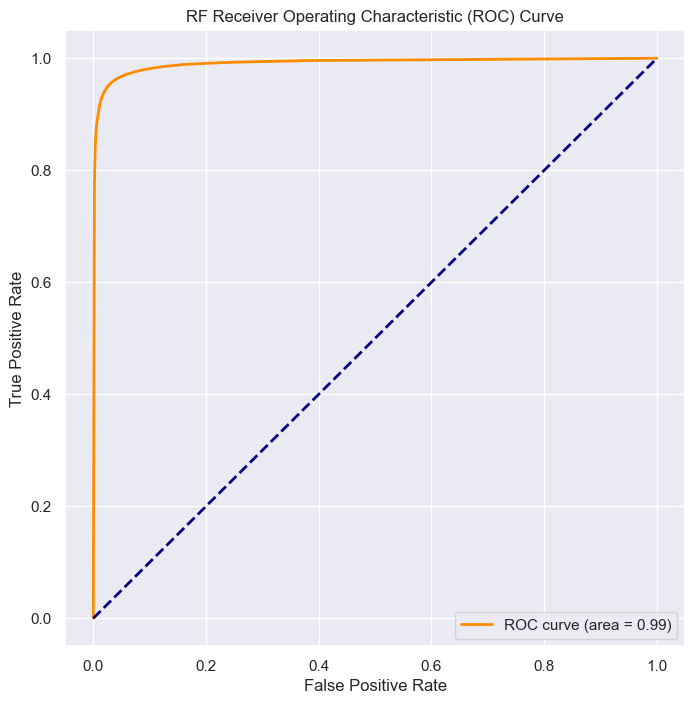

In [123]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Assuming you have a trained model 'clf' and your data 'X' and 'Y'
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Train your classifier (if not already trained)
clf.fit(X_train, Y_train)

# Get predicted probabilities for the positive class
y_probs = clf.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area for each class
fpr, tpr, thresholds = roc_curve(Y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('RF Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [121]:
import xgboost as xgb
# Train XGBoost classifier
clf_xgb = xgb.XGBClassifier()
clf_xgb.fit(X_train, Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

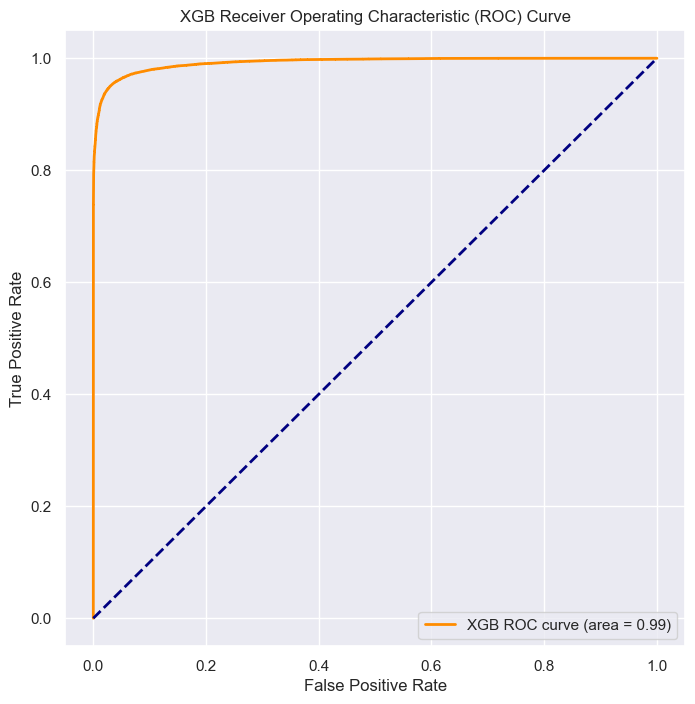

In [122]:
# Get predicted probabilities for the positive class
y_probs_xgb = clf_xgb.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area for XGBoost
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(Y_test, y_probs_xgb)
roc_auc_xgb = auc(fpr_xgb, tpr_xgb)

# Plot ROC curve for XGBoost
plt.figure(figsize=(8, 8))
plt.plot(fpr_xgb, tpr_xgb, color='darkorange', lw=2, label='XGB ROC curve (area = {:.2f})'.format(roc_auc_xgb))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGB Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [67]:
# Assuming 'type' is the target variable, adjust if necessary
target_variable = 'type'

# Step 1: Get all column names from your DataFrame
all_columns = df.columns

# Step 2: Ensure 'type' is in the list and find its index
if target_variable in all_columns:
    target_index = all_columns.get_loc(target_variable)

# Step 3: Create feature_names by excluding the target variable
feature_names = all_columns[all_columns != target_variable]

# Now you can use feature_names for plotting or analysis
print("All columns:", all_columns)
print("Feature names (excluding target variable):", feature_names)


All columns: Index(['url', 'type', 'abnormal_url', 'google_index', 'count.', 'count-www',
       'count@', 'count_dir', 'count_embed_domain', 'sus_url', 'short_url',
       'count_https', 'count_http', 'count%', 'count?', 'count-', 'count=',
       'url_length', 'hostname_length', 'fd_length', 'tld_length',
       'count_digits', 'count_letters', 'type_code', 'features'],
      dtype='object')
Feature names (excluding target variable): Index(['url', 'abnormal_url', 'google_index', 'count.', 'count-www', 'count@',
       'count_dir', 'count_embed_domain', 'sus_url', 'short_url',
       'count_https', 'count_http', 'count%', 'count?', 'count-', 'count=',
       'url_length', 'hostname_length', 'fd_length', 'tld_length',
       'count_digits', 'count_letters', 'type_code', 'features'],
      dtype='object')


In [80]:
features = df.columns
feature_names = features[:-1]  # Exclude the target variable column 'type'

In [81]:
print("Length of feature_importances:", len(feature_importances))
print("Length of feature_names:", len(feature_names))


Length of feature_importances: 20
Length of feature_names: 24


In [109]:
# Train Random Forest classifier
clf = RandomForestClassifier()
clf.fit(X_train, Y_train)

RandomForestClassifier()

In [113]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Use StratifiedKFold for cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation and print the results
cross_val_results = cross_val_score(clf, X_train, Y_train, cv=cv, scoring='accuracy')
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {cross_val_results.mean()}')


Cross-Validation Results: [0.96053352 0.96031746 0.96115288 0.961426   0.96158444]
Mean Accuracy: 0.961002860629859


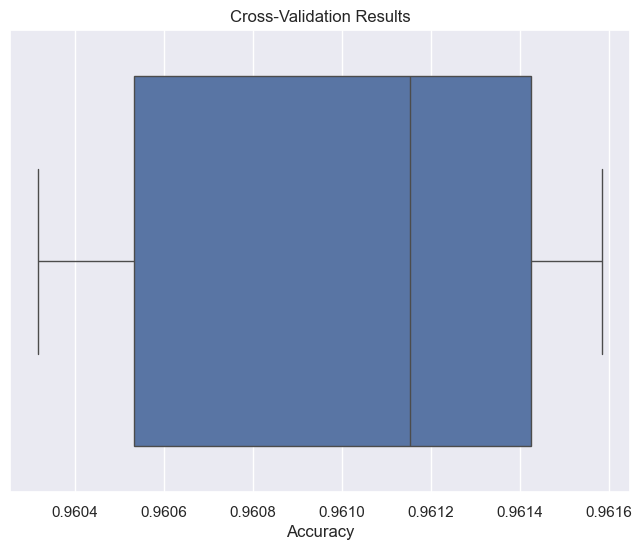

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming cross_val_results is a list of accuracy values from cross-validation
plt.figure(figsize=(8, 6))
sns.boxplot(x=cross_val_results)
plt.title('Cross-Validation Results')
plt.xlabel('Accuracy')
plt.show()


In [116]:

X_train.shape , Y_train.shape
((355220, 20), (355220,))
X_test.shape , Y_test.shape
((88805, 20), (88805,))
X_train

array([[ 0,  1,  0, ..., 40,  6, -1],
       [ 0,  3,  1, ..., 34, 11, -1],
       [ 0,  1,  0, ..., 37,  8, -1],
       ...,
       [ 0,  1,  0, ..., 16,  0, -1],
       [ 0,  1,  0, ..., 13,  0, -1],
       [ 0,  2,  0, ..., 26, 22, -1]])

In [117]:
X.shape

(433911, 20)

In [118]:
Y.shape

(433911,)

In [119]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
print(scaler.fit(X))
X = scaler.transform(X)

StandardScaler()


In [107]:
from sklearn.metrics import accuracy_score , precision_recall_fscore_support, classification_report

def result(y_pred , y_test):
    accuracy = accuracy_score(y_test, y_pred) * 100
    print(accuracy)
    
    precision , recall, f1_score, support = precision_recall_fscore_support(y_test, y_pred, average="weighted")
    
    res = {
        "Accuracy": accuracy,
        "Precision" : precision,
        "Recall" : recall,
        "F1-Score" : f1_score,
        "Support" : support
    }
    
    print(classification_report(y_test, y_pred ,target_names=['malicious','benign']))
    
    
    
    return res

In [108]:
from sklearn.metrics import confusion_matrix

def create_confusion_metric(y_pred , y_test):
    cm = confusion_matrix(y_test, y_pred)
    cm_df = pd.DataFrame(cm,
                     index = ['malicious', 'benign'], 
                     columns = ['malicious', 'benign'])
    
    plt.figure(figsize=(8,6))
    sns.heatmap(cm_df, annot=True,fmt=".1f")
    plt.title('Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    
    plt.show()

In [109]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from termcolor import colored
# print(colored('Hello', 'red', attrs=['bold']))


# Define classification models
models = {
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
}

Training Random Forest...


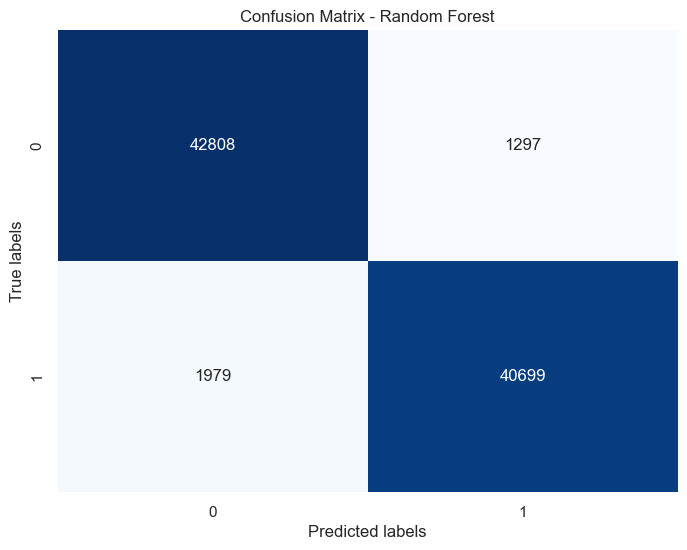


Random Forest classifier: Training Results
Training accuracy: 0.9846713604203636
Training precision: 0.9846867073366579
Training recall: 0.9846713604203636
Training F1 score: 0.9846703762454875

Random Forest classifier: Testing Results
Testing accuracy: 0.9622506712
Testing Precision: 0.9623552155
Testing Recall: 0.9622506712
Testing F1 score: 0.9622434575

Training XGBoost...


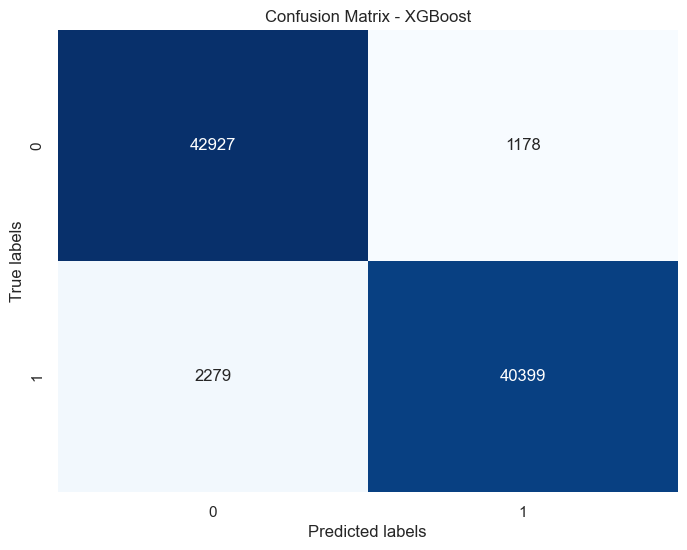


XGBoost classifier: Training Results
Training accuracy: 0.9616827222235026
Training precision: 0.9619515581644306
Training recall: 0.9616827222235026
Training F1 score: 0.9616678585583727

XGBoost classifier: Testing Results
Testing accuracy: 0.9601650093
Testing Precision: 0.9604451429
Testing Recall: 0.9601650093
Testing F1 score: 0.9601502750



In [110]:
# Train and evaluate each model
for model_name, model in models.items():
    print(colored(f"Training {model_name}...", 'red', attrs=['bold']))
#     print(f"Training {model_name}...")
    
    # Fit model to training data
    model.fit(X_train, Y_train)
    
    # Make predictions on training and testing data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate performance metrics for Train Data
    train_accuracy = accuracy_score(Y_train, y_train_pred)
    train_precision = precision_score(Y_train, y_train_pred, average='weighted')
    train_recall = recall_score(Y_train, y_train_pred, average='weighted')
    train_f1 = f1_score(Y_train, y_train_pred, average='weighted')
#     train_roc_auc = roc_auc_score(Y_train, model.predict_proba(X_train), multi_class='ovr')
    
    
    # Calculate performance metrics for Test Data
    accuracy = accuracy_score(Y_test, y_test_pred)
    precision = precision_score(Y_test, y_test_pred, average='weighted')
    recall = recall_score(Y_test, y_test_pred, average='weighted')
    f1 = f1_score(Y_test, y_test_pred, average='weighted')
#     test_roc_auc = roc_auc_score(Y_test, model.predict_proba(X_test), multi_class='ovr')
    
    # Generate confusion matrix
    cm = confusion_matrix(Y_test, y_test_pred)
    plt.figure(figsize=(8,6))
#     sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

    # Print results Train Data
#     print(f"{model_name} classifier: Training Results")
    print(colored(f"{model_name} classifier: Training Results", 'green', attrs=['bold']))
    print("Training accuracy:", train_accuracy)
    print("Training precision:", train_precision)
    print("Training recall:", train_recall)
    print("Training F1 score:", train_f1)
    print("="*50)
    print(""*5)
    
    # Print results Test Data
#     print(f"{model_name} classifier: Testing Results")
    print(colored(f"{model_name} classifier: Testing Results", 'green', attrs=['bold']))
    print(f"Testing accuracy: {accuracy:.10f}")
    print(f"Testing Precision: {precision:.10f}")
    print(f"Testing Recall: {recall:.10f}")
    print(f"Testing F1 score: {f1:.10f}")
    print("="*50)
    print(""*5)

In [111]:
print(X_test.shape, Y_test.shape)

(86783, 20) (86783,)


In [112]:
# Random Forest
rf_param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}


# XGBoost
xgb_param_grid = {
    'learning_rate': [0.01, 0.1, 1],
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.5, 0.8, 1.0],
    'colsample_bytree': [0.5, 0.8, 1.0]
}


In [113]:
param_grid = {
    "Random Forest": rf_param_grid,
    "XGBoost": xgb_param_grid,
}

In [114]:
# Set up the hyperparameters to be tuned for each model
param_grid = {
    "Random Forest": {
        "n_estimators": [100, 200, 300],
        "max_depth": [None, 5, 10]
    },

    "XGBoost": {
        "n_estimators": [100, 200, 300],
        "max_depth": [None, 5, 10],
        "learning_rate": [0.01, 0.1, 0.5]
    }
}

Tuning hyperparameters for Random Forest...
Best hyperparameters: {'max_depth': None, 'n_estimators': 200}
Training accuracy: 0.9614292164834414
Validation accuracy: 0.9626309300208566


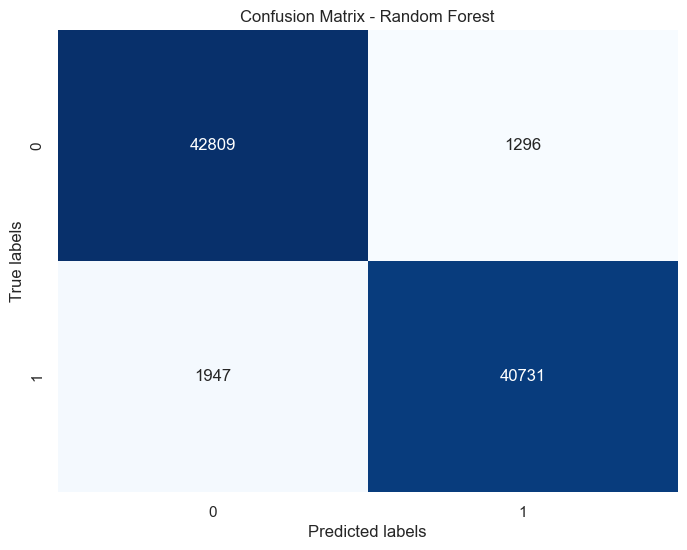


Tuning hyperparameters for XGBoost...
Best hyperparameters: {'learning_rate': 0.5, 'max_depth': 10, 'n_estimators': 100}
Training accuracy: 0.9628696079703977
Validation accuracy: 0.9630342348155745


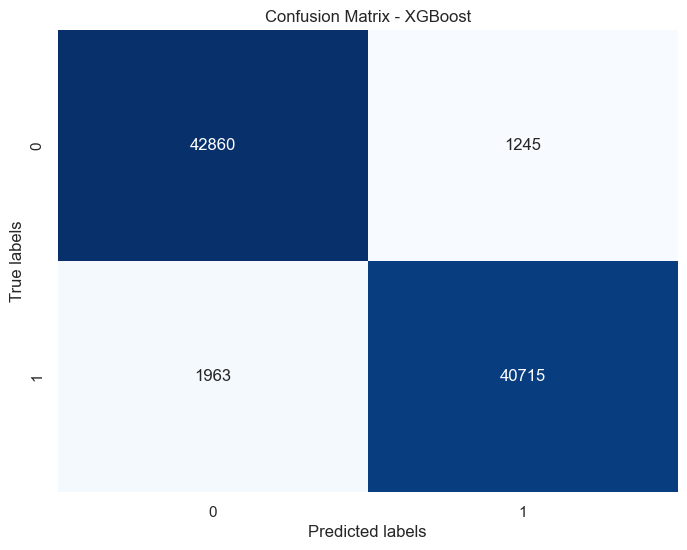

In [115]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, make_scorer



# Set up the cross-validation method
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Set up the scoring metric
scoring_metric = make_scorer(accuracy_score)



# Perform the grid search for each model and print the best hyperparameters
for model_name, model in models.items():
    
    print(colored(f"Tuning hyperparameters for {model_name}...", 'red', attrs=['bold']))
    
    clf = GridSearchCV(model, param_grid[model_name], scoring=scoring_metric, cv=cv)
    
    clf.fit(X_train, Y_train)
    
    print(f"Best hyperparameters: {clf.best_params_}")
    print(f"Training accuracy: {clf.best_score_}")
    print(f"Validation accuracy: {accuracy_score(Y_test, clf.predict(X_test))}")
    
    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    
    # Calculate performance metrics for Train Data
    train_accuracy = accuracy_score(Y_train, y_train_pred)
    train_precision = precision_score(Y_train, y_train_pred, average='weighted')
    train_recall = recall_score(Y_train, y_train_pred, average='weighted')
    train_f1 = f1_score(Y_train, y_train_pred, average='weighted')
#     train_roc_auc = roc_auc_score(Y_train, model.predict_proba(X_train), multi_class='ovr')
    
    
    # Calculate performance metrics for Test Data
    accuracy = accuracy_score(Y_test, y_test_pred)
    precision = precision_score(Y_test, y_test_pred, average='weighted')
    recall = recall_score(Y_test, y_test_pred, average='weighted')
    f1 = f1_score(Y_test, y_test_pred, average='weighted')
#     test_roc_auc = roc_auc_score(Y_test, model.predict_proba(X_test), multi_class='ovr')
    
    # Generate confusion matrix
    cm = confusion_matrix(Y_test, y_test_pred)
    plt.figure(figsize=(8,6))
#     sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()
    

    print(""*5)

In [127]:
import pickle
import numpy as np

# Assume you have the main function defined as before
def main(url):
    status = []
    
    status.append(abnormal_url(url))
    status.append(count_dot(url))
    status.append(count_www(url))
    status.append(count_atrate(url))
    status.append(no_of_dir(url))
    status.append(no_of_embed(url))
    
    status.append(shortening_service(url))
    status.append(count_https(url))
    status.append(count_http(url))
    
    status.append(count_per(url))
    status.append(count_ques(url))
    status.append(count_hyphen(url))
    status.append(count_equal(url))
    
    status.append(url_length(url))
    status.append(hostname_length(url))
    status.append(suspicious_words(url))
    status.append(digit_count(url))
    status.append(letter_count(url))
    status.append(fd_length(url))
    tld = get_tld(url,fail_silently=True)
      
    status.append(tld_length(tld))
    
    return status

scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train)

# Create and train the RandomForestClassifier
clf = RandomForestClassifier(class_weight='balanced')
clf.fit(X_train_scaled, Y_train)

# Save the trained model using pickle
with open('model.pkl', 'wb') as model_file:
    pickle.dump(clf, model_file)
    
# Load the trained model
loaded_model = pickle.load(open('model.pkl', 'rb'))

# Assume you have a function to preprocess the input for prediction
def preprocess_input(url):
    features = main(url)
    return np.array(features).reshape((1, -1))

# Function to get predictions using the loaded model
def get_prediction_from_url(model, test_url):
    features_test = preprocess_input(test_url)
    pred = model.predict(features_test)
    if int(pred[0]) == 0:
        return "BENIGN"
    elif int(pred[0]) == 1:
        return "MALICIOUS"

In [131]:
# Example usage with debugging prints
urls = ['absoluteastronomy.com/topics/James_Tate_(writer)', 'http://earth-sure.com/green-technology/subterranean-solar-subsolar/14-subsolar-renewable-energy']
for url in urls:
    # Preprocess the input
    features_test = preprocess_input(url)
    
    # Get the final prediction
    result = get_prediction_from_url(loaded_model, url)
    print(f"Prediction: {result}")


absoluteastronomy.com/topics/James_Tate_(writer)
absoluteastronomy.com/topics/James_Tate_(writer)
Prediction: BENIGN
/green-technology/subterranean-solar-subsolar/14-subsolar-renewable-energy
/green-technology/subterranean-solar-subsolar/14-subsolar-renewable-energy
Prediction: MALICIOUS


In [132]:
clf = RandomForestClassifier()
clf.fit(X_train, Y_train)

RandomForestClassifier()

In [133]:
import pickle
pickle.dump(clf, open('model.pkl', 'wb'))